#  <center><span style="color:#ff4d4d;text-decoration:underline;">**DATA ANALYSIS** </span></center>

<hr style="border:2px solid gray"> </hr>

#  <center><span style="color:black;">**Olympics Dataset - 120 years of data<br><br>(From Athens 1896 to Rio 2016)** </span></center>
### <center>For the  Data Source [Click here](https://www.kaggle.com/heesoo37/120-years-of-olympic-history-athletes-and-results)</center>

<hr style="border:2px solid gray"> </hr>

### <center><span style="color:black;">**NOTE** </span></center>

- ### For most of the querying purposes I have used **pandasql** instead of directly using **pandas**. This is mainly done to improve my sql skills. All that have been done with pandasql can be easily done with pandas itself.


#  <center><span style="color:#0033cc;">**CONTENTS**<br>(Click the underlined text to go that specific section of the notebook) </span></center>

 



1. <span style="color:#0033cc;font-size: 18px;">[DATA IMPORTING AND CLEANING](#sec3)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Importing necessary libraries](#sec3.1)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Importing the datasets](#sec3.2)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[noc_regions dataset](#sec3.3)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Reason for merging](#sec3.4)</span>
   

2. <span style="color:#0033cc;font-size: 18px;">[FINDINGS ON THE DATA](#sec5)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Season and Country wise player count over the years](#sec5.1)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Country wise participation count and year](#sec5.2)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Country wise Medal count](#sec5.3)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Sport each countries are best at](#sec5.4)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Top players in each Sport](#sec5.5)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Player with most medals regardless of Sport and Nation](#sec5.6)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Nation wise best players](#sec5.7)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Countries with no medals](#sec5.8)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[FIndings based on Athletes](#sec5.9)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Descriptive Stats and other important findings](#sec5.10)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[Win/Loss Percent](#sec5.11)</span>
   1. <span style="color:#0033cc;font-size: 18px;">[players who have played different games](#sec5.12)</span>
   
   
3. <span style="color:#0033cc;font-size: 18px;">[FINAL SUMMARY](#sec6)</span>


4. <span style="color:#0033cc;font-size: 18px;">[APPENDIX](#sec7)</span>


<hr style="border:2px solid gray"> </hr>

<a id='sec3'></a>
# <center><span style="color:blue">*1) DATA IMPORTING AND CLEANING*</span></center>

<a id='sec3.1'></a>
## A) IMPORTING NECESSARY LIBRARIES

- I have used plotly for showing choloropeth based maps
- So far pandas and pandasql are the most widely used ones in this project

In [1]:
# importing the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from pandasql import sqldf
import json
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.express as px
import seaborn as sns
#from bubbly.bubbly import bubbleplot 
#from __future__ import division

# setting the default values for graph
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (20, 10),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'medium',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)

class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

<a id='sec3.2'></a>
## B) Importing the datasets

- The noc_regions dataset is also used for the analysis and the reason for that will be explained later in this prompt.

<a id='sec3.3'></a>    
## C) noc_regions DATASET
- There is a caveat associated with this dataset and I had found that only during later stages
- The NOC for Singapore is given as SIG in this dataset whereas in the athlete_events dataset Singapore is represented using the NOC SGP
- I fixed that by adding SGP to the noc_regions dataset


In [2]:
df = pd.read_csv('athlete_events.csv')
regions = pd.read_csv('noc_regions.csv')

### *Reason for adding SGP to noc_regions dataset*

    temp = merged[merged['region'].isnull()]

    temp['Team'].unique()

The above code will give output of

    array(['Singapore', 'June Climene', 'Unknown', 'Rika II', 'Singapore-2', 'Singapore-1'], dtype=object)

Here June Climene, Rika II are boat names from singapore and thus were considered to be team names and Unknown here refers to two players whom have participated in arts games but there were no mention of their of sex, nation anything on the internet. Thus their region were mentioned to be unknown (explicitly)

<a id='sec3.4'></a>
## D) REASON FOR MERGING
- When I queried the Teams, I  found out that it doesn't fully represent the countries of the players  and instead it referred to their Team names. There is a team named "June_Climene" which is a boat name from Singapore. So it is not possible to query the dataset based on the Team.
- Also it is not possible to qurty based on the NOC. This is mainly because some countries have played under different names/NOCs throughout the years.
- For eg : The Country Czech Republic (CZE) is an example. Prior to the foundation of Czechoslovakia after World War I, athletes from Bohemia (BOH) (now part of the present-day Czech Republic) competed in 1900, 1908, and 1912. Czechoslovakia (TCH) participated in 1920–1992, and from 1996 those two were represented by its successor NOC called Czech Republic (CZE) .
- In the noc-regions dataset all the NOCs with their current country name is given.
- So  in-order to effectively query the dataset using the country name it has  become mandatory to merge those two datasets using left join
- After  merging the datasets we can easily find that Singapore is missing from  the country name. The reason and solution to this is already explained.
- In the merged dataset there were two records containing unknown as theie country. Even after searching with the athlete name on the interent I could not find their countries.

In [3]:
merged = pd.merge(df, regions, on='NOC', how='left')
merged.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN


<a id='sec5'></a>

# <center><span style="color:blue">*2) FINDINGS ON THE DATA*</span></center>



<a id='sec5.1'></a>
## A) Season and Country wise player count over the years

-  This following plot was designed in such a way that if player count of a country for a specific year is zero than it will be taken as NaN.

- In simpler words all the zeros are replaced with NaN.

- This is done intentionally to show the if the participation of the players is continuous or not.

- Again in simpler words if you see a line between two points, then that indicates players have appeared in successive years

In [4]:
# Splitting the merged dataset into male athletes and female athletes
male_df = sqldf('Select region, Year, Season, count(sex) as Male_count from merged where Sex = "M" group by region, Year, Season')
female_df = sqldf('Select region, Year, Season, count(sex) as Female_count from merged where Sex = "F" group by region, Year, Season')

In [5]:
# Splitting male athletes and female athletes into seasons
summer_male_df = sqldf('Select * From male_df Where Season = "Summer"')
winter_male_df = sqldf('Select * From male_df Where Season = "Winter"')

summer_female_df = sqldf('Select * From female_df Where Season = "Summer"')
winter_female_df = sqldf('Select * From female_df Where Season = "Winter"')

### *Intercalactic Olympic Games (1906)*

- On exploring the data I found the year 1906 in the list of years, the summer Olympics is hosted. 
- We  all knew that Olympics is conducted once in four years, then how come  an Olympic has been hosted immediately after 2 years from 1904. 
- So on surfing through the web I found that an olympic was actually held on 1906 and it is called  Intercalated Games and only several of the countries have participated. 
- But  keeping in mind that players are not able to prepare themselves for the  next olympics (not enough time for training) this idea was shredded. 
- And  so the International Olympic Committee (IOC) have officially announced  that the medals distributed in 1906 Olympics are no longer recognized. 
- So  it is not appropriate to include those games held in 1906 for counting  the medals and other stats. and that's why I have dropped those games  held in 1906 from the dataset.

In [6]:
intercalated = sqldf("Select * From merged Where Year = 1906")
intercalated.head(5)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,139,"George ""Ioannis"" Abbot",M,NaN,NaN,NaN,Thessalonki-1,GRE,1906 Summer,1906,Summer,Athina,Football,Football Men's Football,Bronze,Greece,None
1,508,Bernhard Abraham,M,NaN,NaN,NaN,Germany,GER,1906 Summer,1906,Summer,Athina,Gymnastics,Gymnastics Men's Team All-Around,None,Germany,None
2,520,Sidney Solomon Abrahams,M,21.0,NaN,NaN,Great Britain,GBR,1906 Summer,1906,Summer,Athina,Athletics,Athletics Men's 100 metres,None,UK,None
3,520,Sidney Solomon Abrahams,M,21.0,NaN,NaN,Great Britain,GBR,1906 Summer,1906,Summer,Athina,Athletics,Athletics Men's Long Jump,None,UK,None
4,1208,Ioannis Agrimis,M,NaN,NaN,NaN,"Large boat, Central Naval Prep School ""Poros""-1",GRE,1906 Summer,1906,Summer,Athina,Rowing,Rowing Men's 17-Man Naval Rowing Boats,Gold,Greece,None


In [7]:
#Initial variables for plotting the player count

# summer olypmic year
summerxbarMain= [ ]
year1 = 1896
for i in range(0,31):
    summerxbarMain.append(year1)
    year1 = year1 + 4
summerxbarMain.remove(1940)
summerxbarMain.remove(1944)
summerxbarMain.remove(1916)

#winter olympic year
winterXbarMain = [1924, 1928, 1932,1936,1948,1952,1956,1960,1964,1968,1972,1976,1980,1984,1988,1992,1994,1998,2002,2006,2010,2014,2018]

#country names
summer_countryNames = list(set(summer_male_df['region'].unique().tolist()) | set(summer_female_df['region'].unique().tolist()))
winter_countryNames = list(set(winter_male_df['region'].unique().tolist()) | set(winter_female_df['region'].unique().tolist()))

### Since the International Olympic Committee no longer recognises this 1906 Olympics I have removed that for the rest of the analysis

> Below plotting function removes the player count from 1906

In [8]:
# setting the default values for graph
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (20, 10),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'medium',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)

# Plotting the player count over the years
def player_count(maleData, femaleData, season_year, season_country, season):
    xbarMain = season_year
    countq=0
    for q in season_country:
        summa = maleData[maleData['region'] == q]
        xbar = summa['Year'].tolist()
        bars1 = summa['Male_count'].tolist()
        if 1906 in xbar:
            remove1906 = xbar.index(1906)
            bars1.pop(remove1906)
            xbar.pop(remove1906)
        for i in enumerate(xbarMain):
            if i[1] not in xbar:
                bars1.insert(i[0], np.nan)

        summa1 = femaleData[femaleData['region'] == q]
        xbar1 = summa1['Year'].tolist()
        bars2 = summa1['Female_count'].tolist()
        if 1906 in xbar1:
            remove1906 = xbar1.index(1906)
            bars2.pop(remove1906)
            xbar1.pop(remove1906)
        for i in enumerate(xbarMain):
            if i[1] not in xbar1:
                bars2.insert(i[0], np.nan)

        xbarMainStr = [str(x) for x in xbarMain]
        
        plt.plot(xbarMainStr, bars1, marker='o',markersize = 8, color='blue', linewidth = 2.0,label = 'Male')
        plt.plot(xbarMainStr, bars2, marker='^',markersize = 8, color='red', linewidth = 2.0,label = 'Female')
        plt.xticks( np.arange(28), xbarMainStr)
        plt.xlabel('Year')
        plt.ylabel('Athlete count')
        
        plt.title('Country : ' + q + ' -- Season : ' + season)
        plt.legend()

        plt.show()
        countq = countq+1
        print(countq)
        xbar = []
        bars1= []
        bars2 = []

### *This below plot was designed in such a way that if player coun of a country for a specific year is zero than it will be taken as NaN. In simpler words all the zeros are replaced with NaN. This is done intentionally to show the if the participation of the players is continuous or not. Again in simpler words if you see a line between two points, then that indicates players have appeared in successive years*

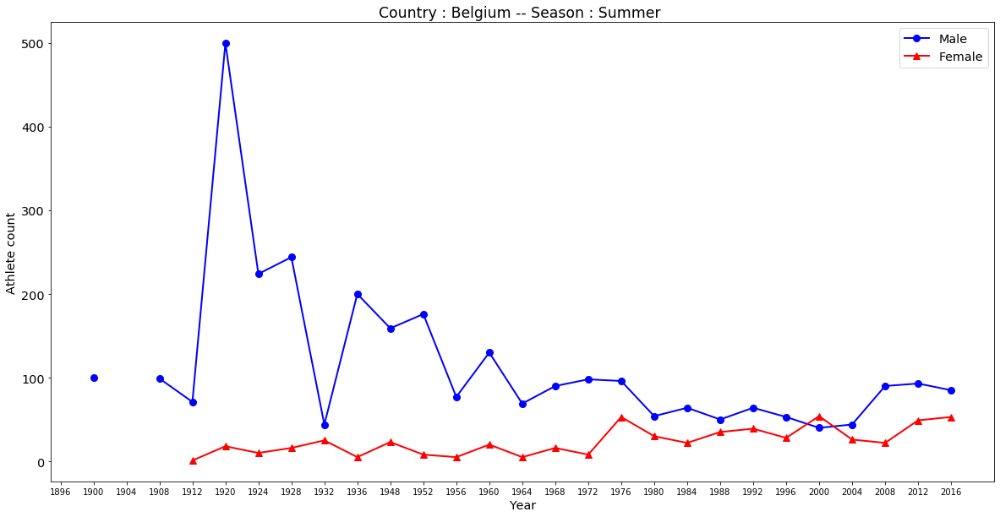

1


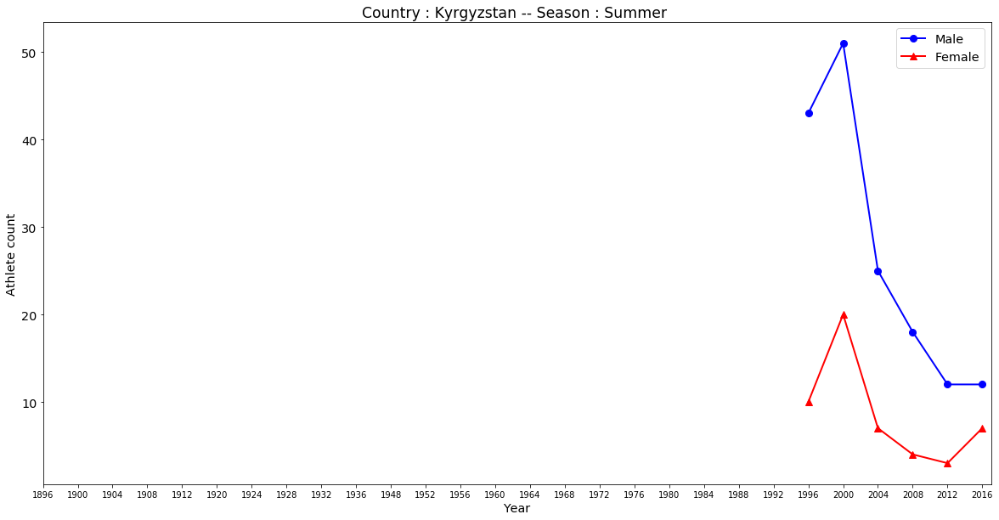

2


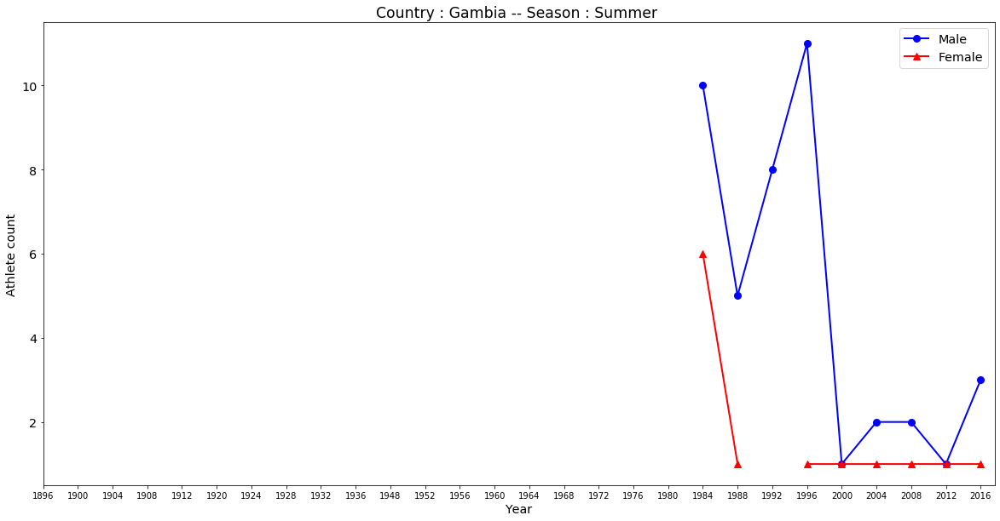

3


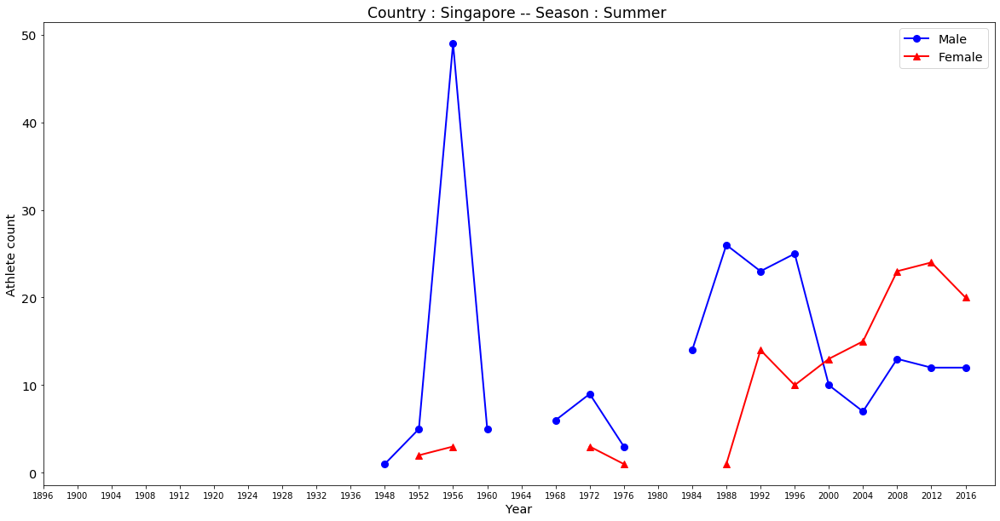

4


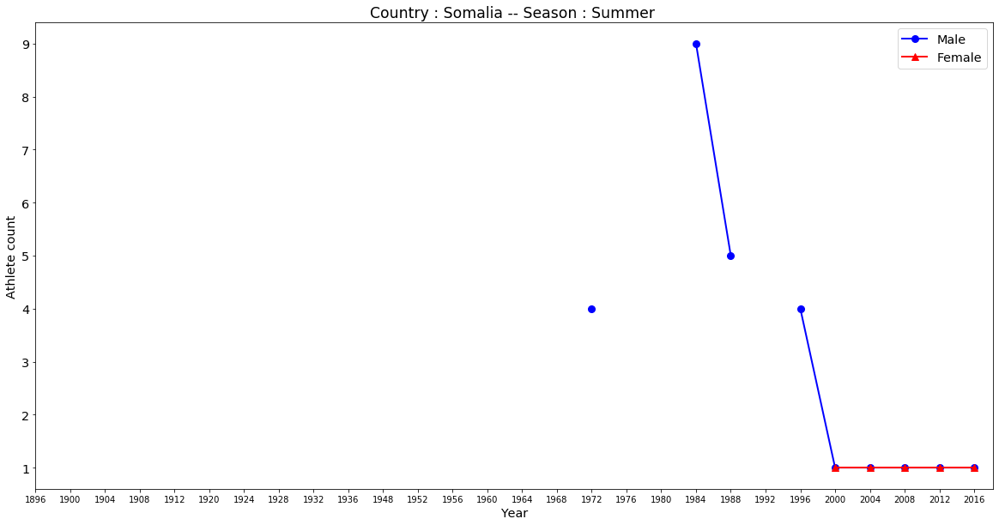

5


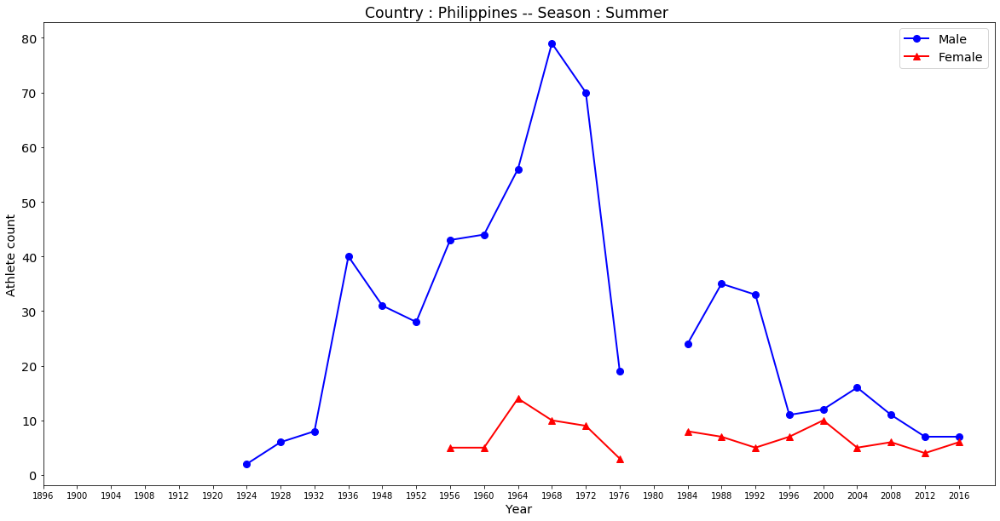

6


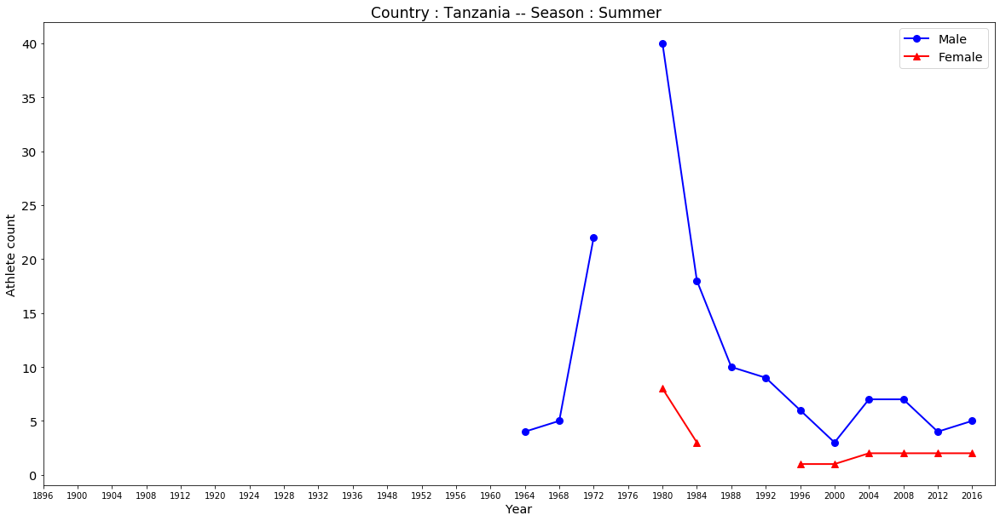

7


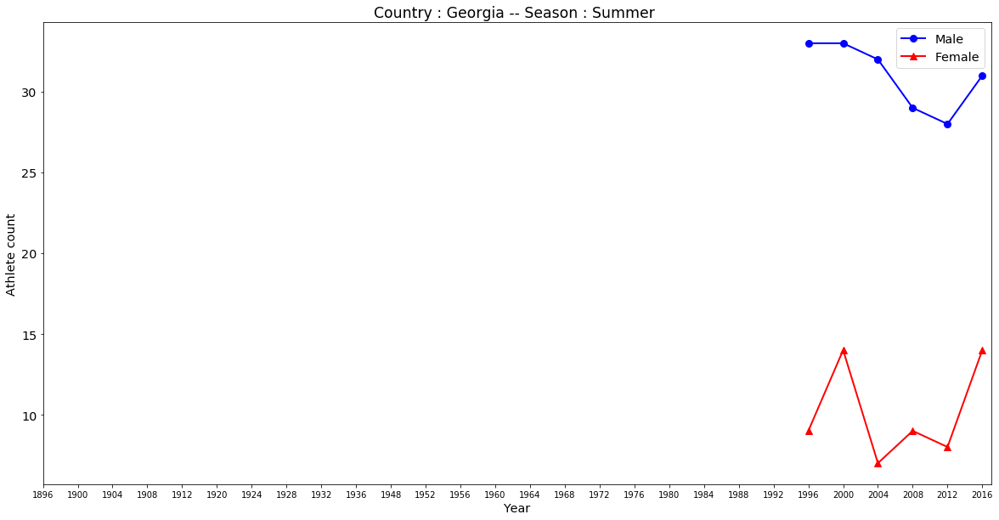

8


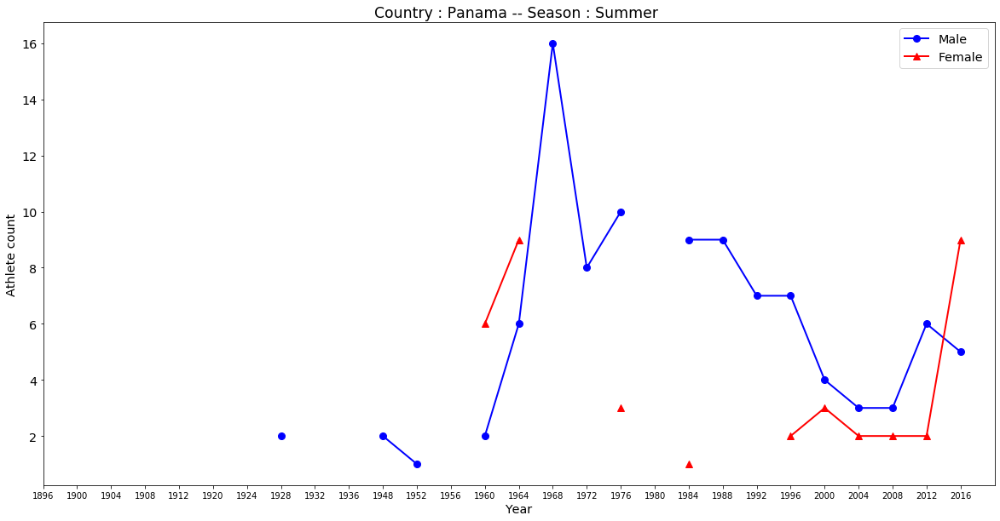

9


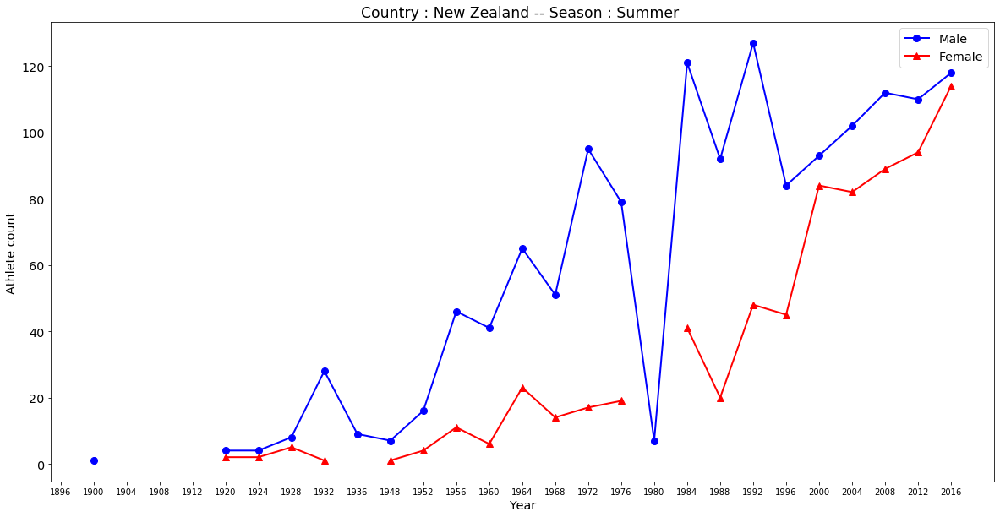

10


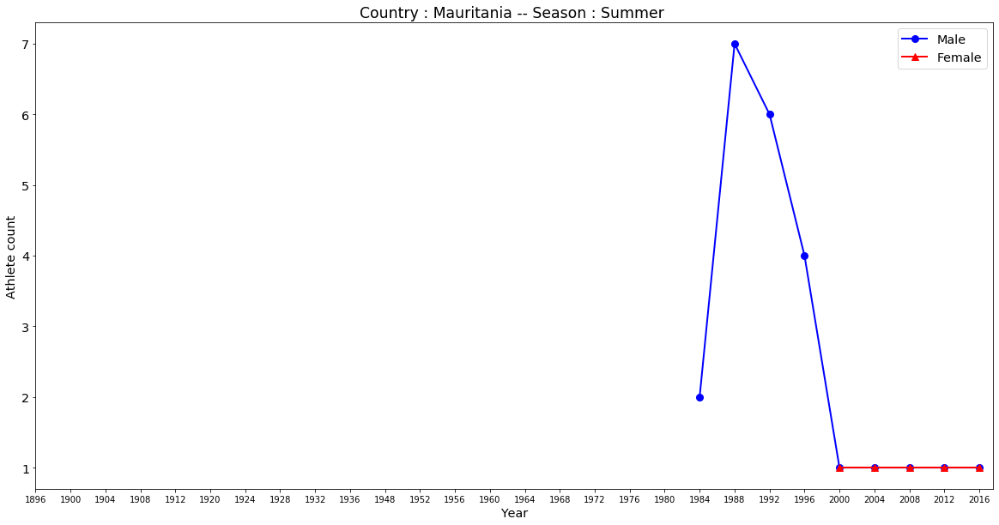

11


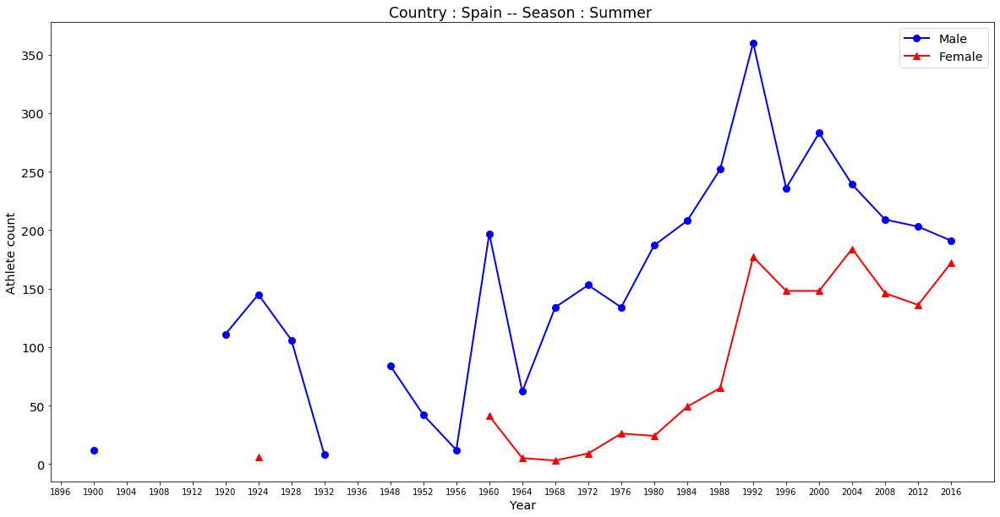

12


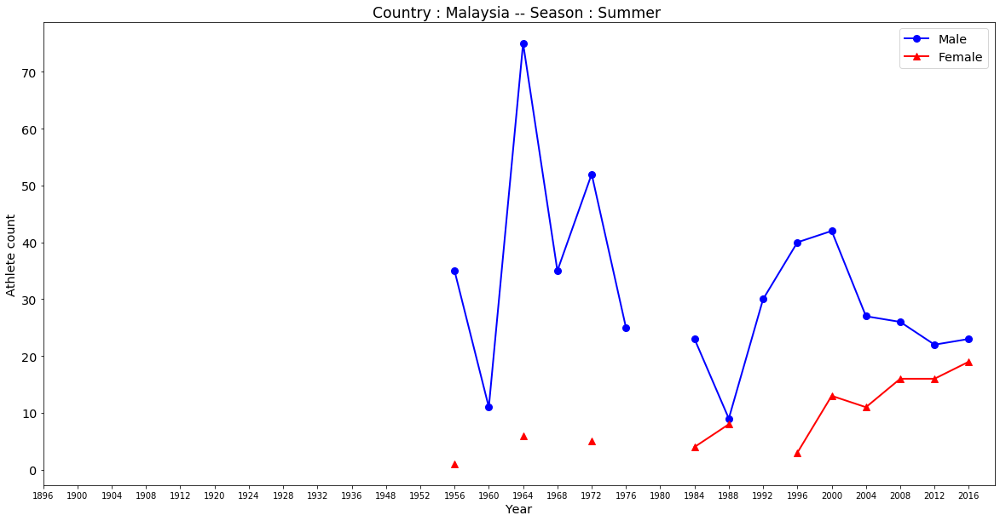

13


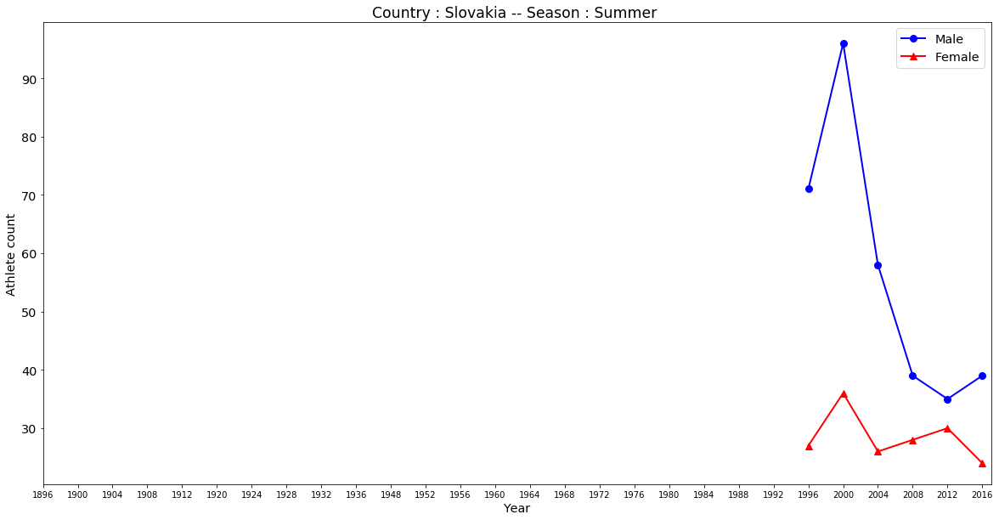

14


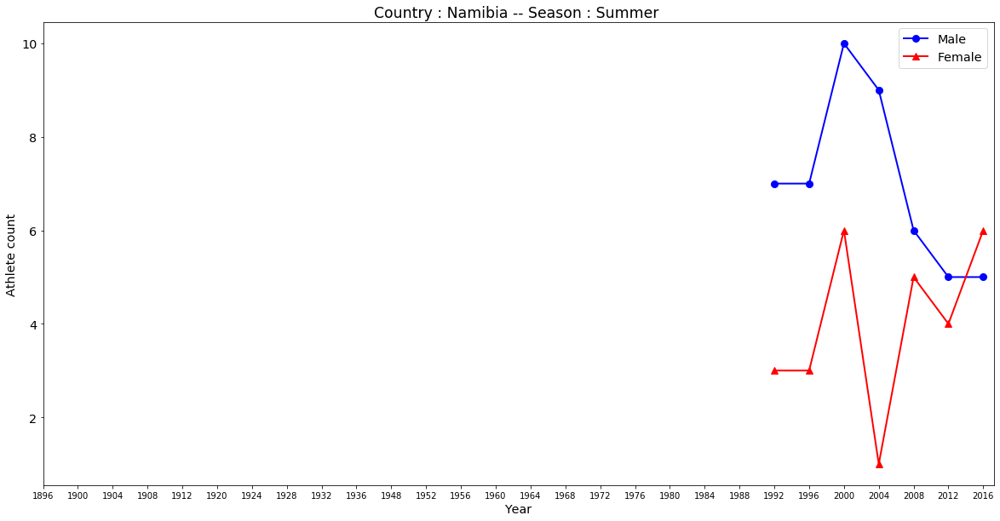

15


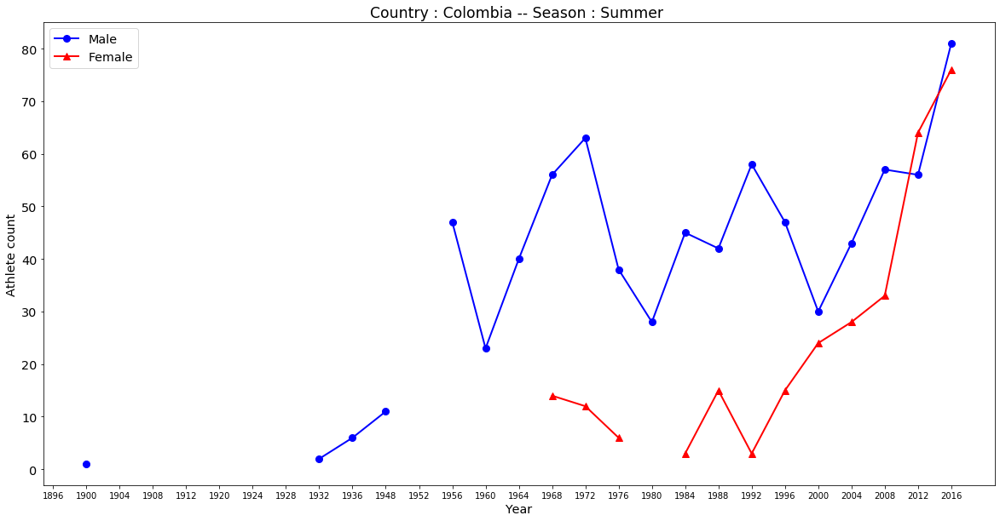

16


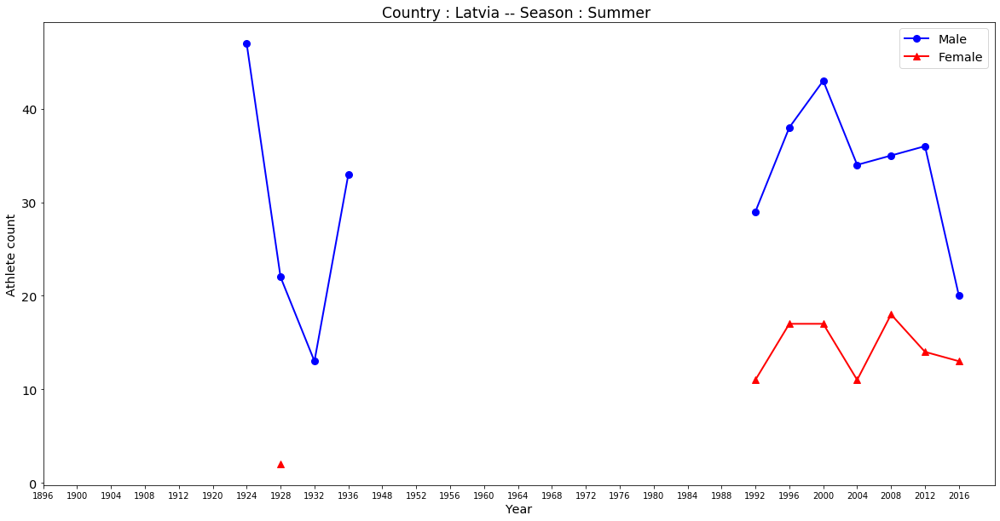

17


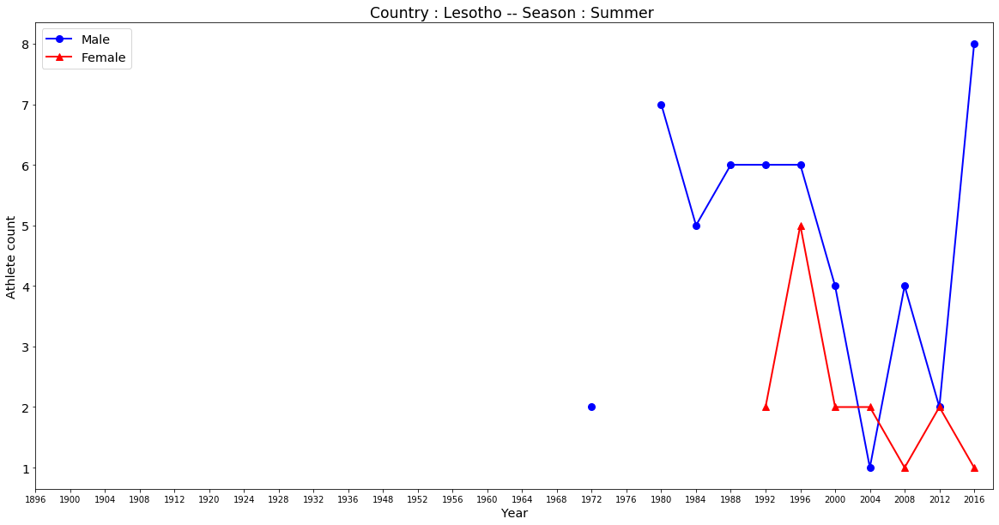

18


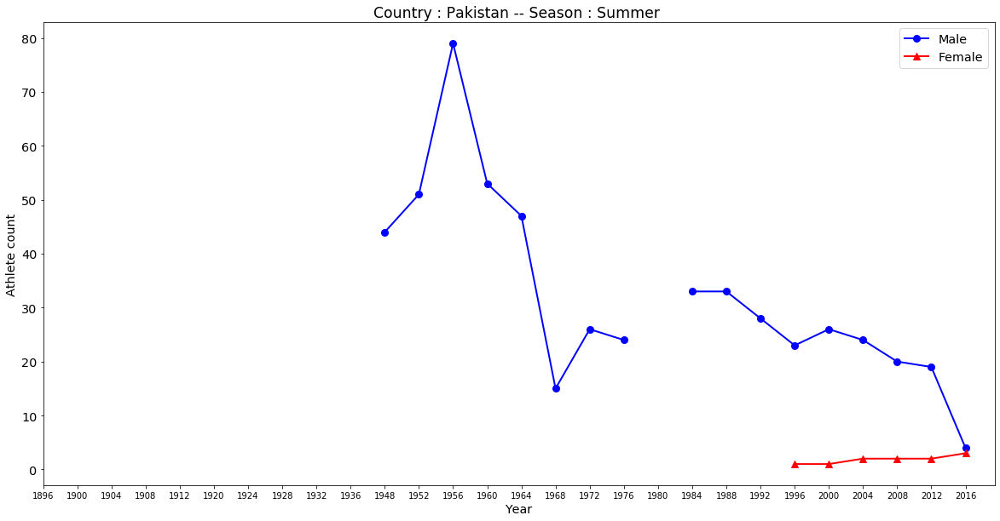

19


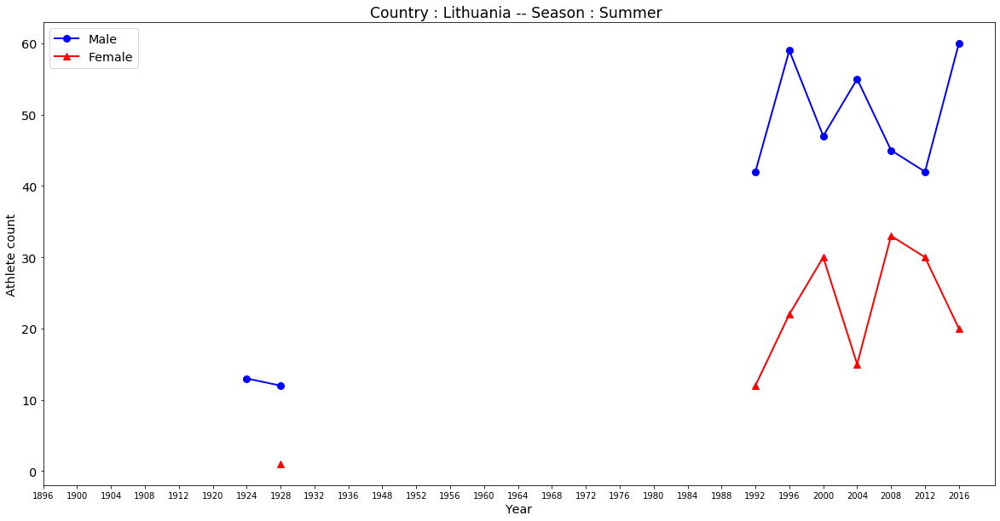

20


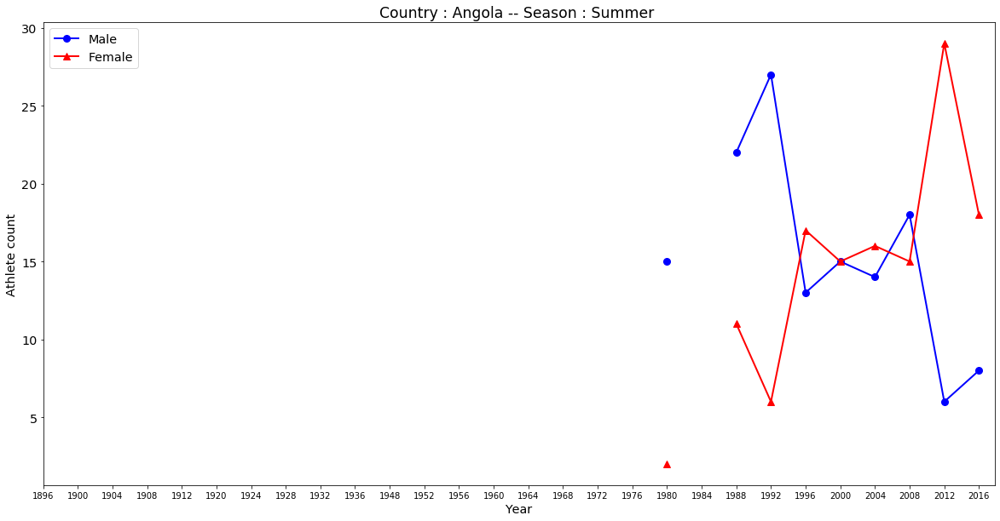

21


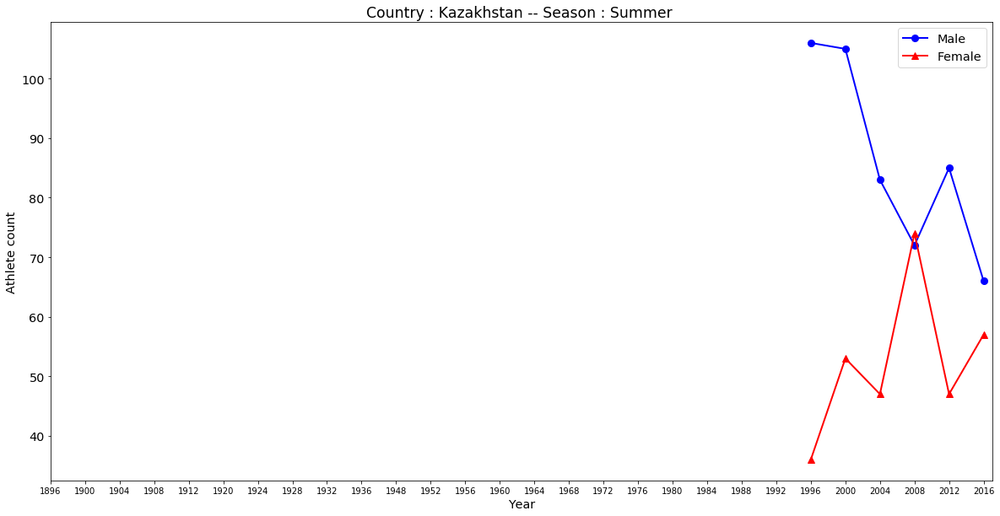

22


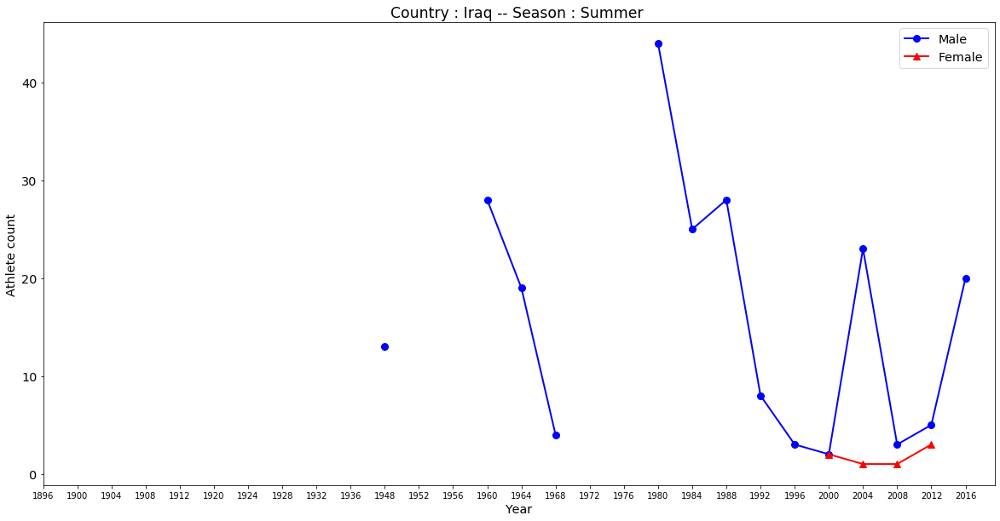

23


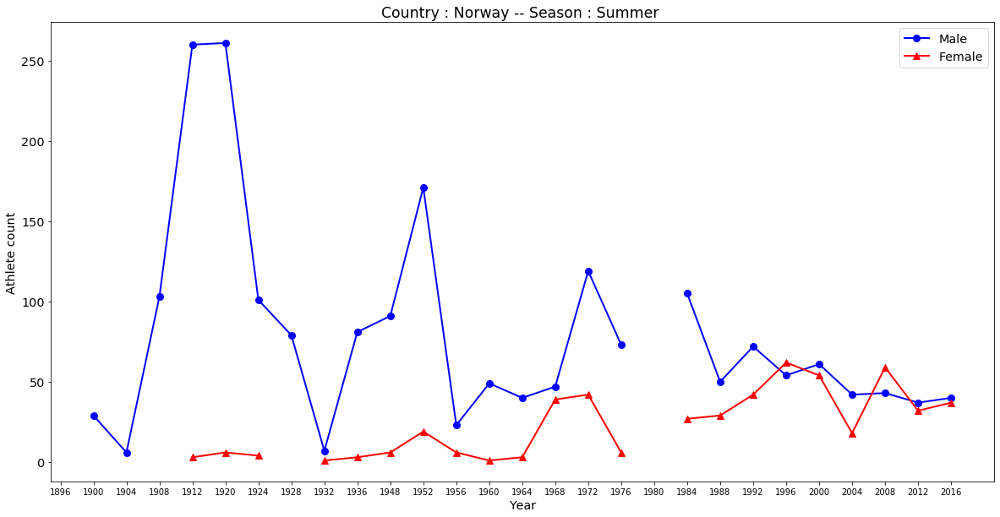

24


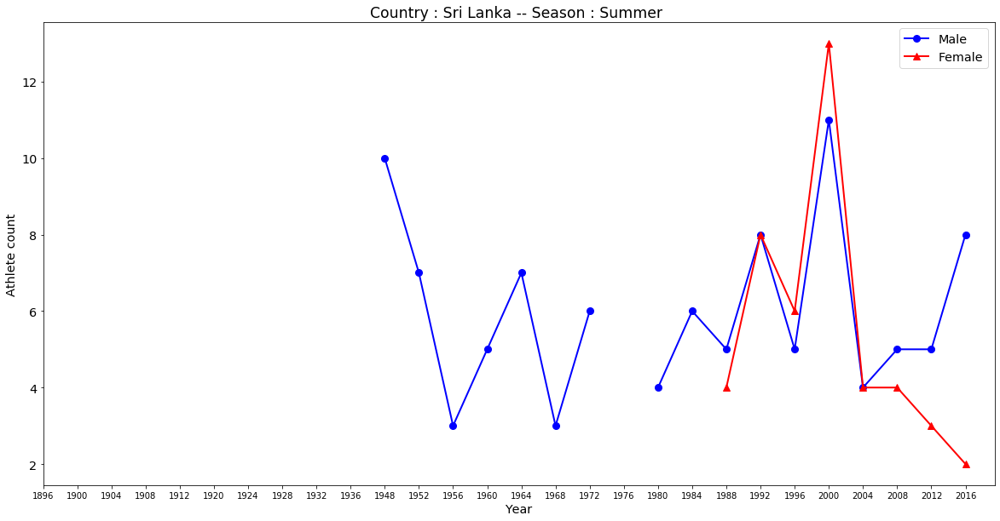

25


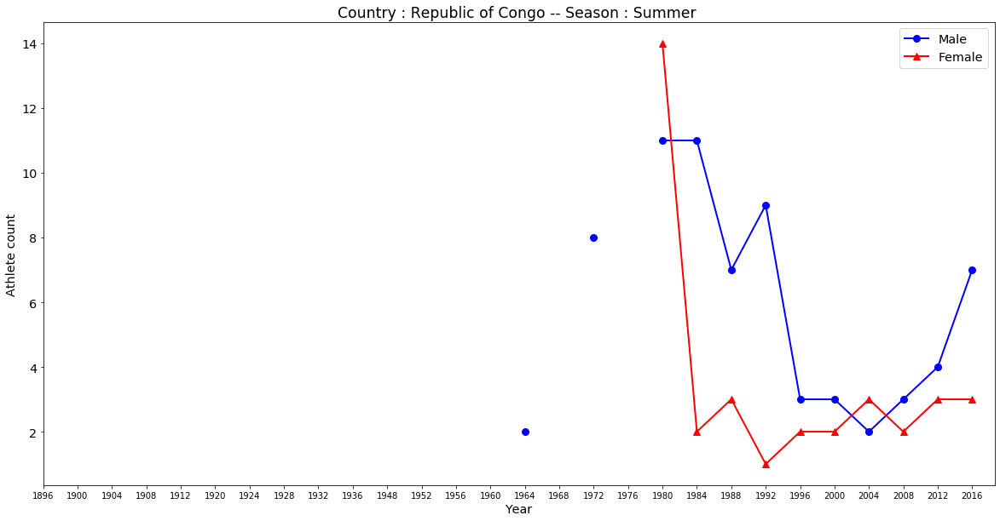

26


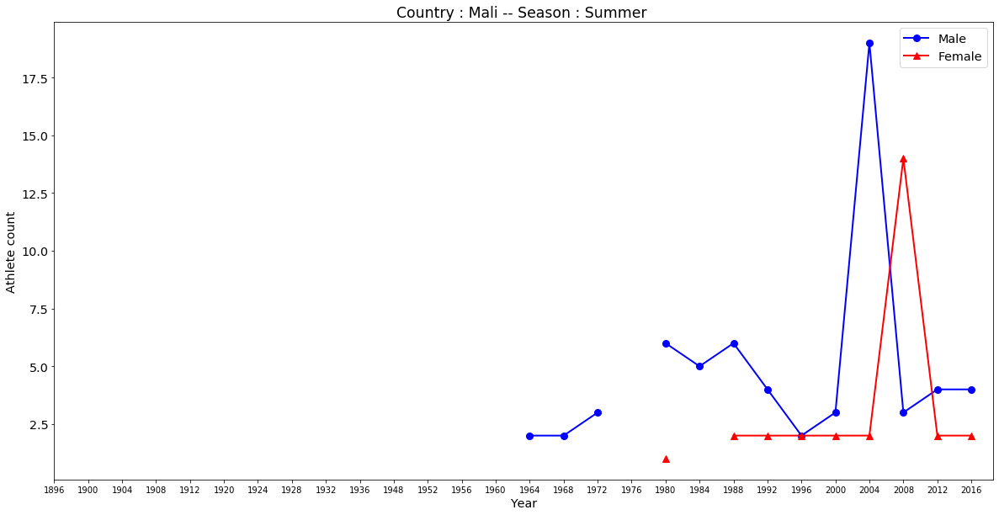

27


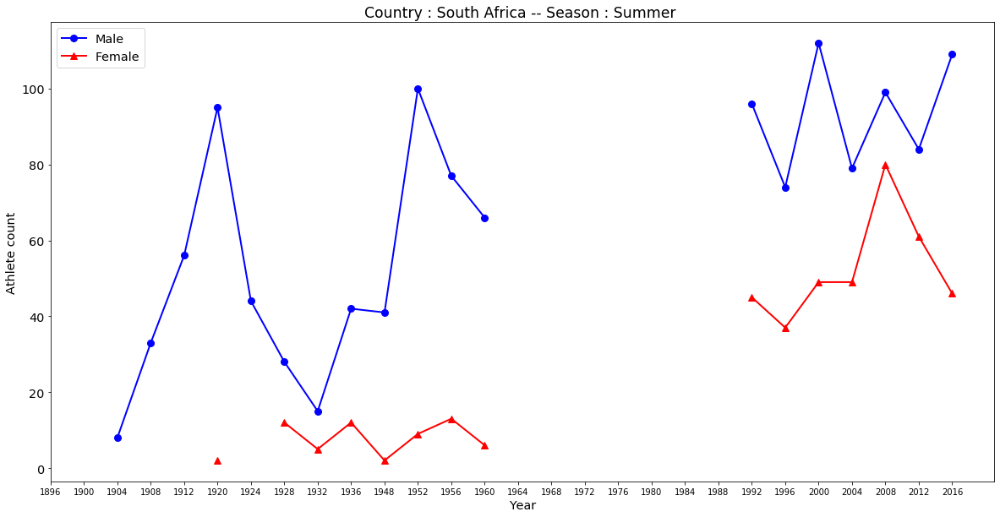

28


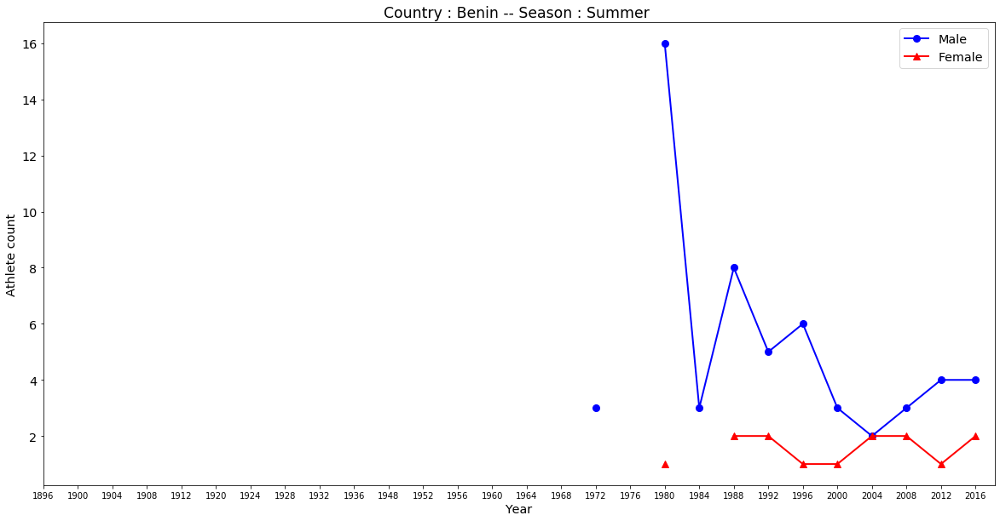

29


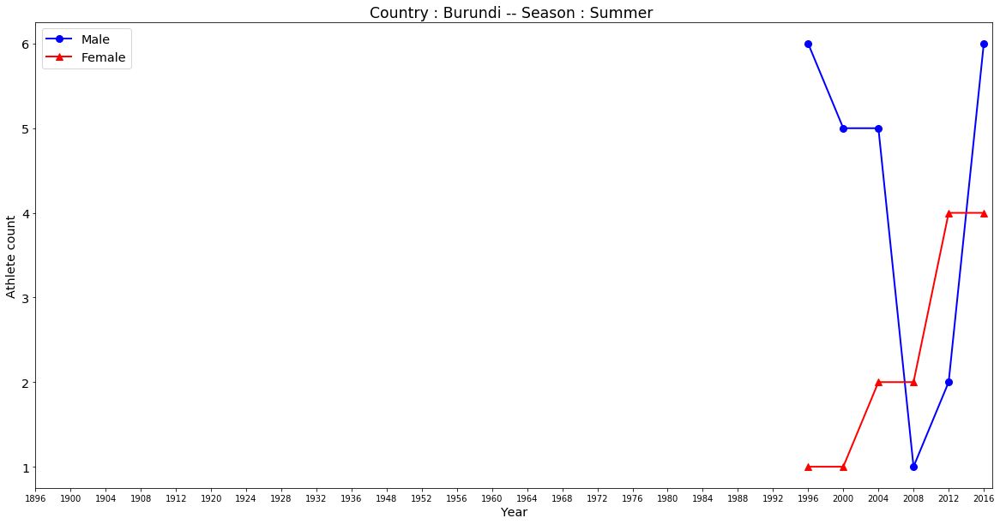

30


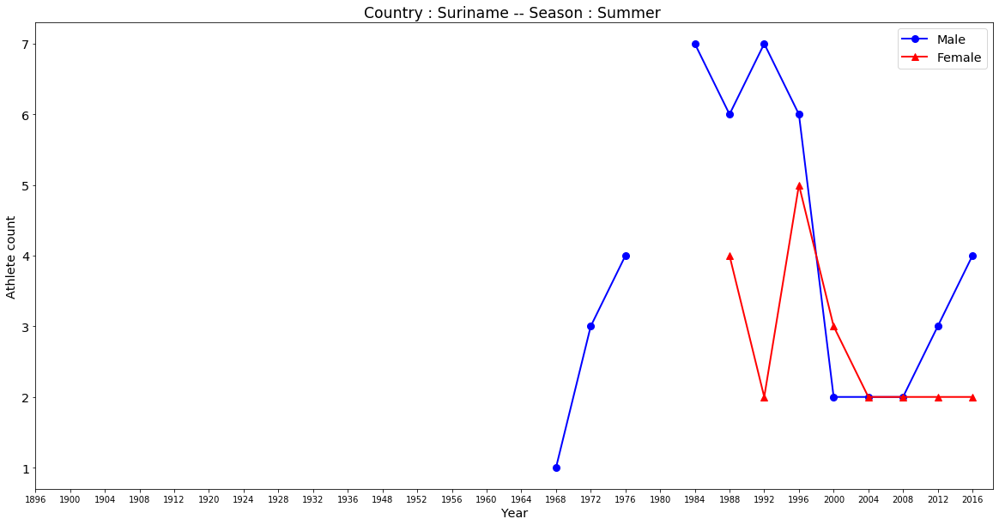

31


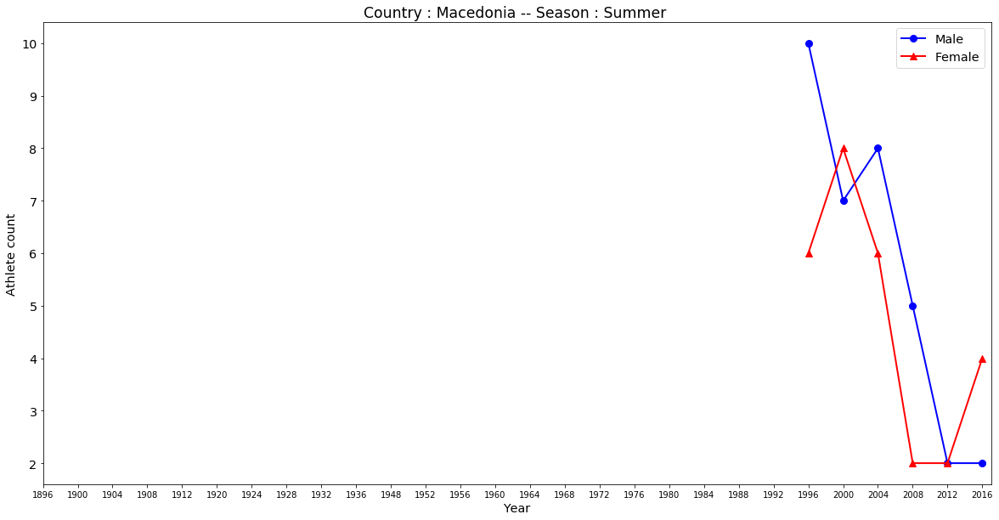

32


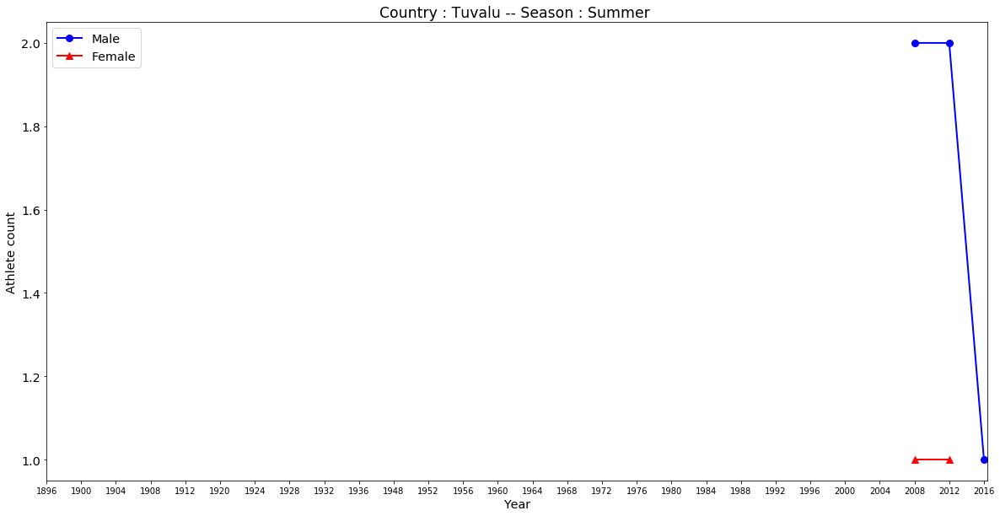

33


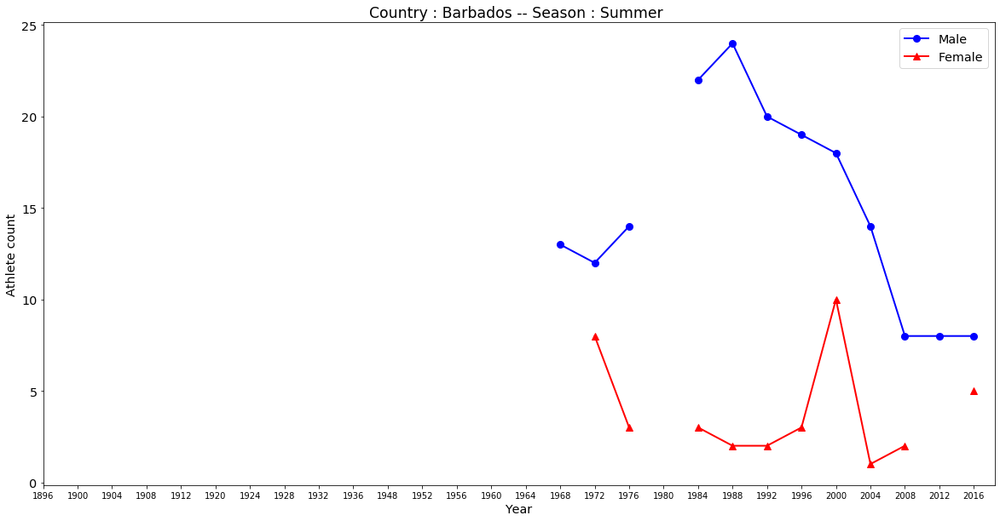

34


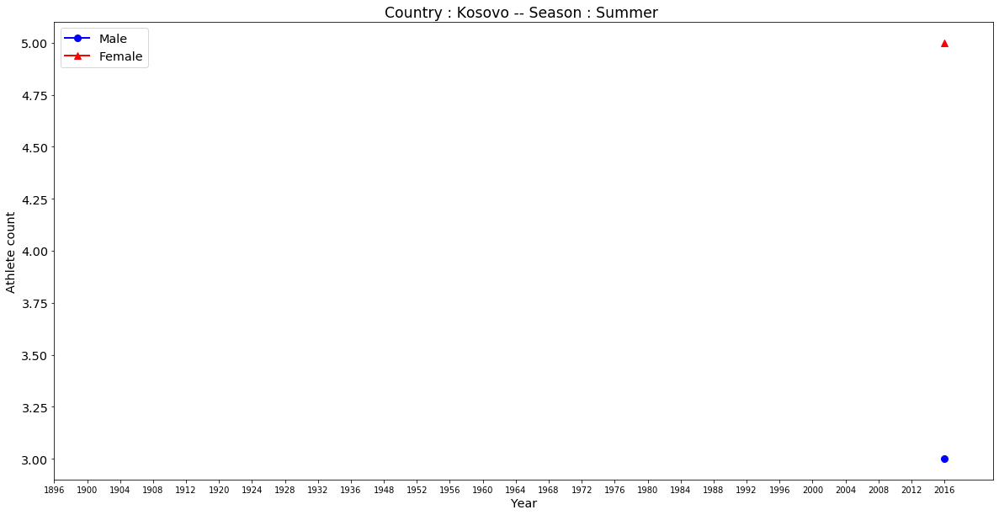

35


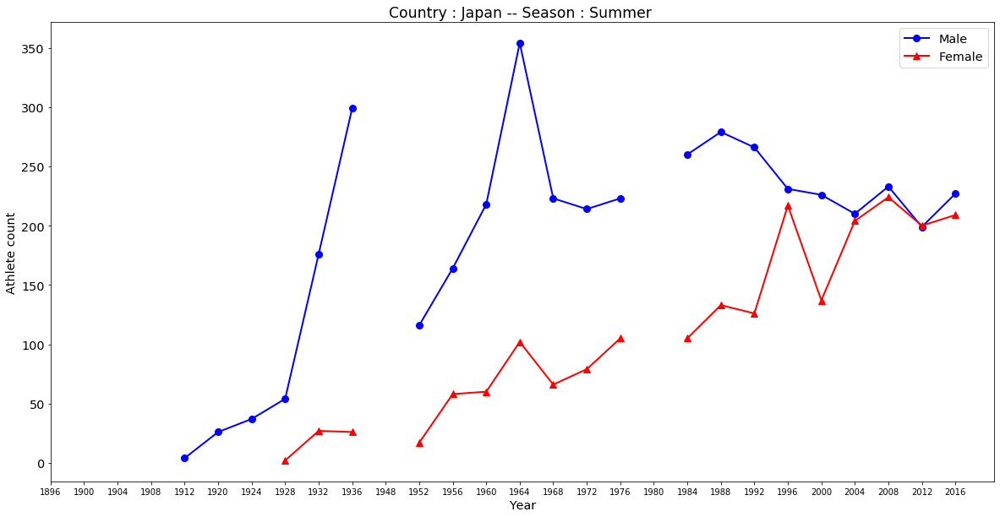

36


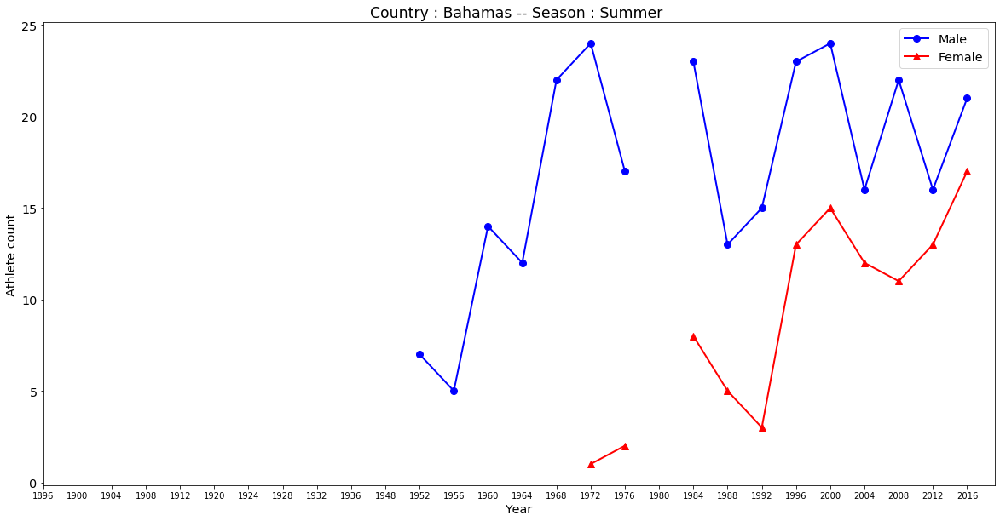

37


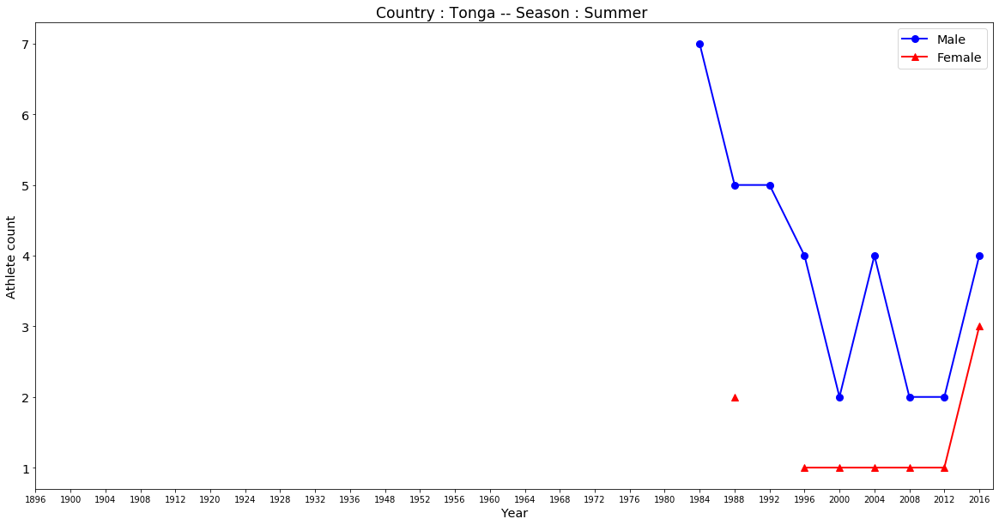

38


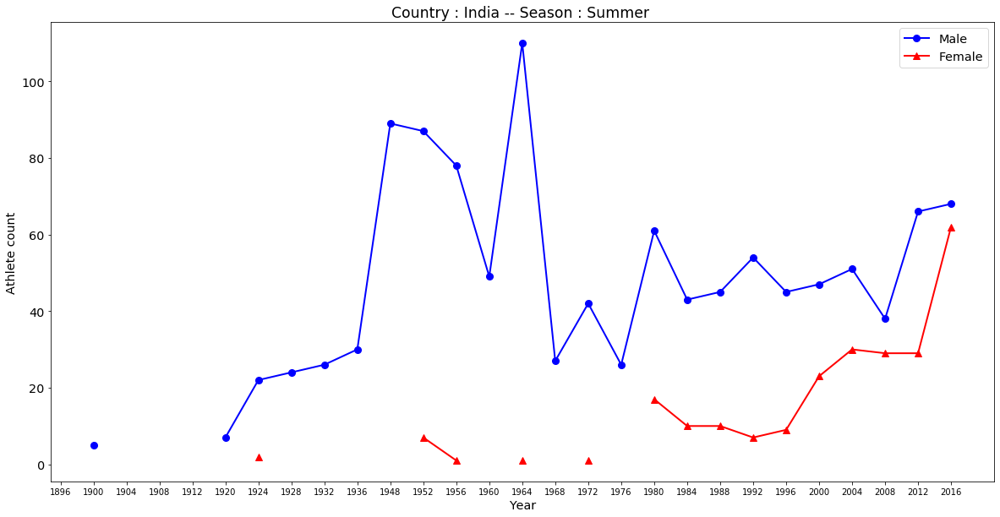

39


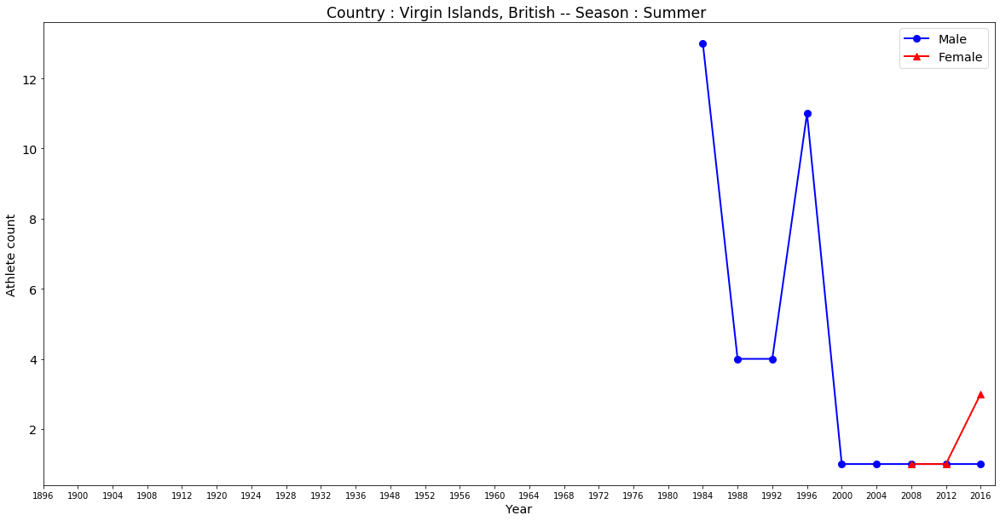

40


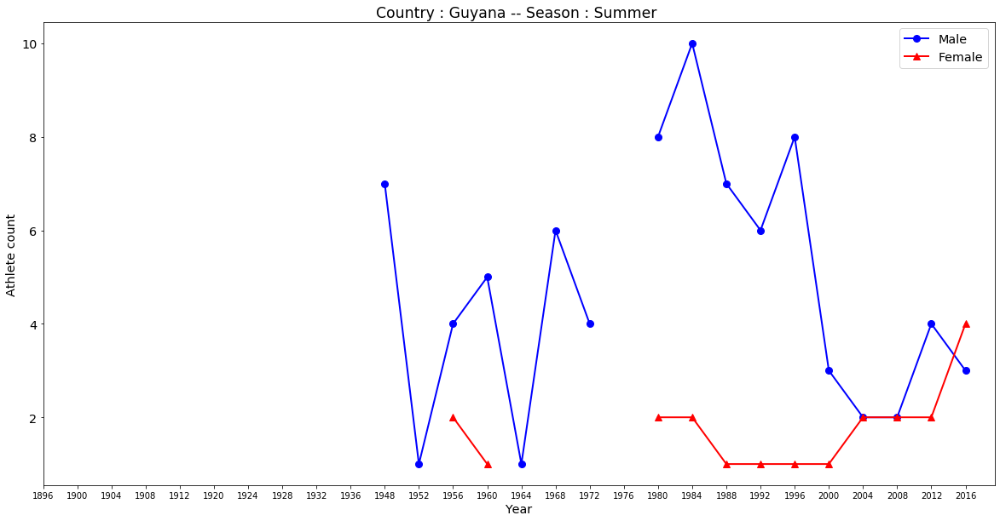

41


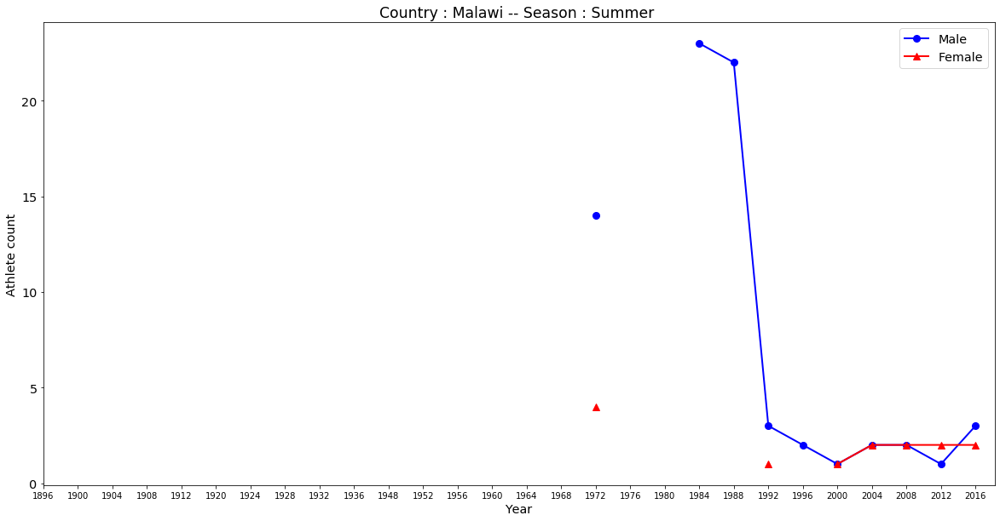

42


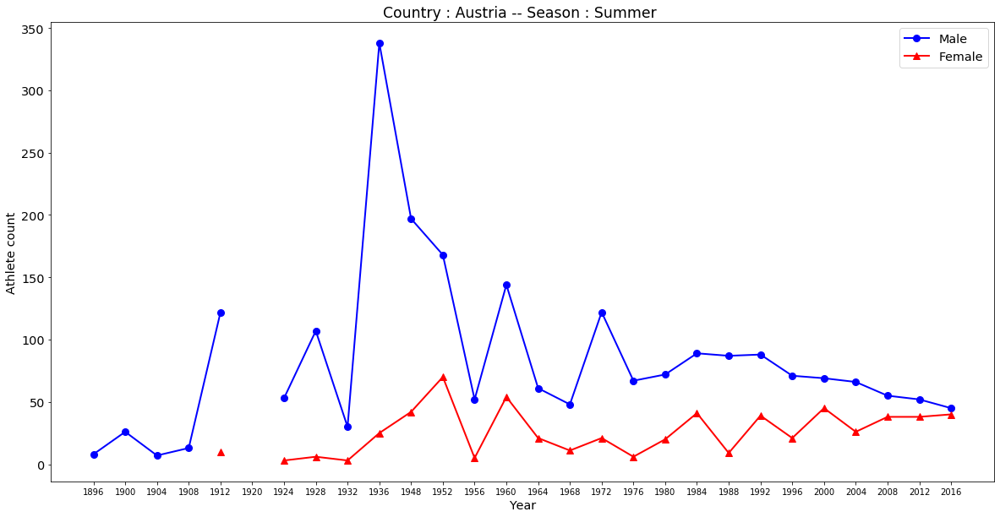

43


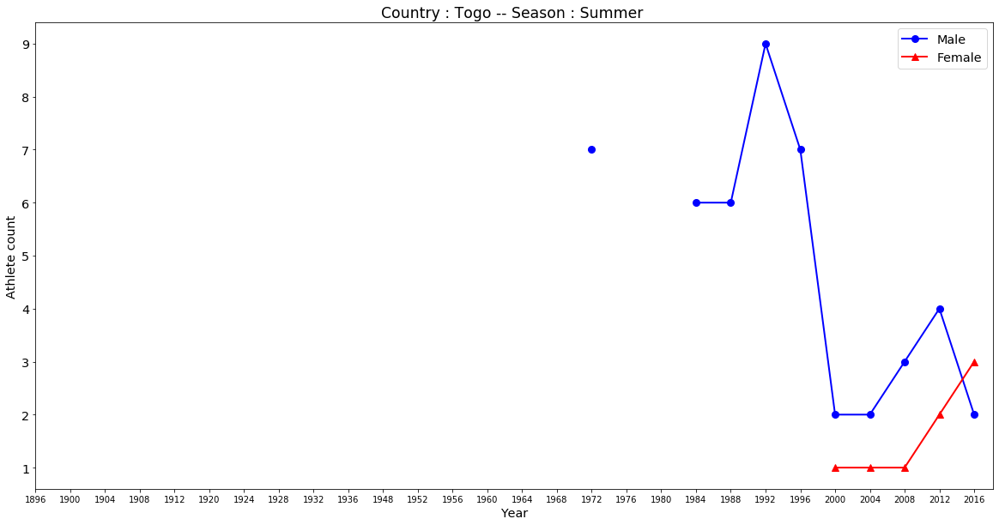

44


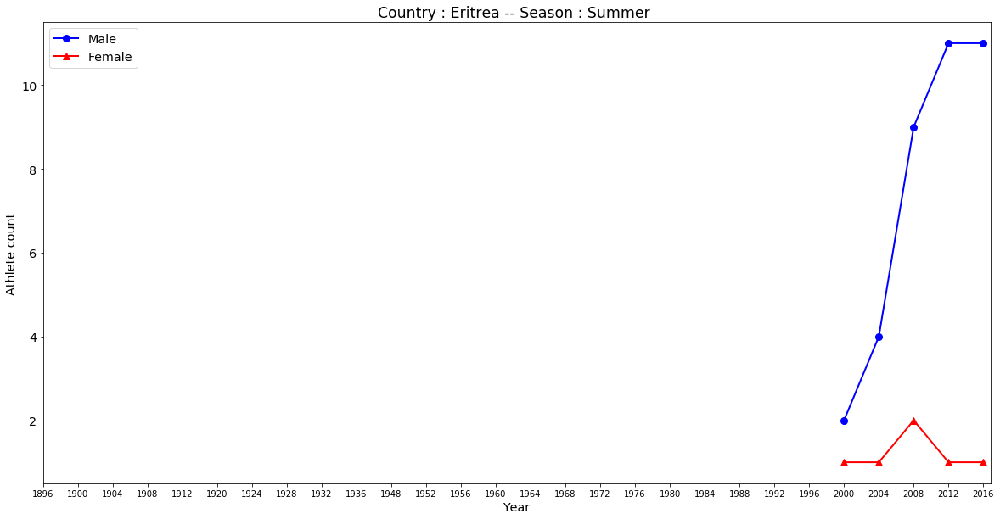

45


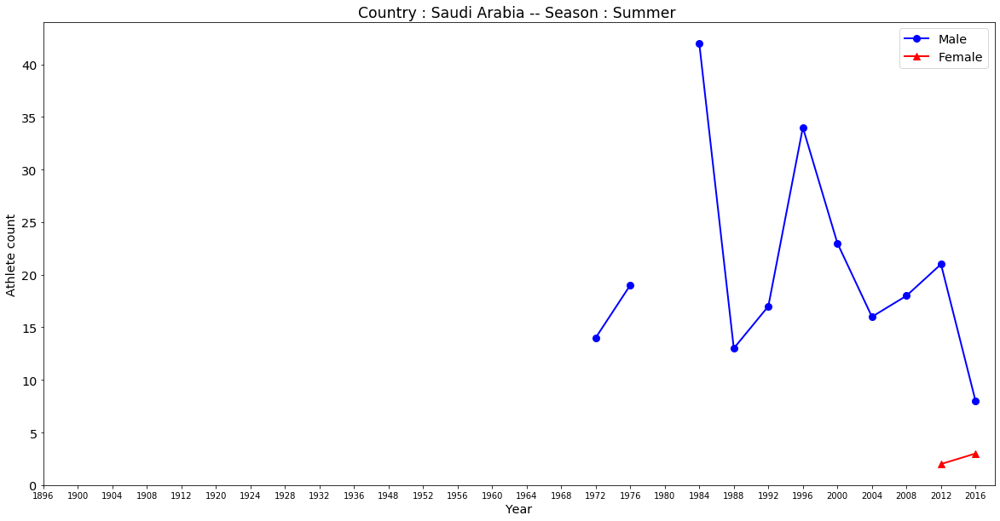

46


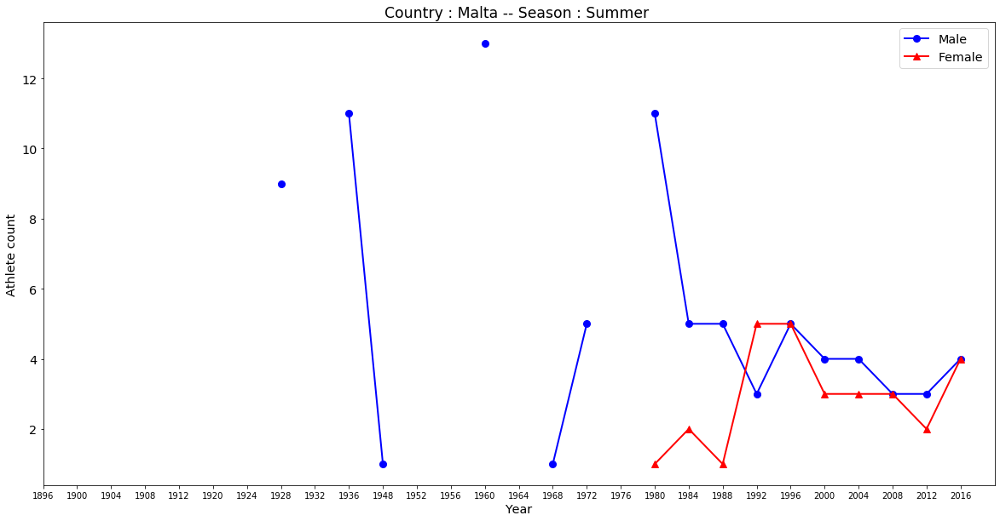

47


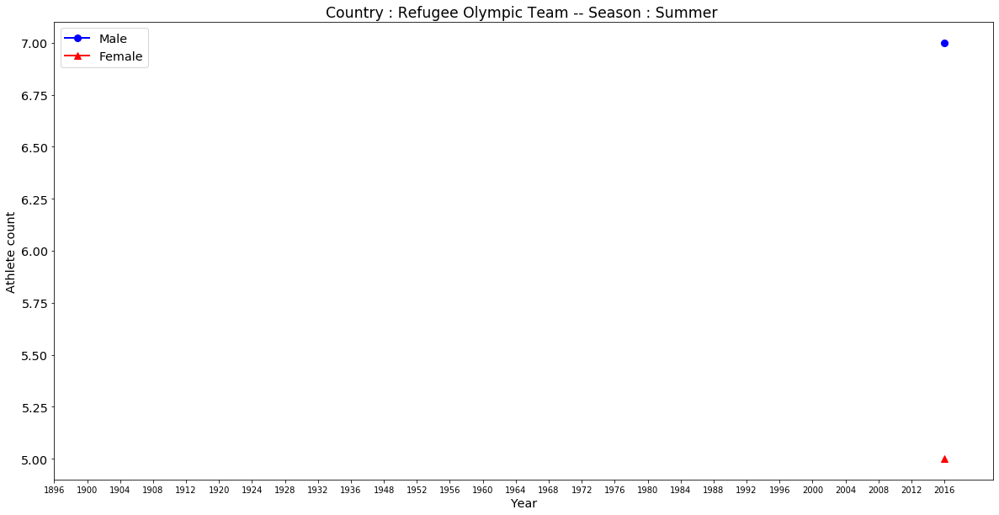

48


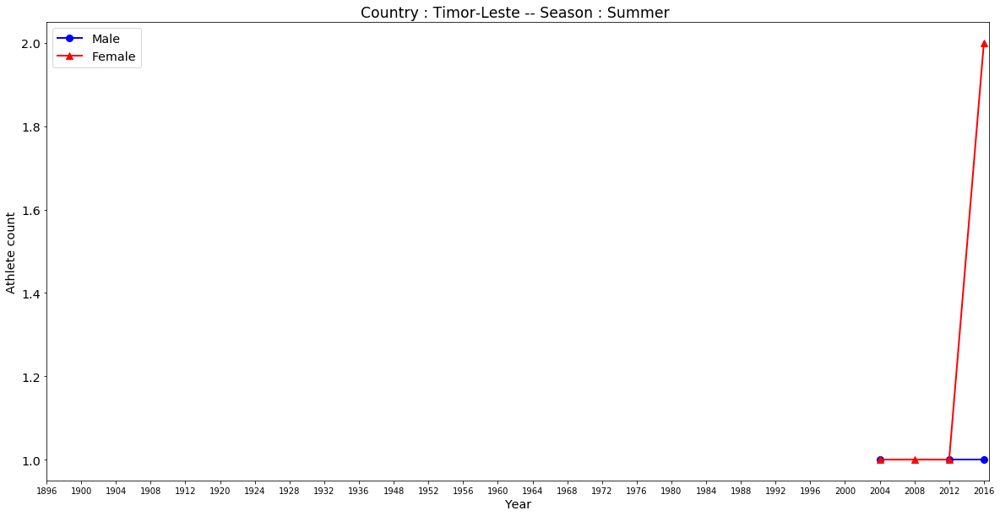

49


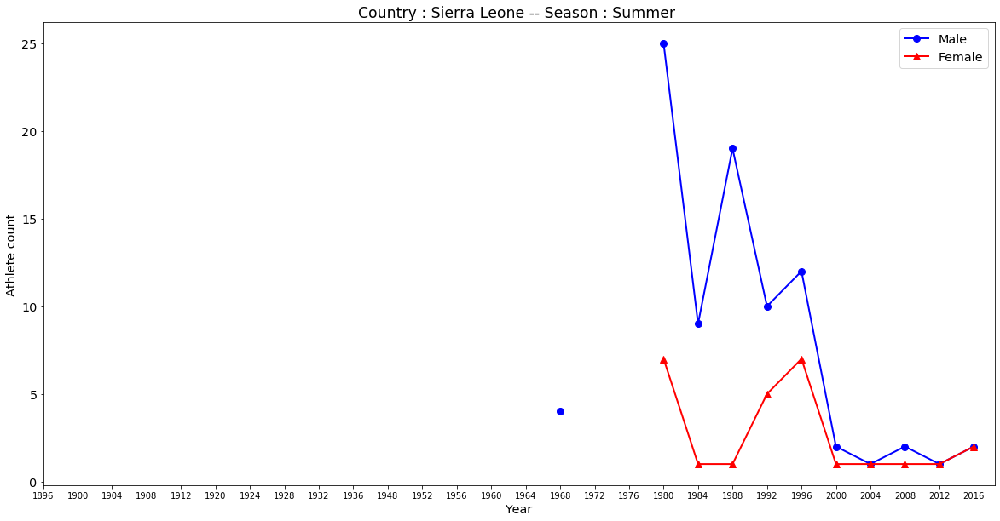

50


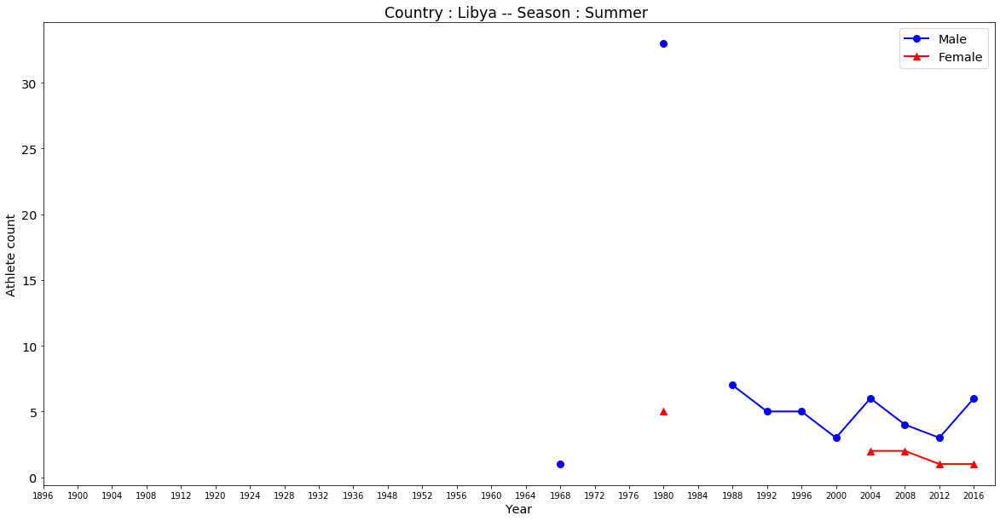

51


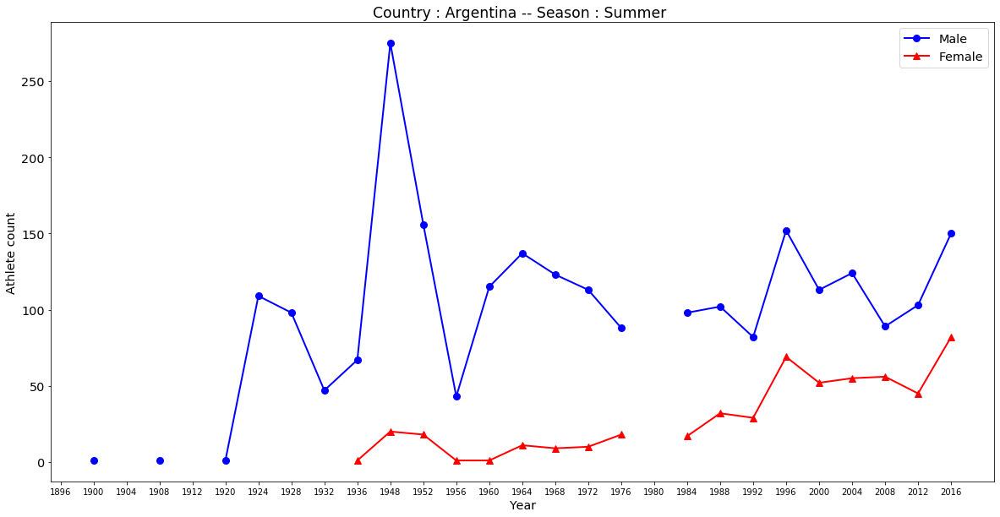

52


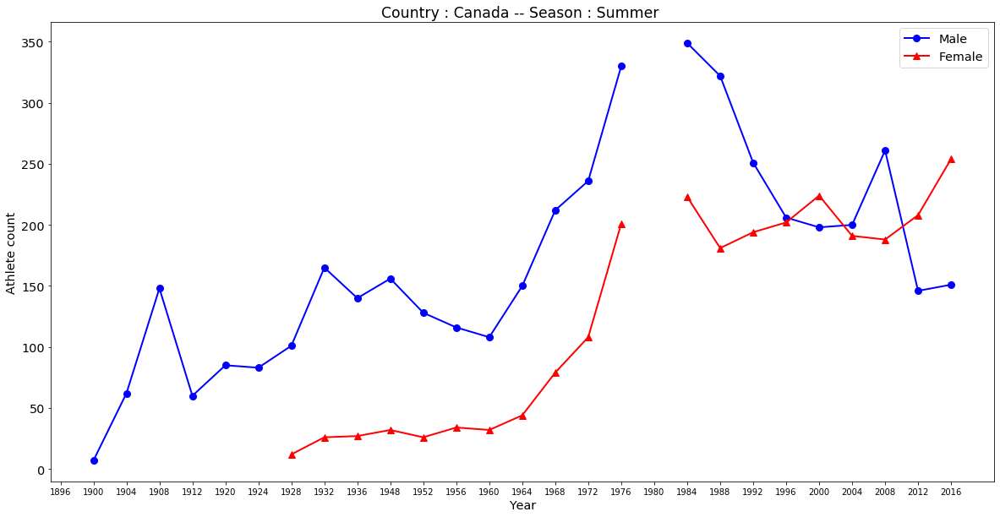

53


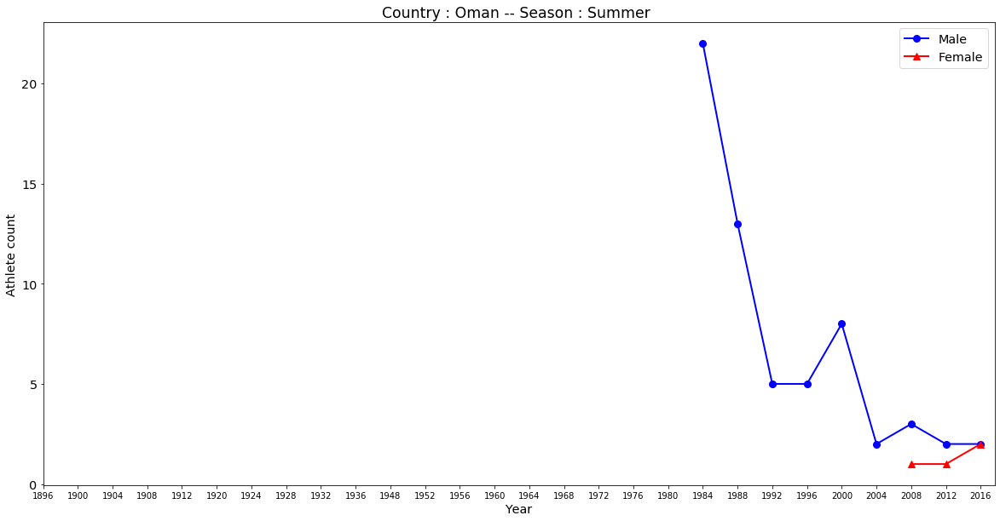

54


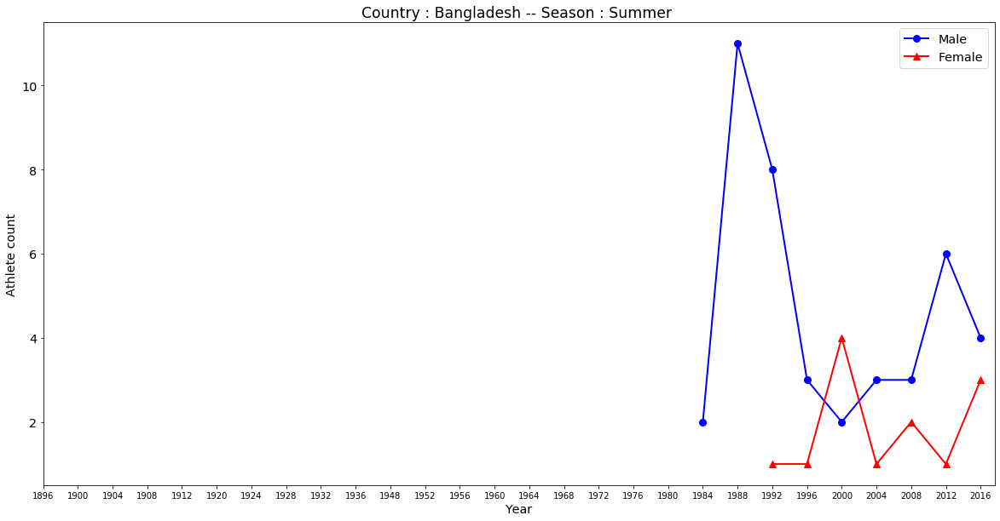

55


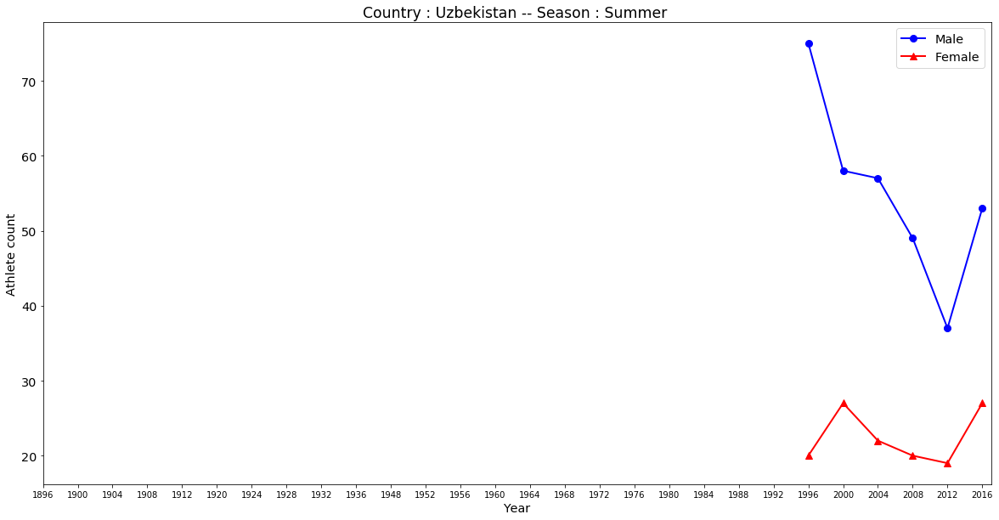

56


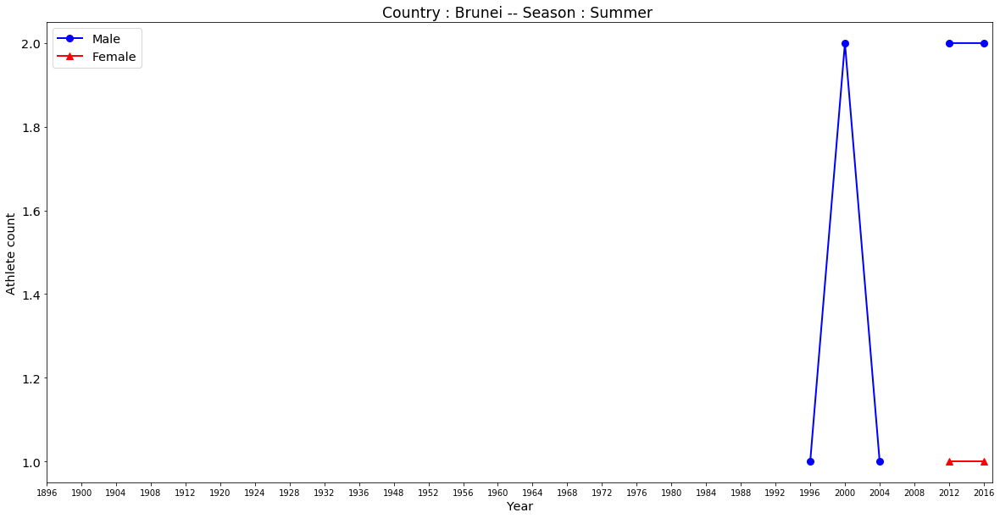

57


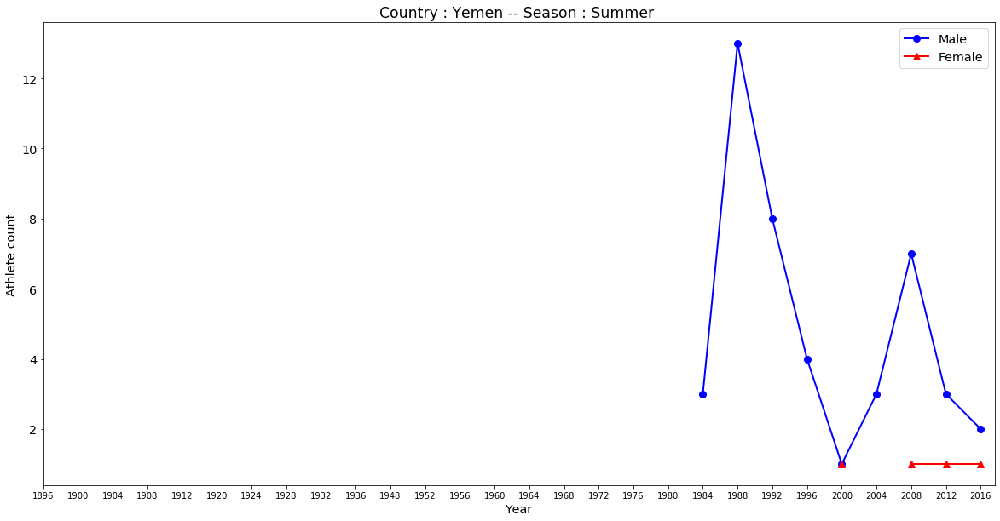

58


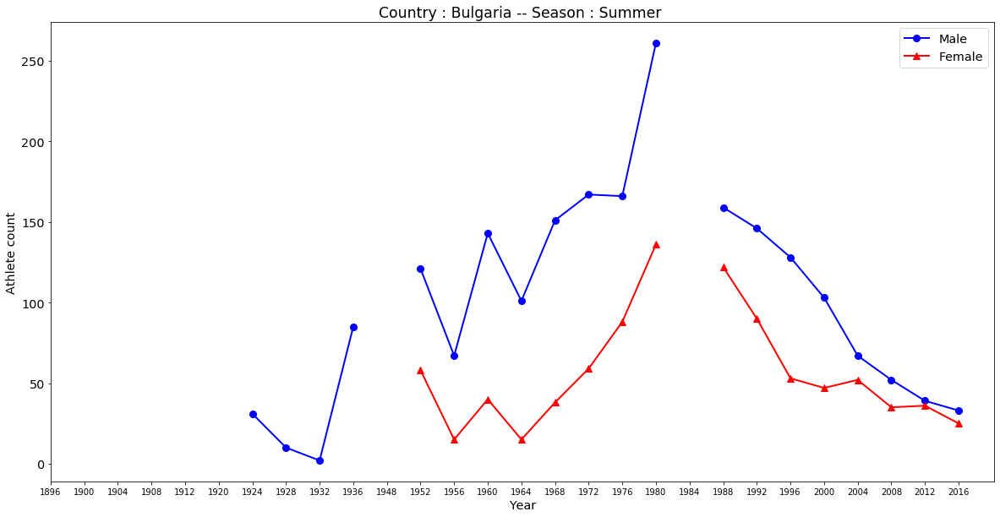

59


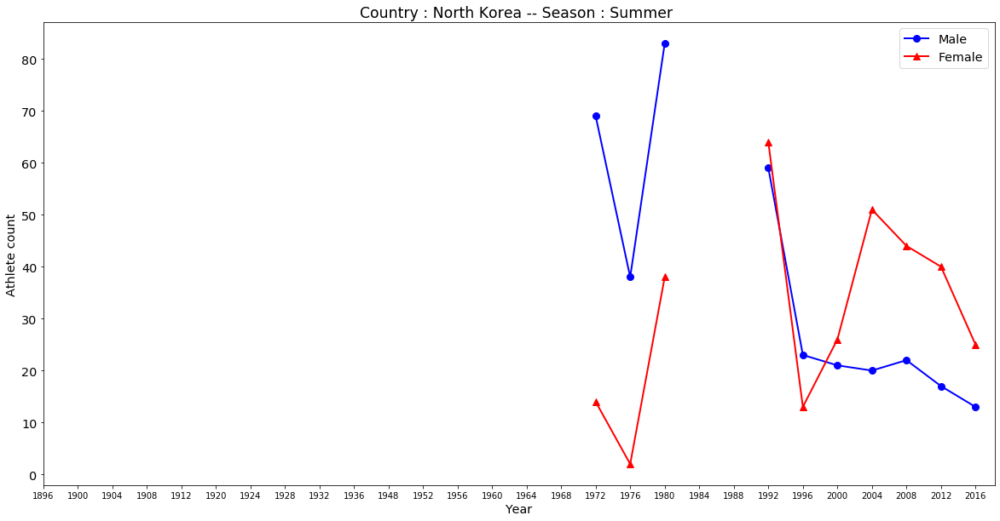

60


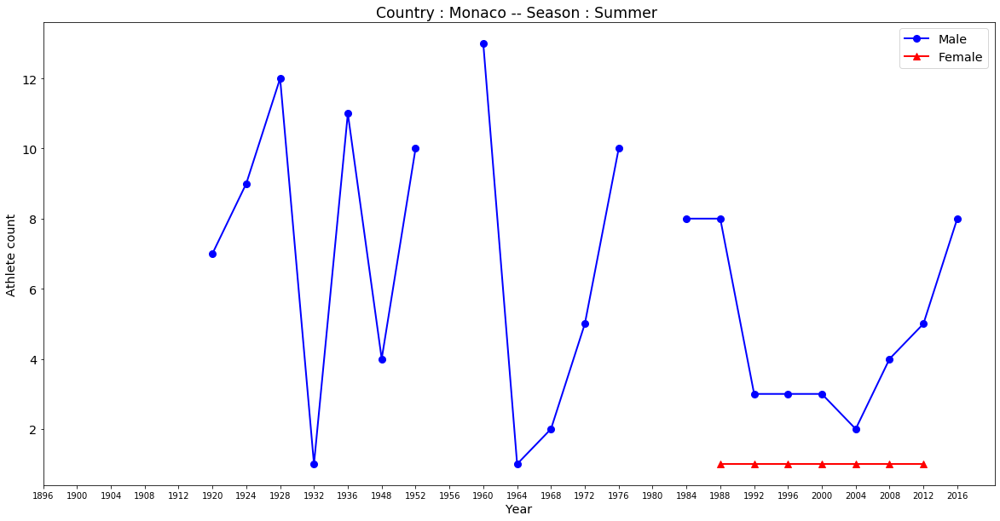

61


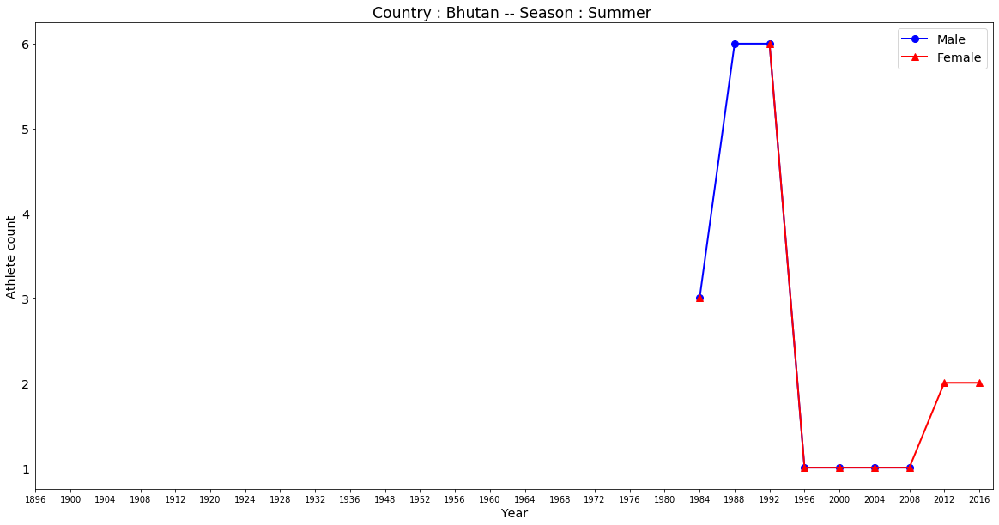

62


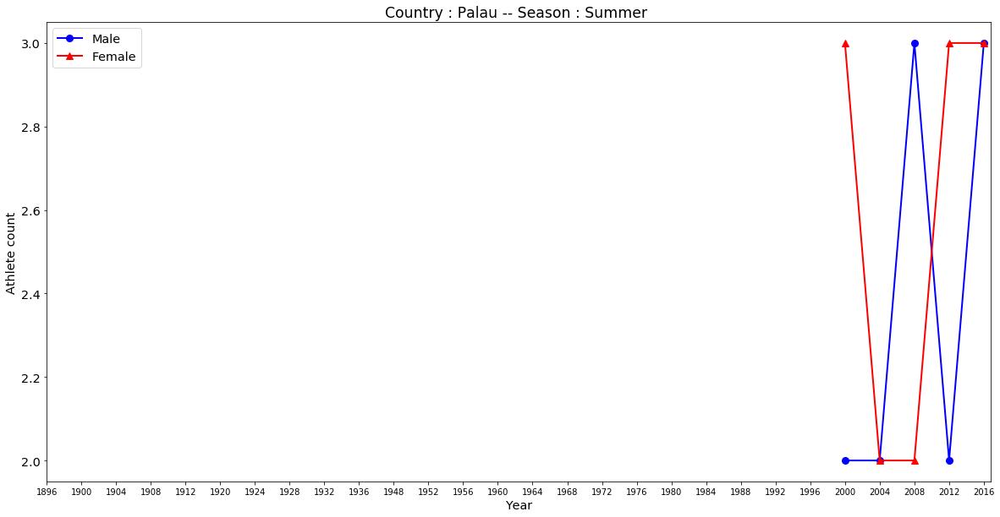

63


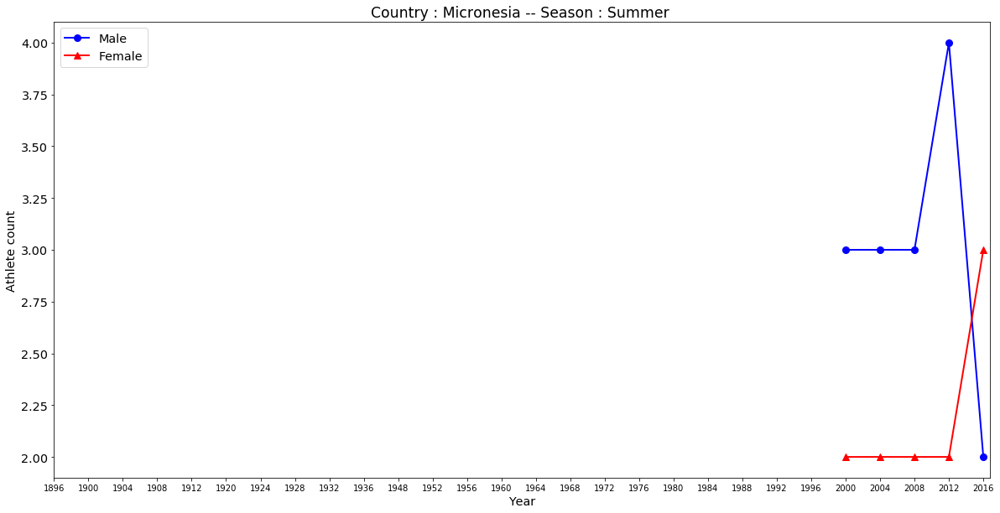

64


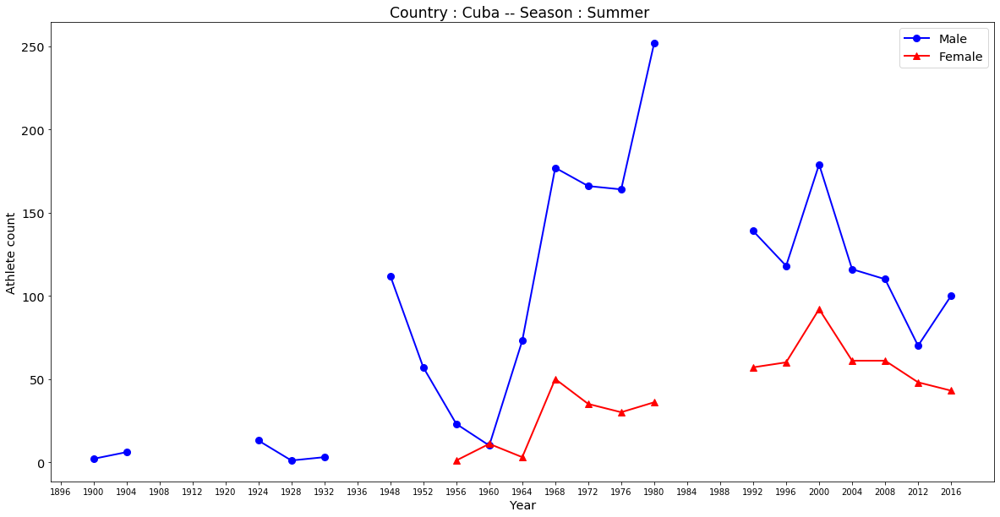

65


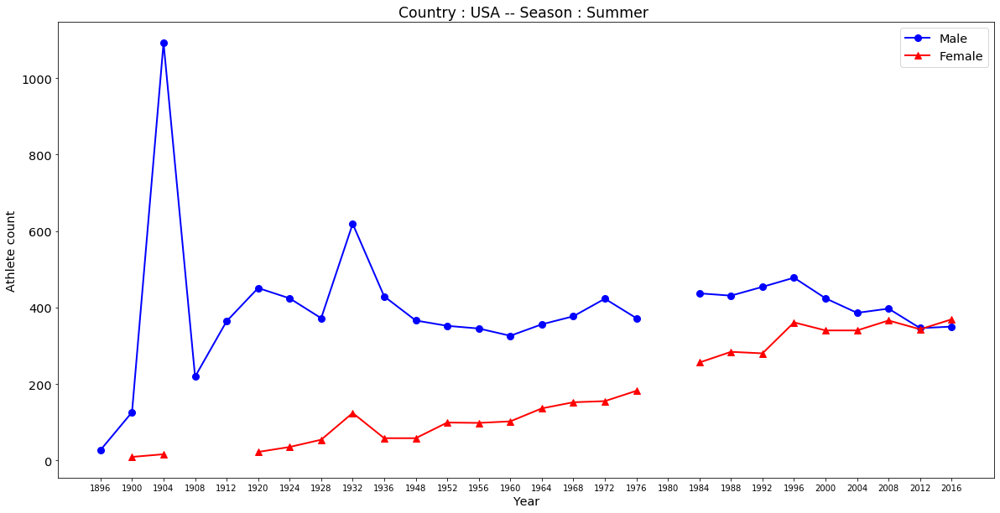

66


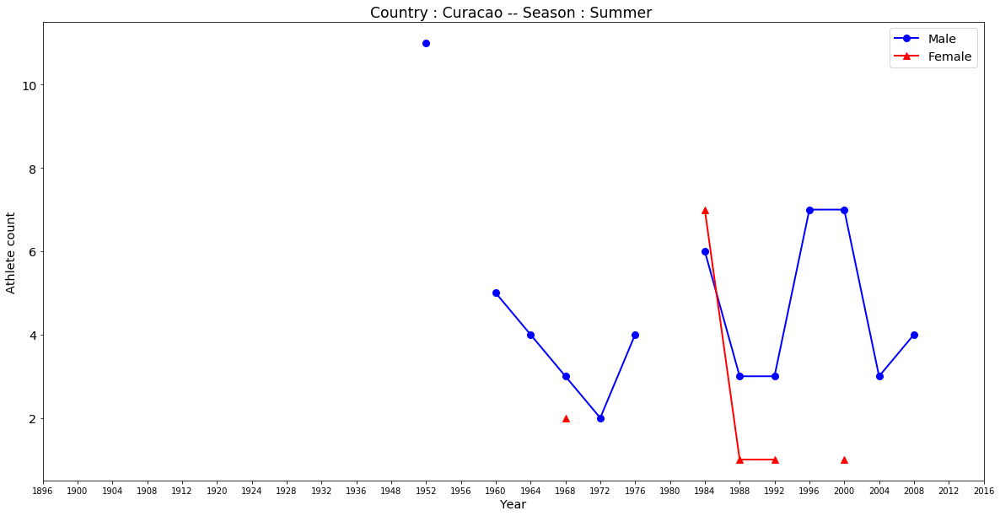

67


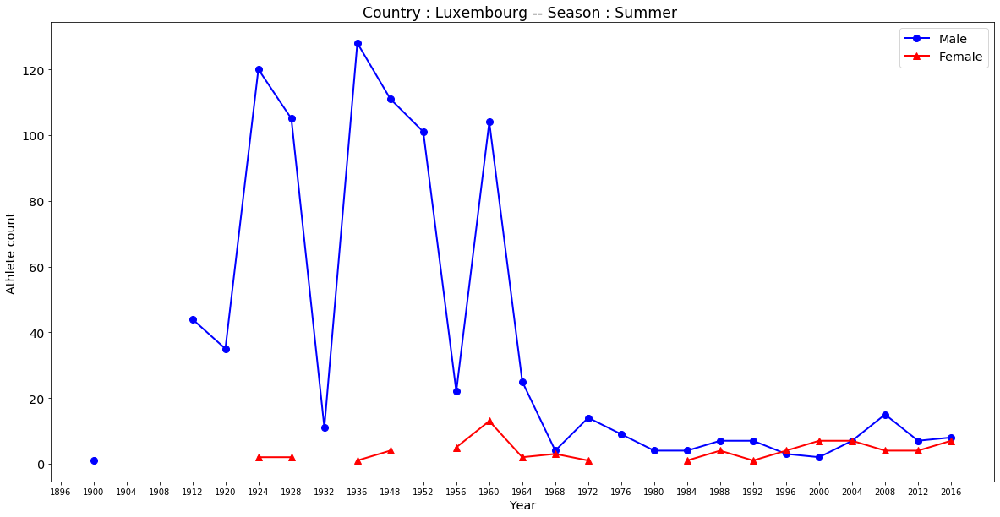

68


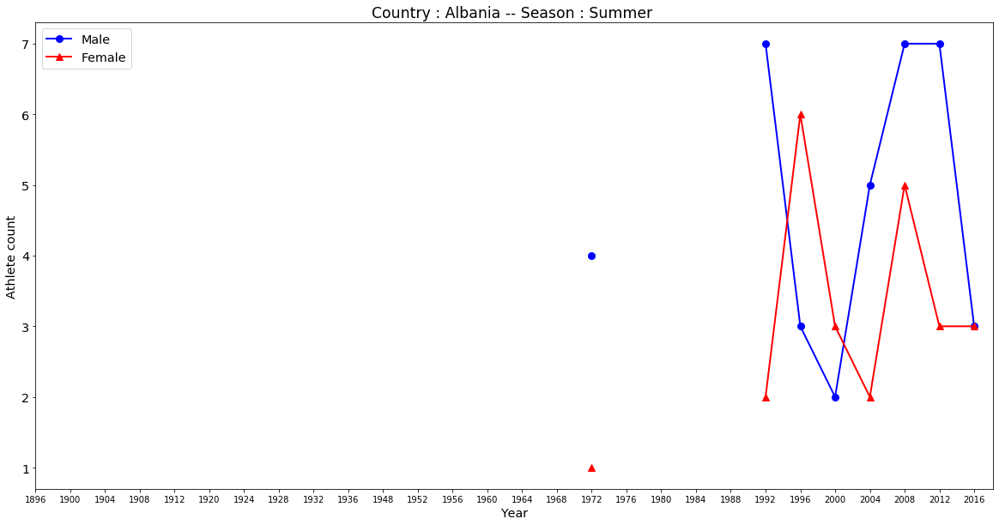

69


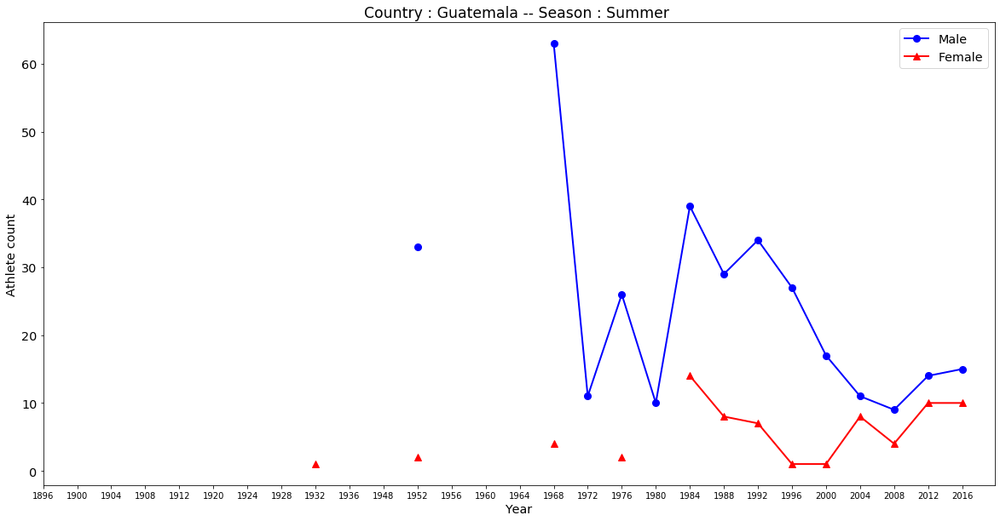

70


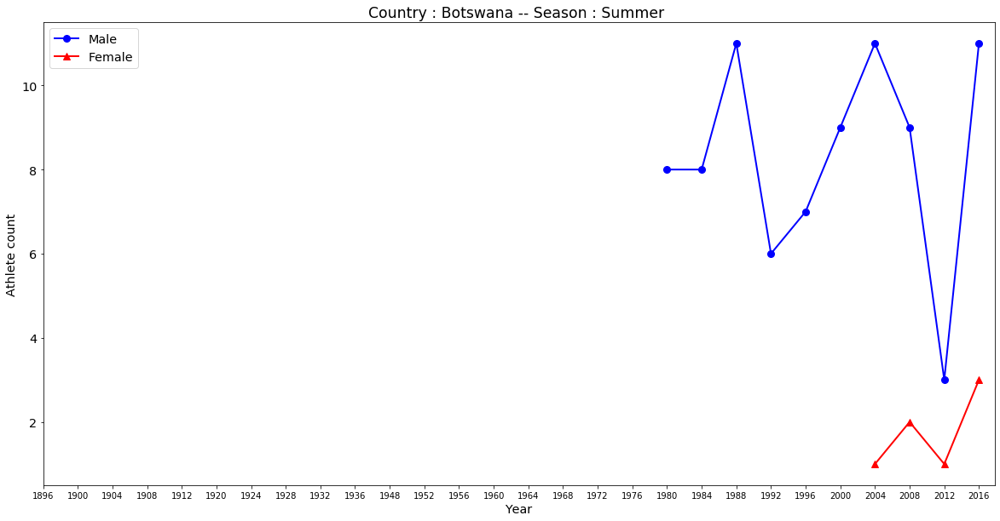

71


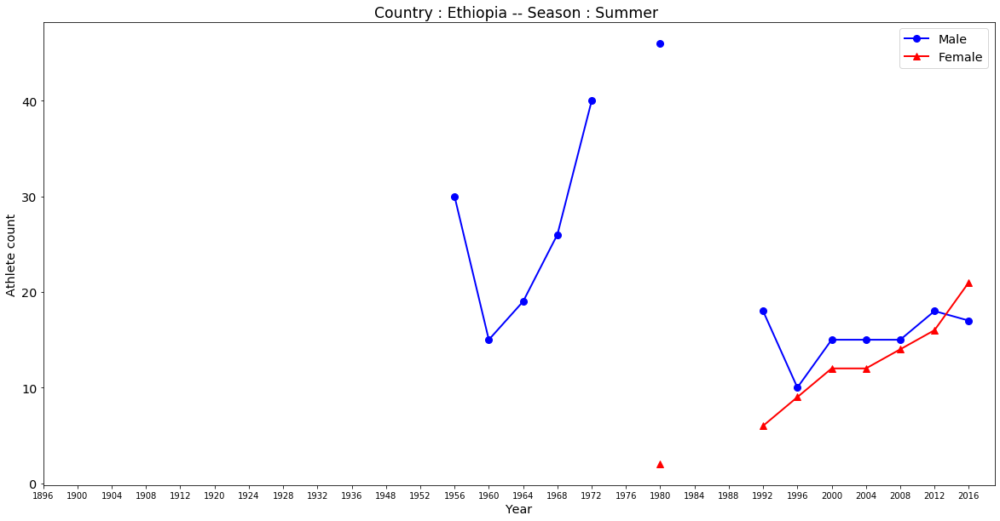

72


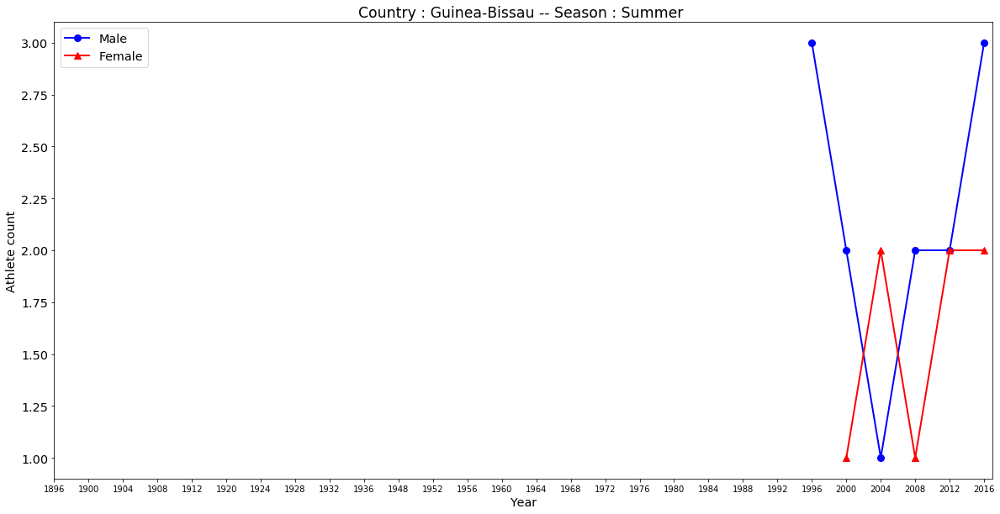

73


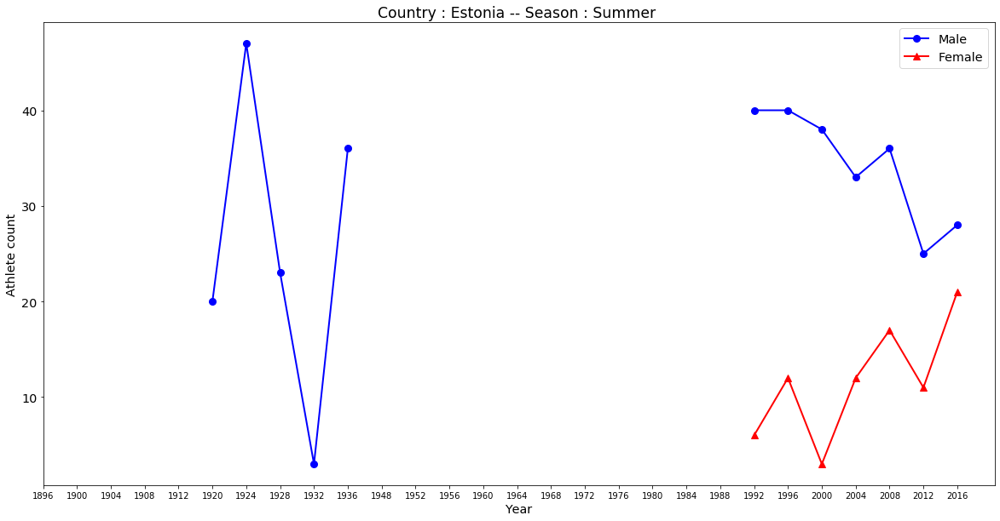

74


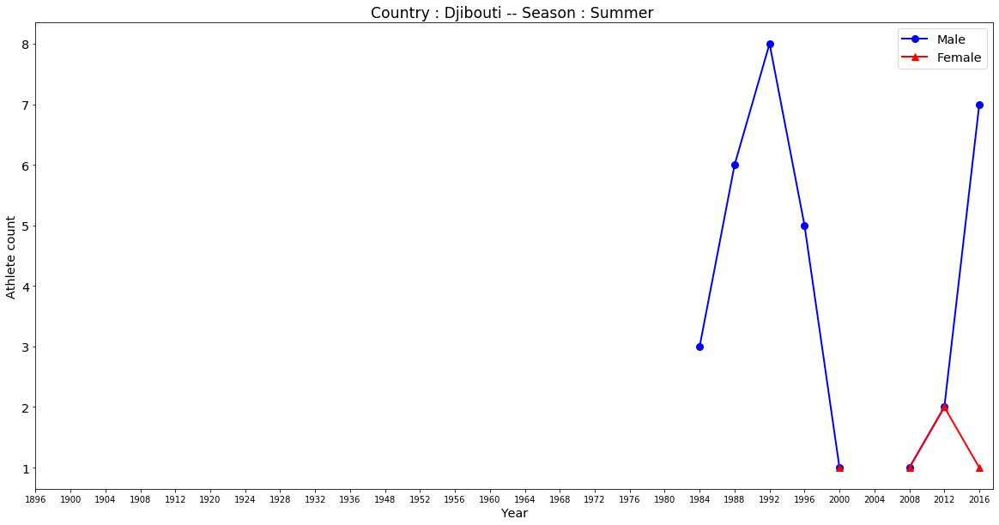

75


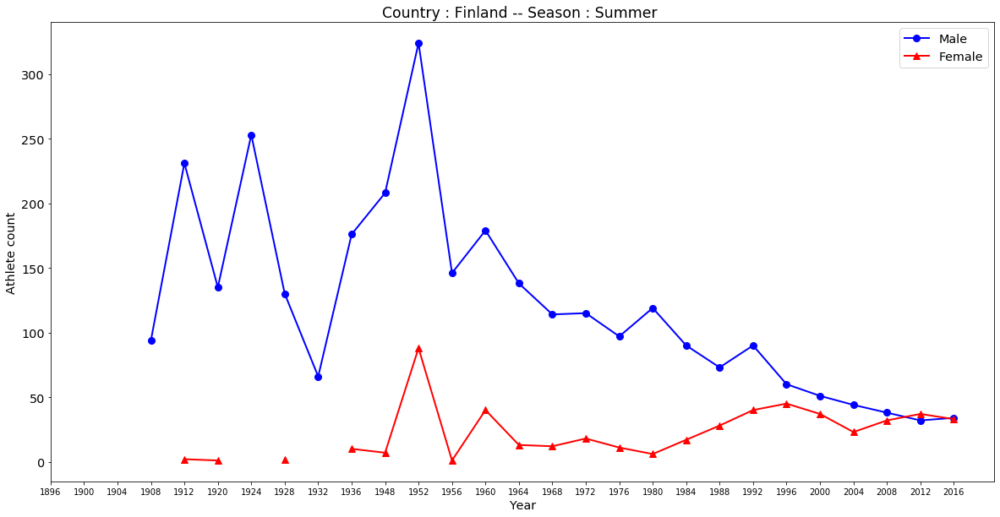

76


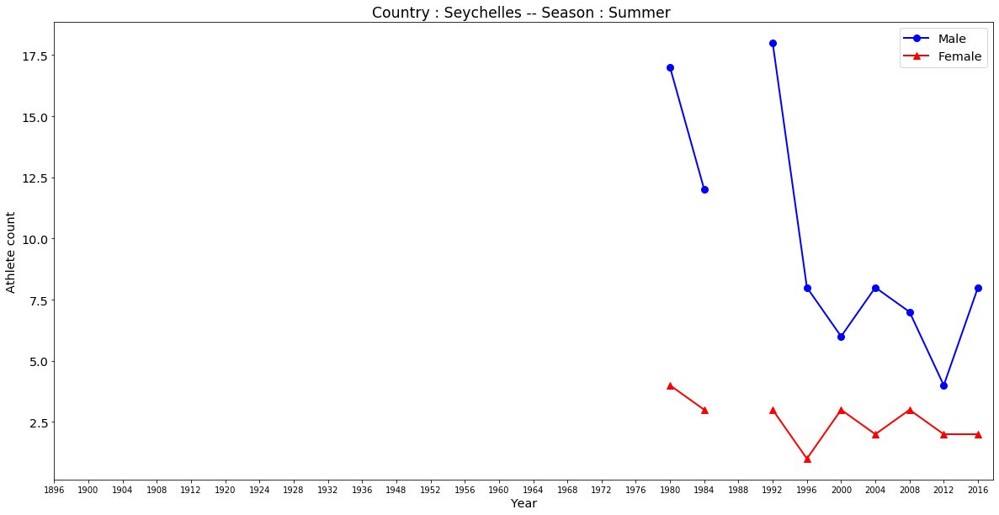

77


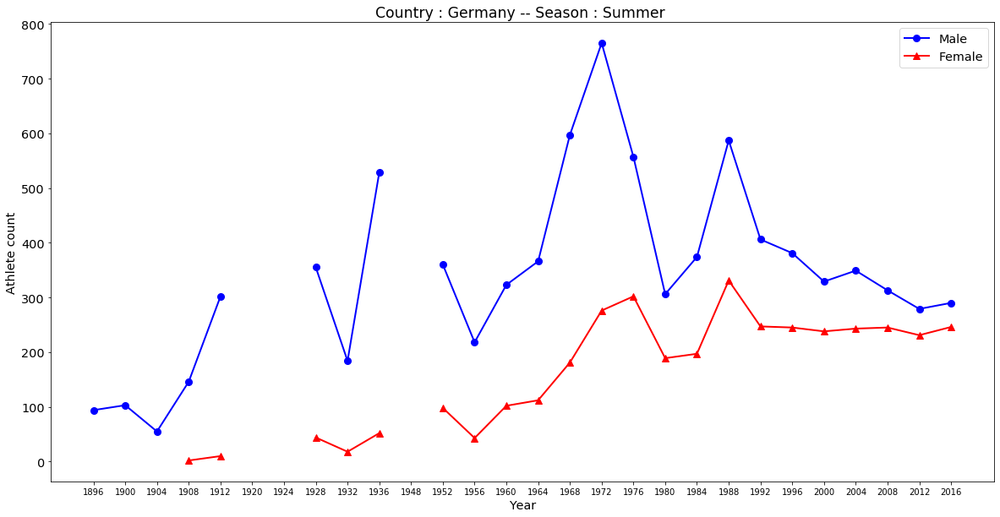

78


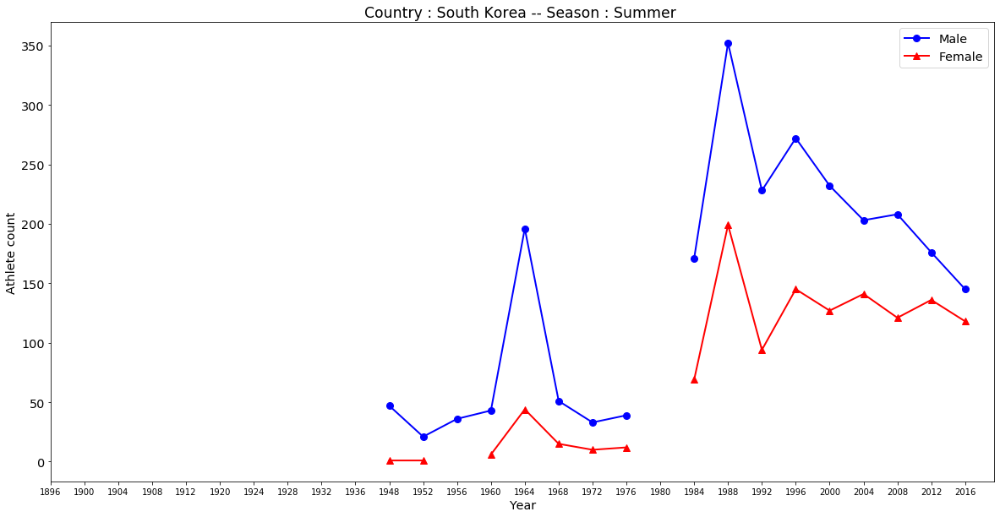

79


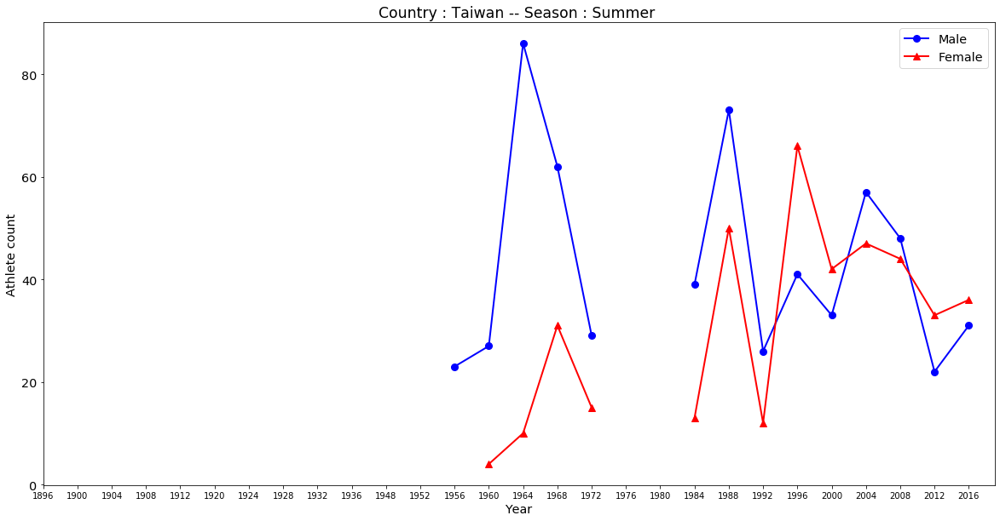

80


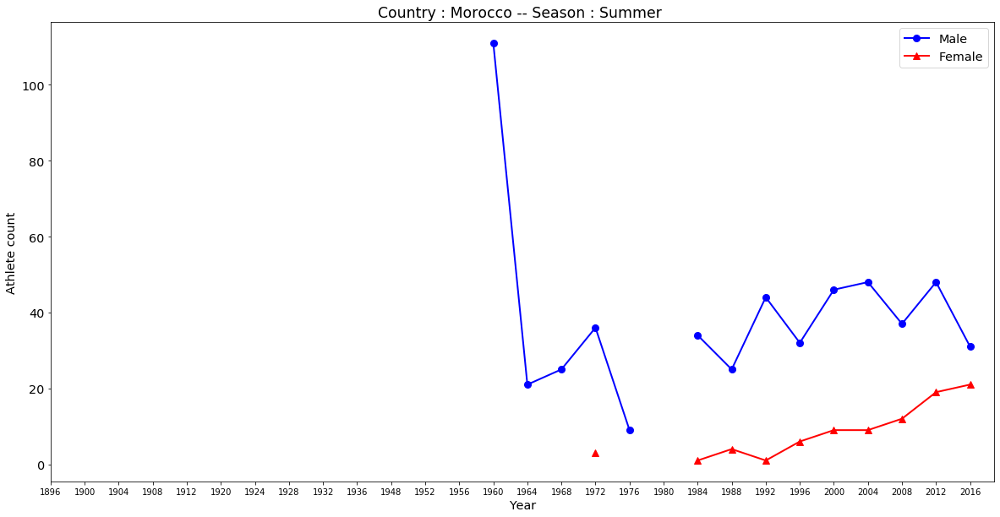

81


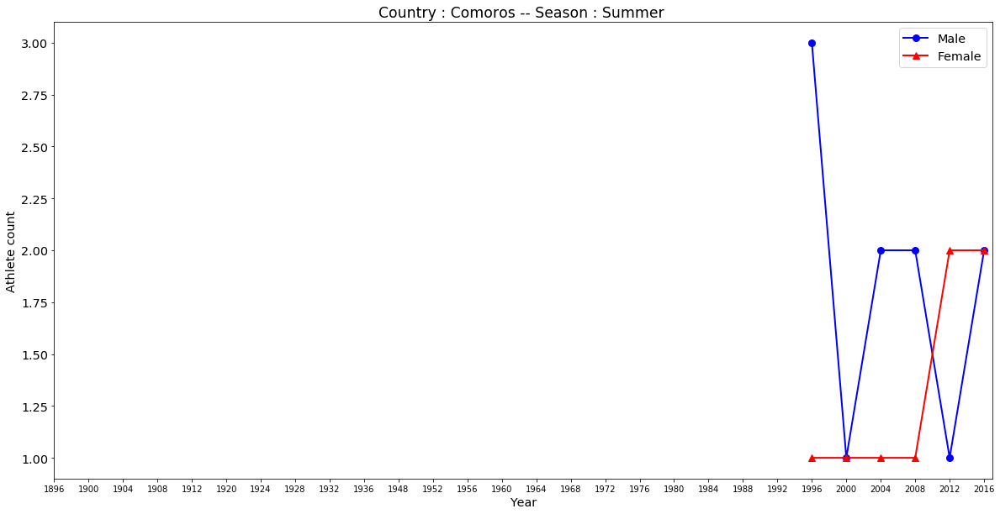

82


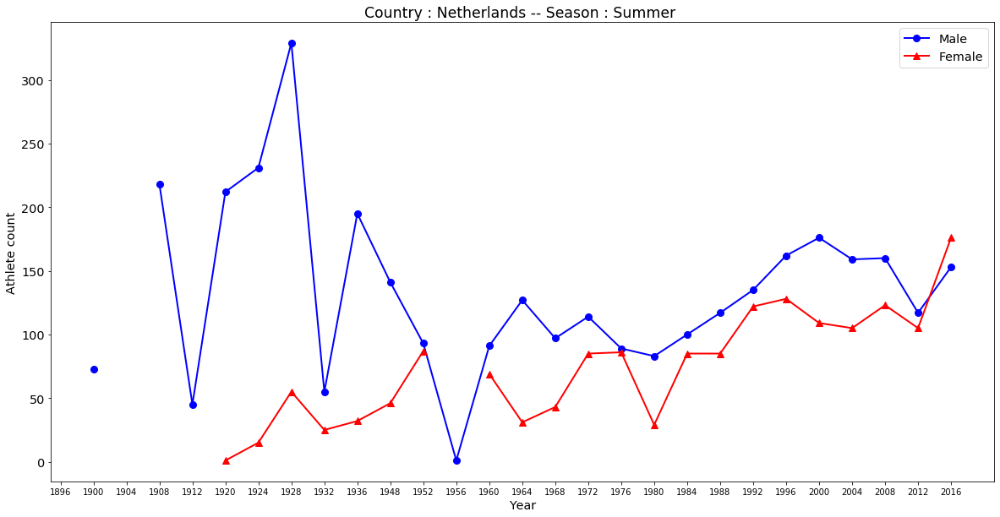

83


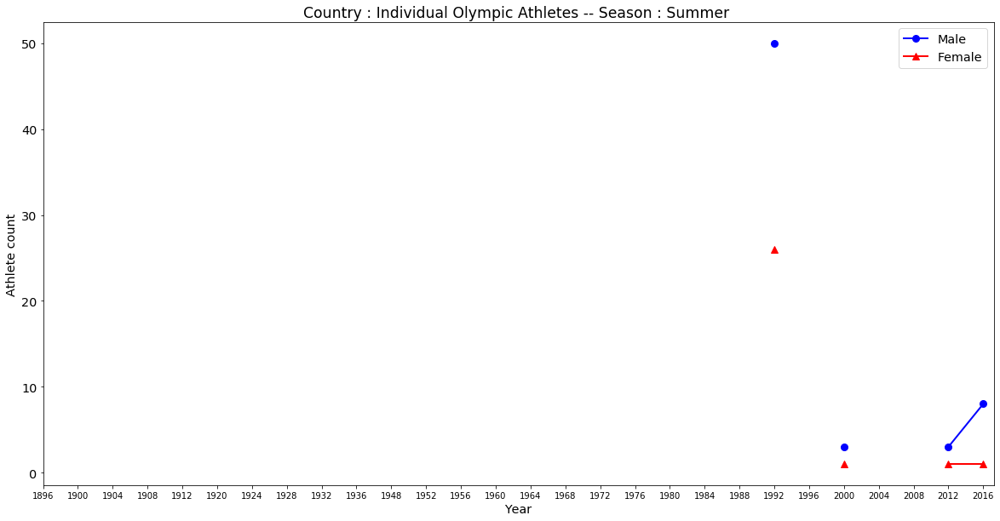

84


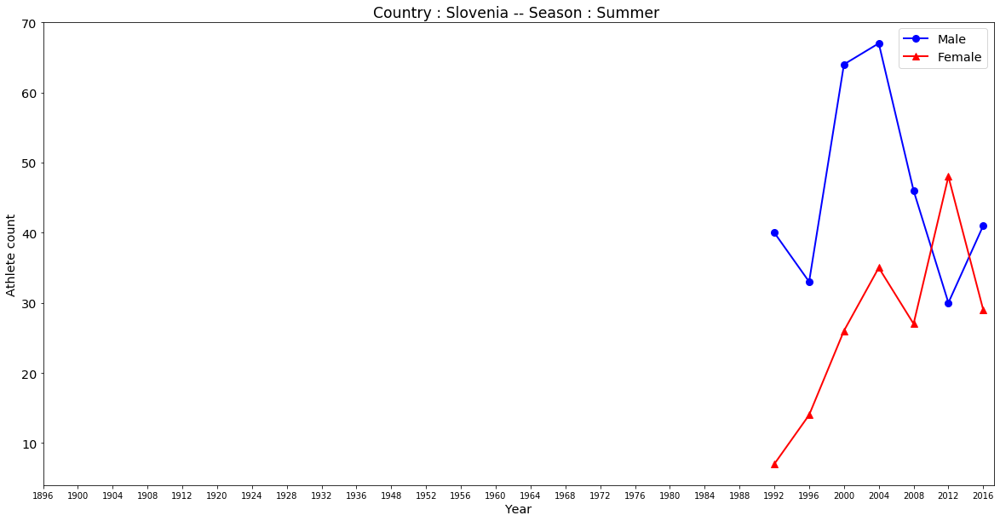

85


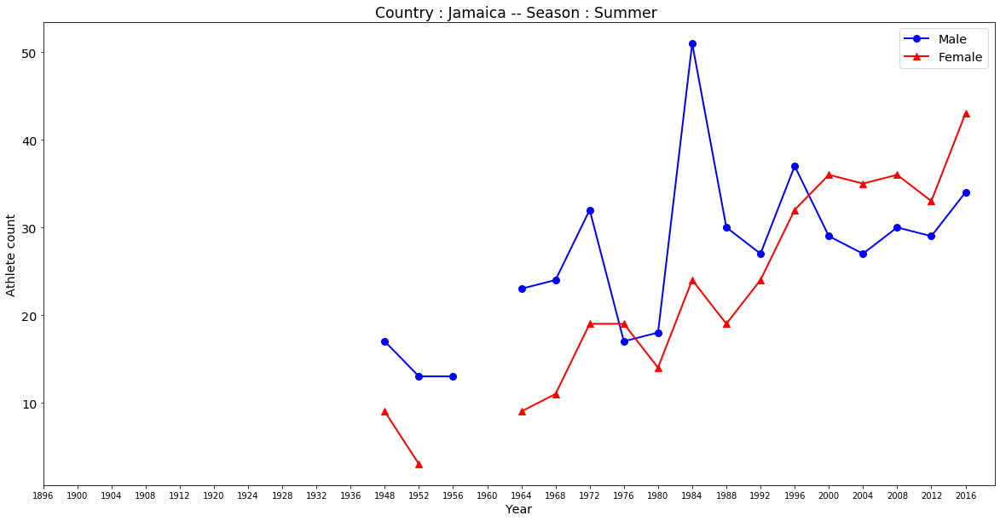

86


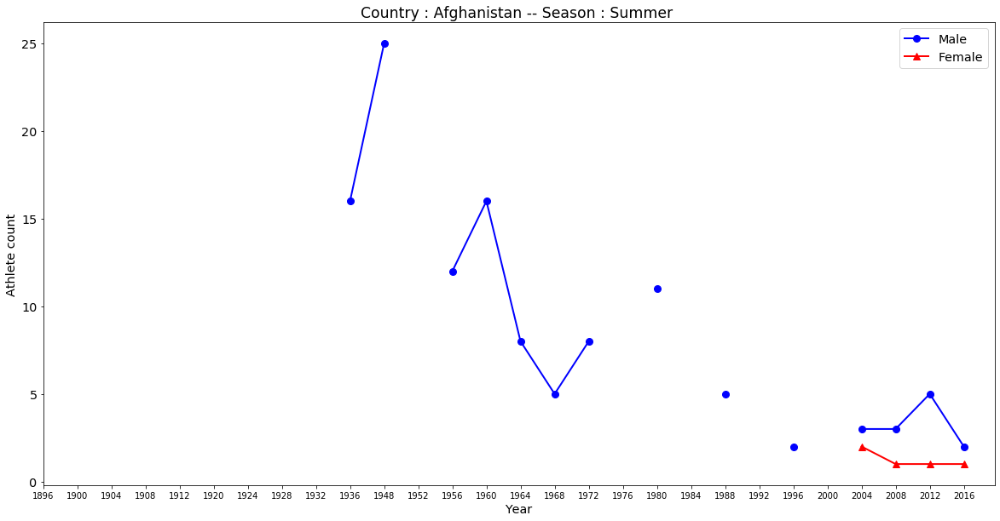

87


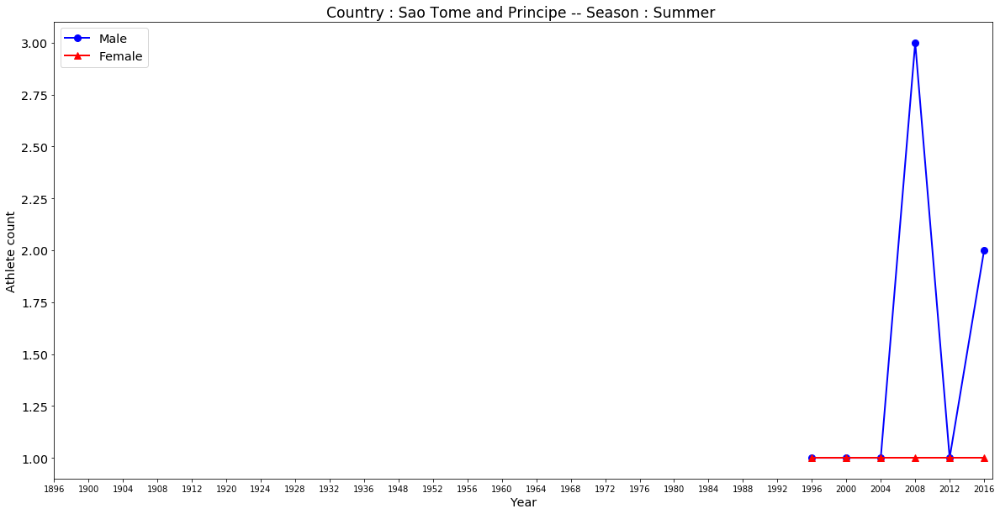

88


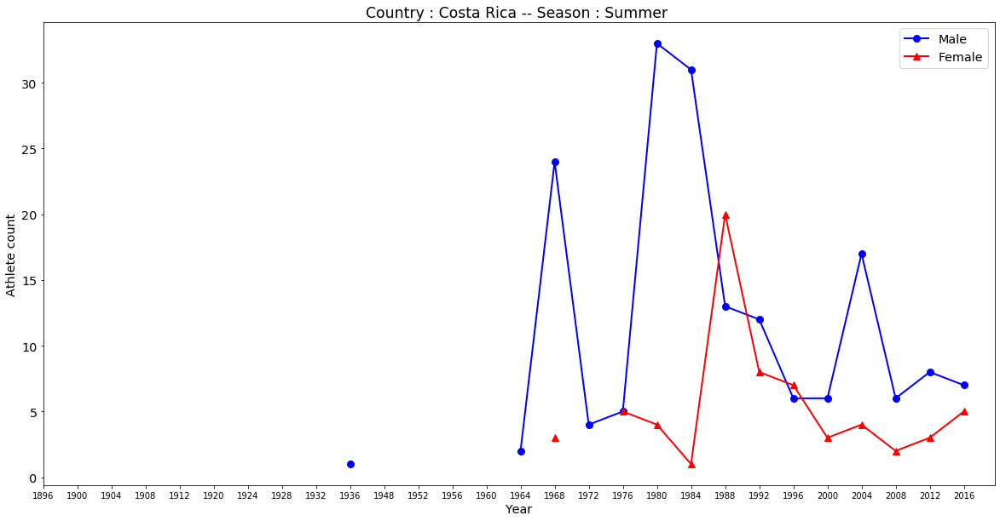

89


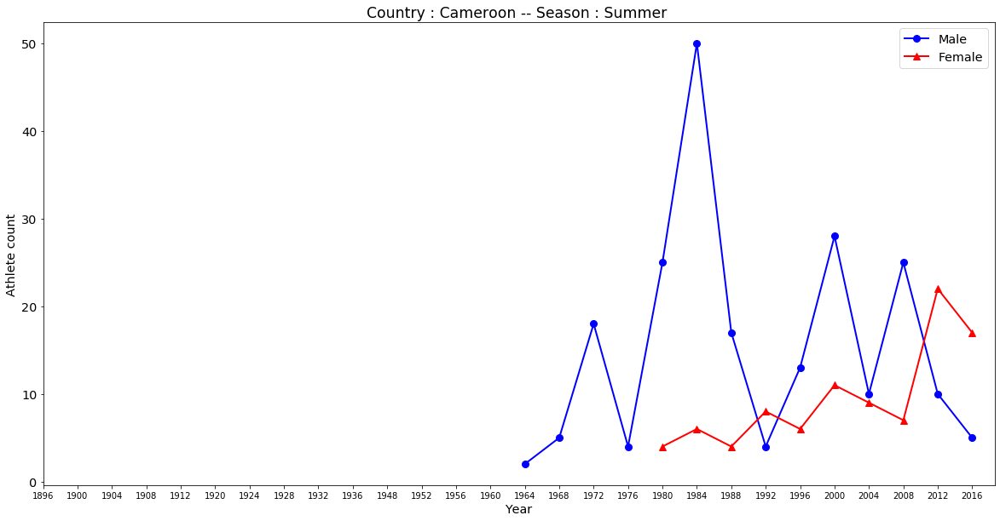

90


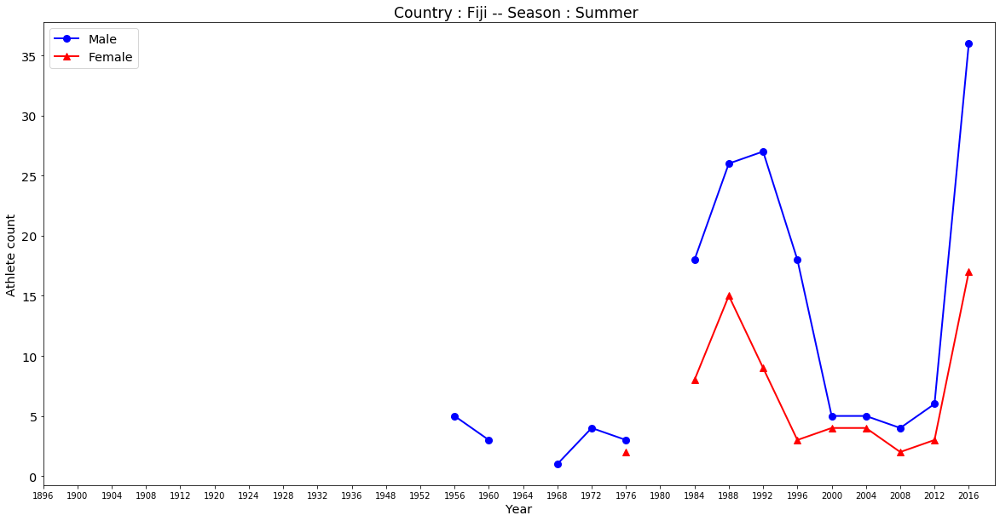

91


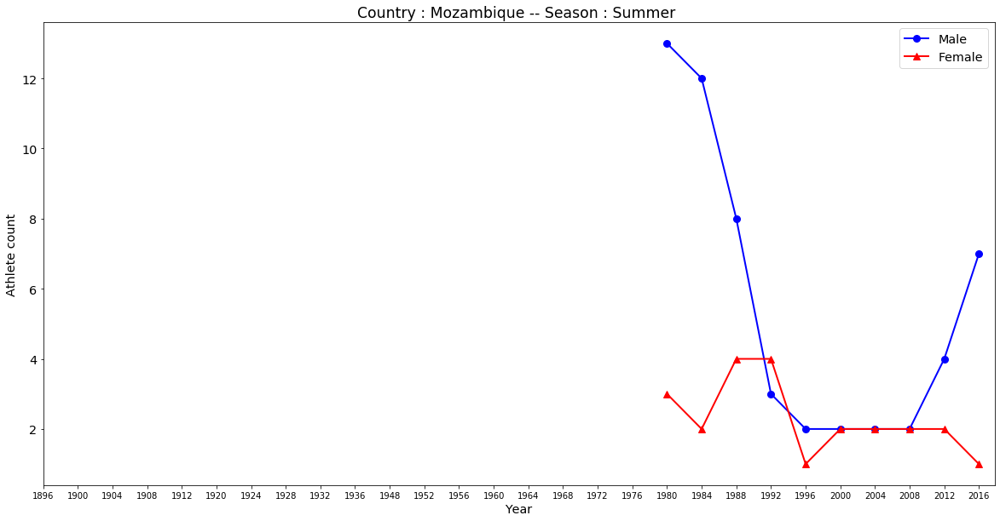

92


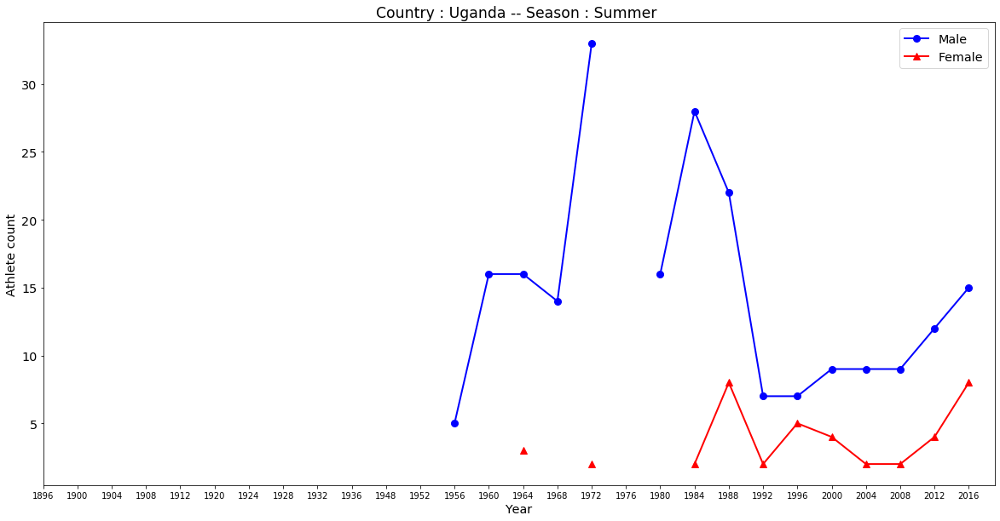

93


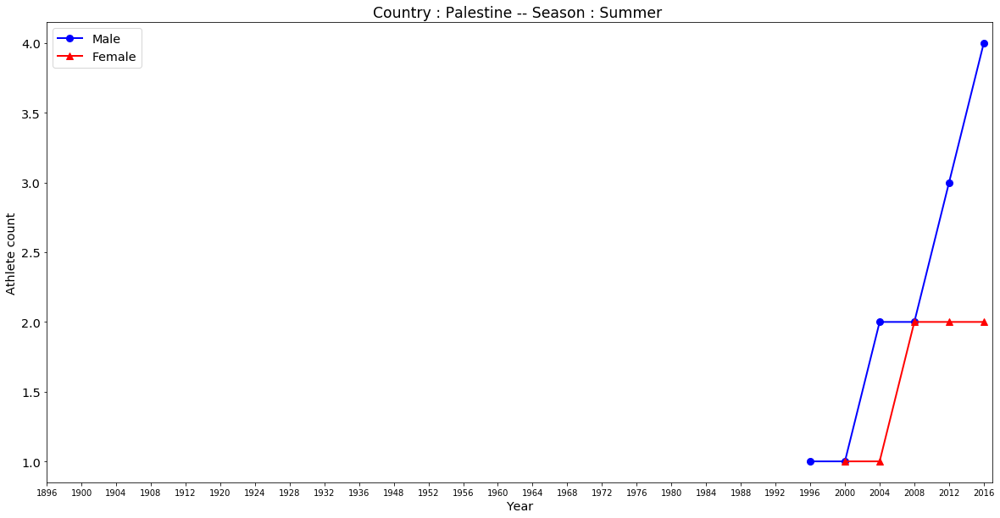

94


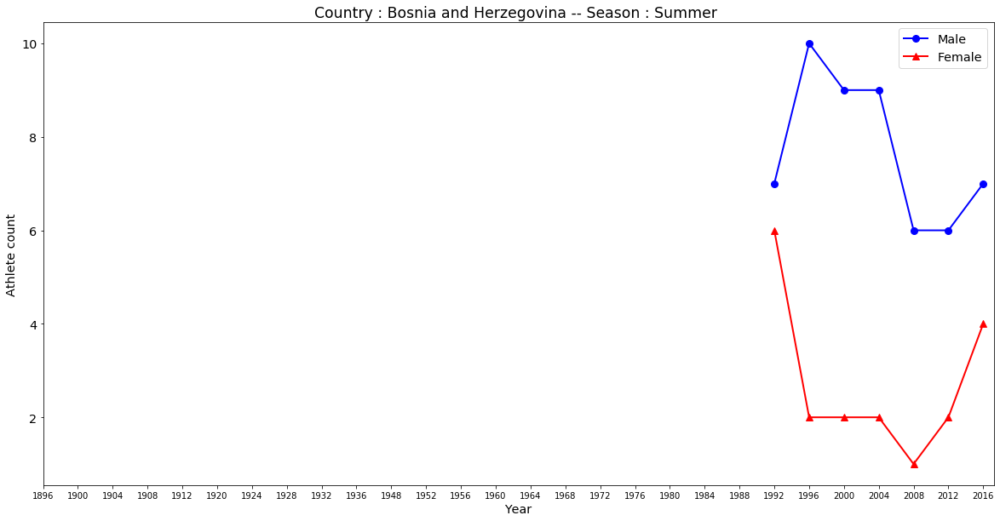

95


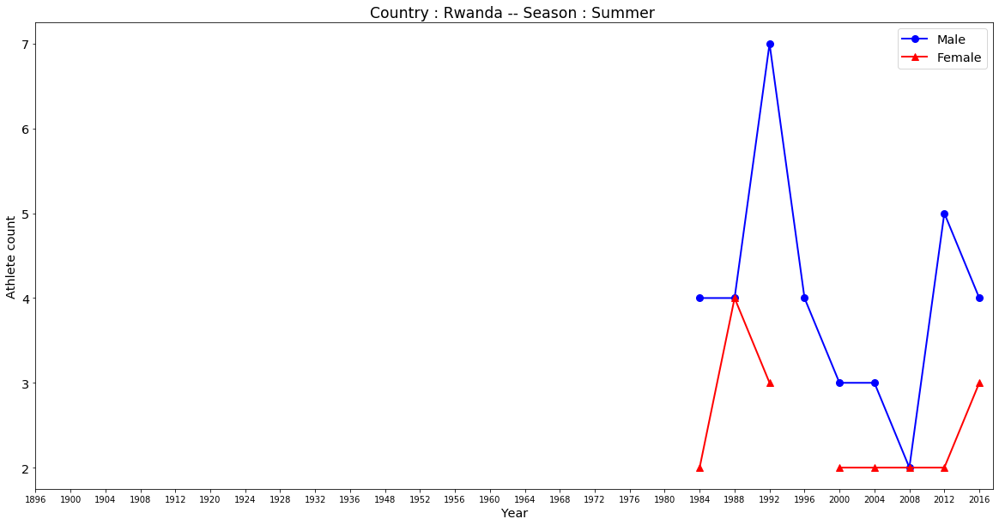

96


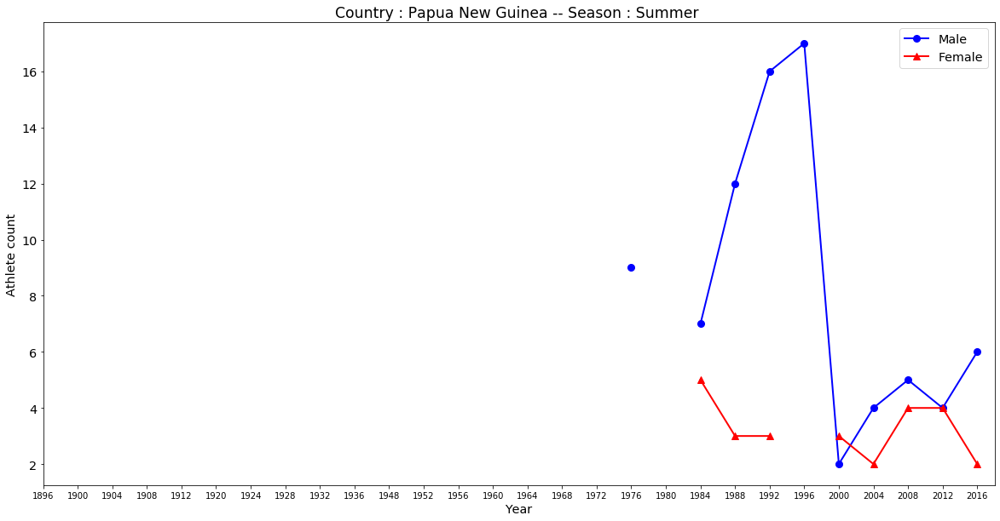

97


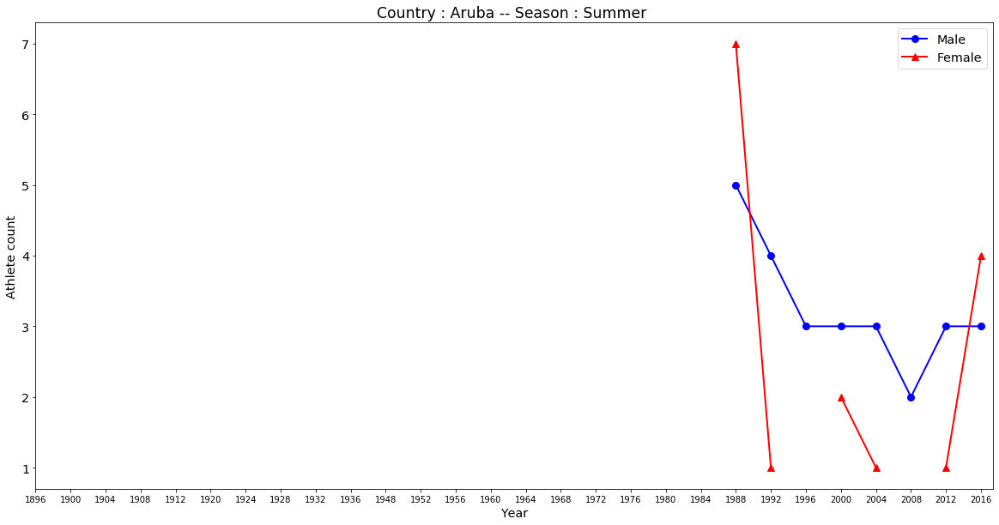

98


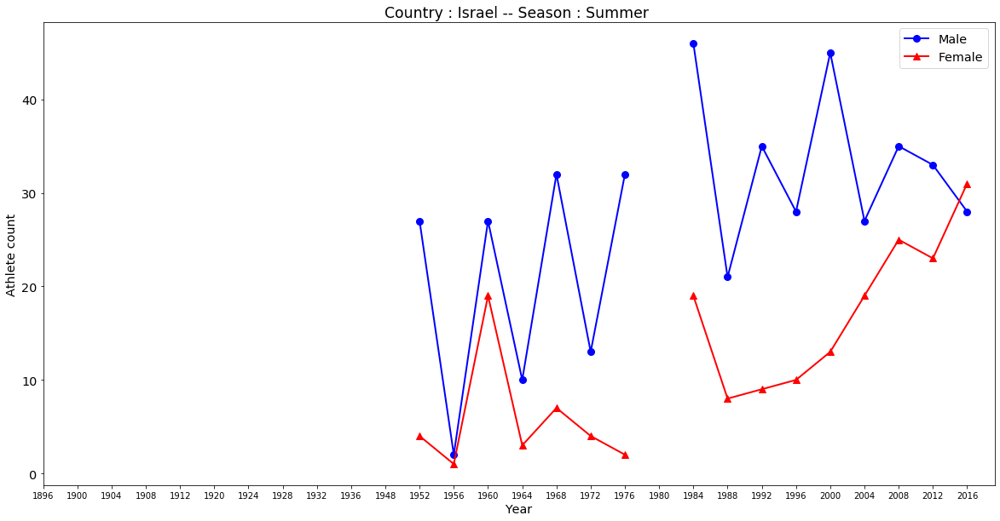

99


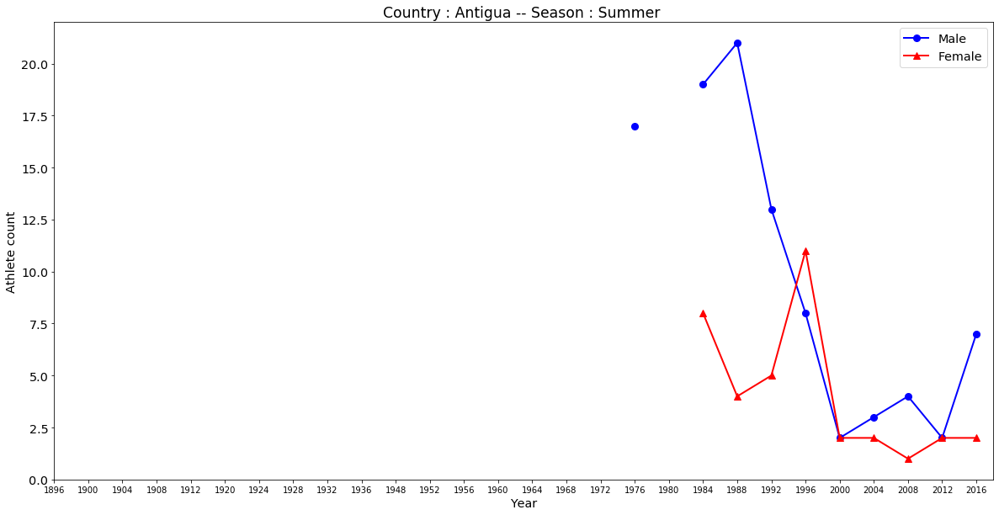

100


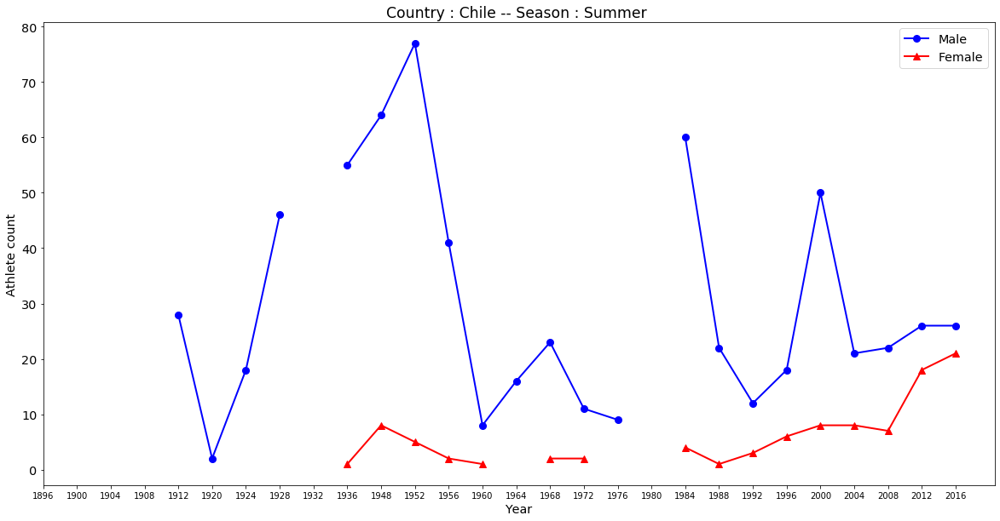

101


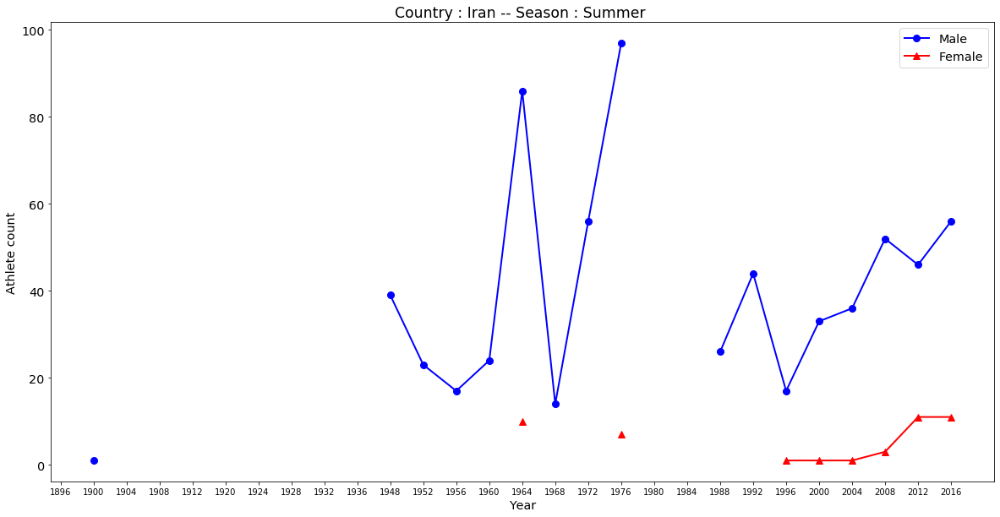

102


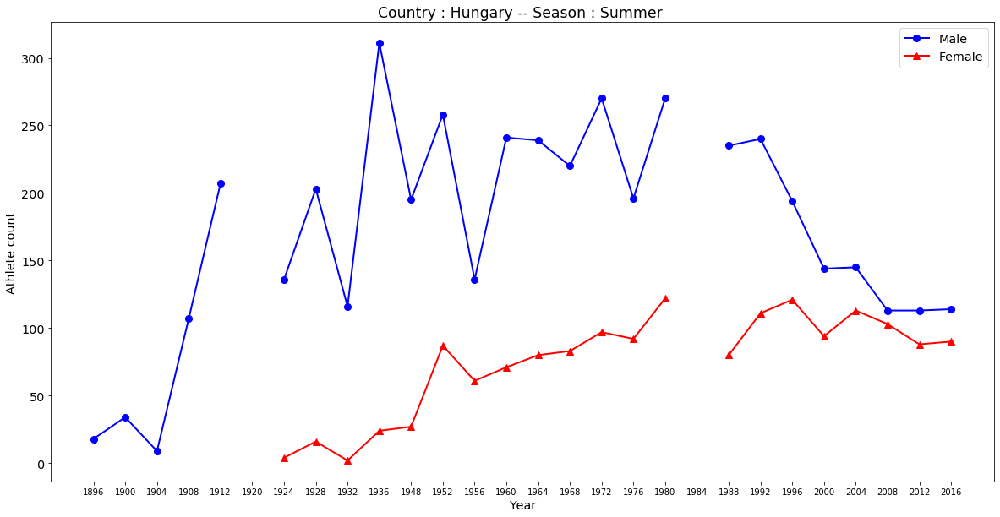

103


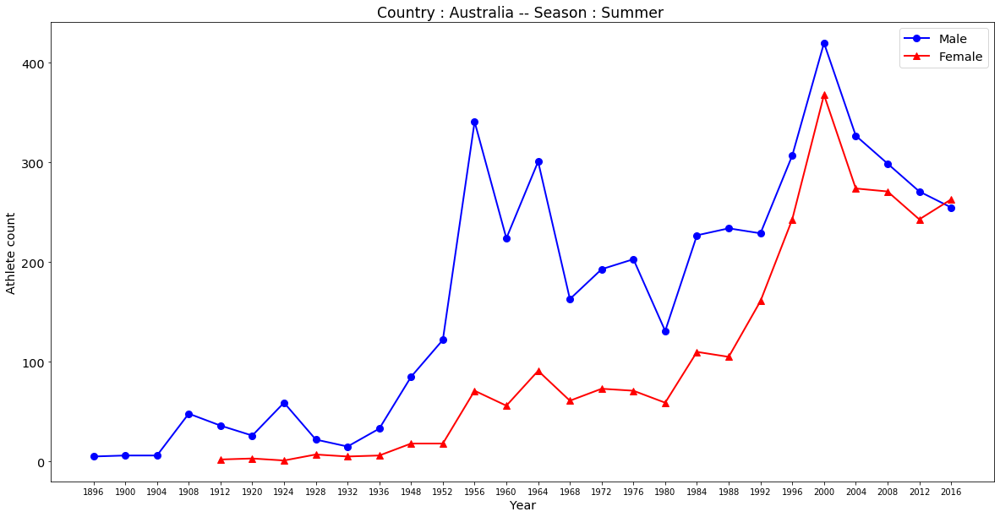

104


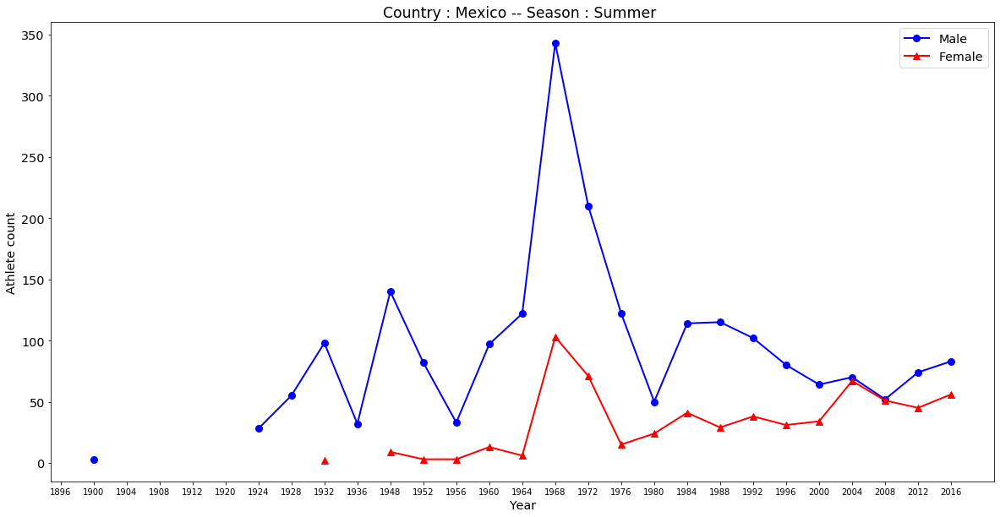

105


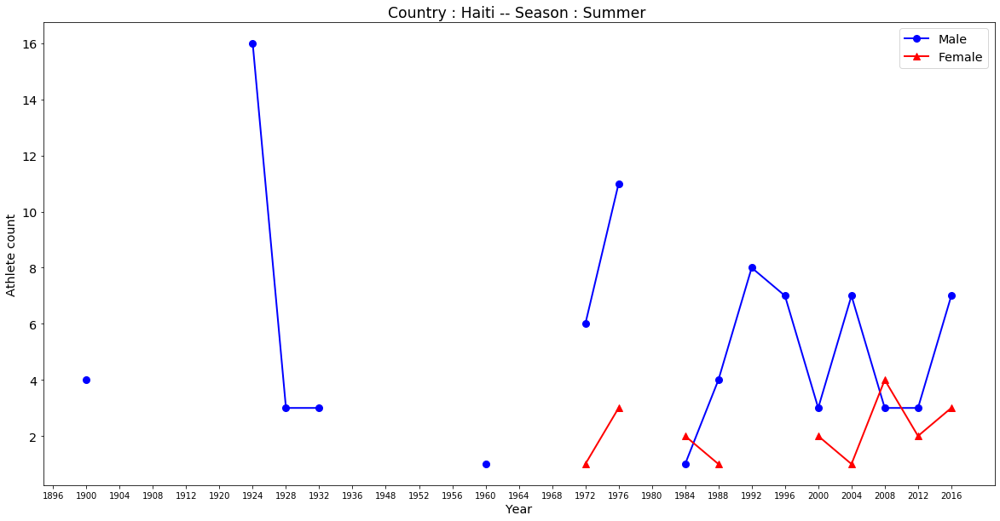

106


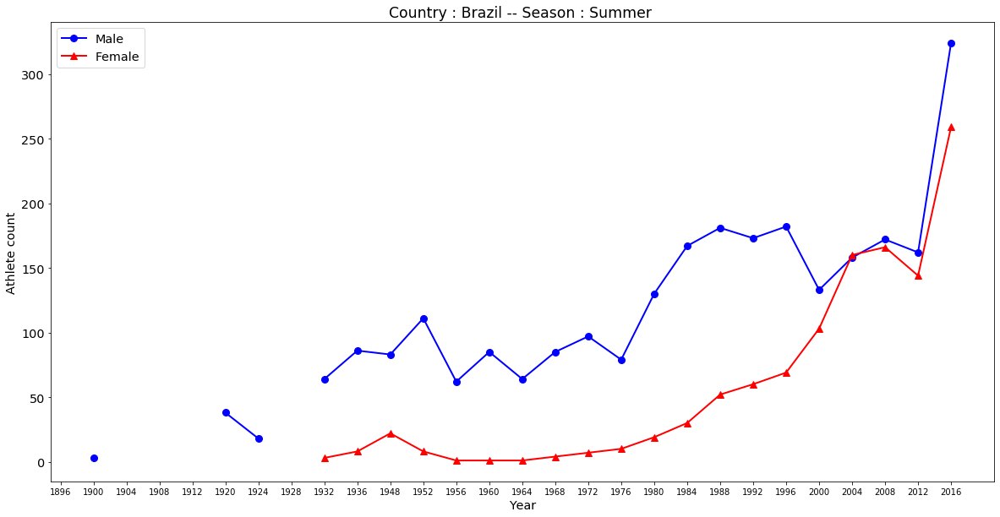

107


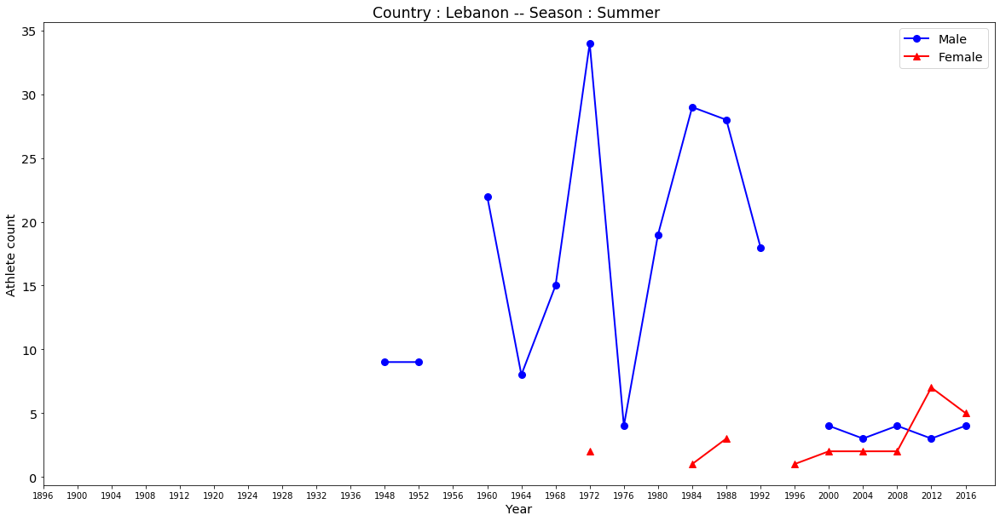

108


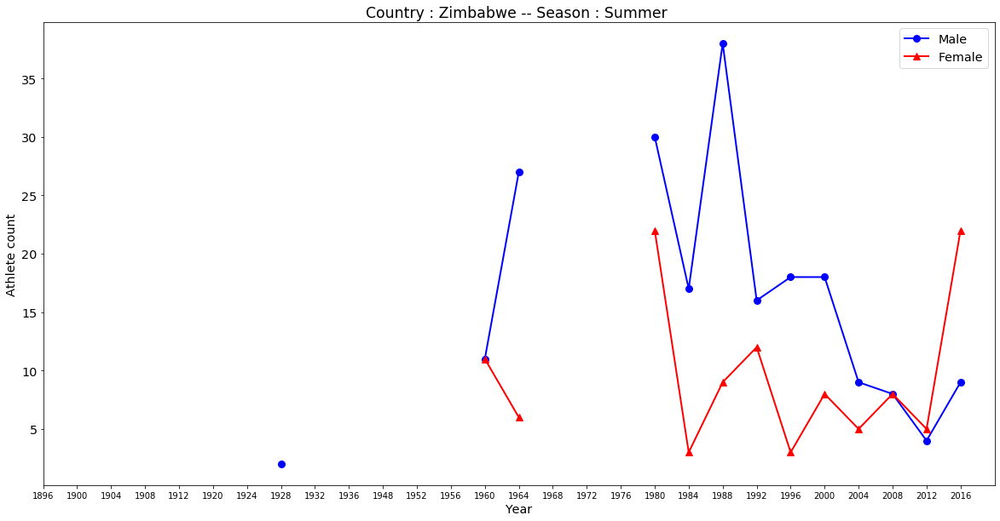

109


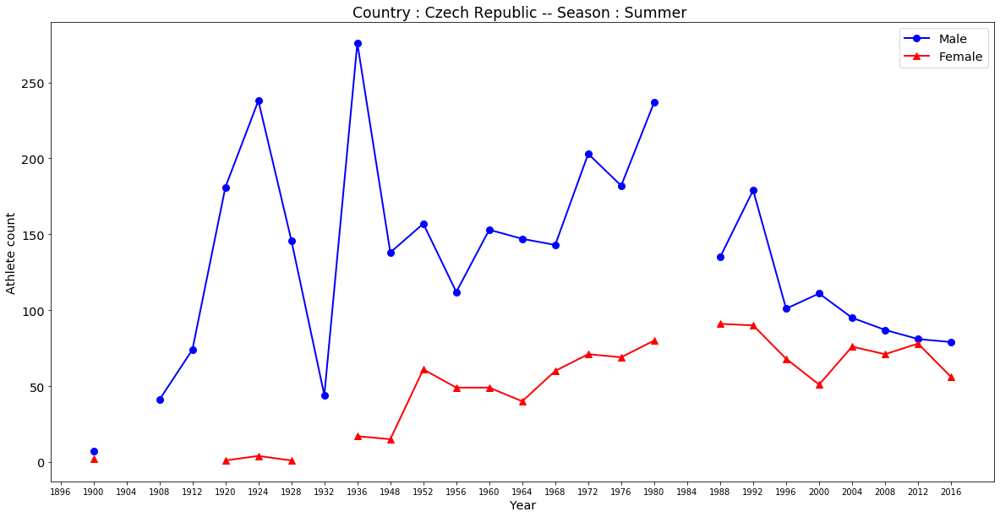

110


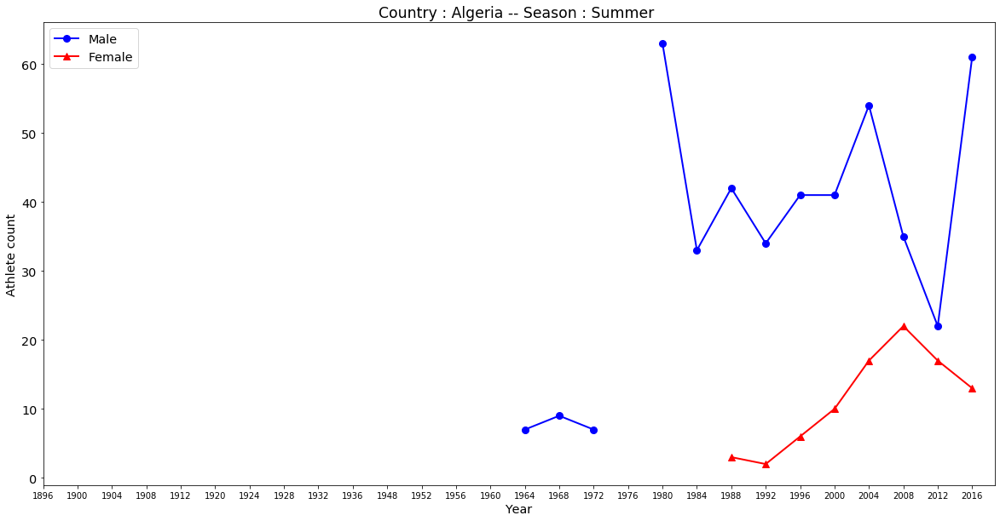

111


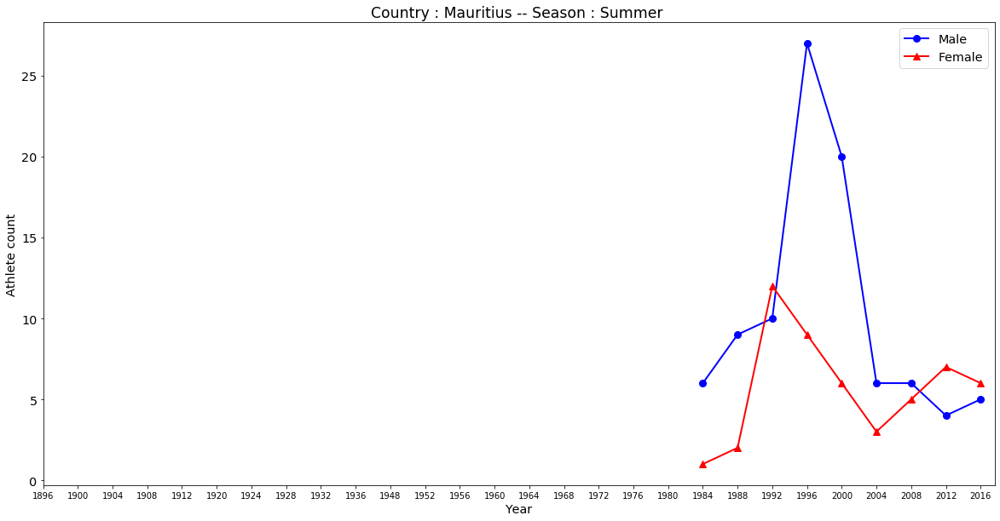

112


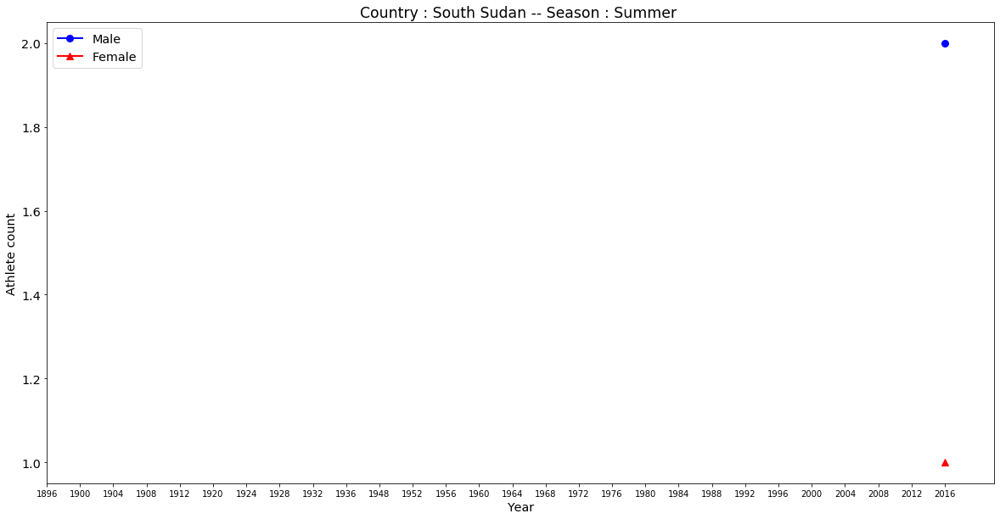

113


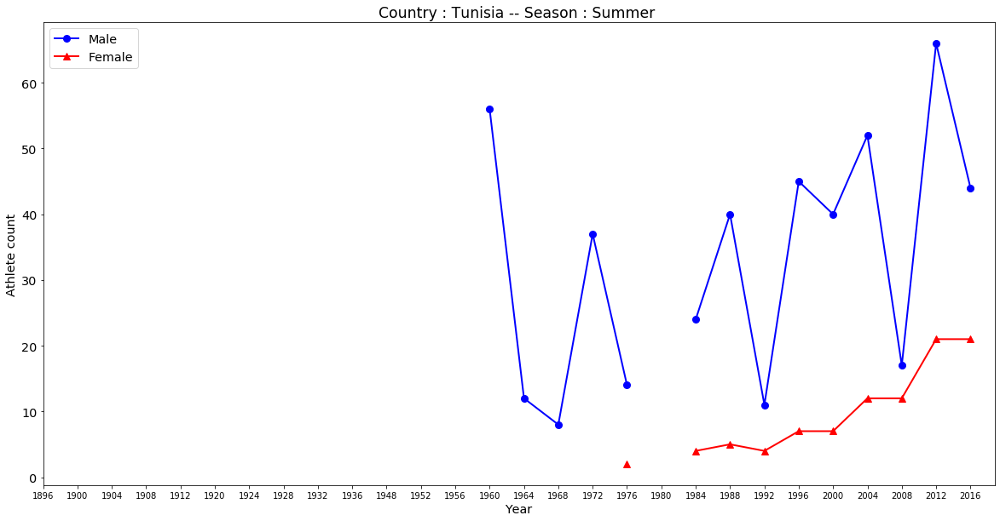

114


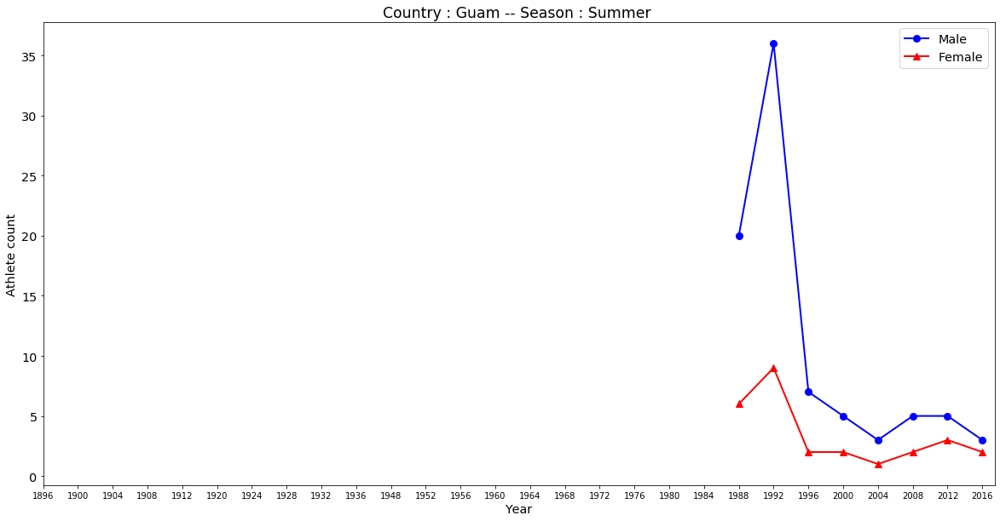

115


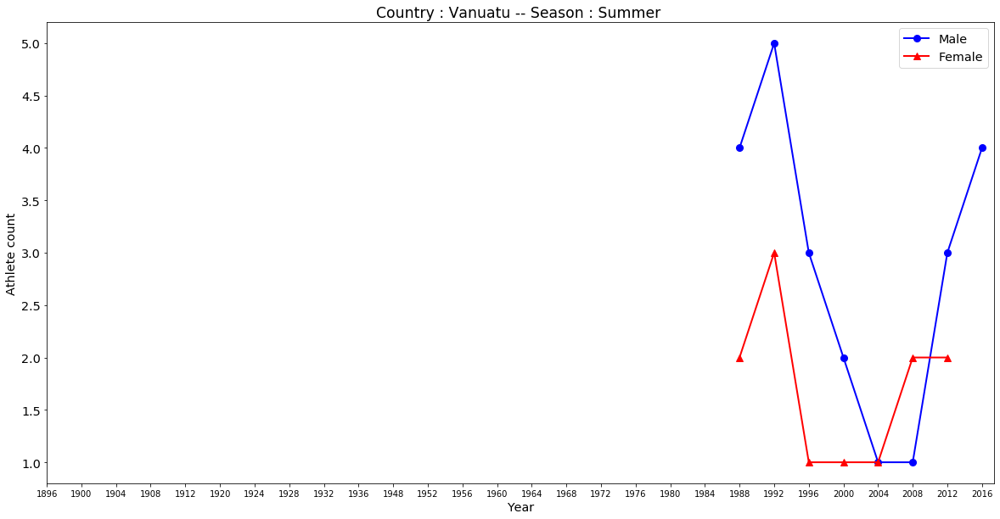

116


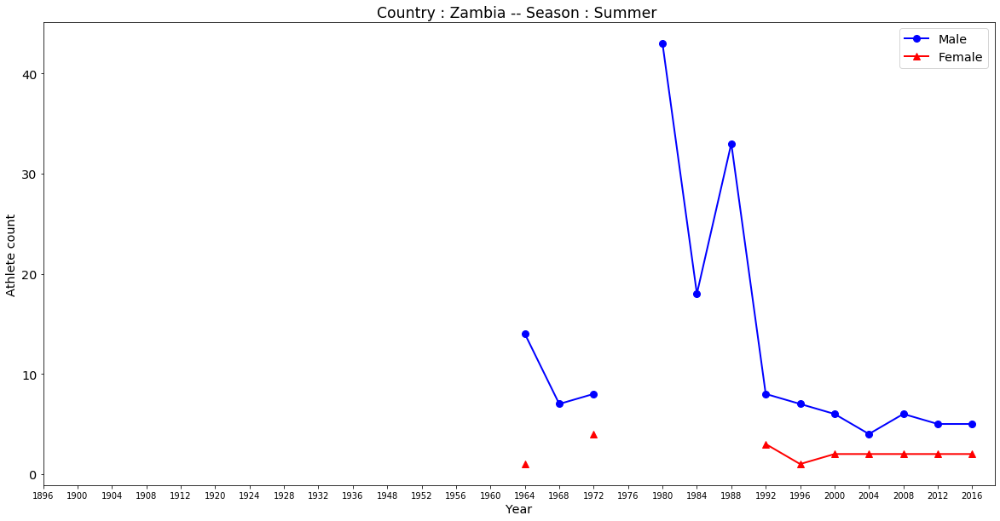

117


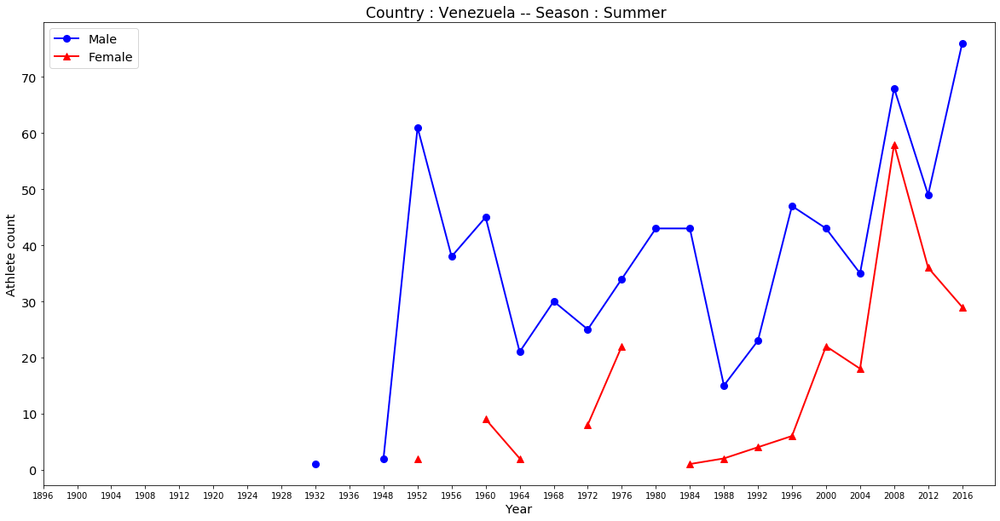

118


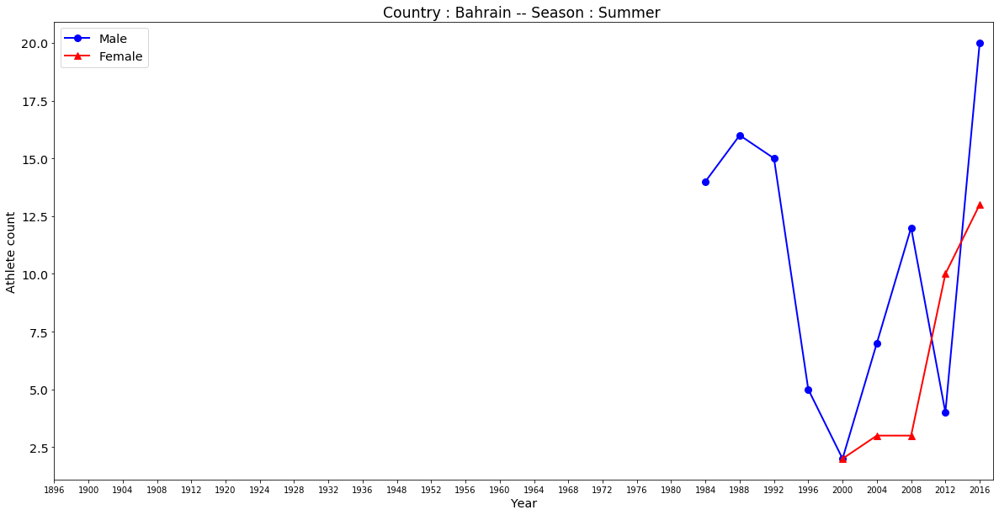

119


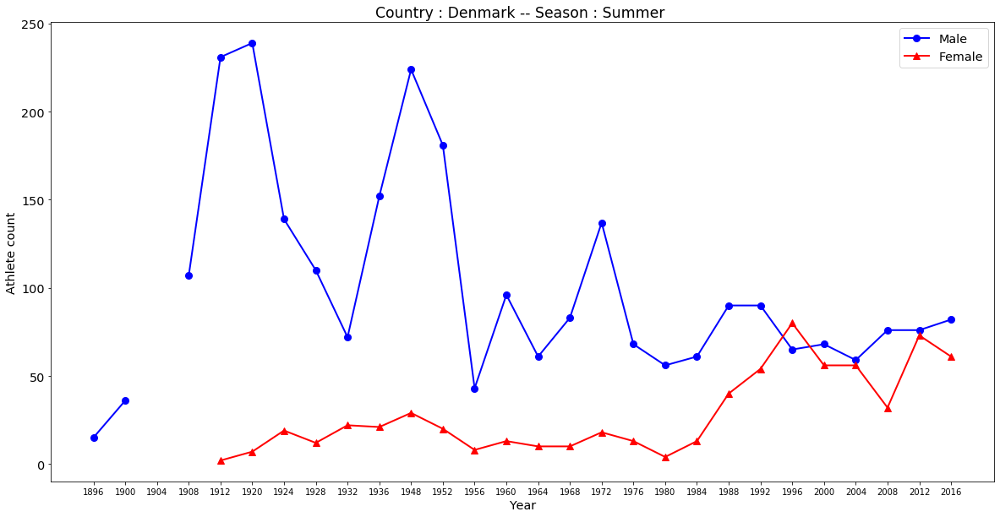

120


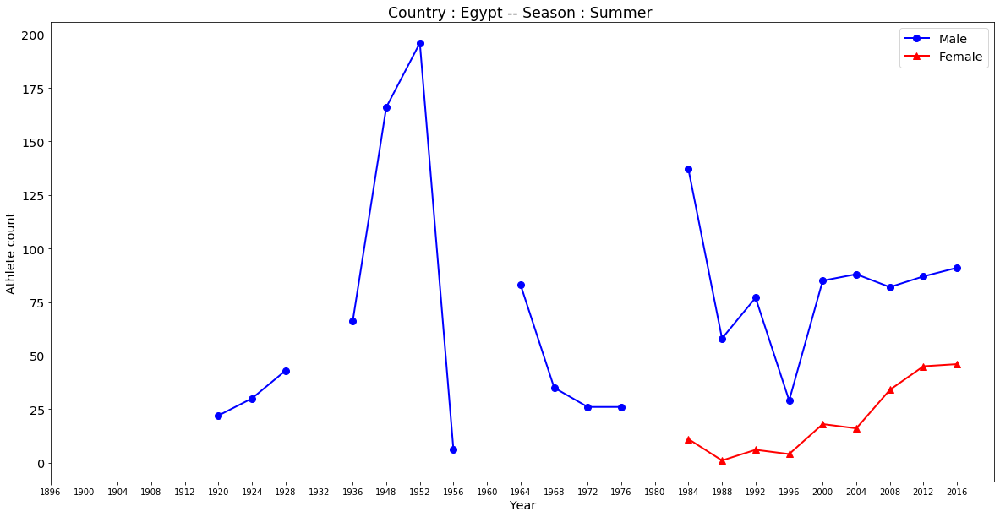

121


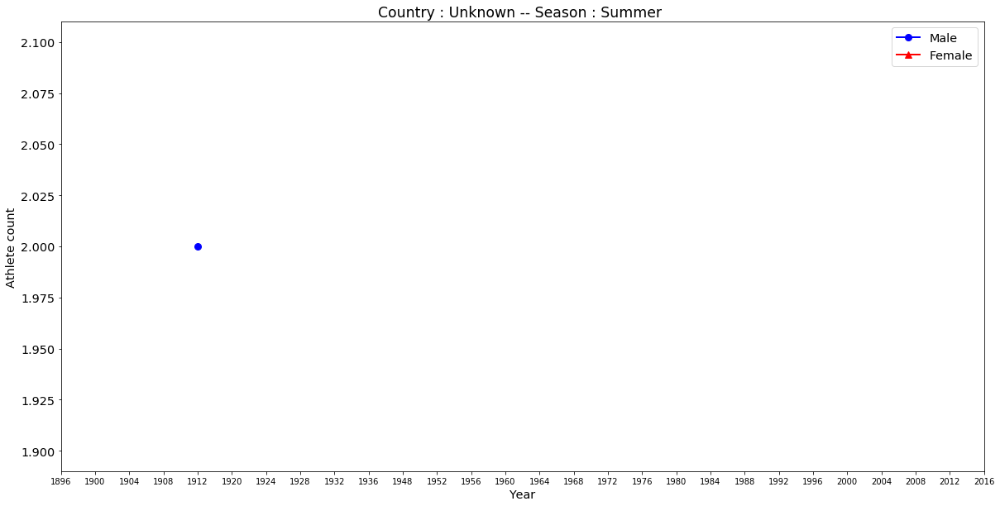

122


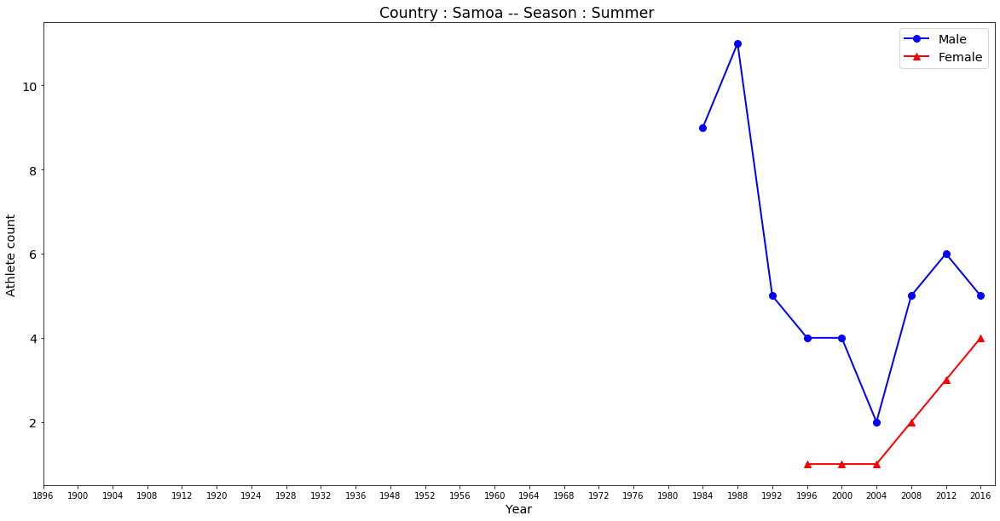

123


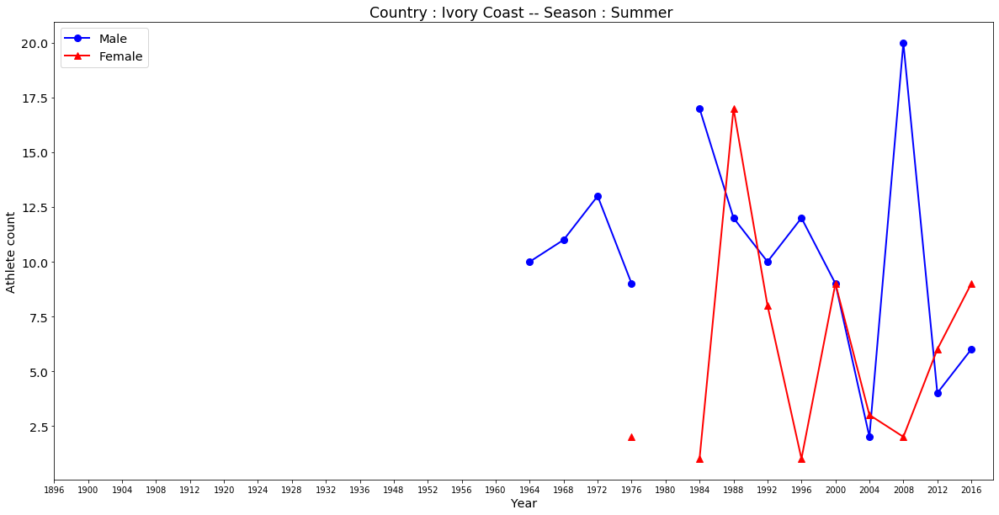

124


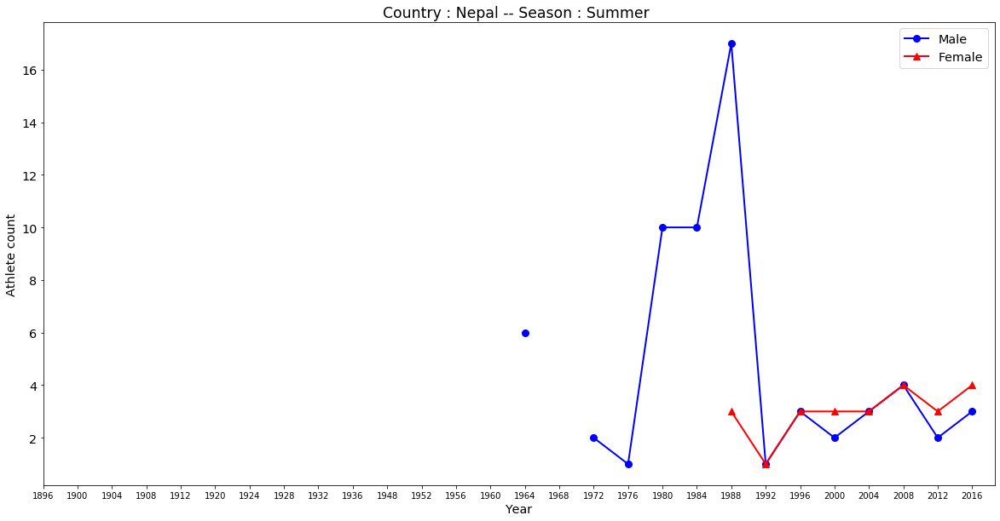

125


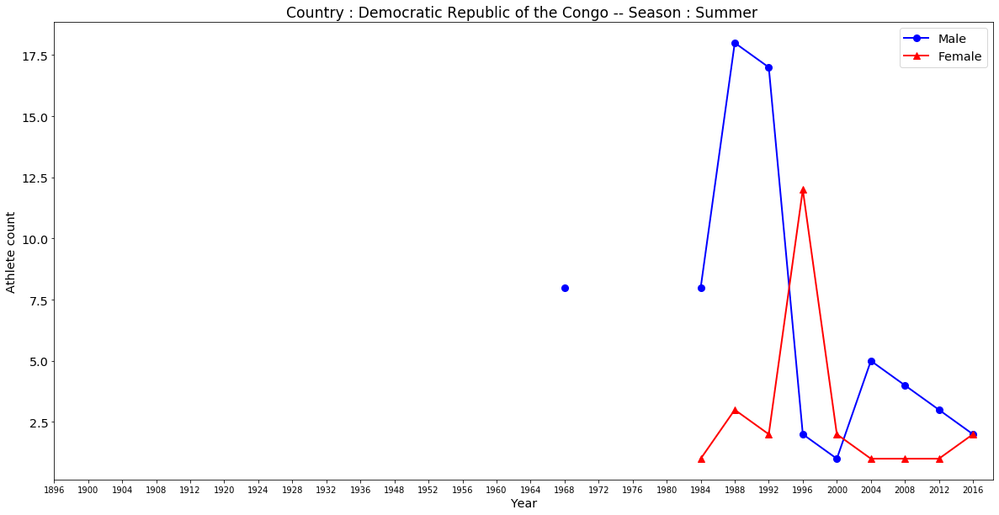

126


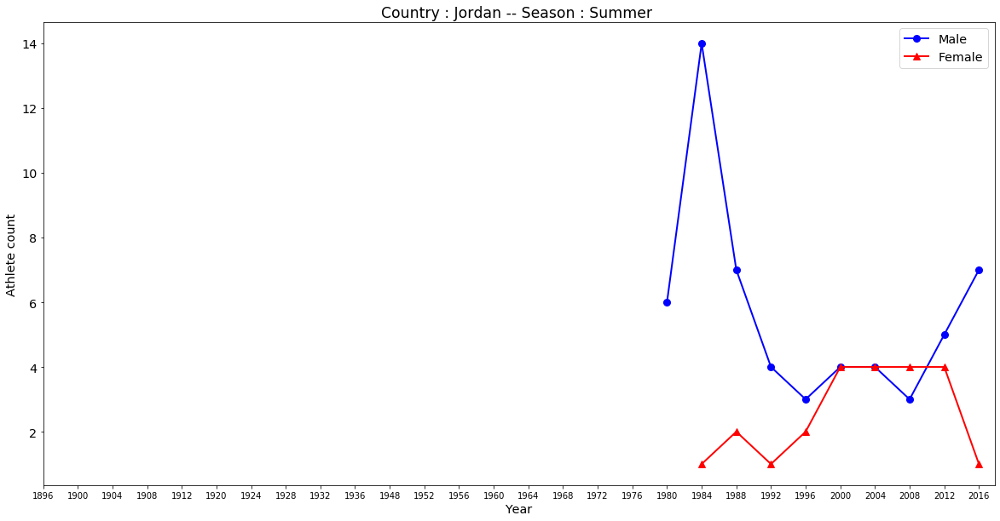

127


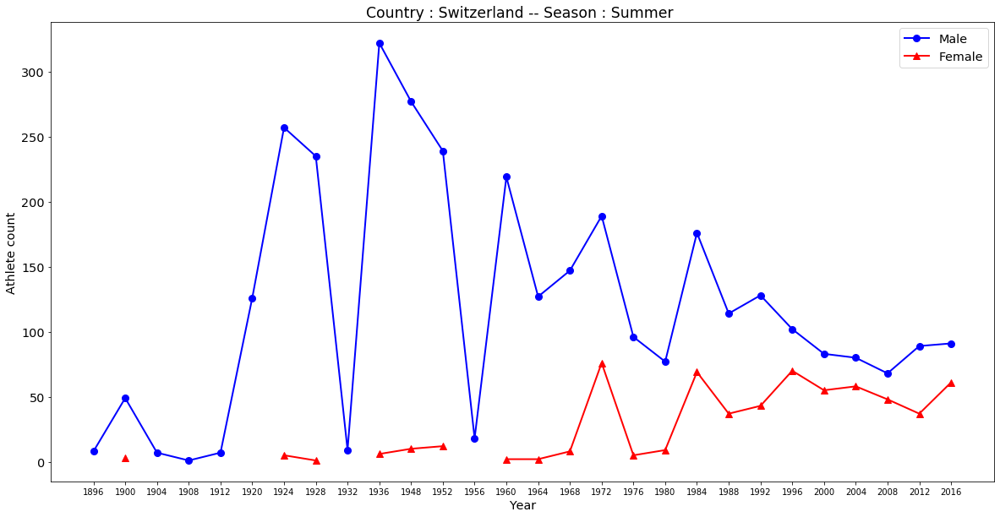

128


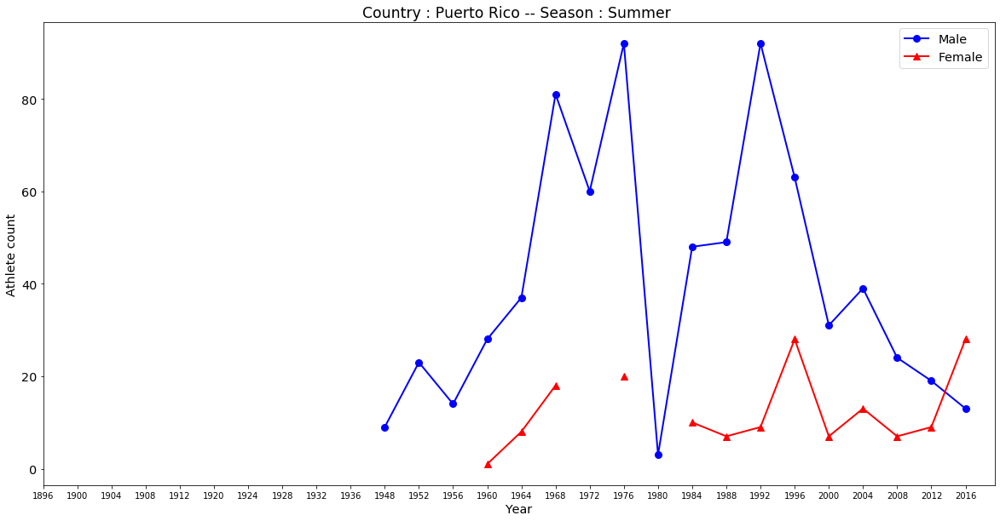

129


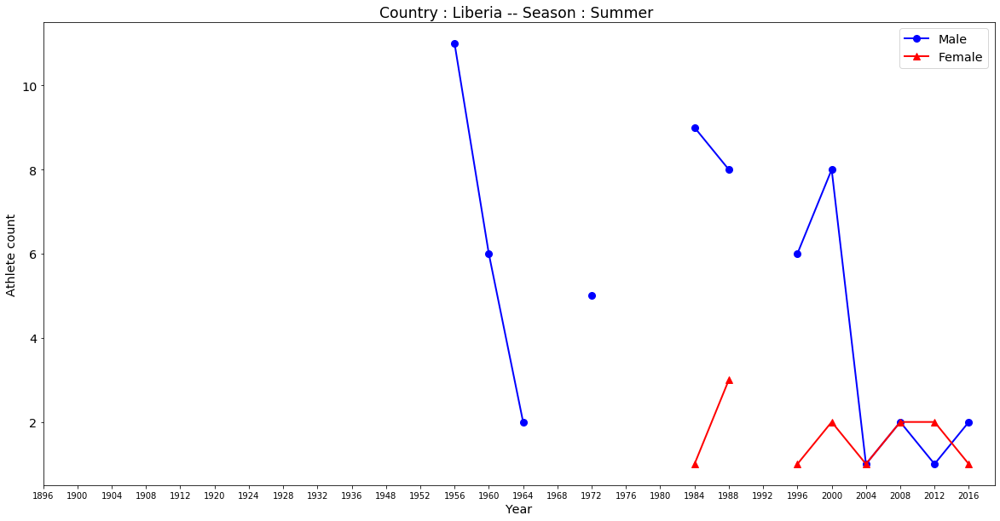

130


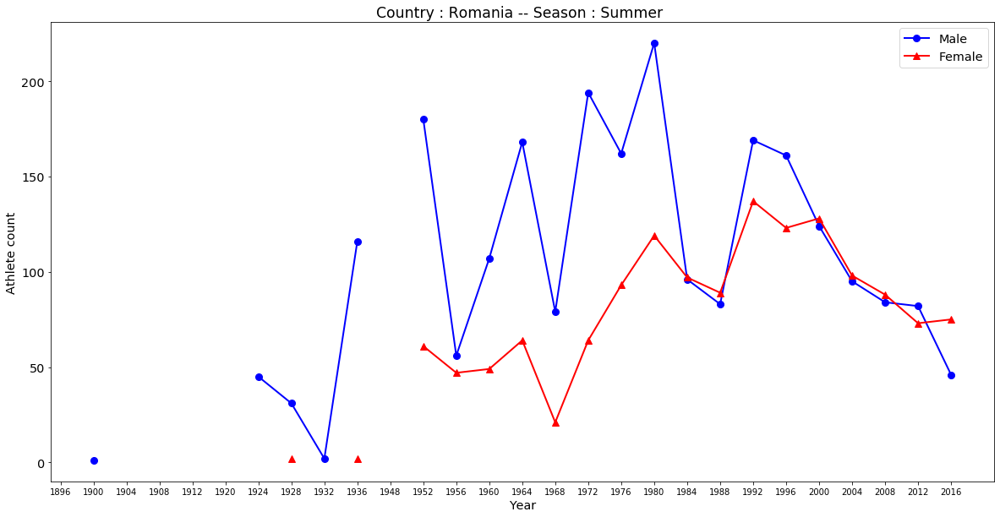

131


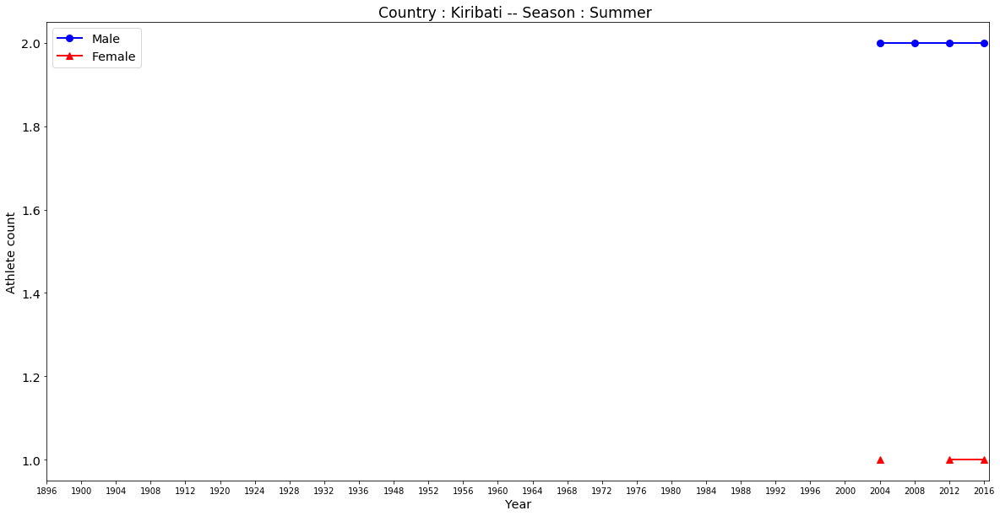

132


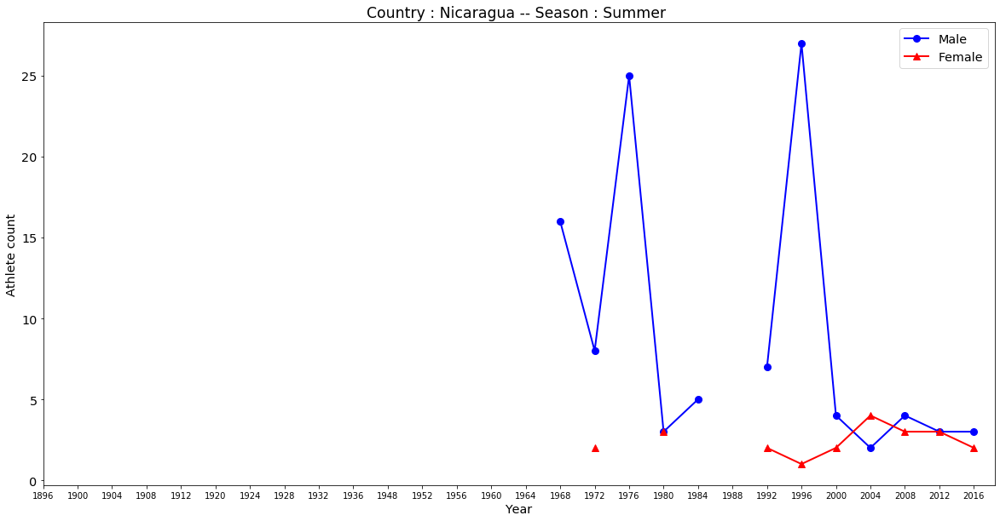

133


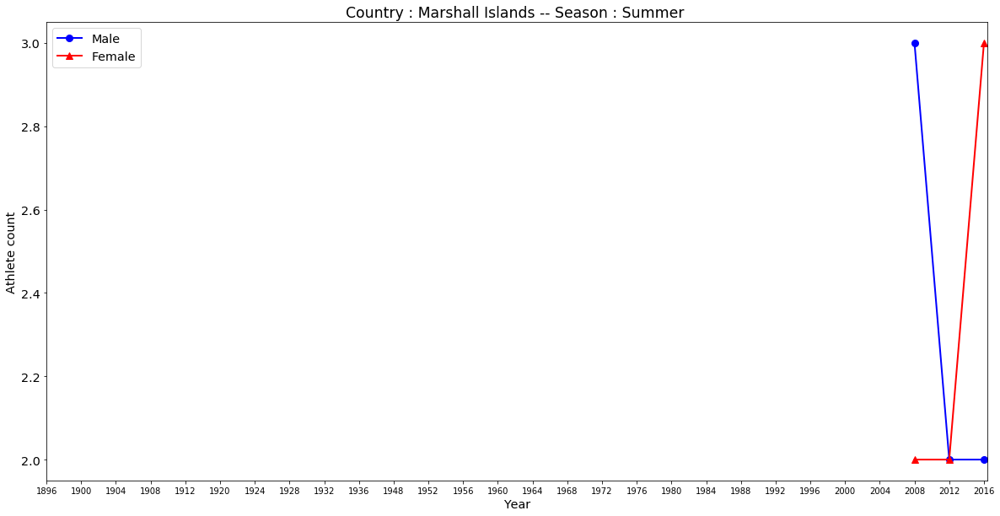

134


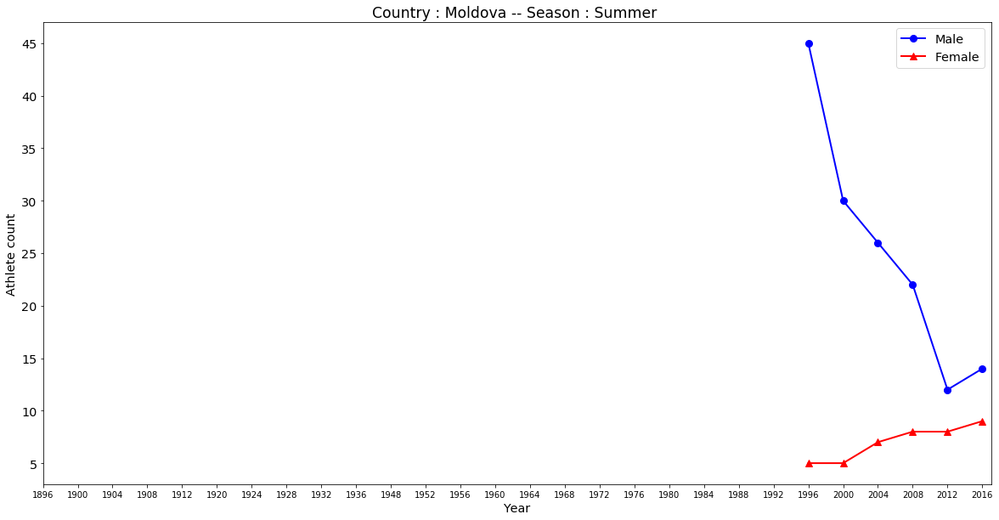

135


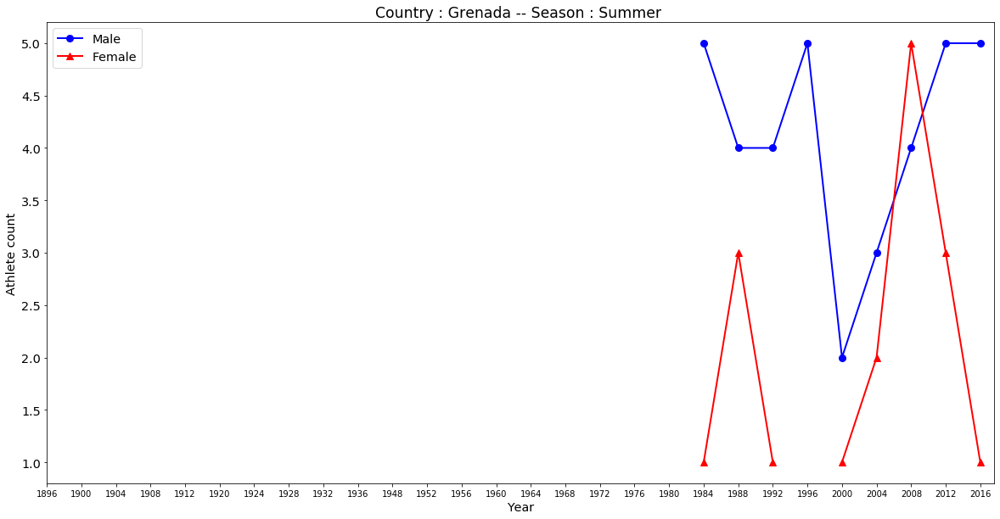

136


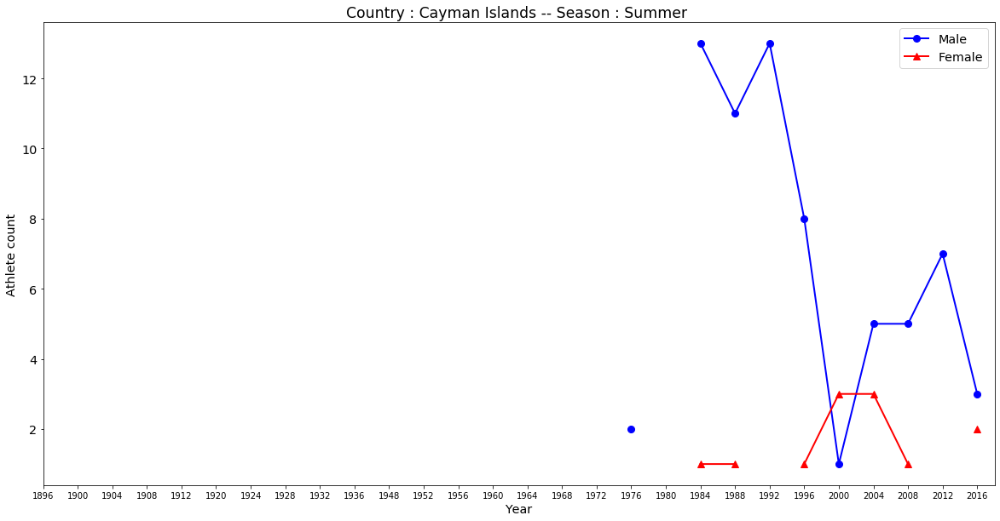

137


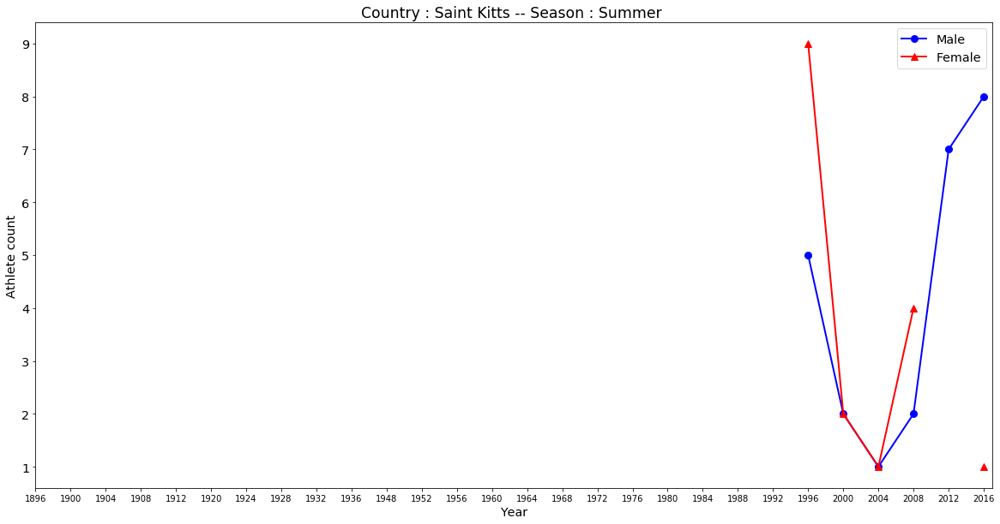

138


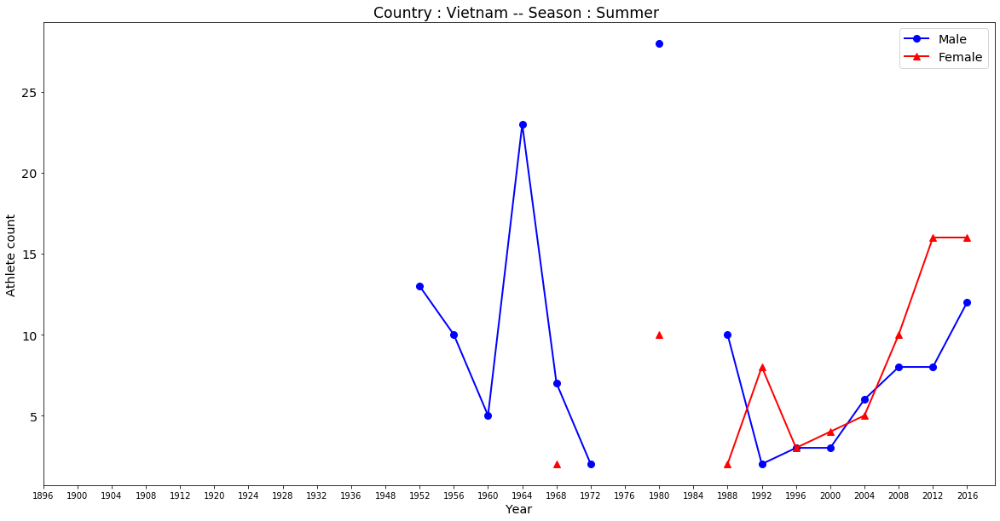

139


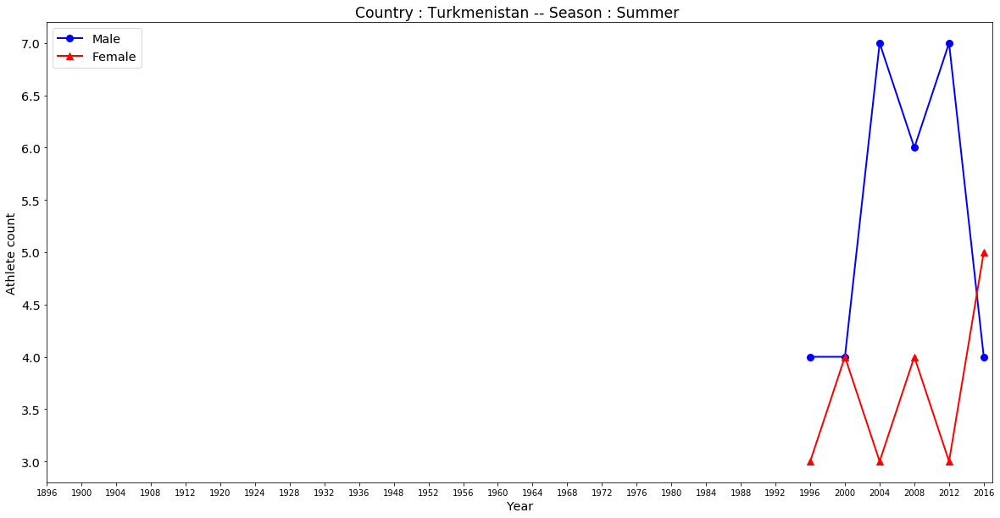

140


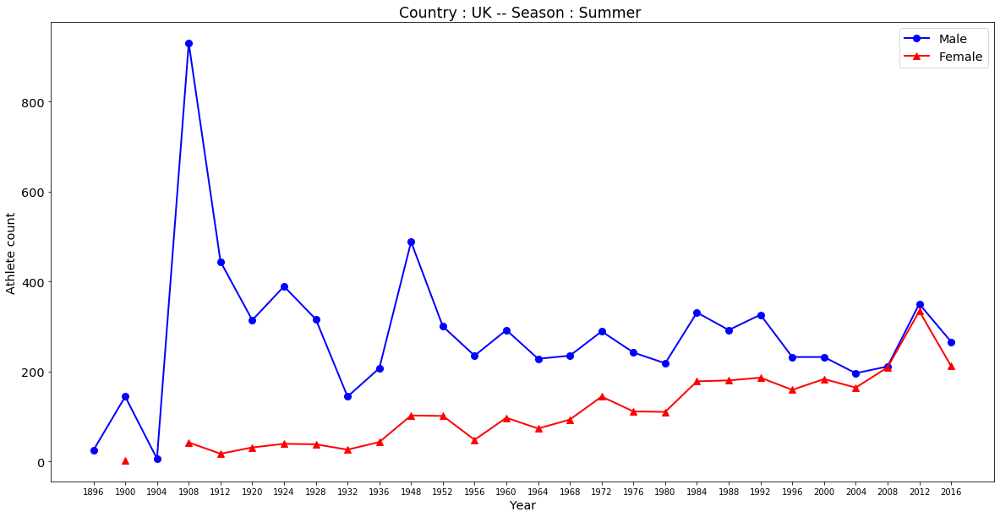

141


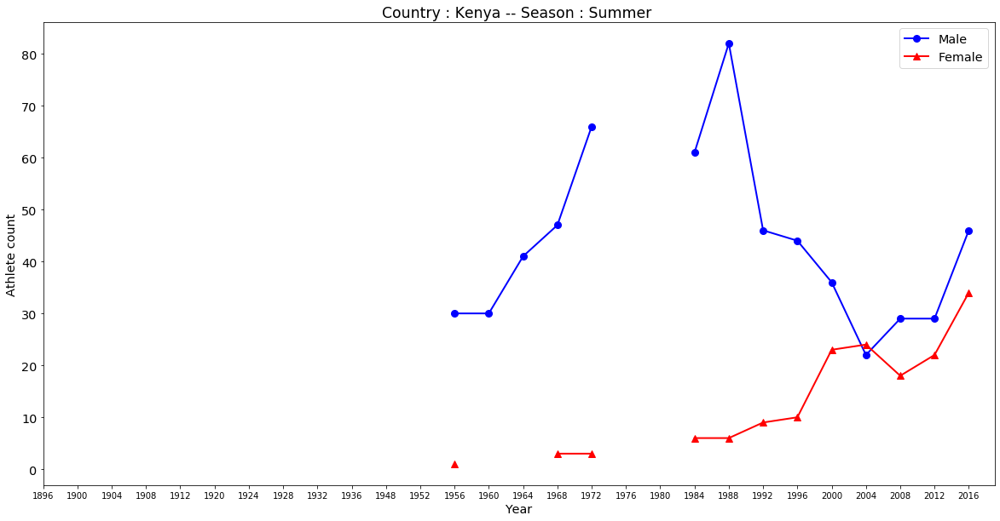

142


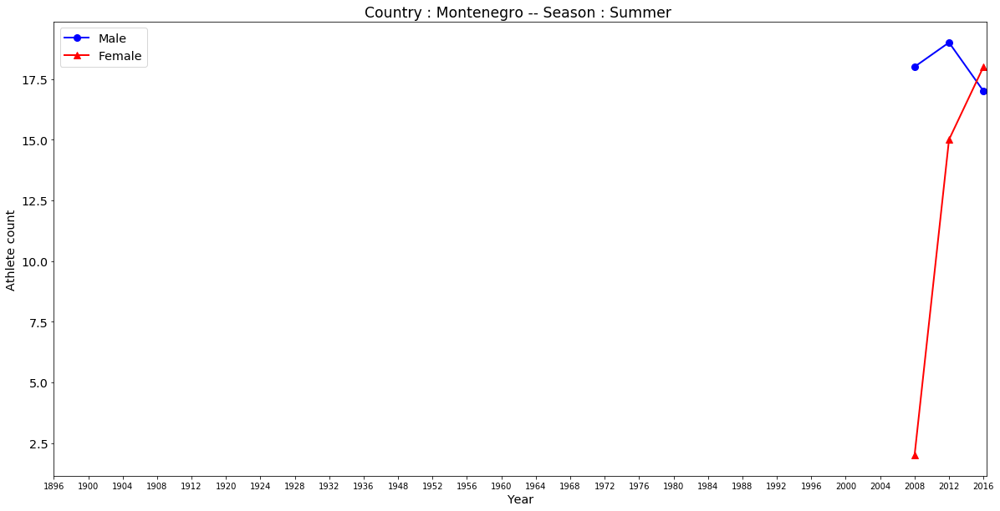

143


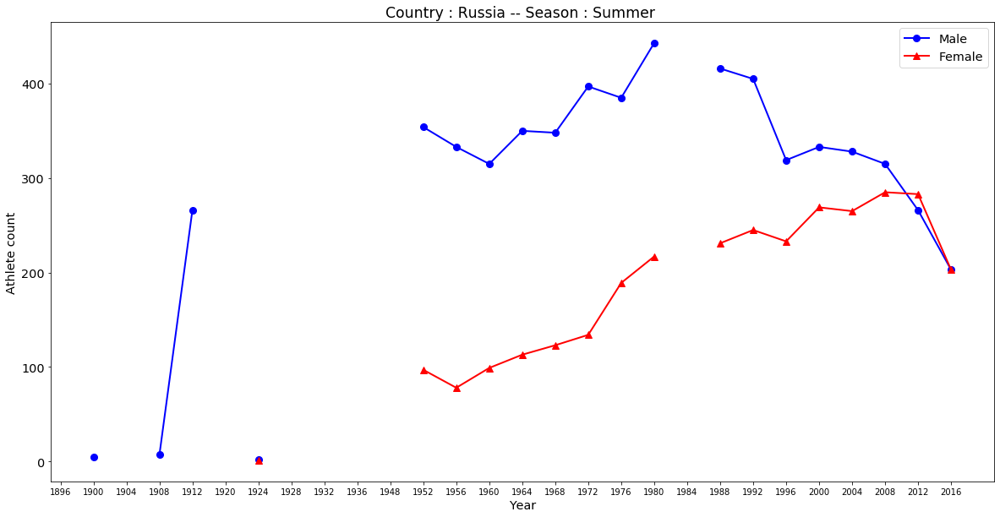

144


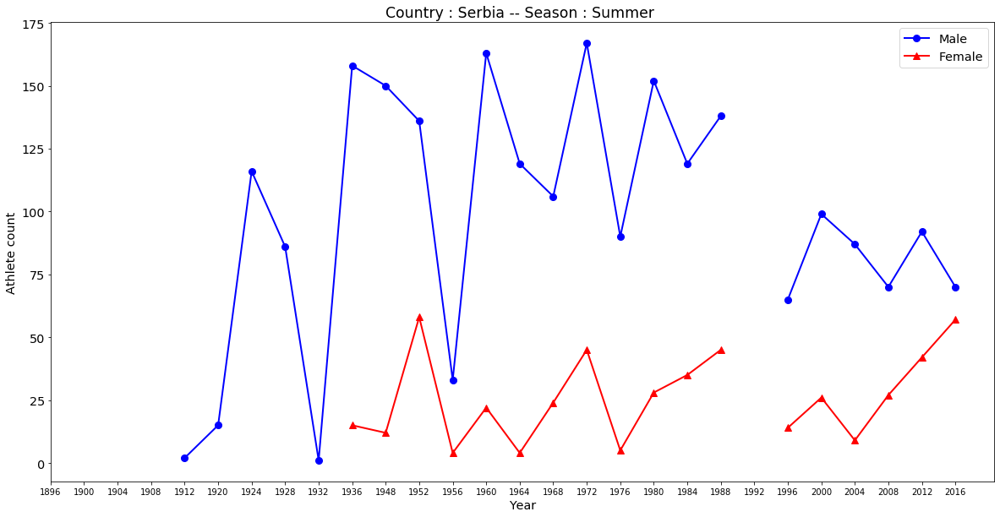

145


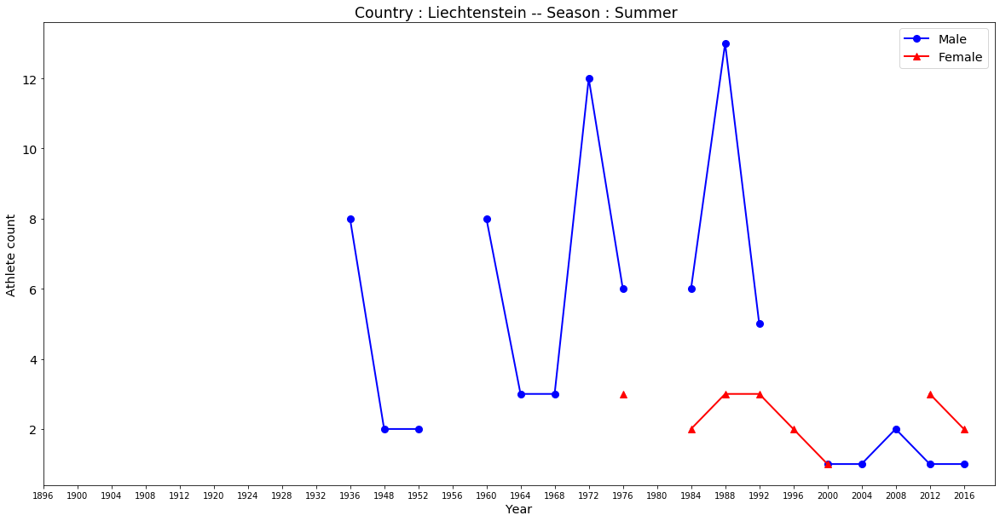

146


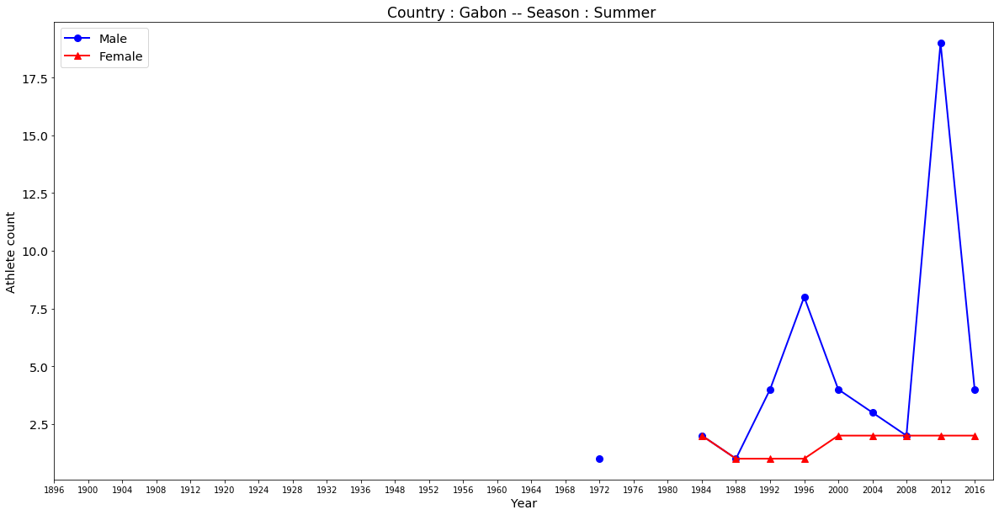

147


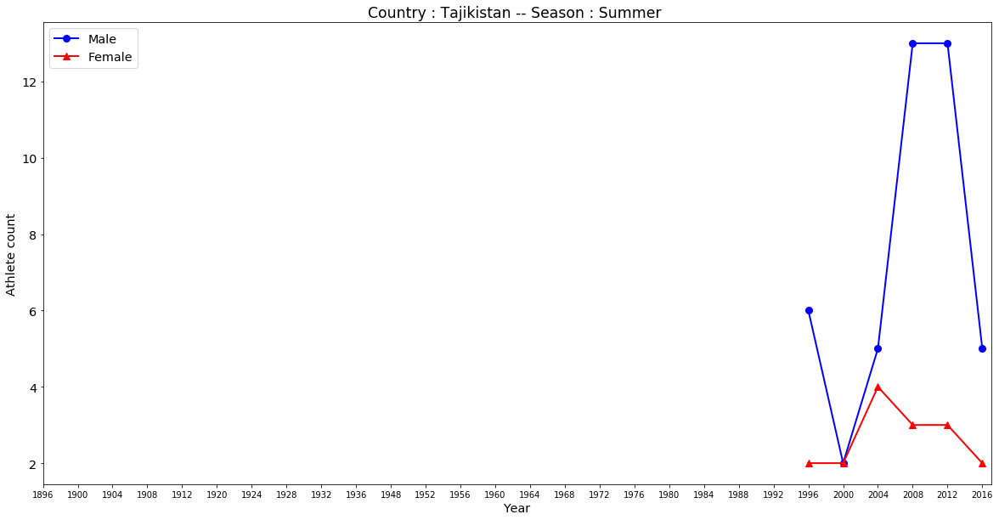

148


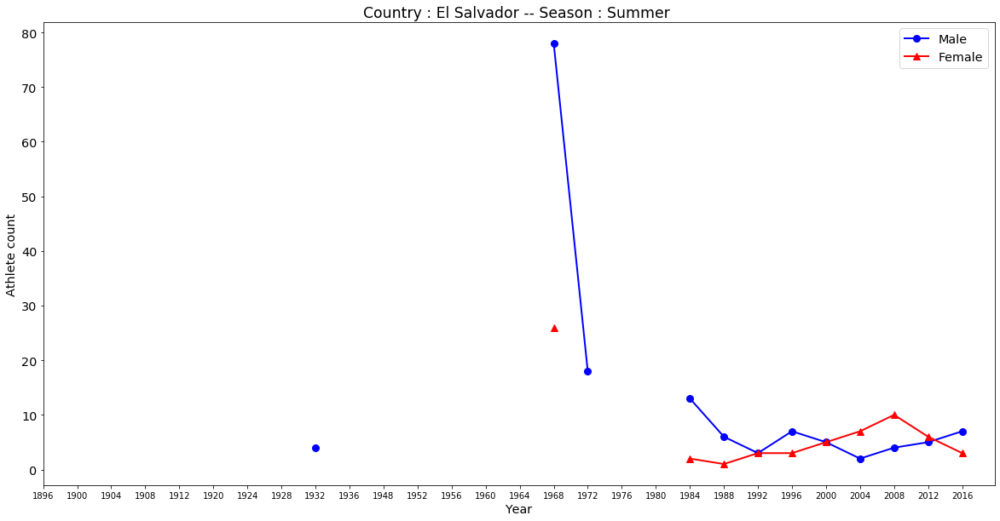

149


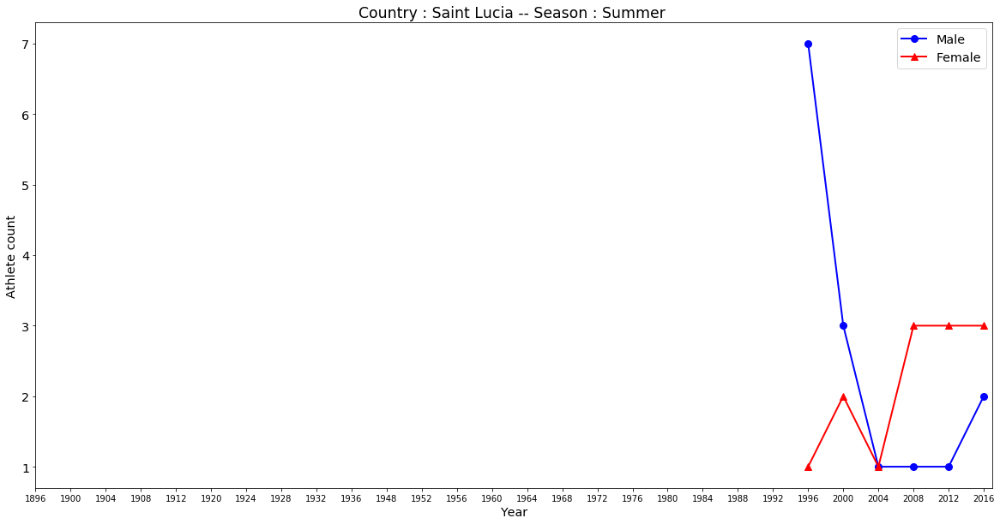

150


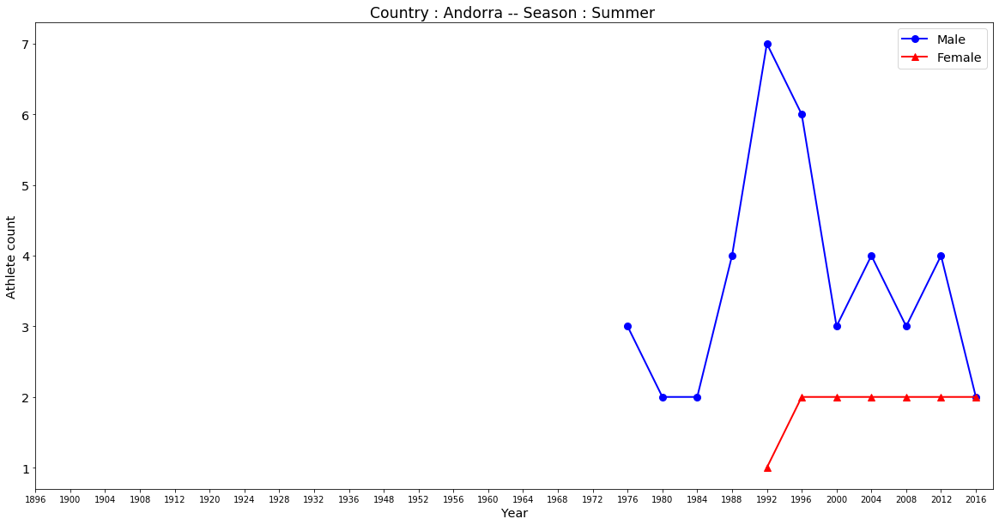

151


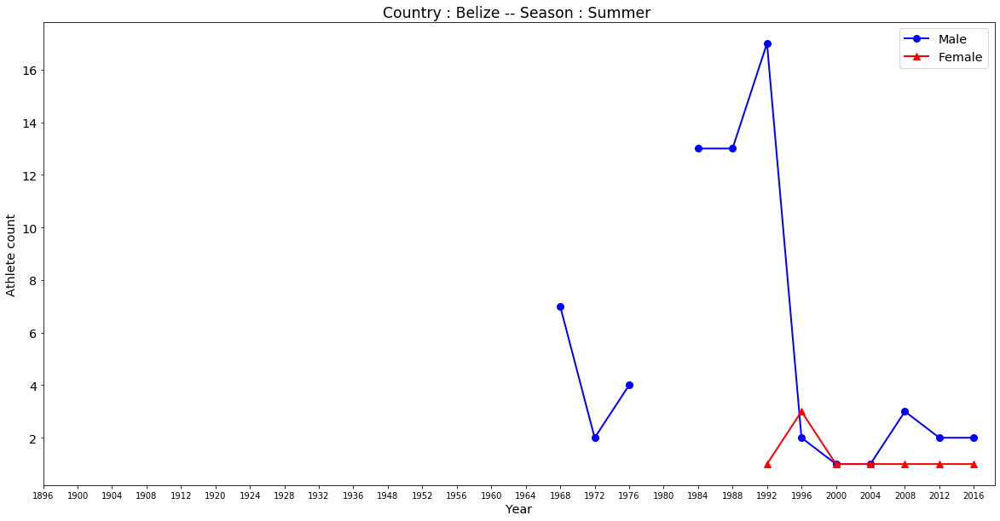

152


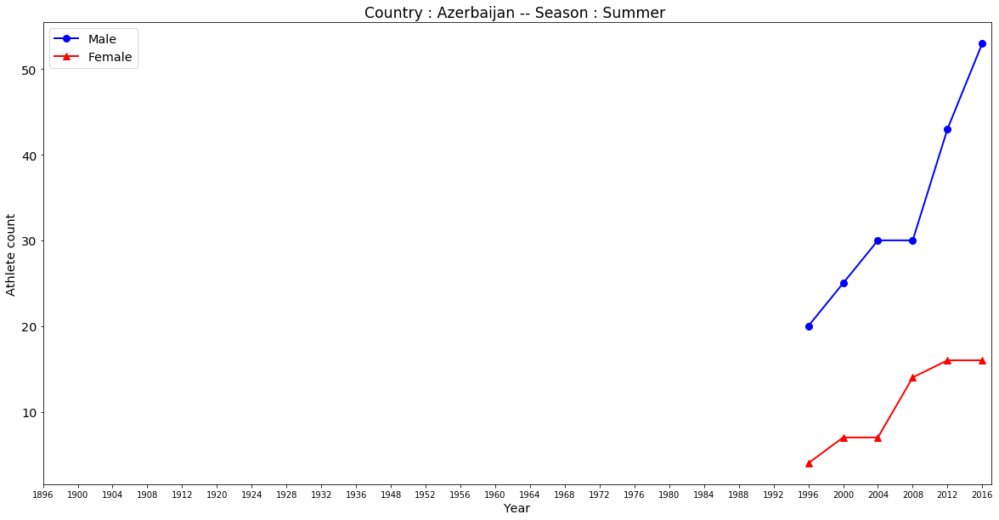

153


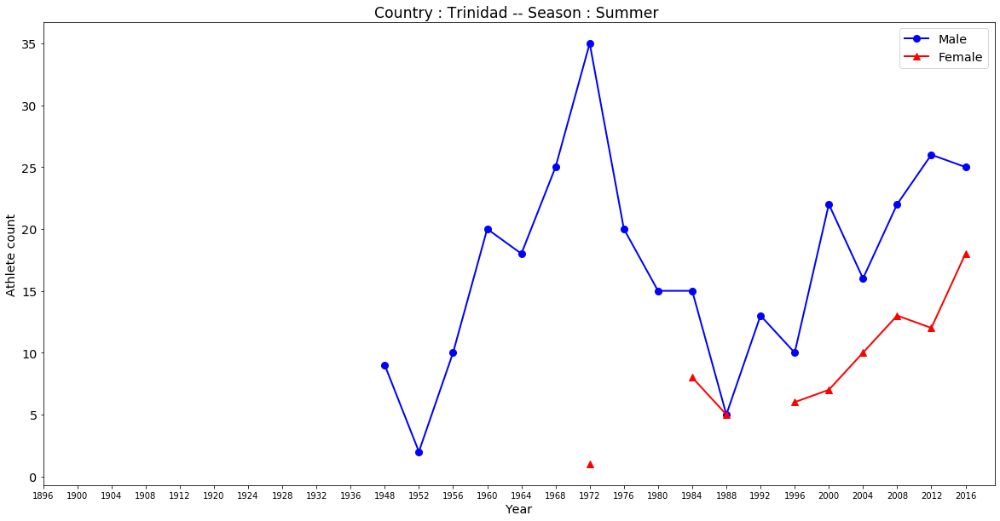

154


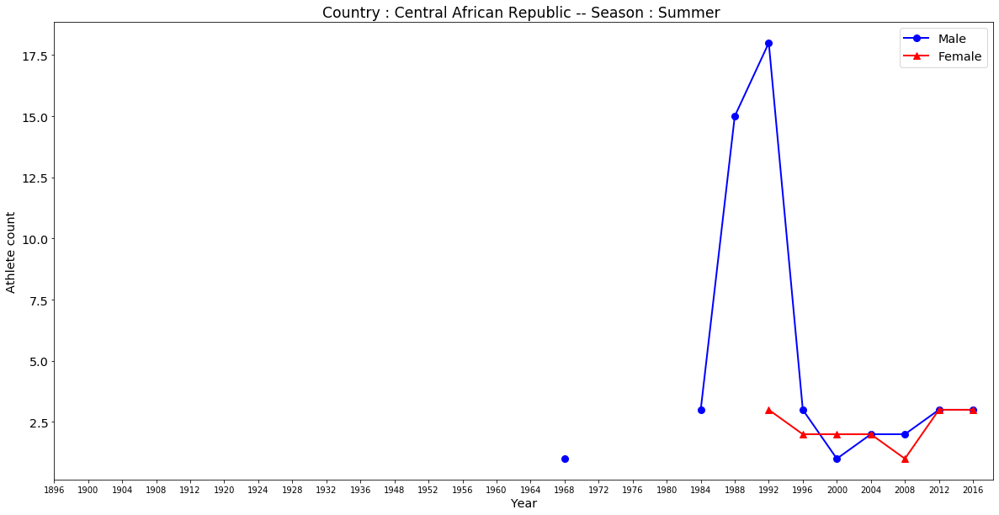

155


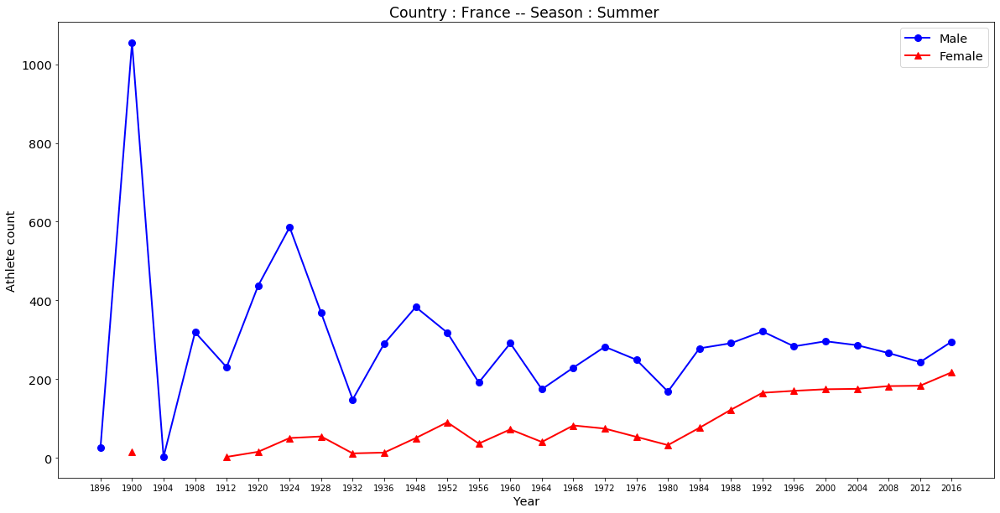

156


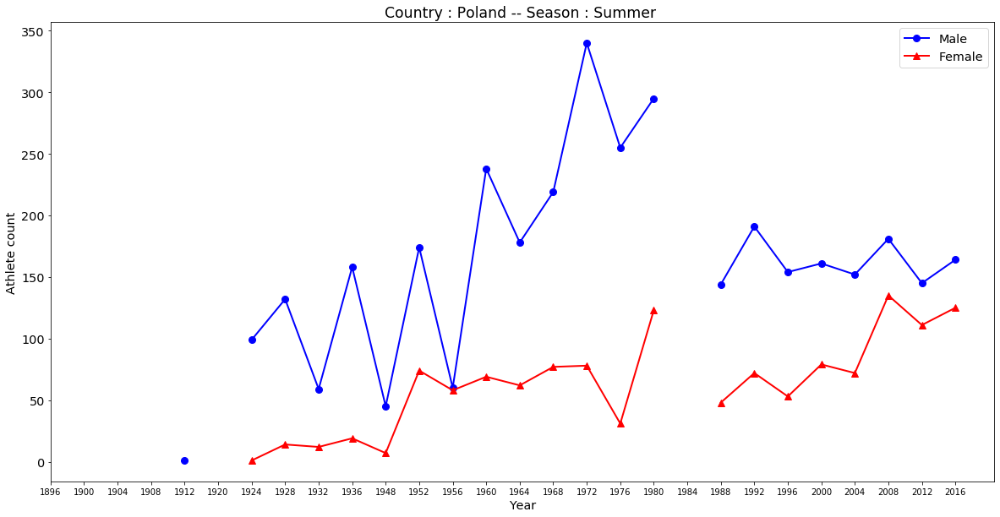

157


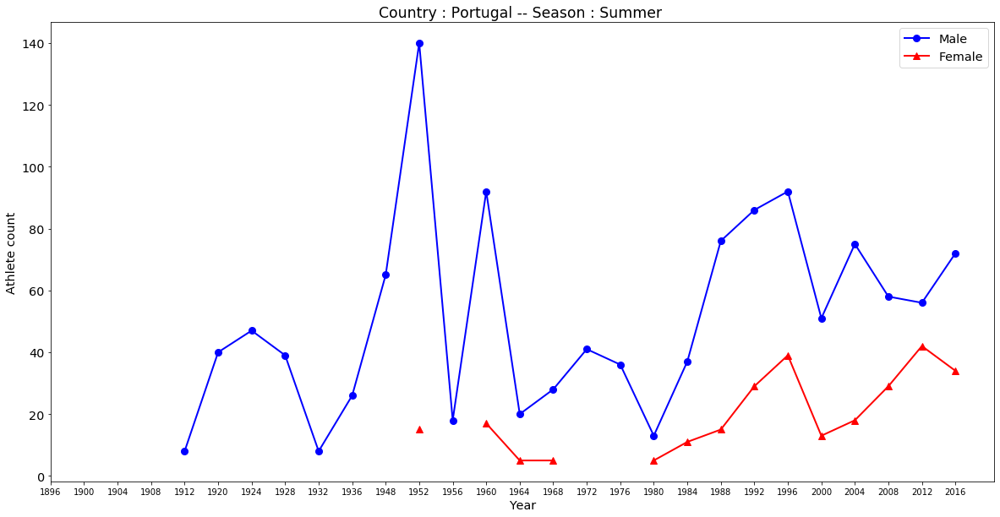

158


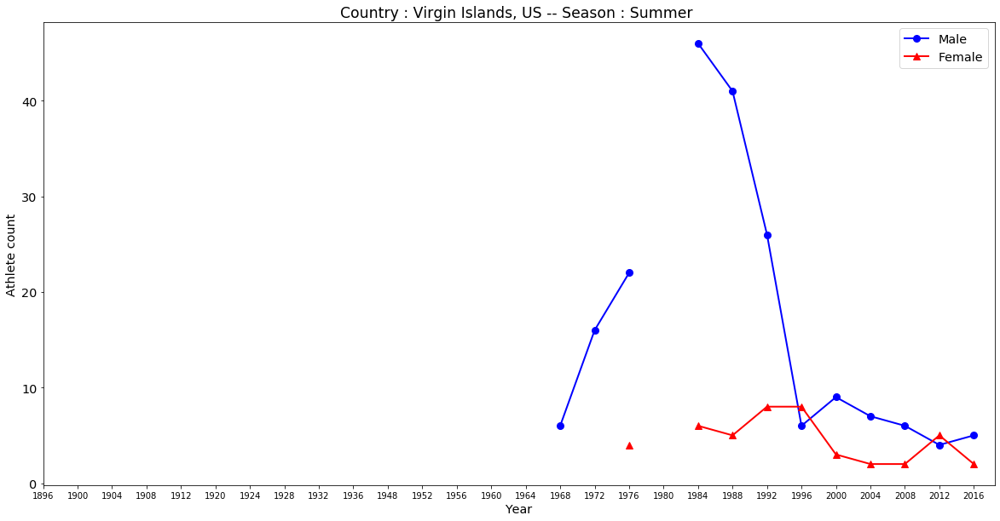

159


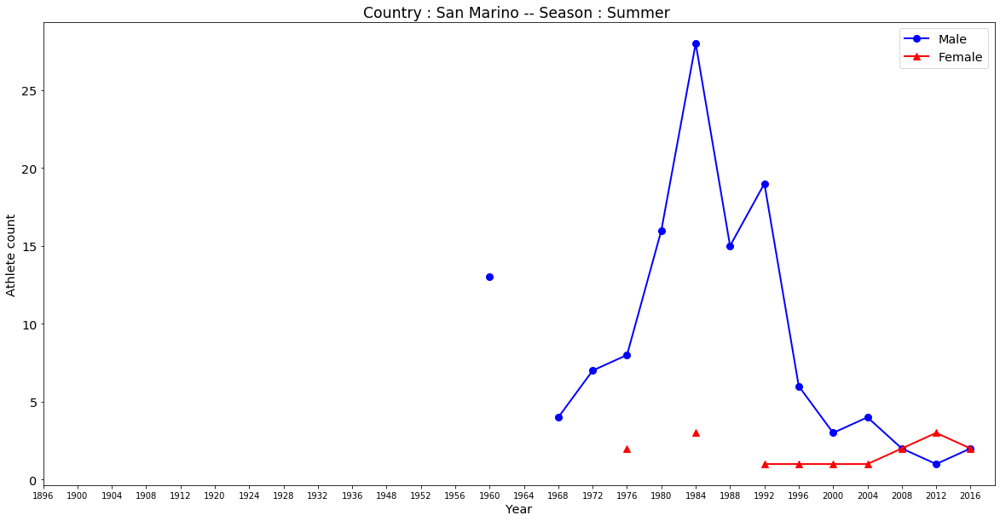

160


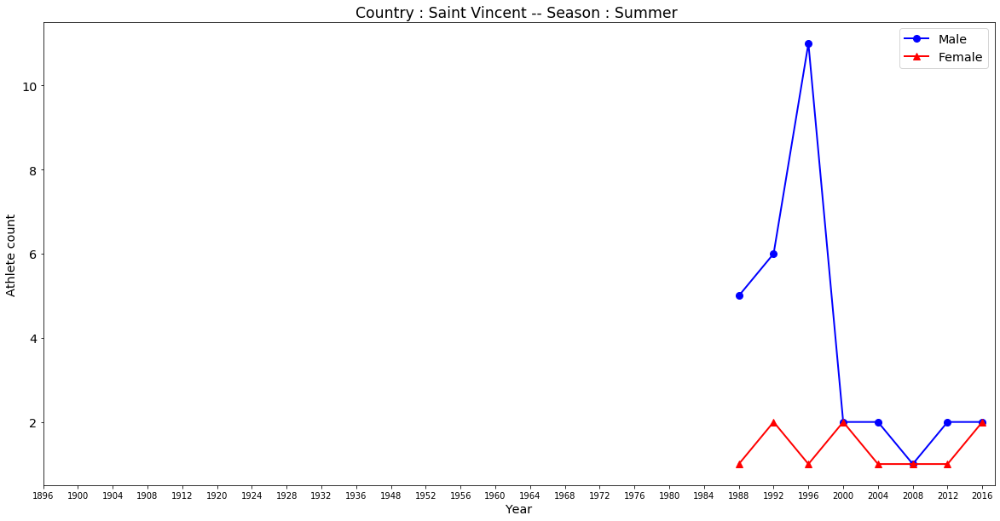

161


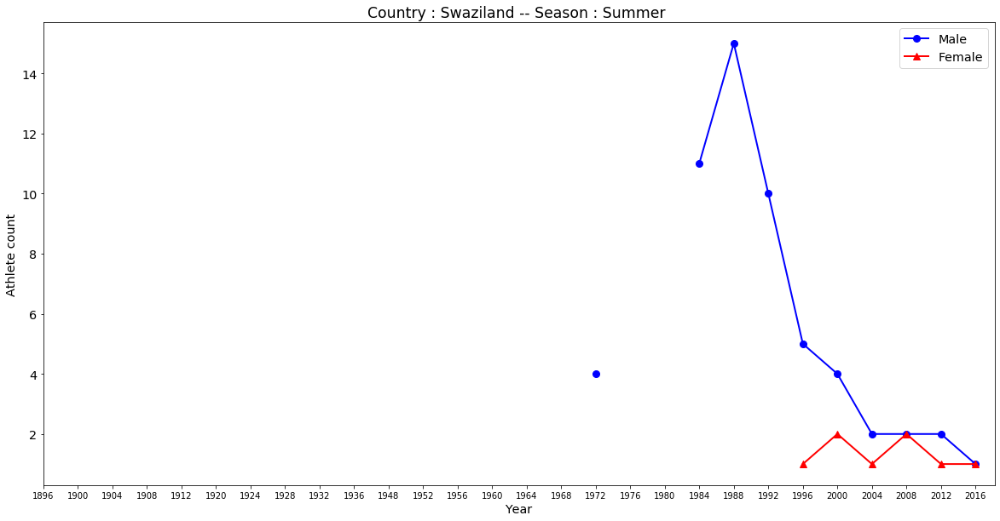

162


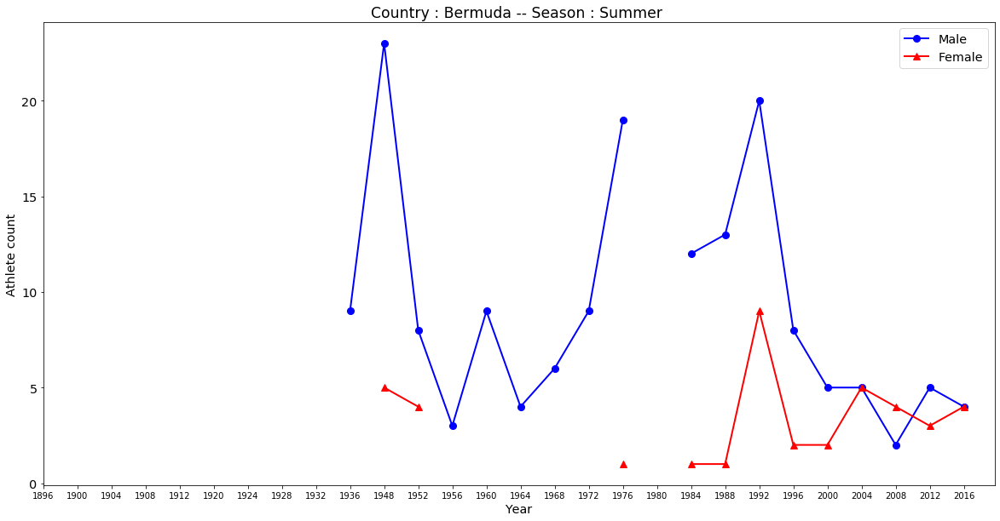

163


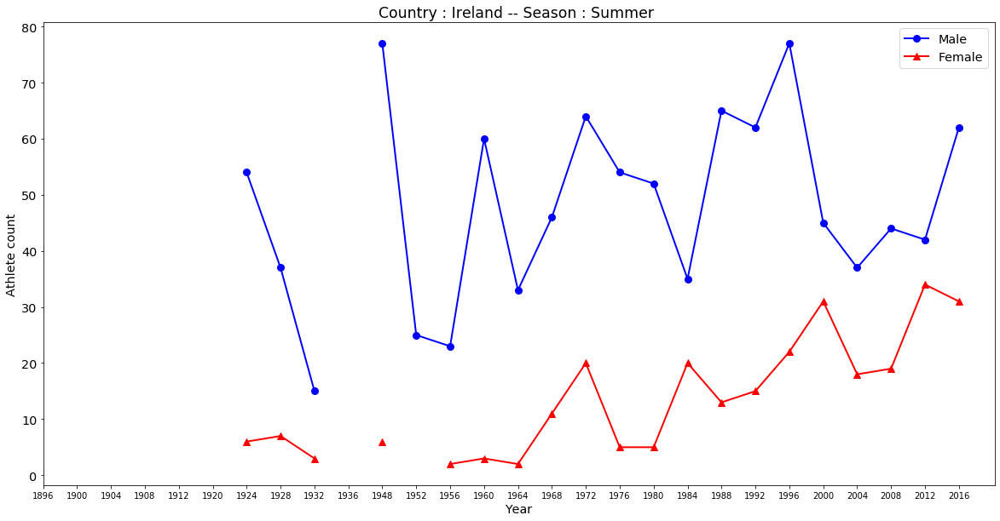

164


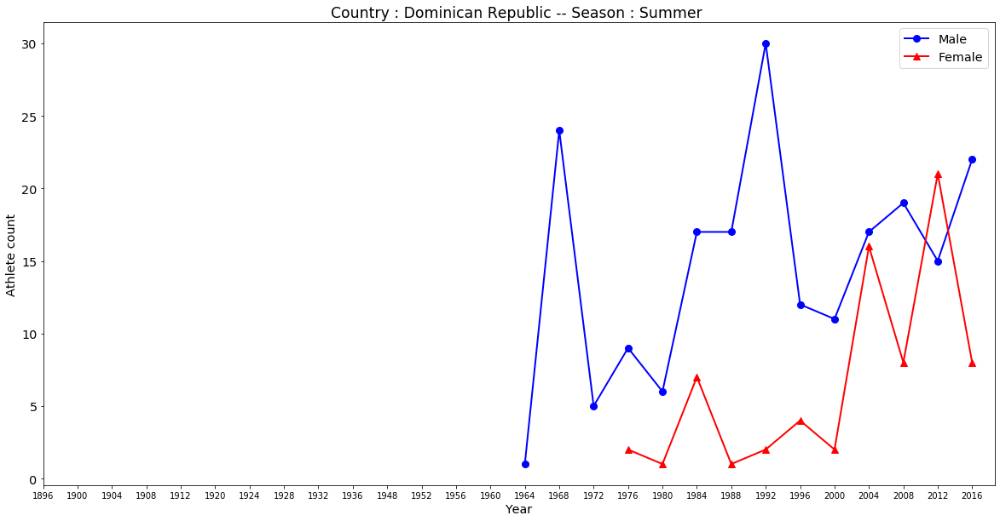

165


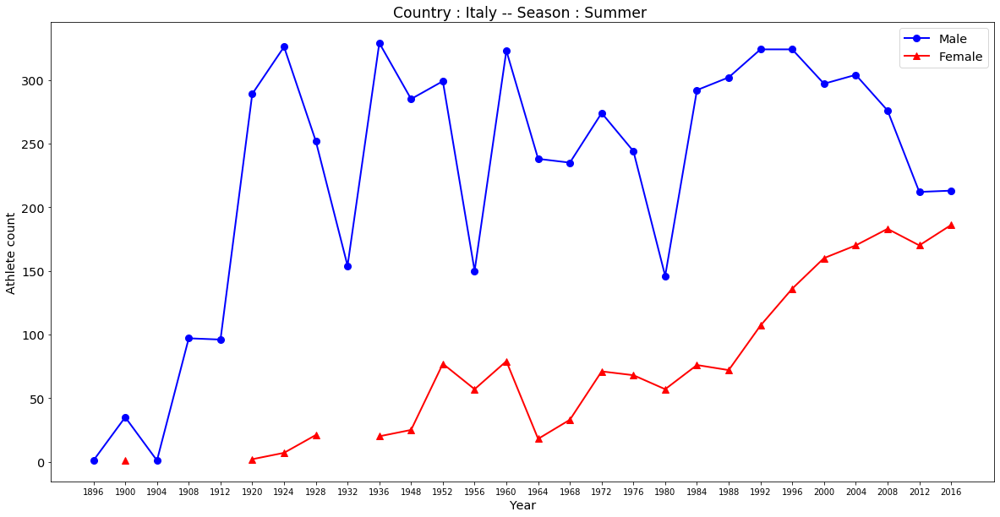

166


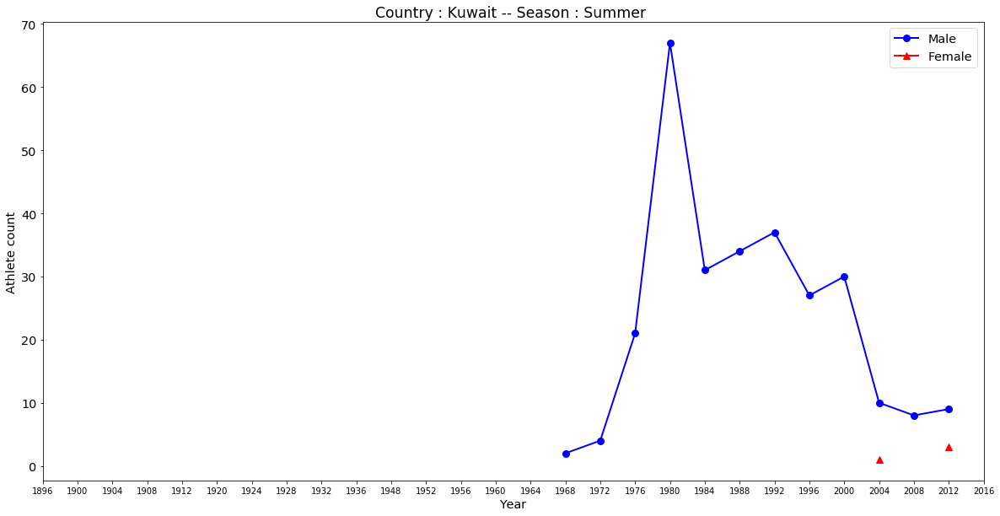

167


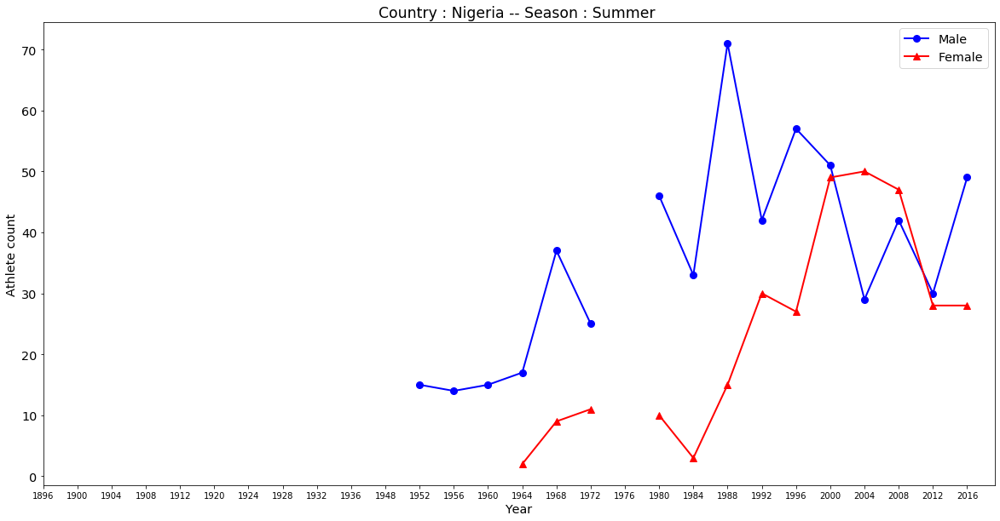

168


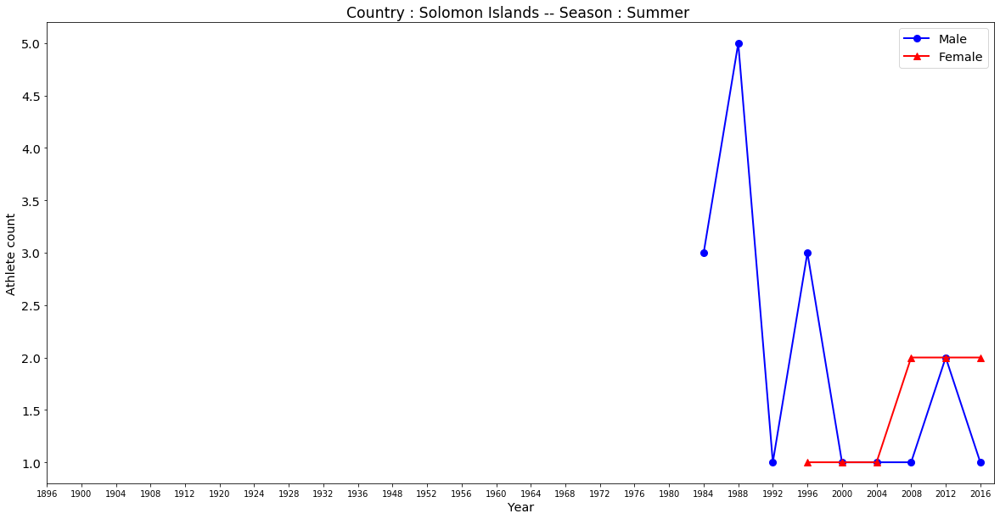

169


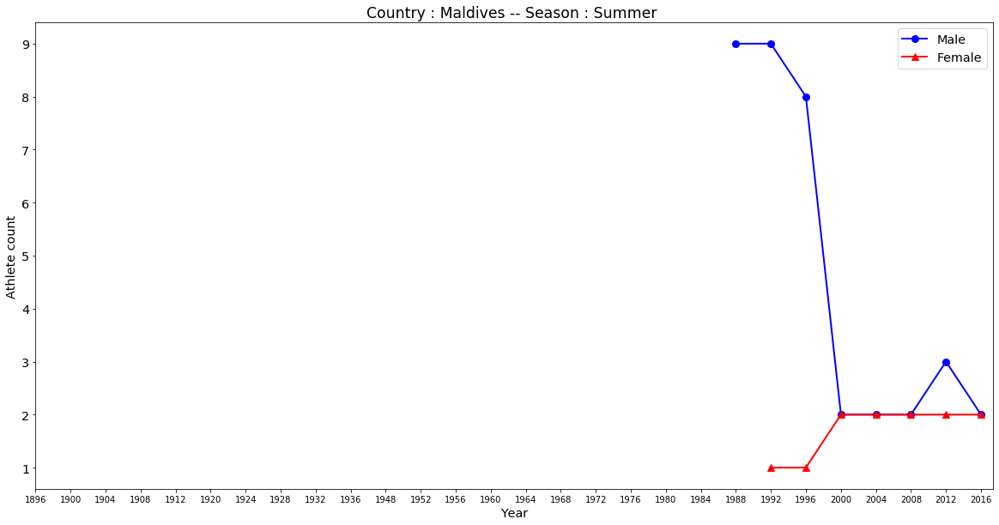

170


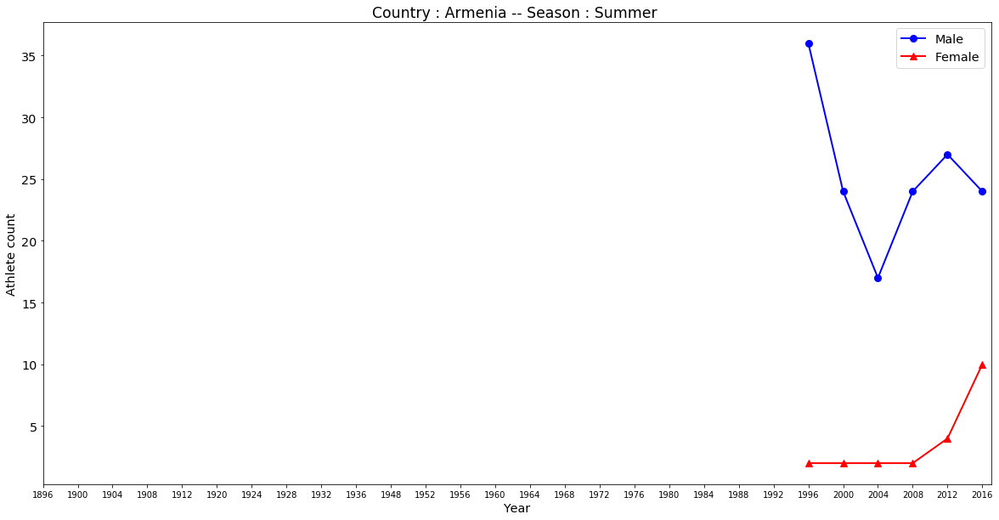

171


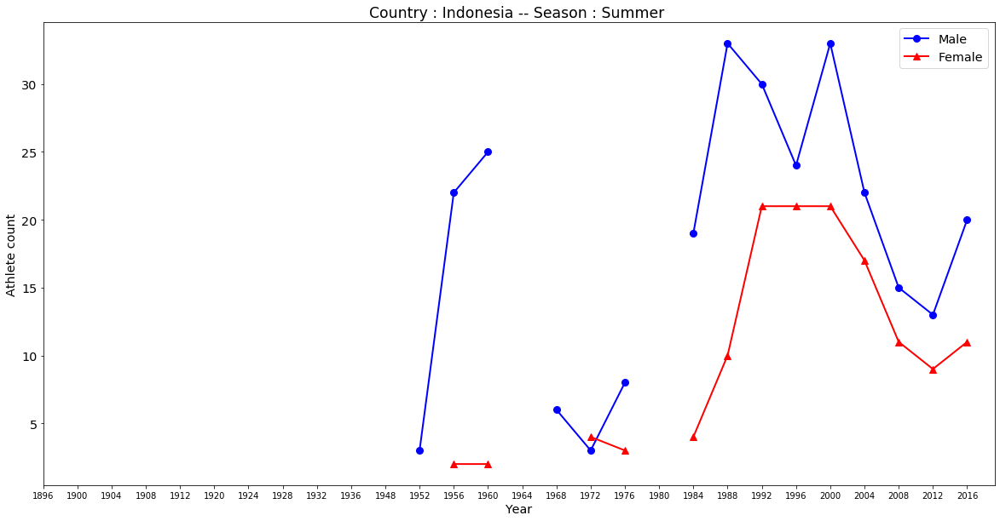

172


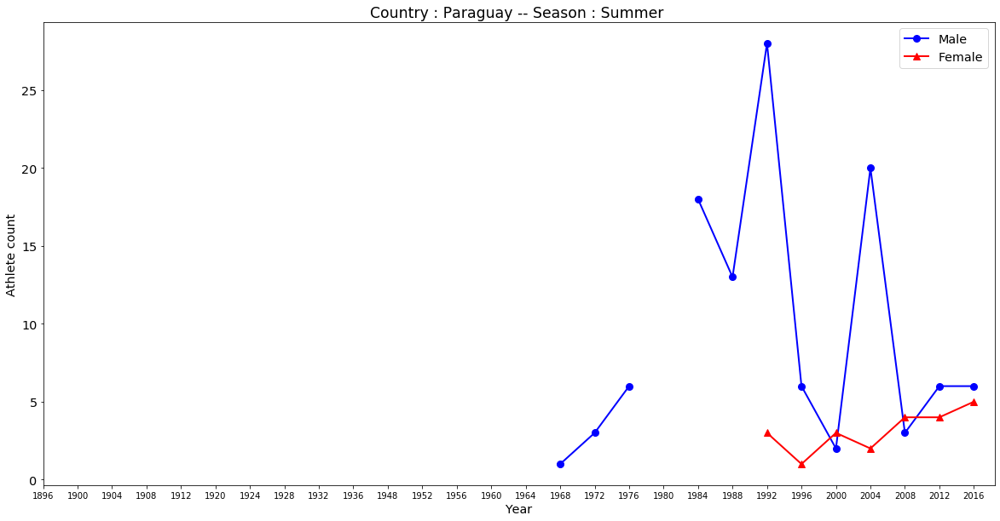

173


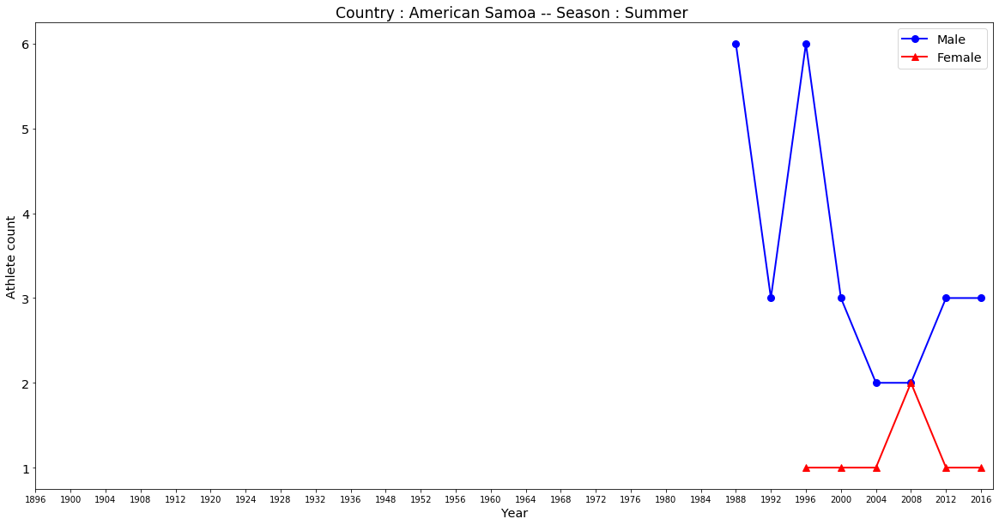

174


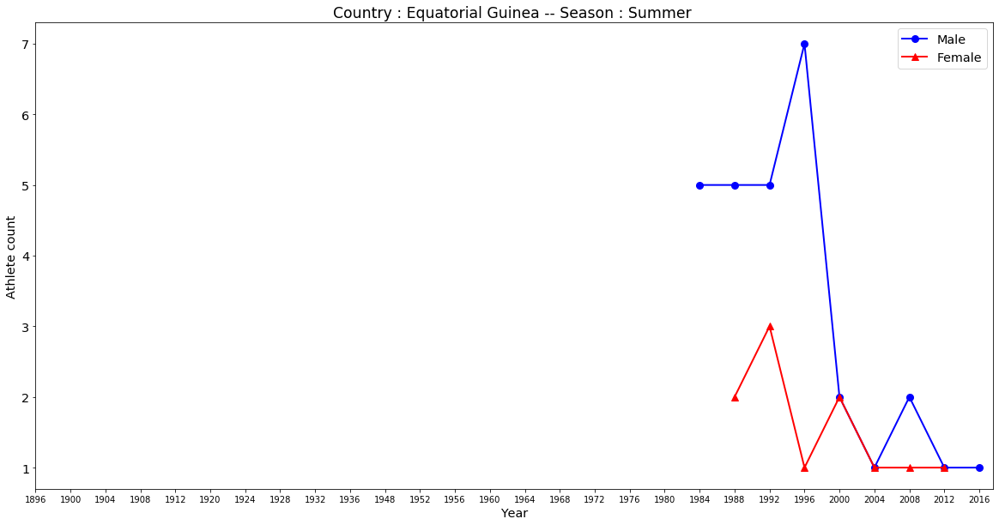

175


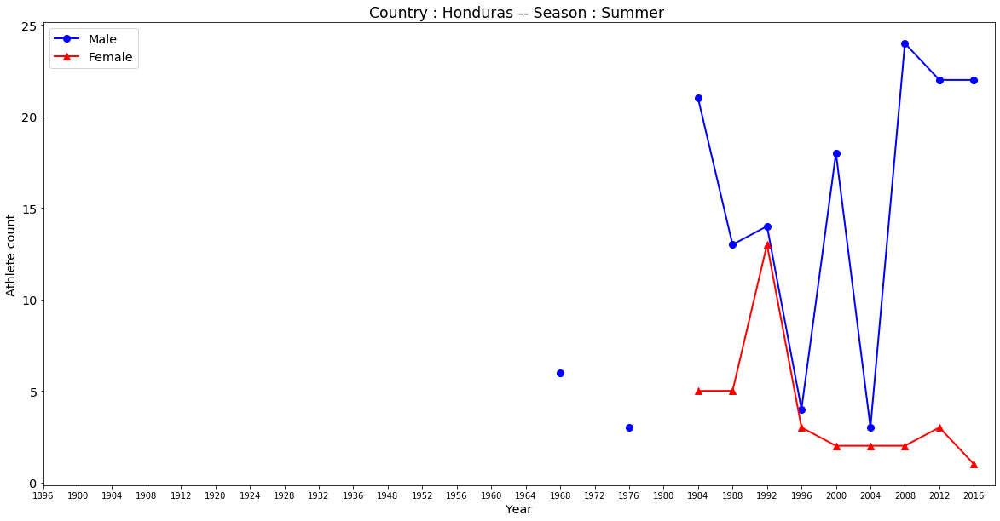

176


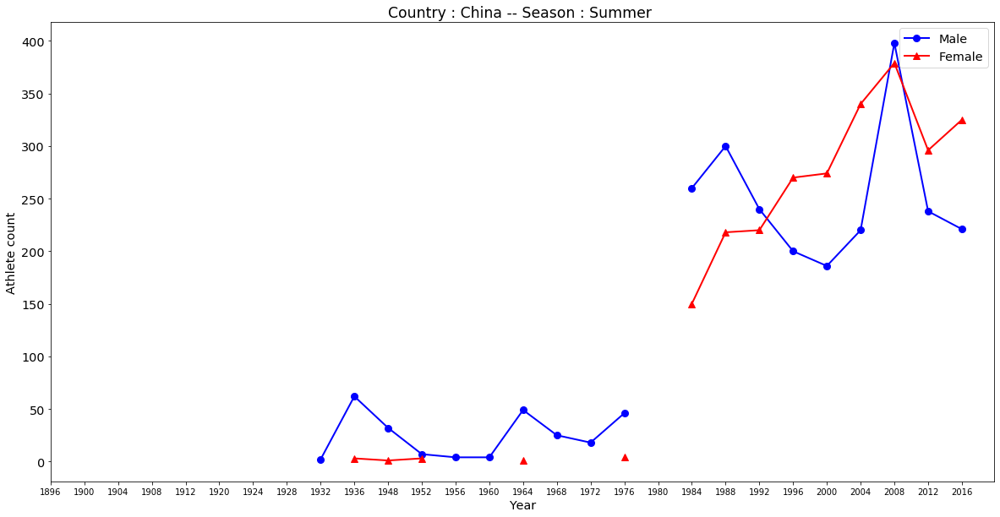

177


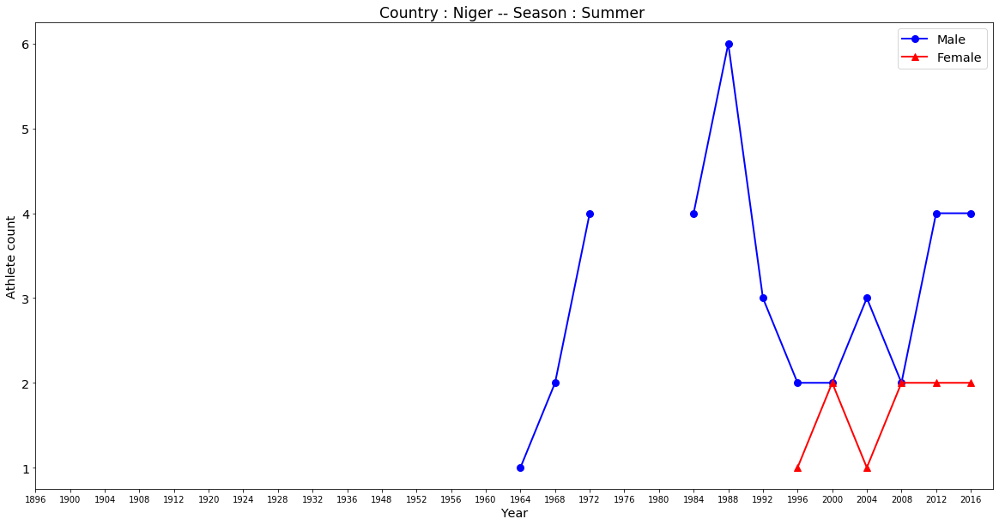

178


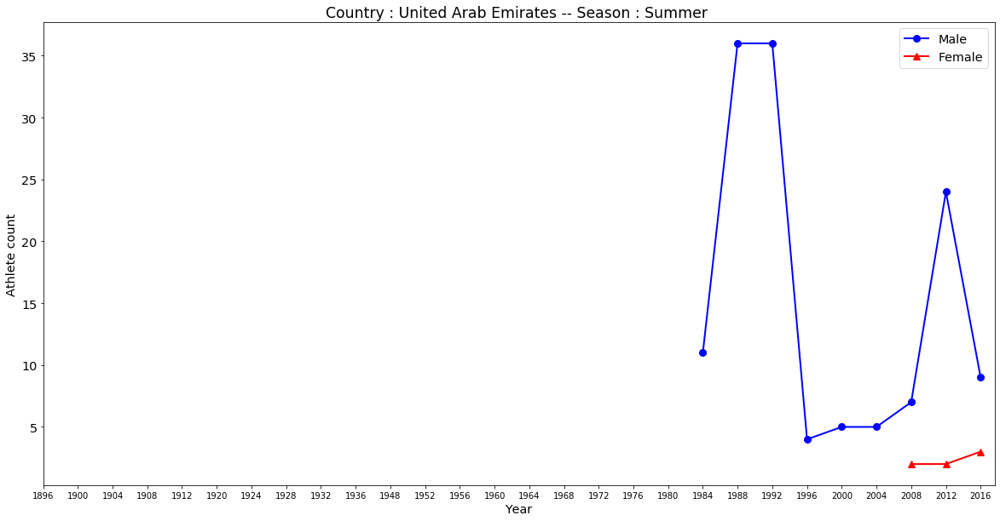

179


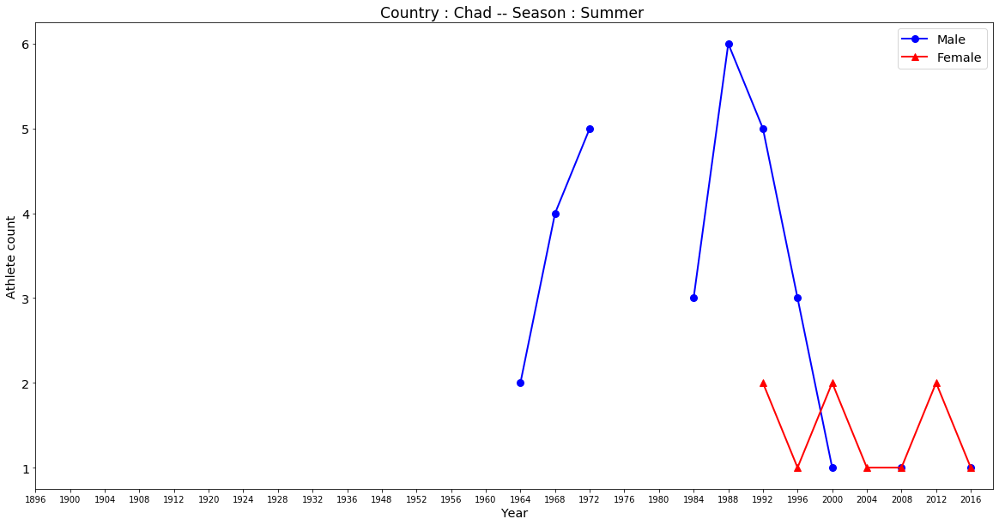

180


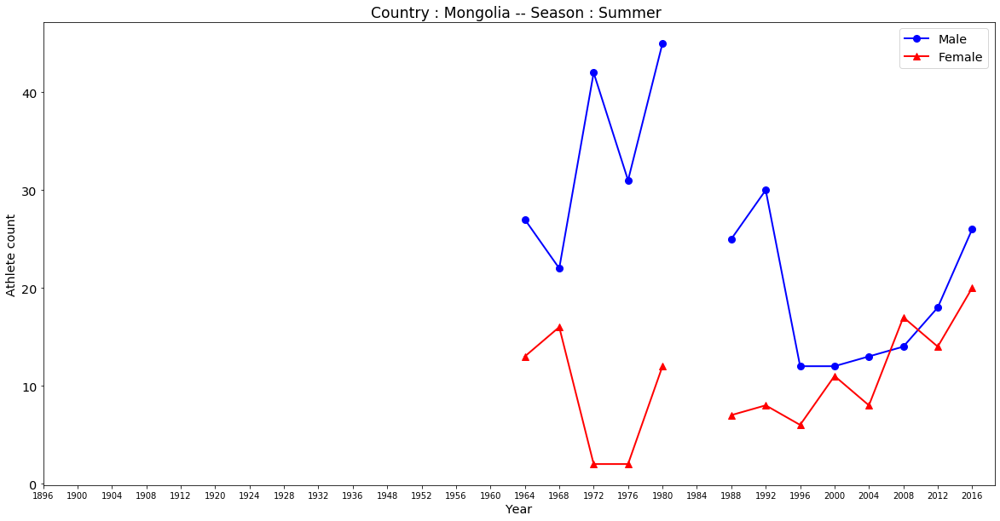

181


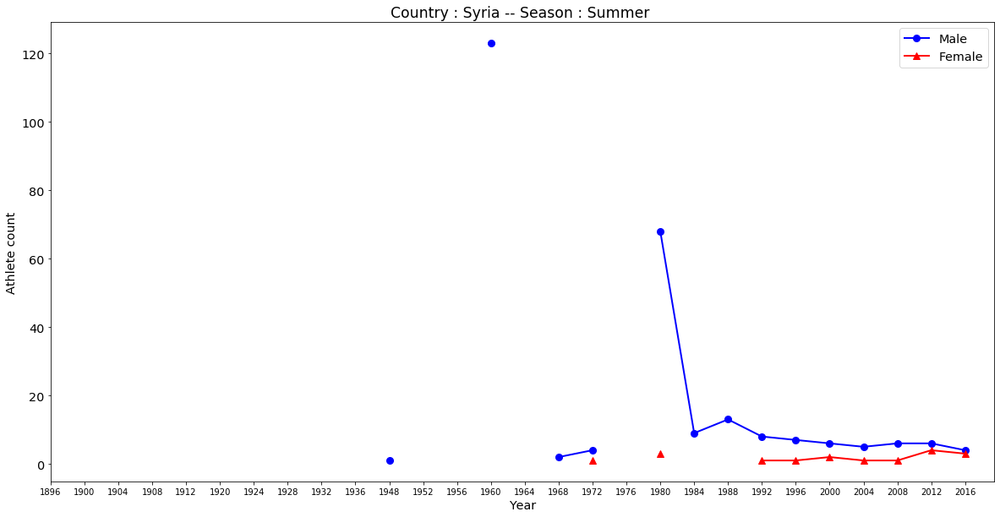

182


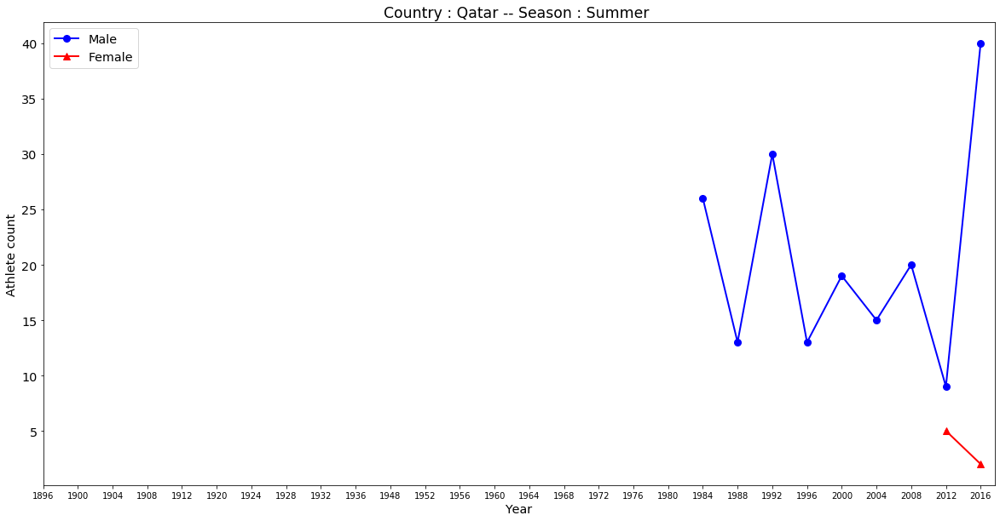

183


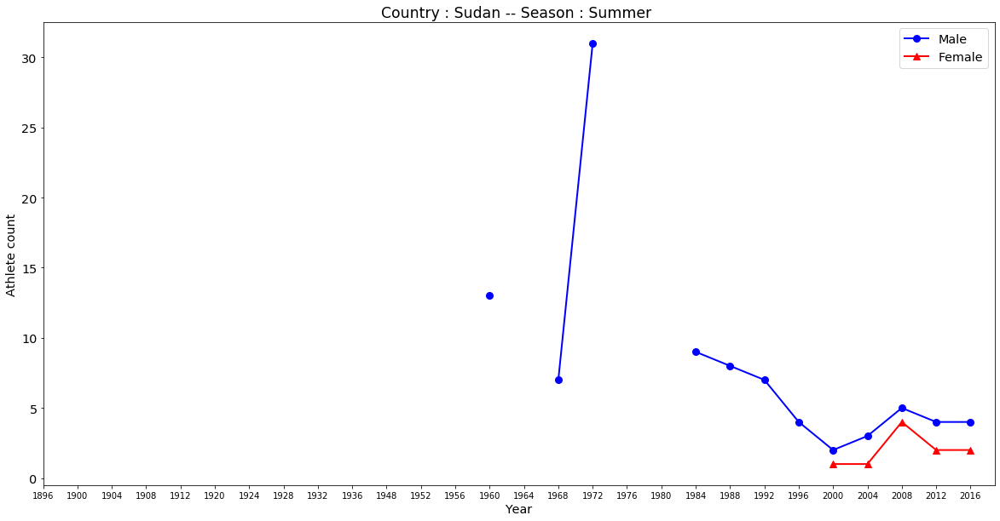

184


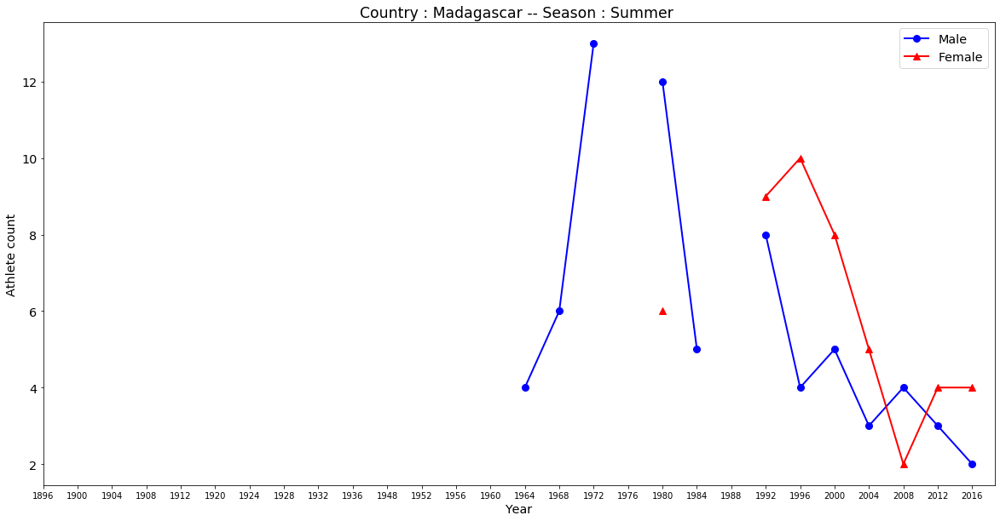

185


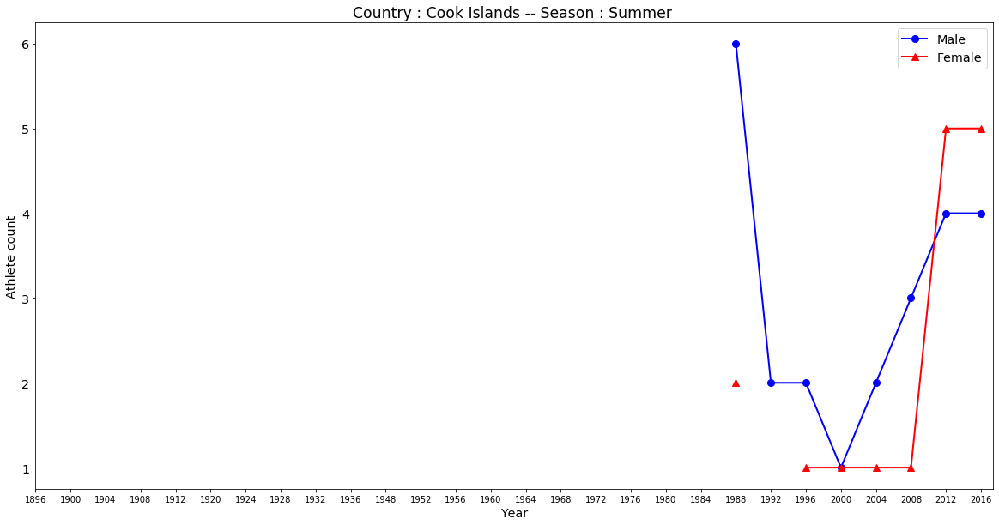

186


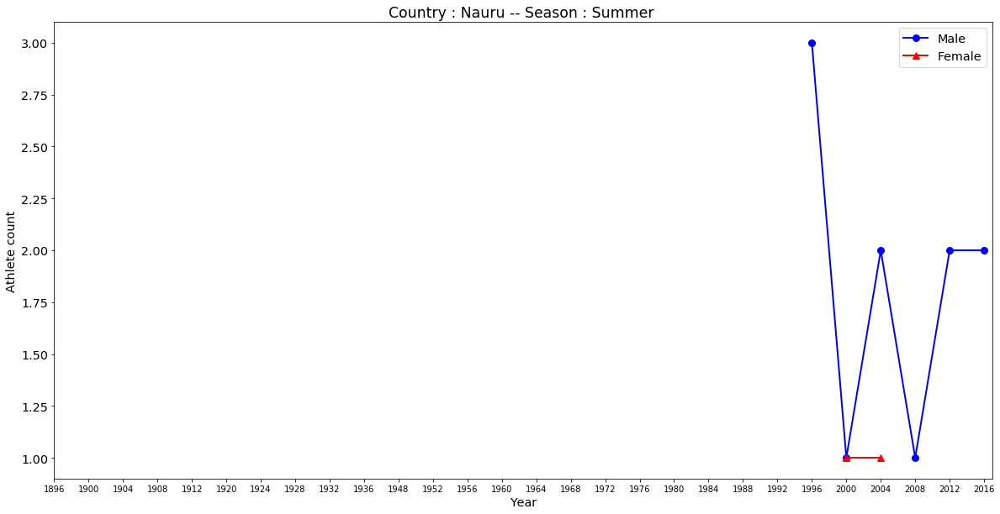

187


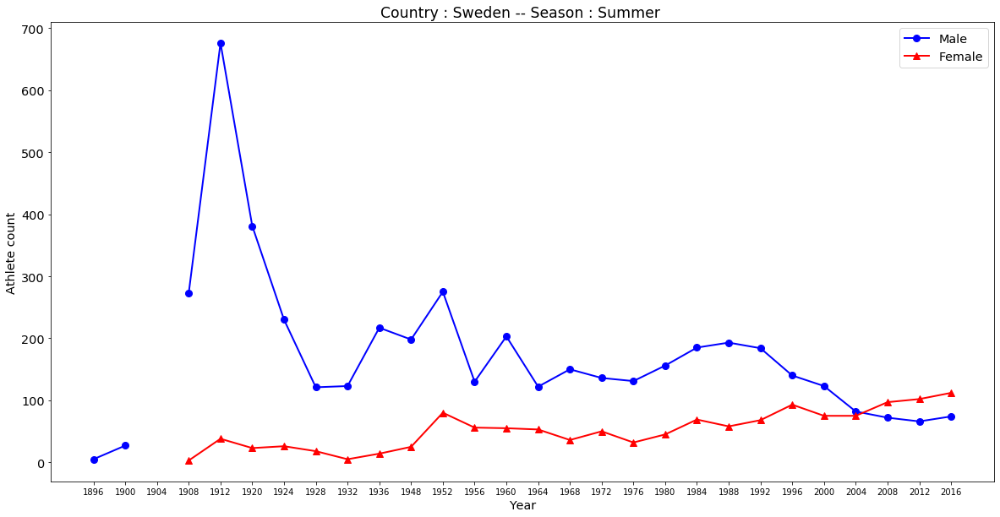

188


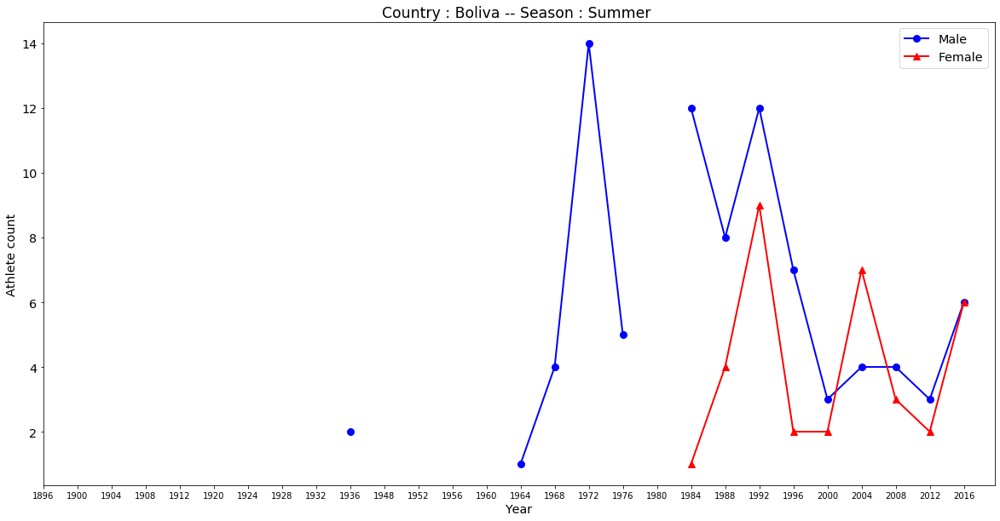

189


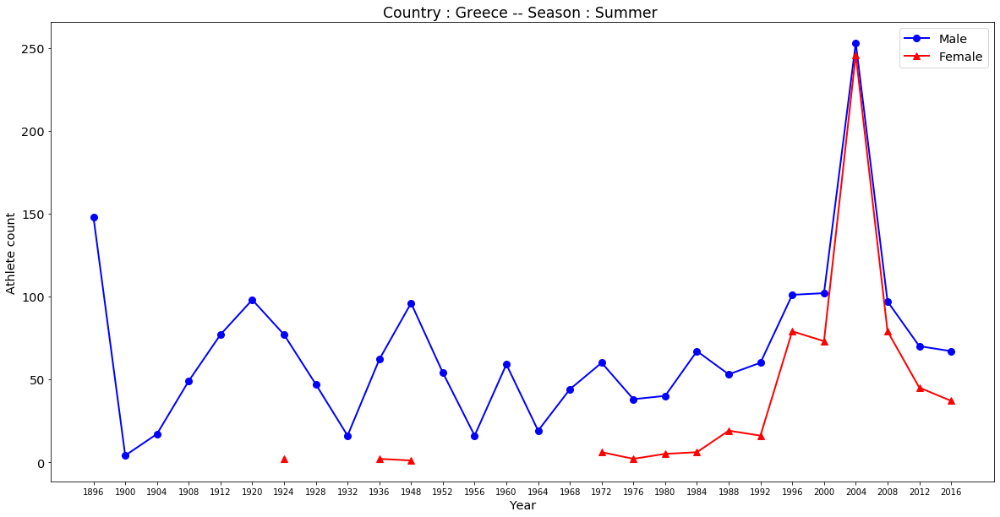

190


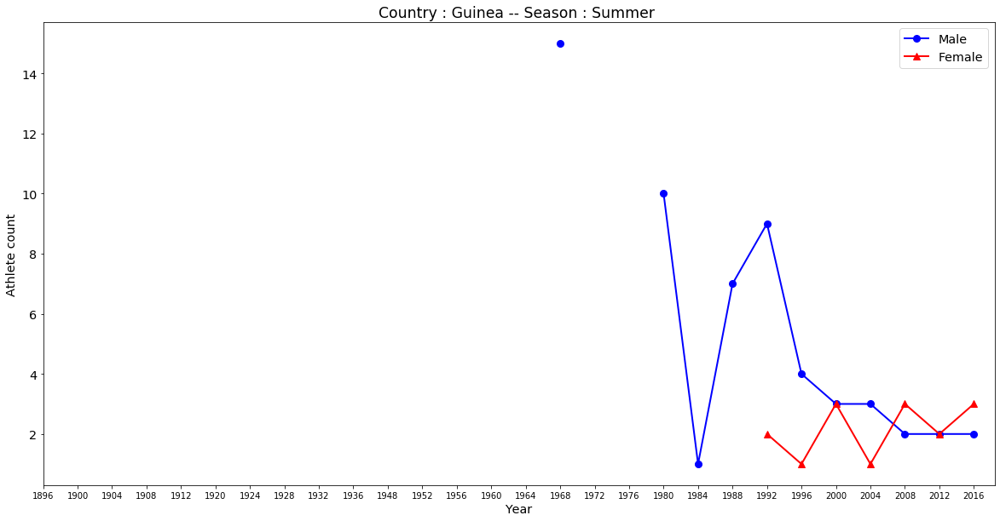

191


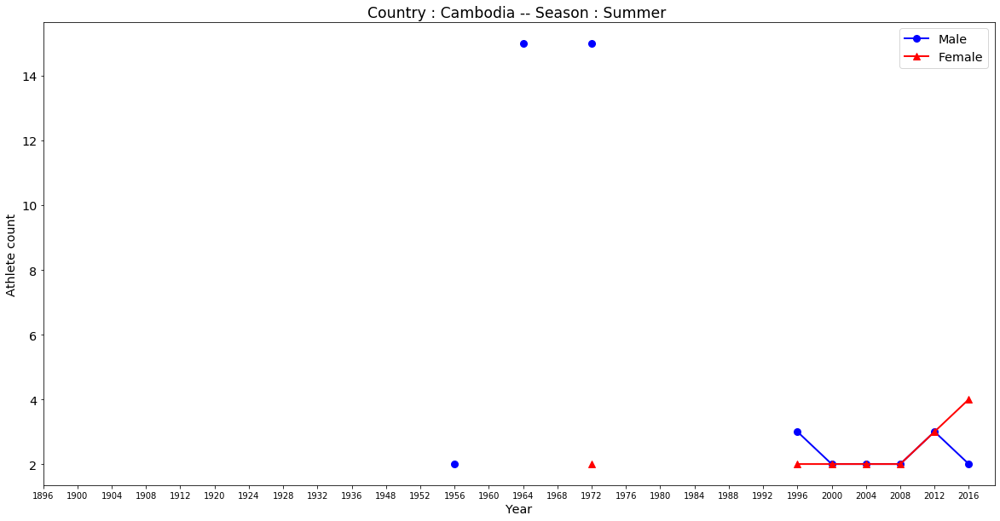

192


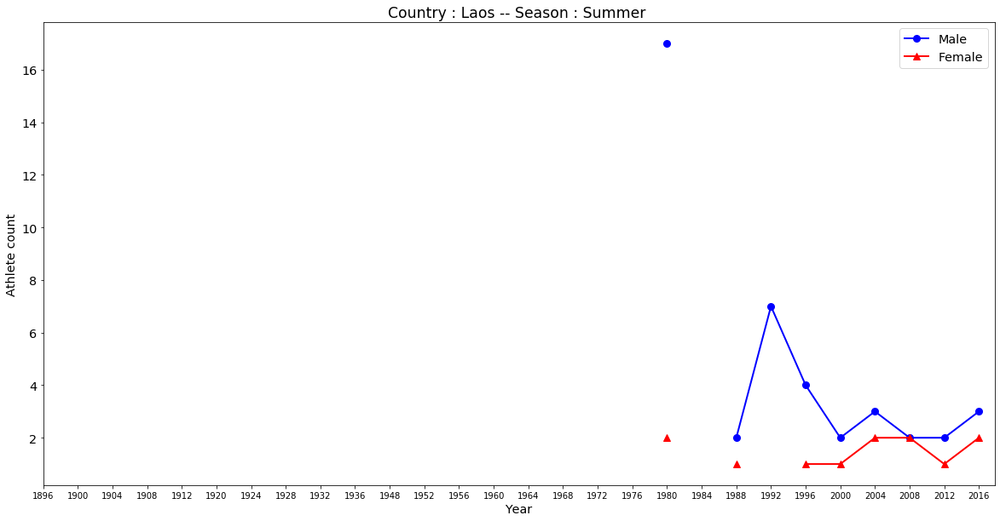

193


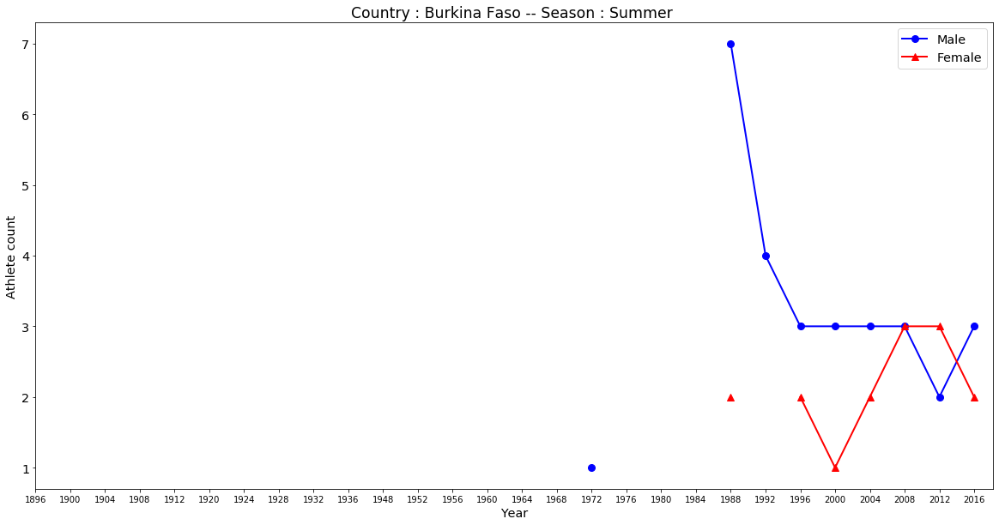

194


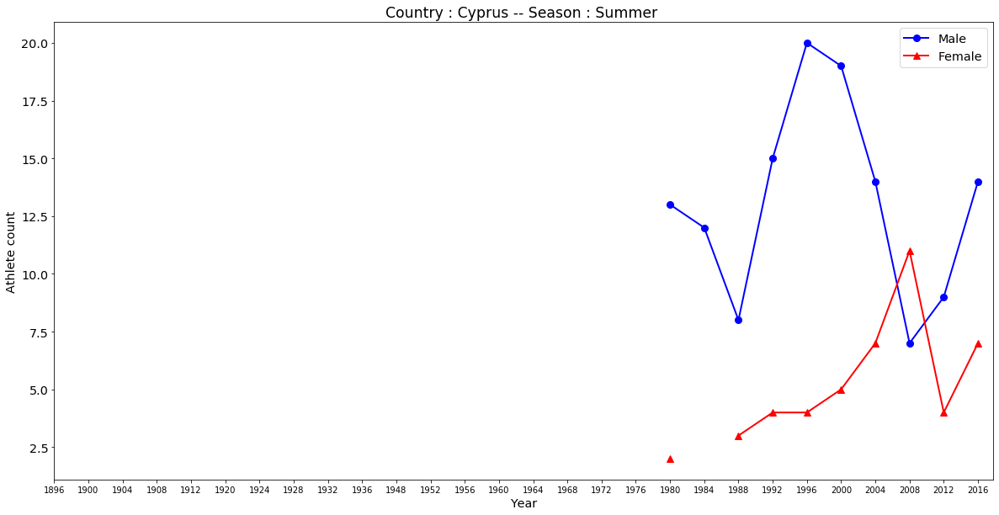

195


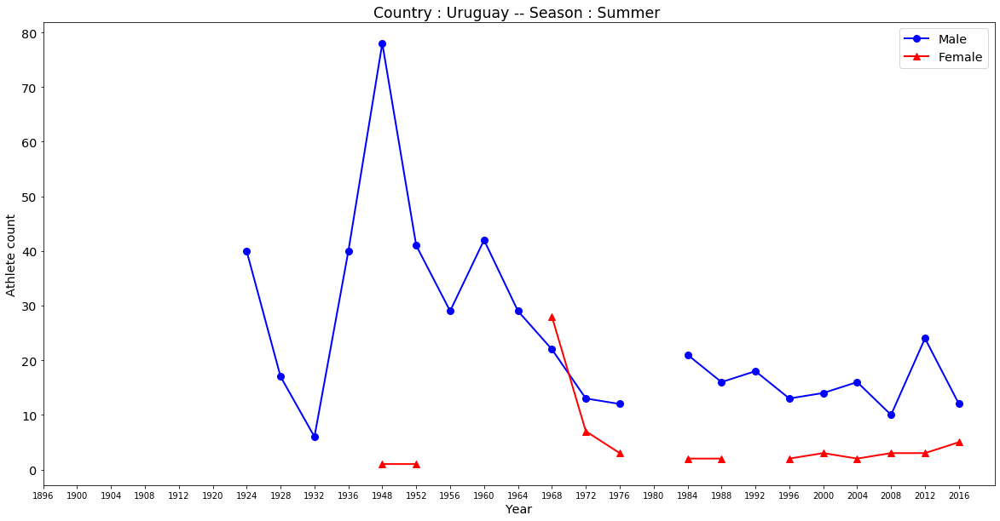

196


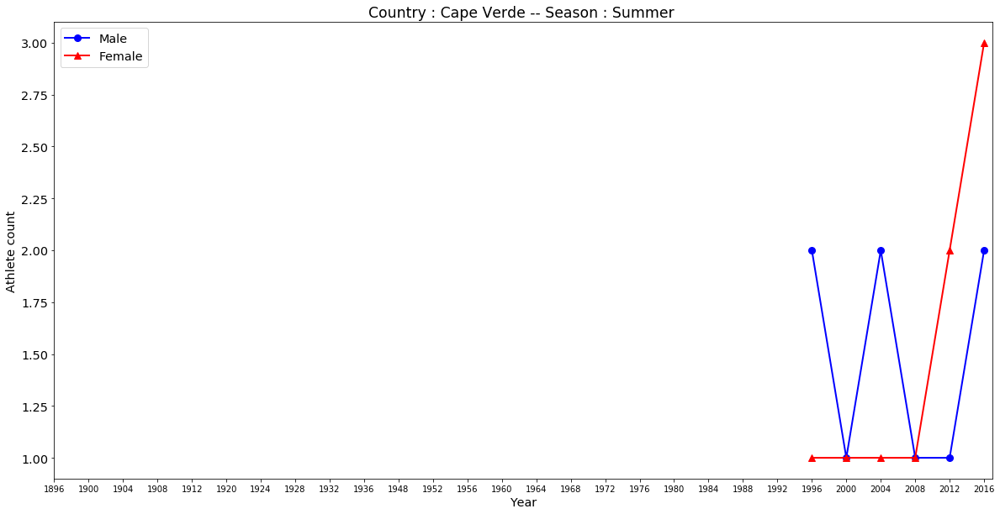

197


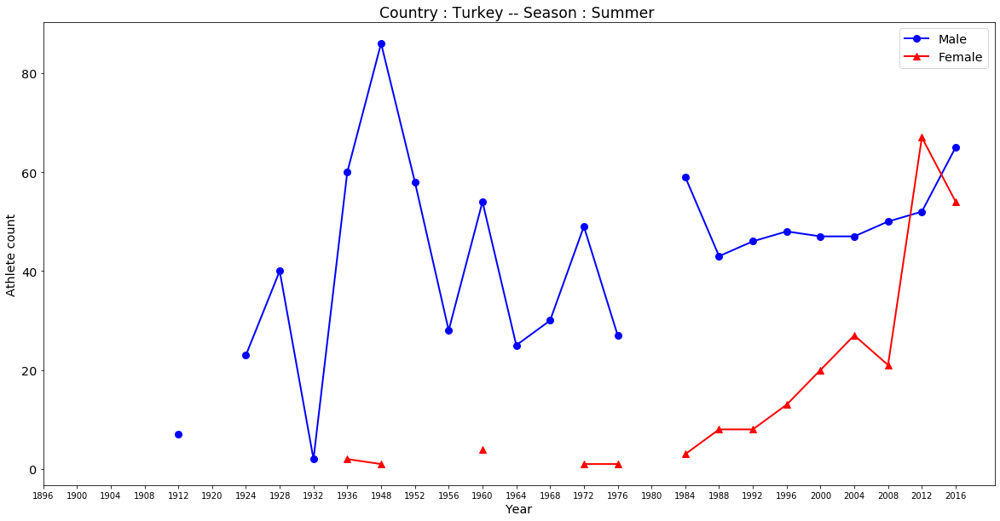

198


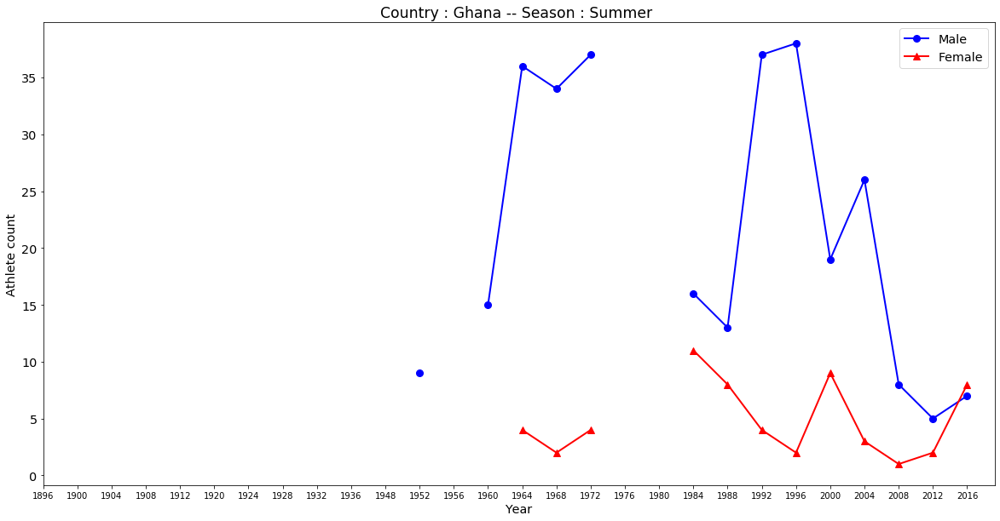

199


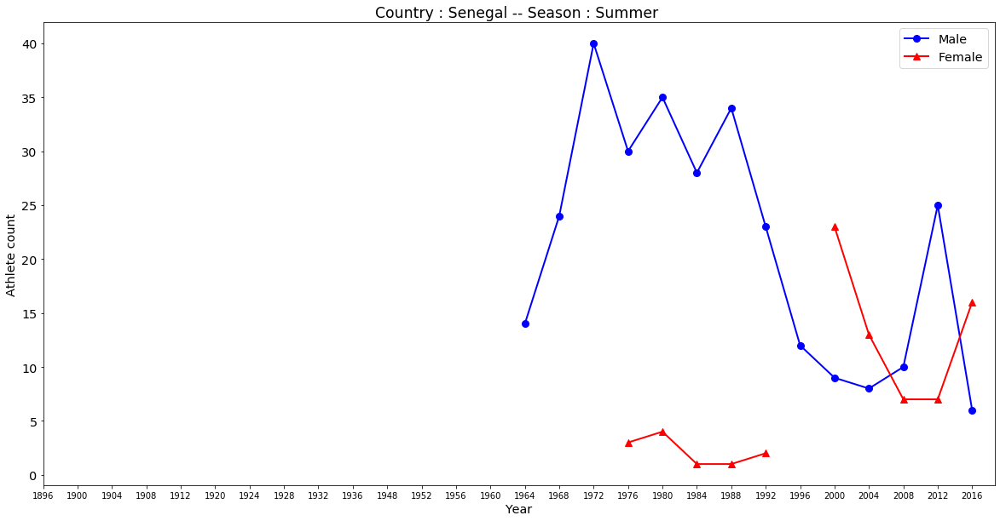

200


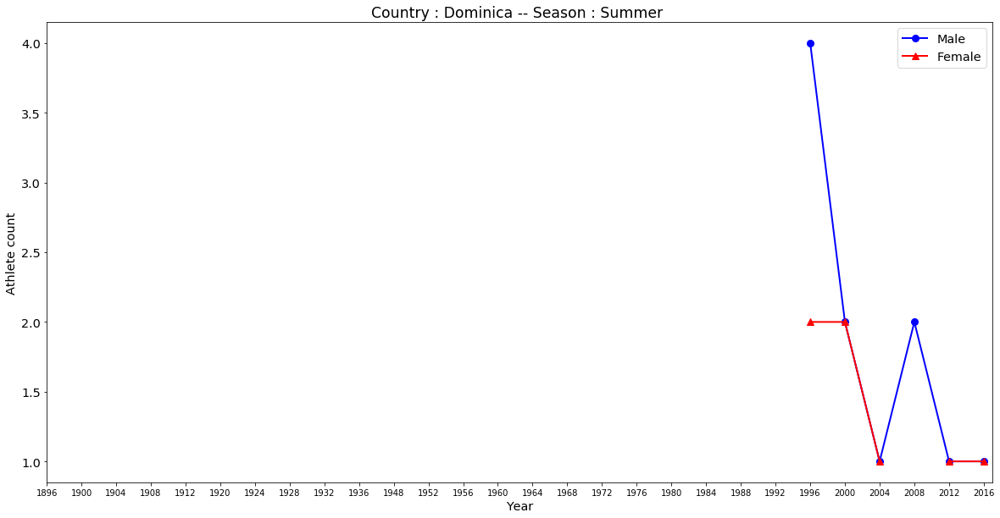

201


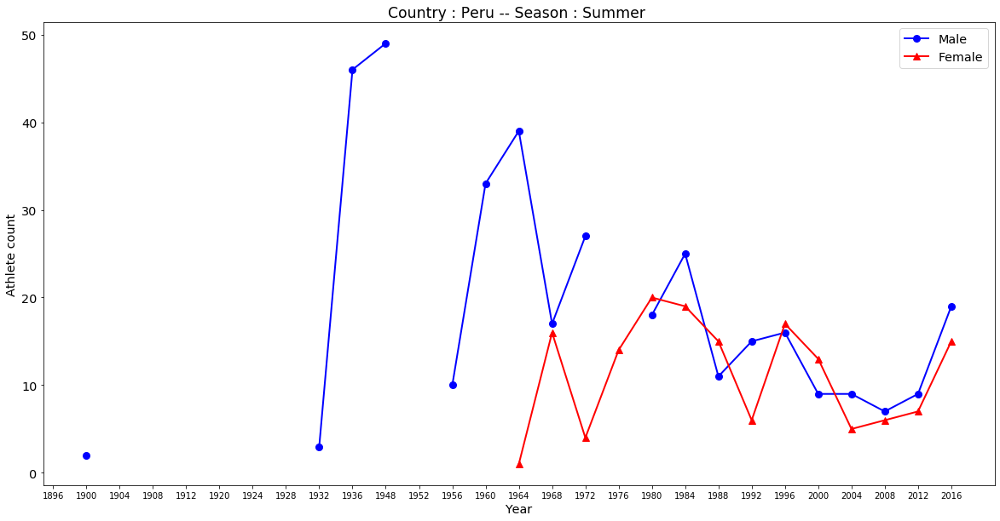

202


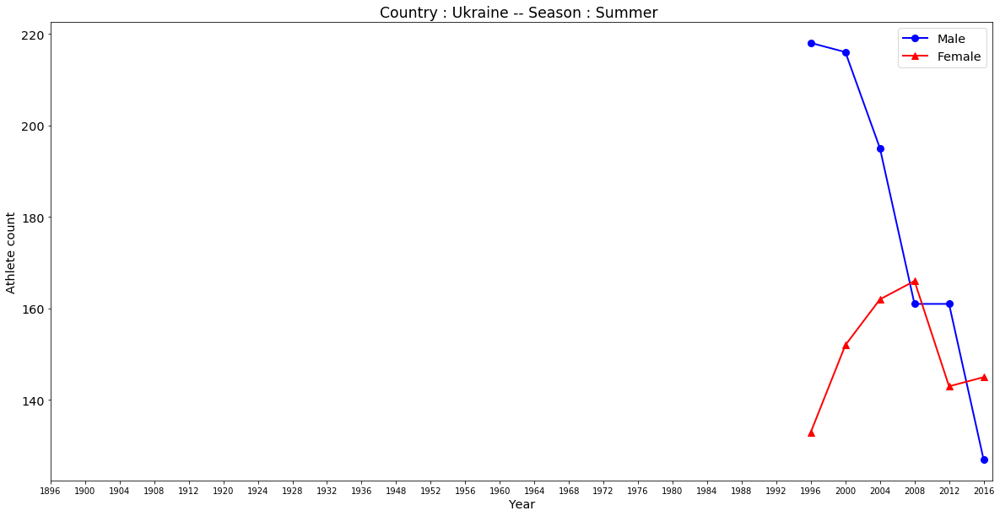

203


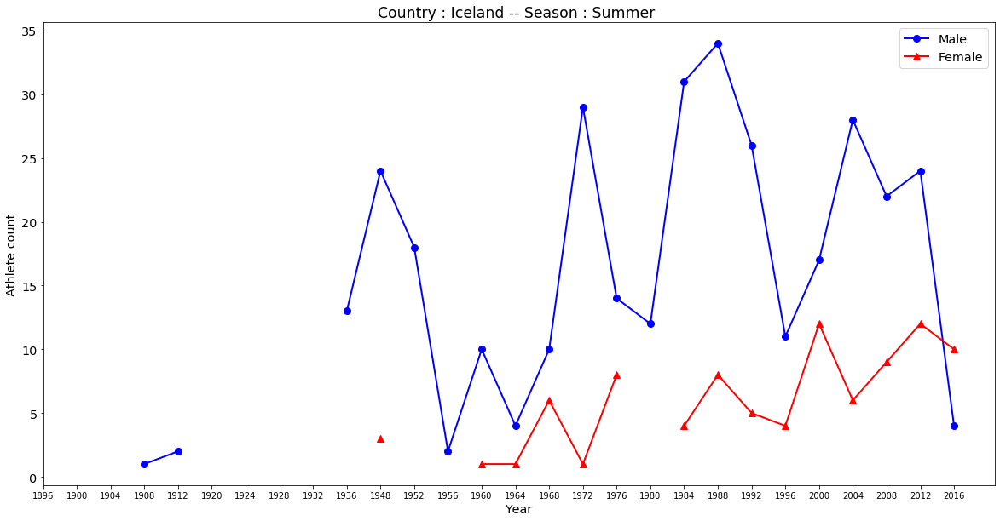

204


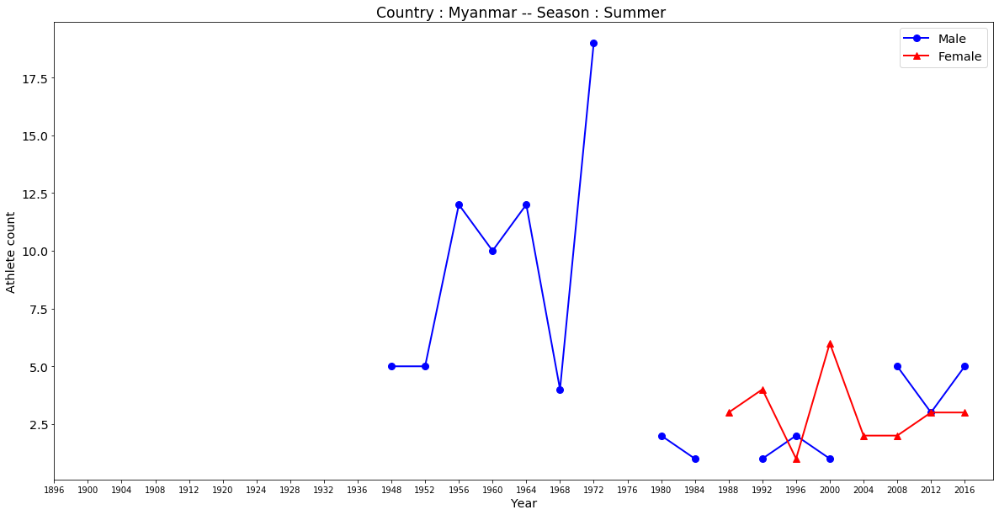

205


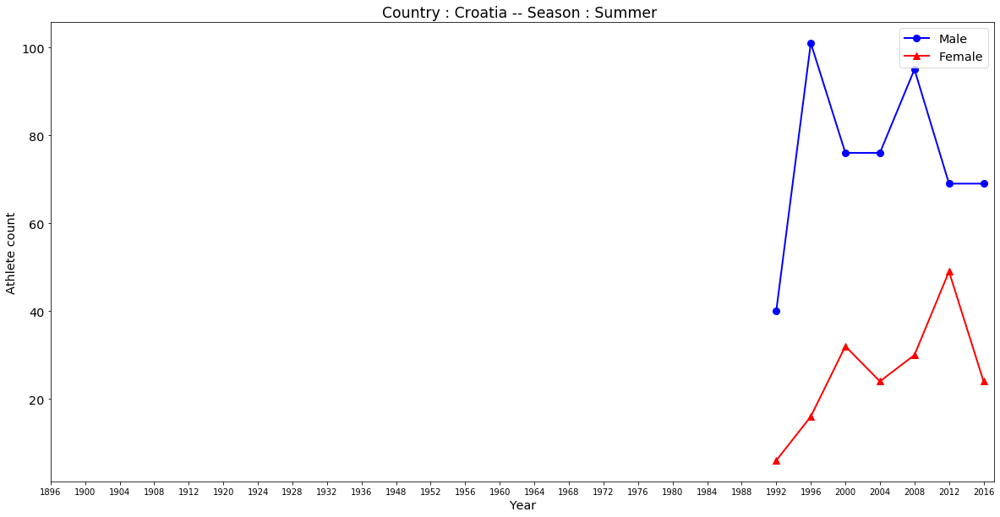

206


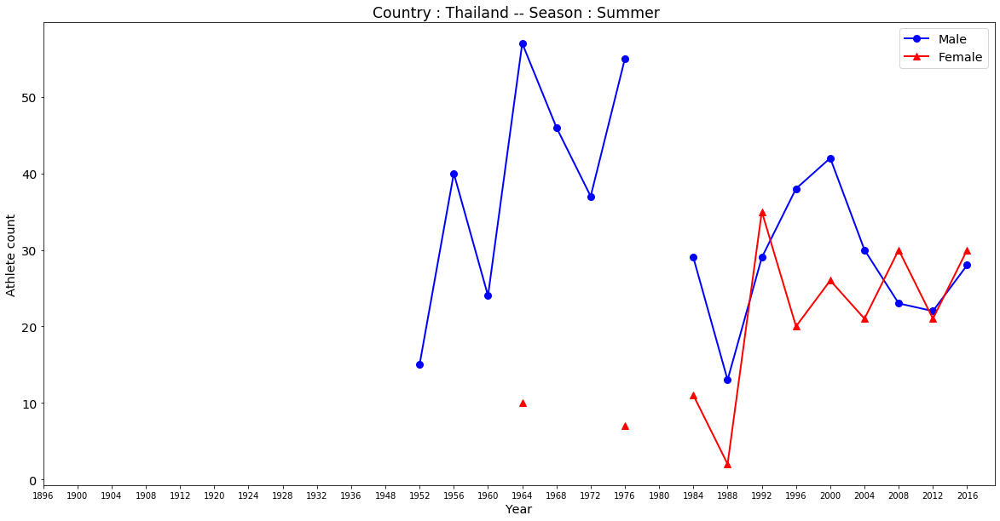

207


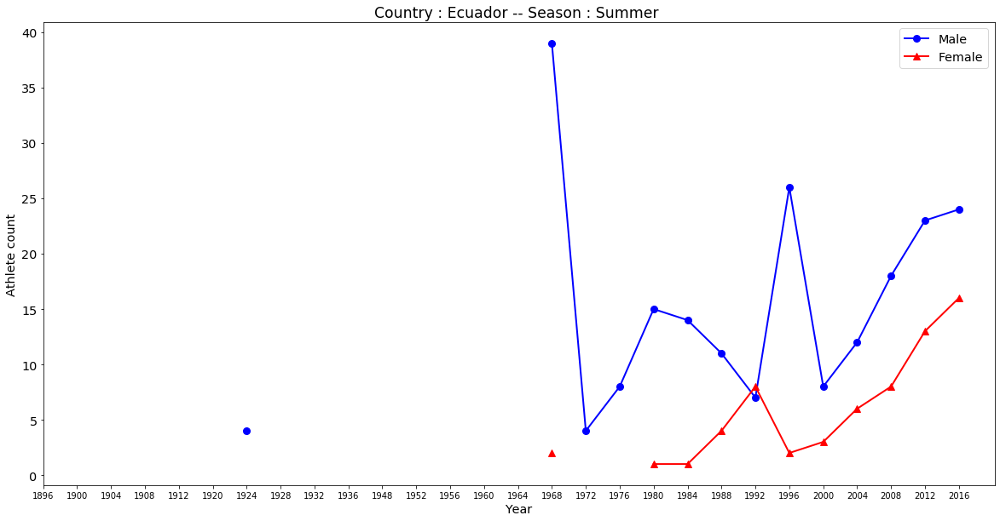

208


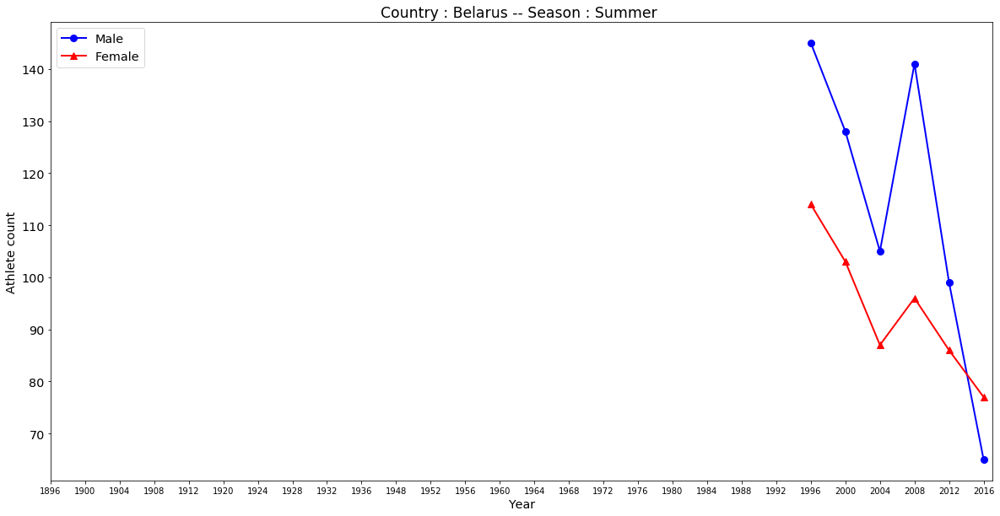

209


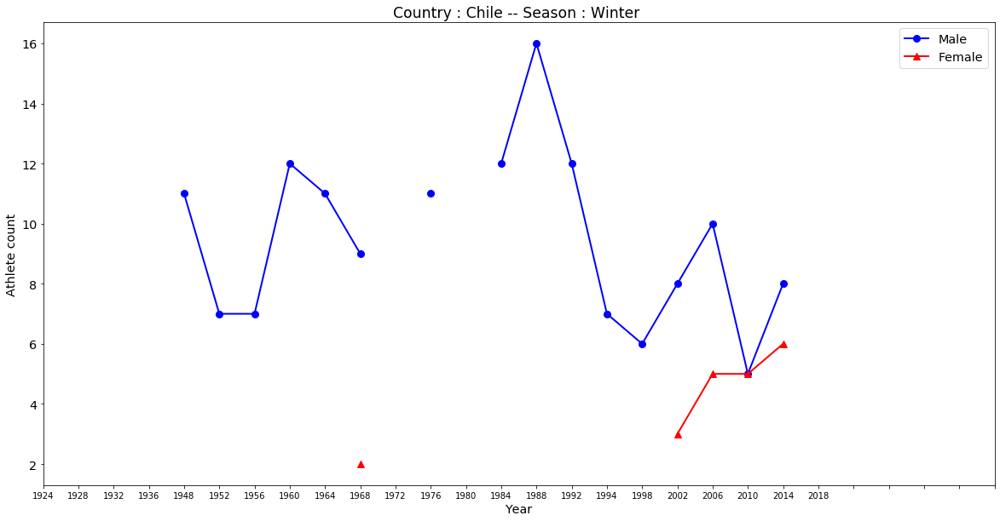

1


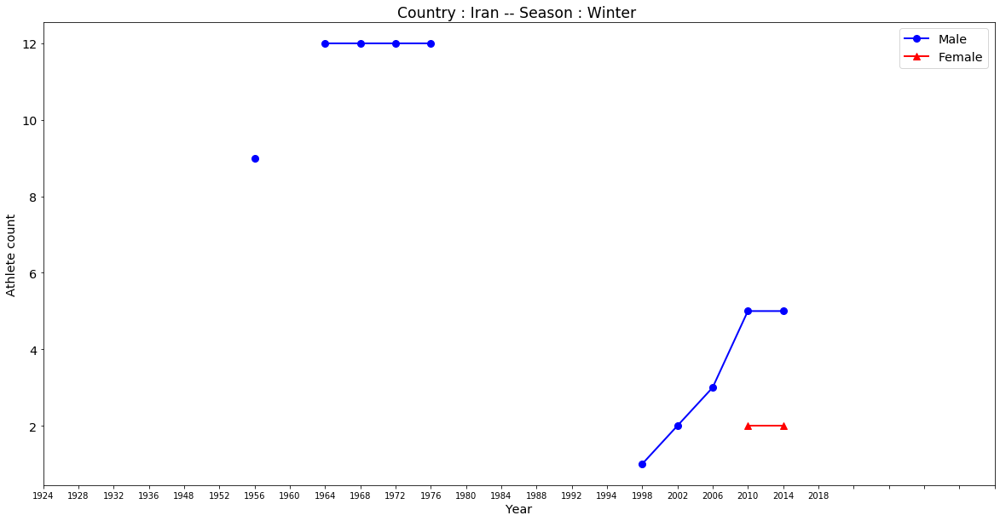

2


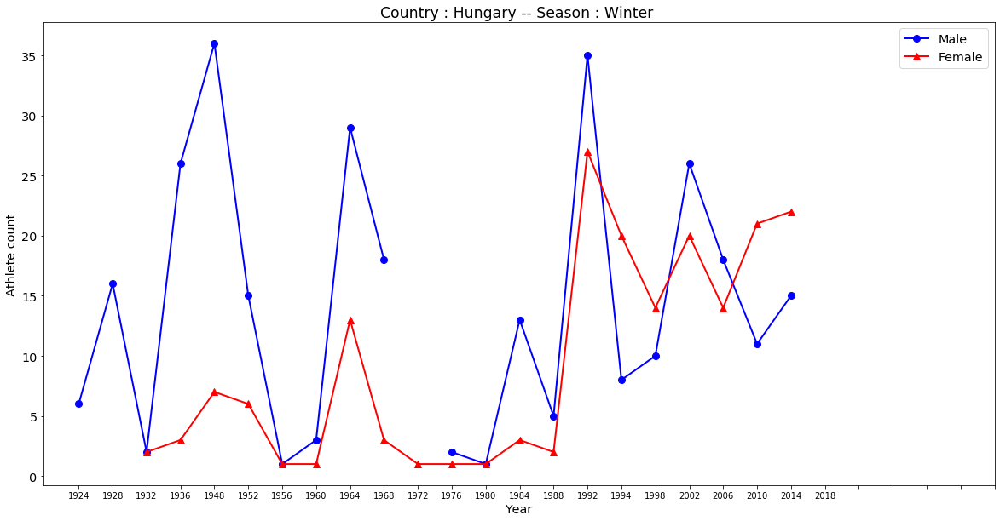

3


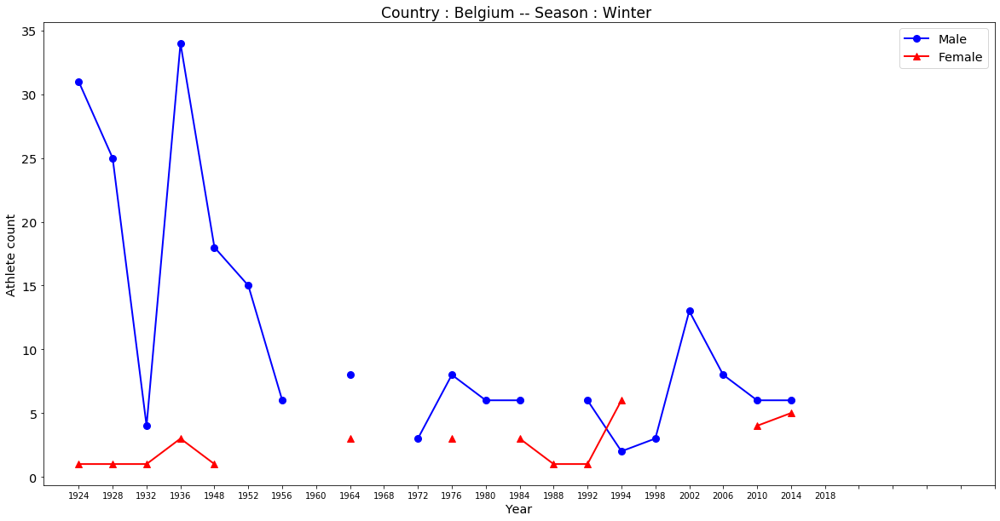

4


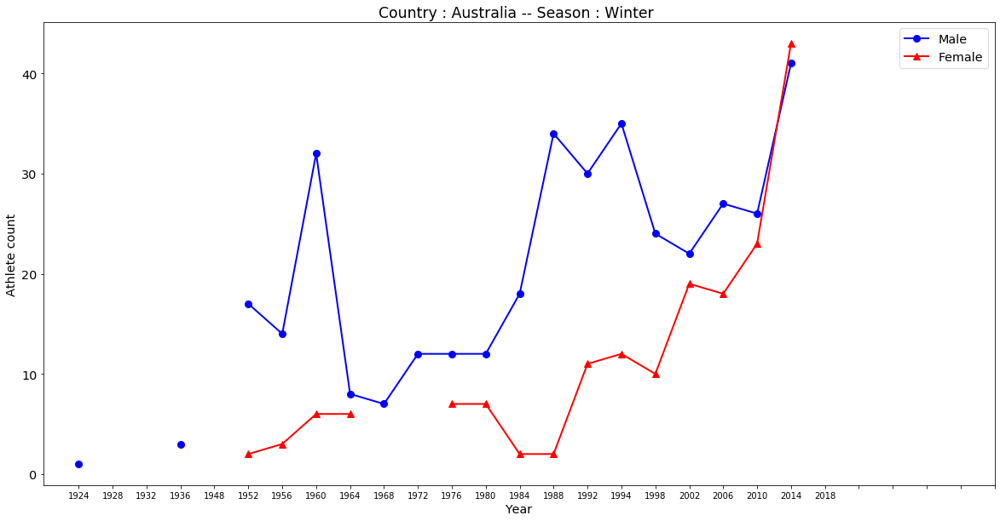

5


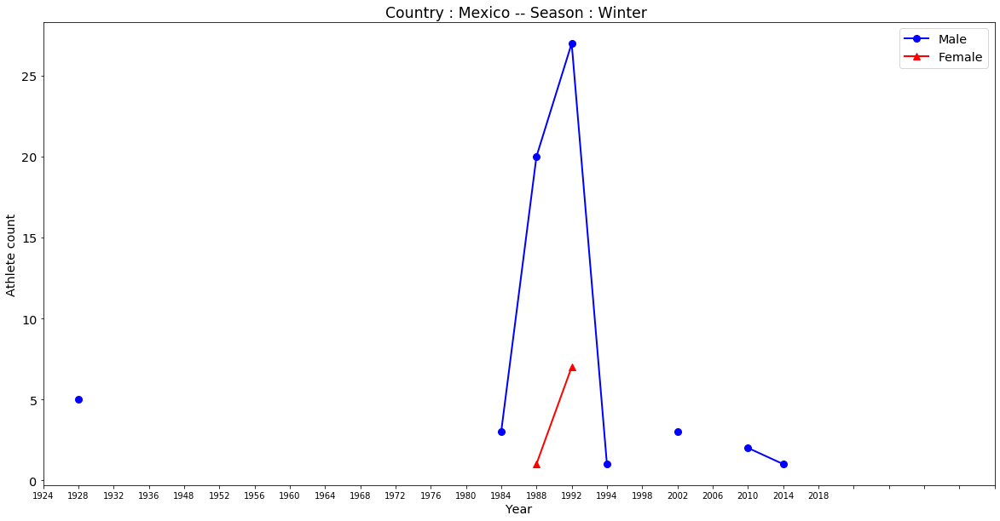

6


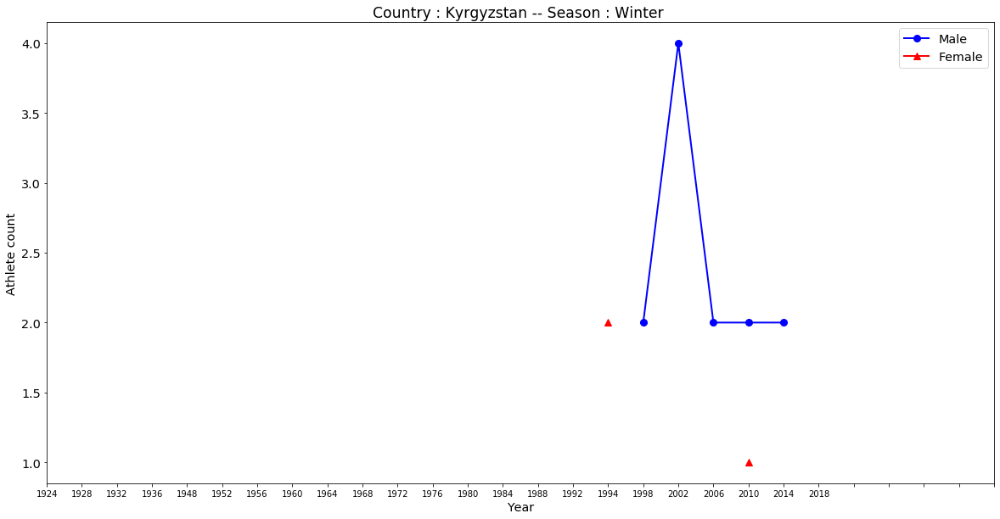

7


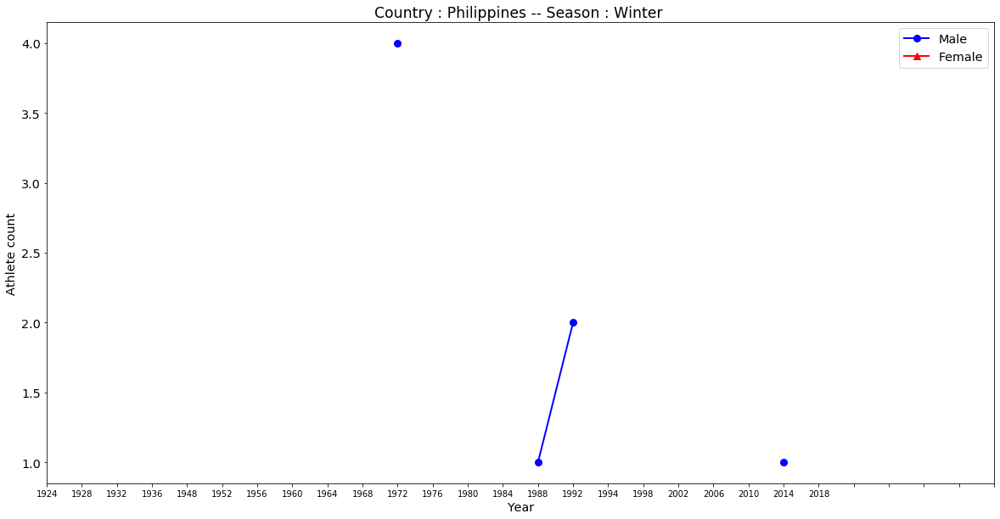

8


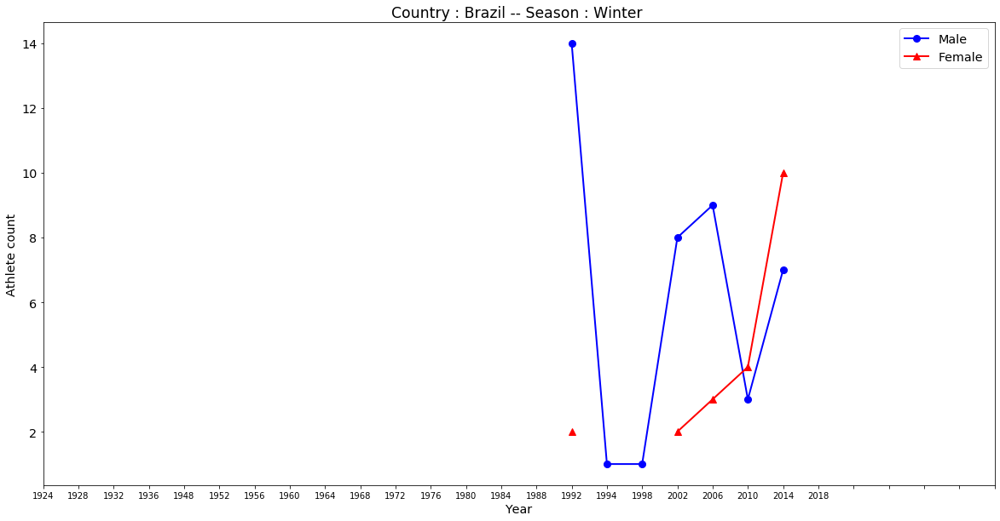

9


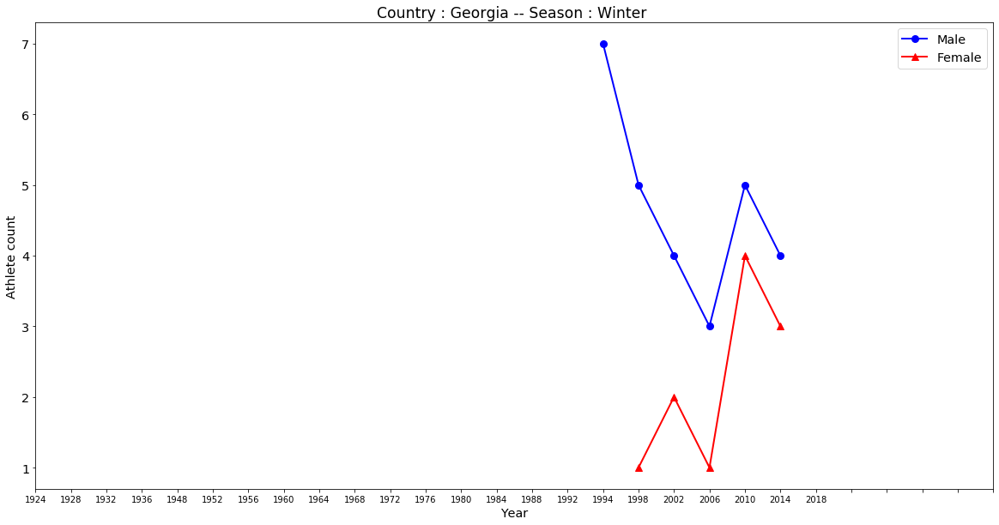

10


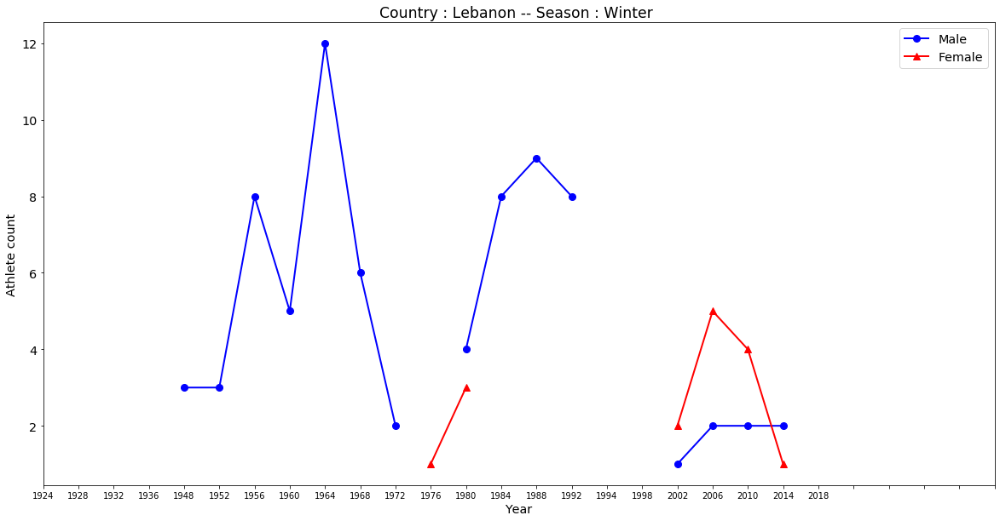

11


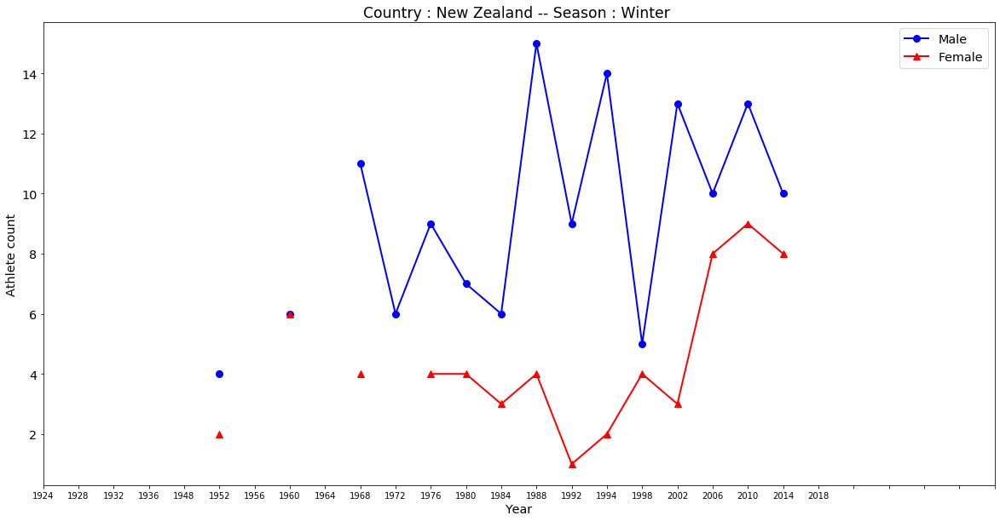

12


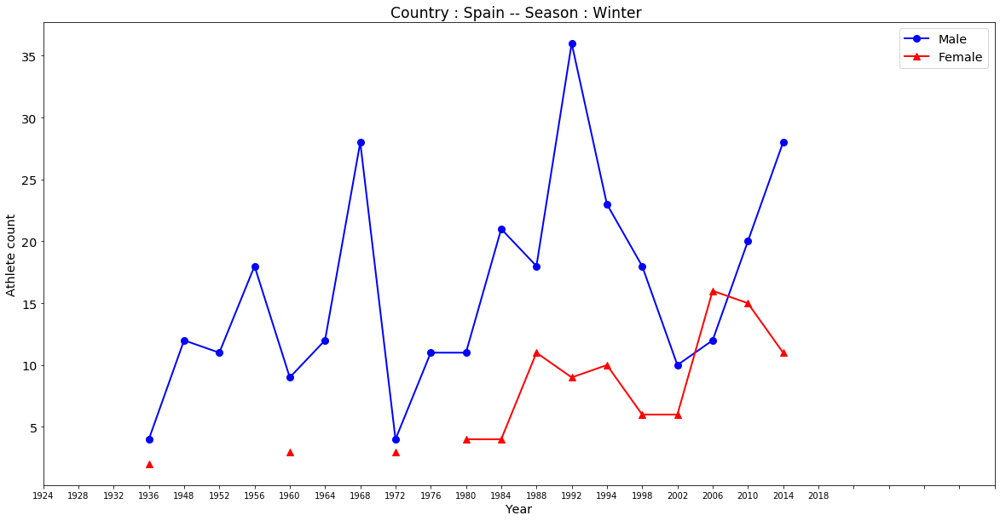

13


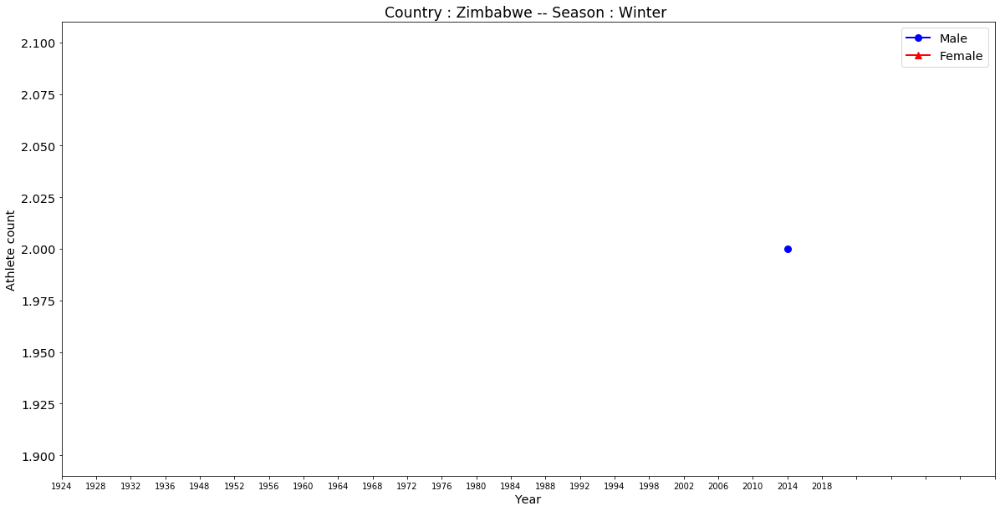

14


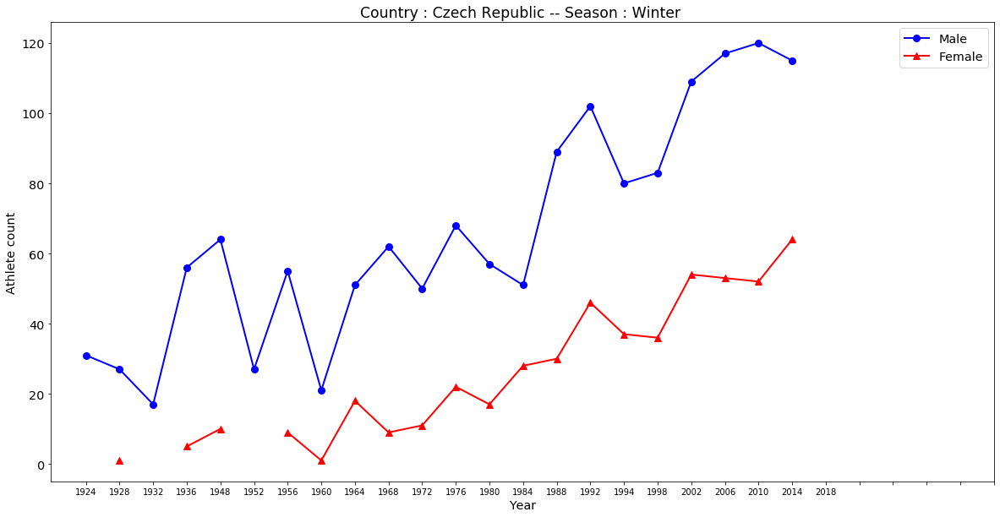

15


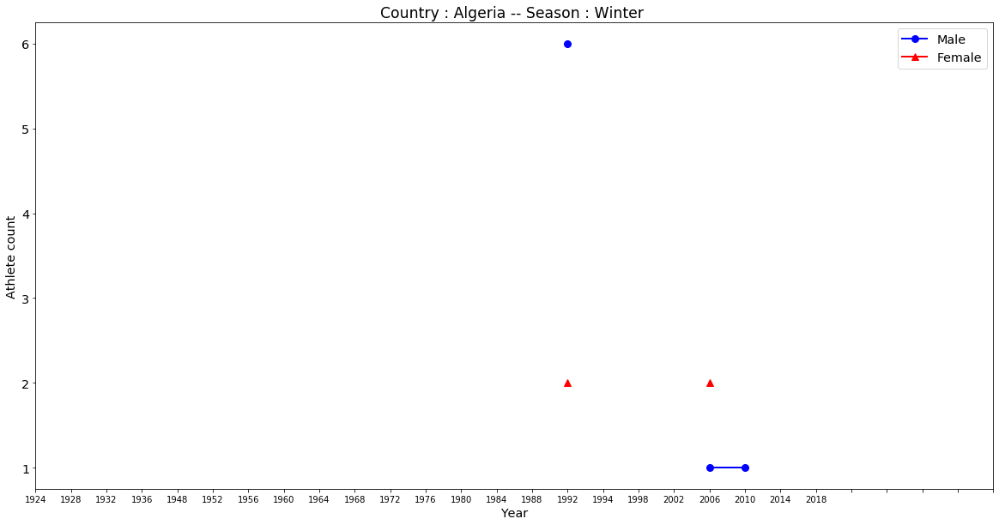

16


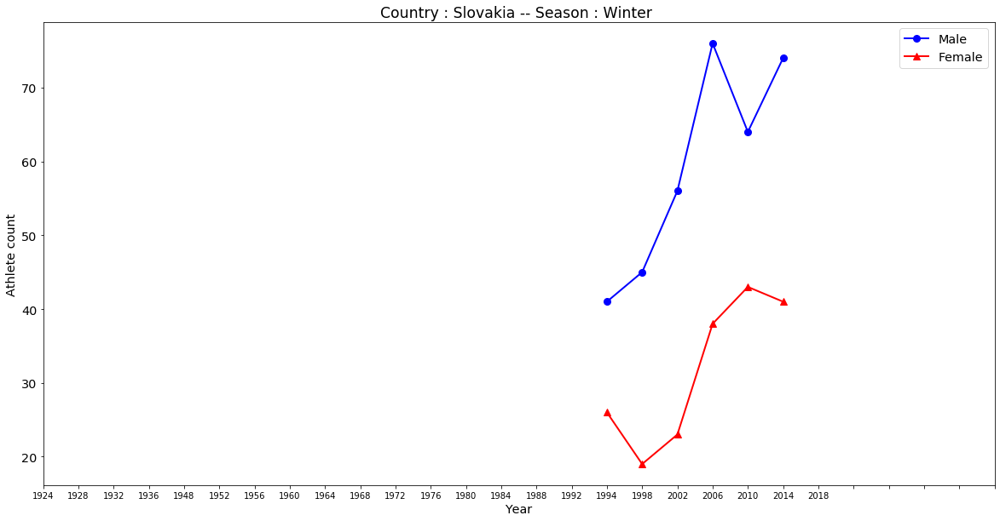

17


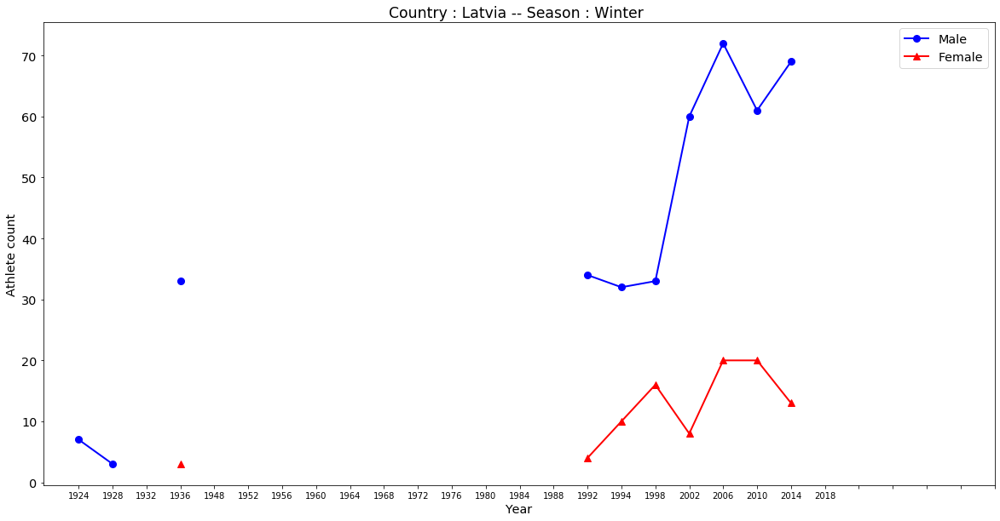

18


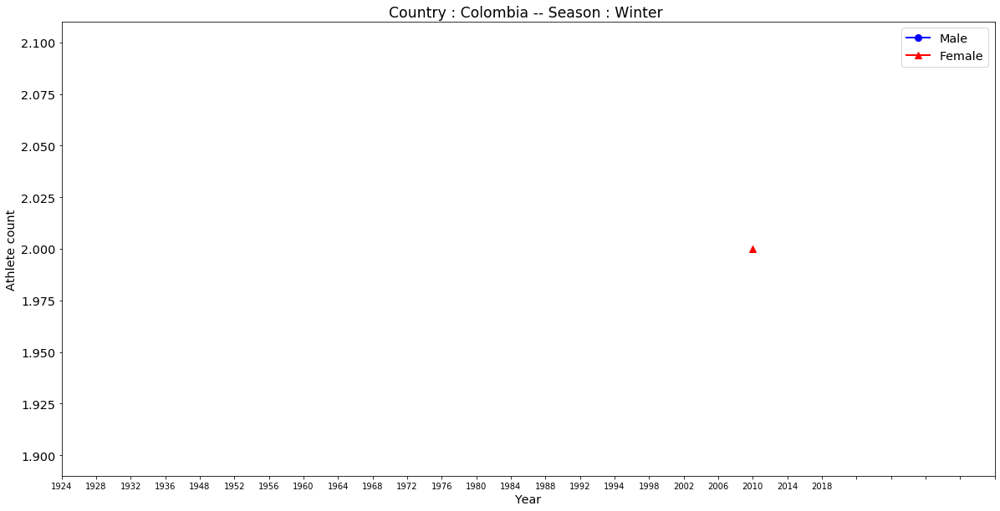

19


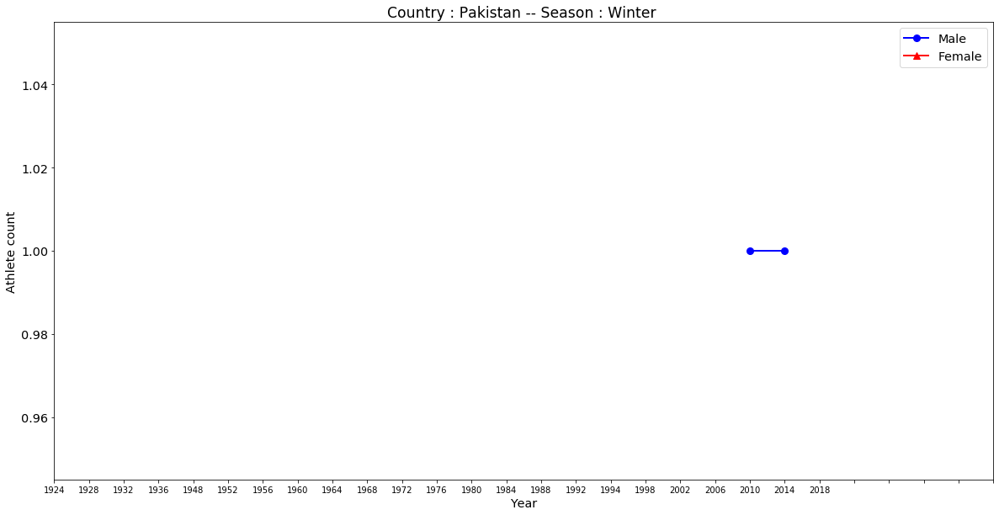

20


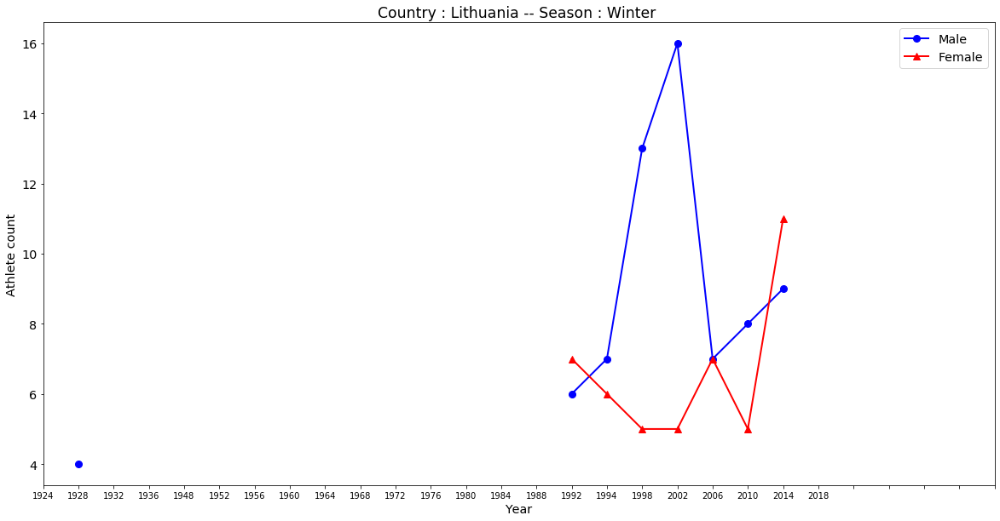

21


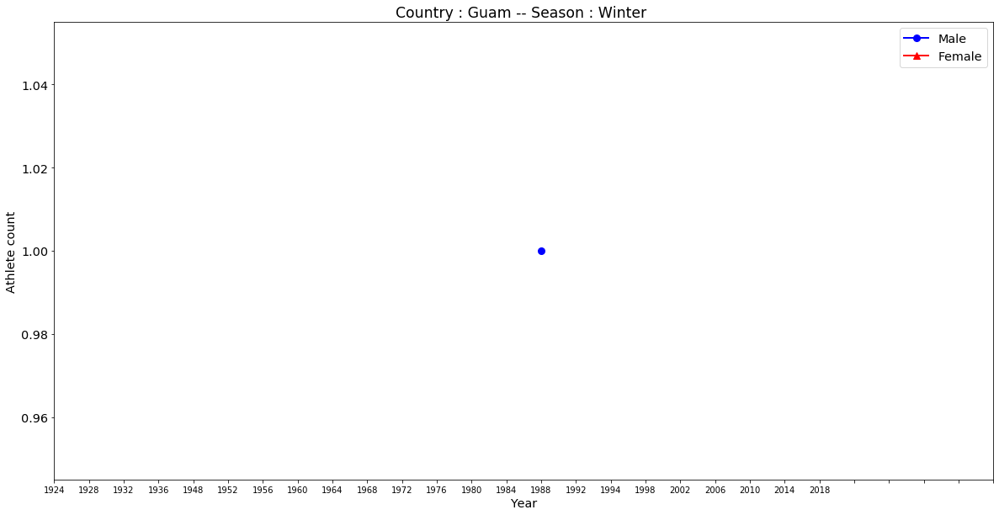

22


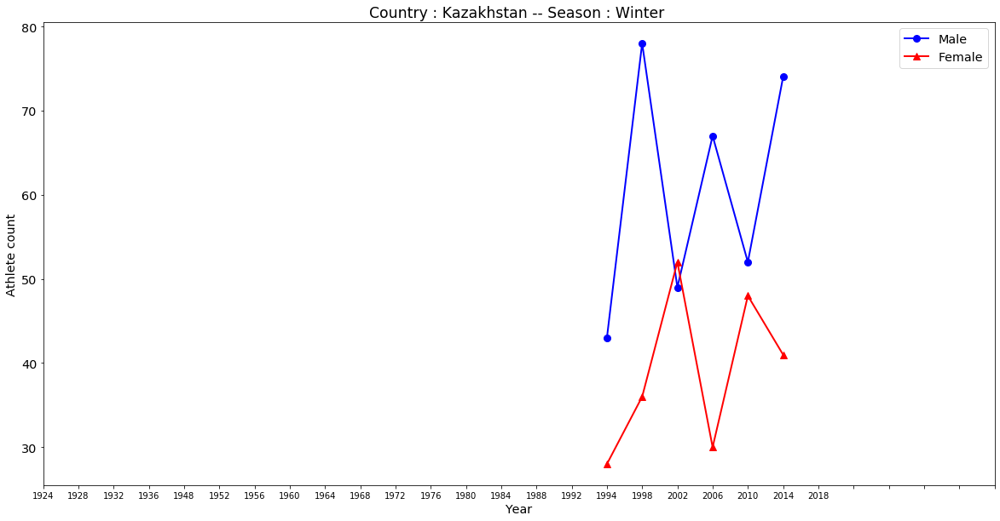

23


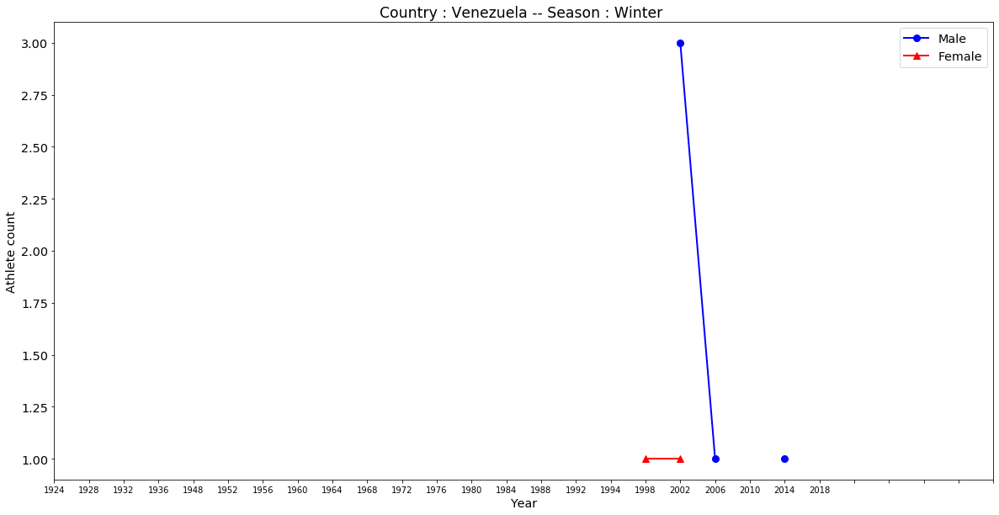

24


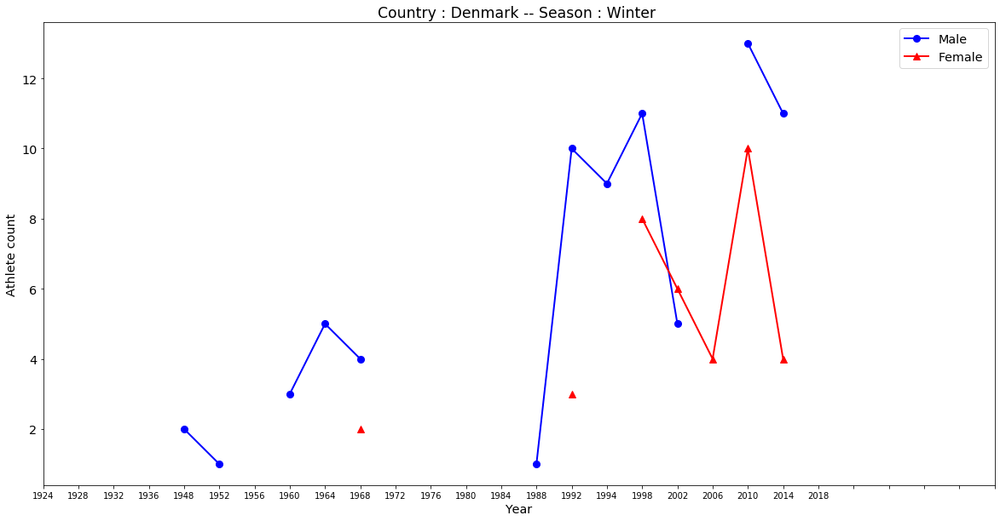

25


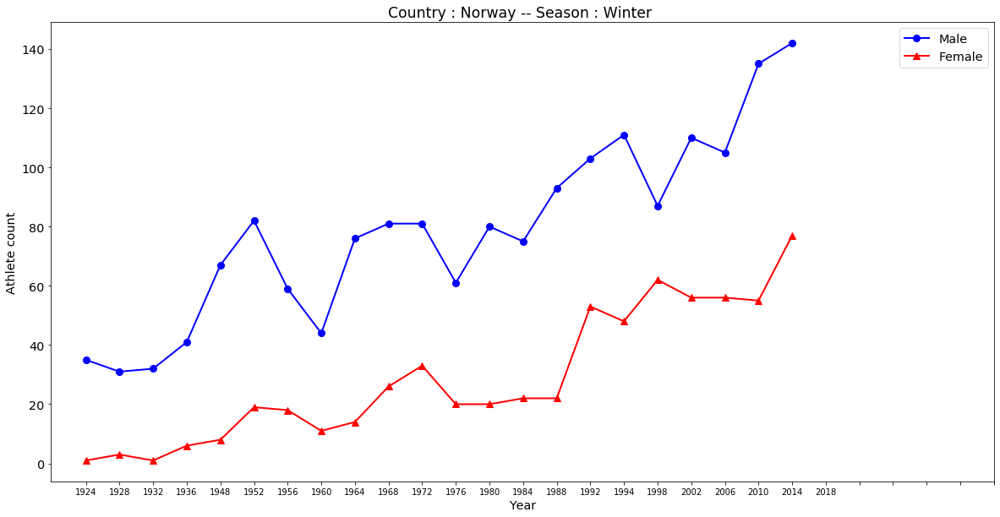

26


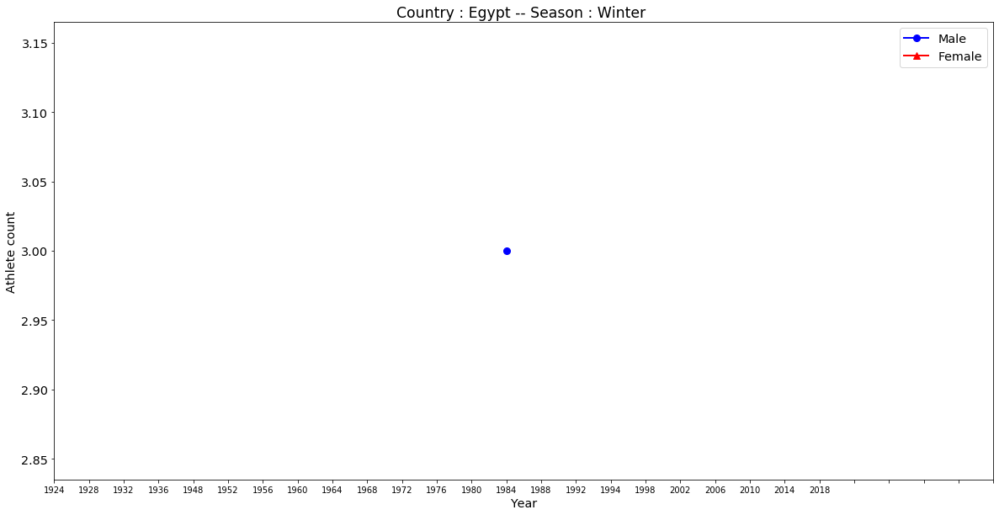

27


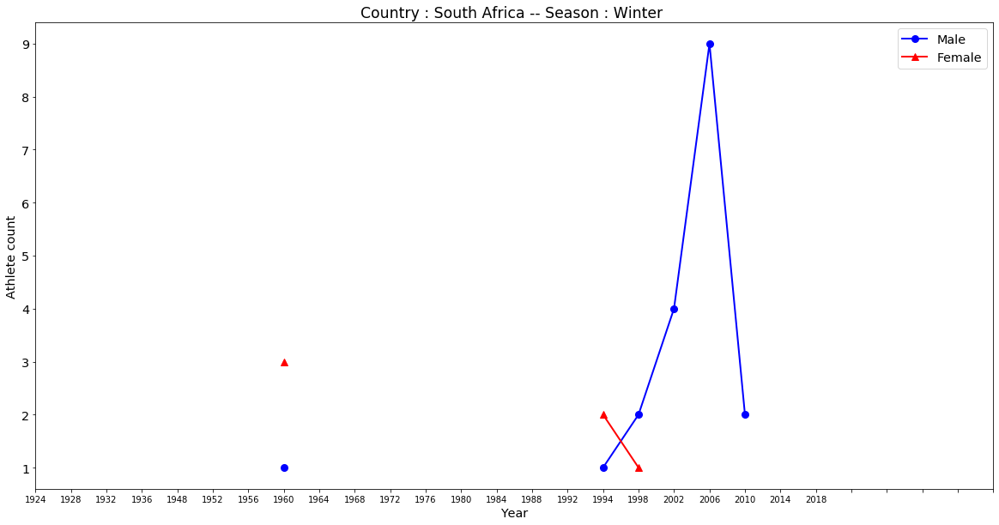

28


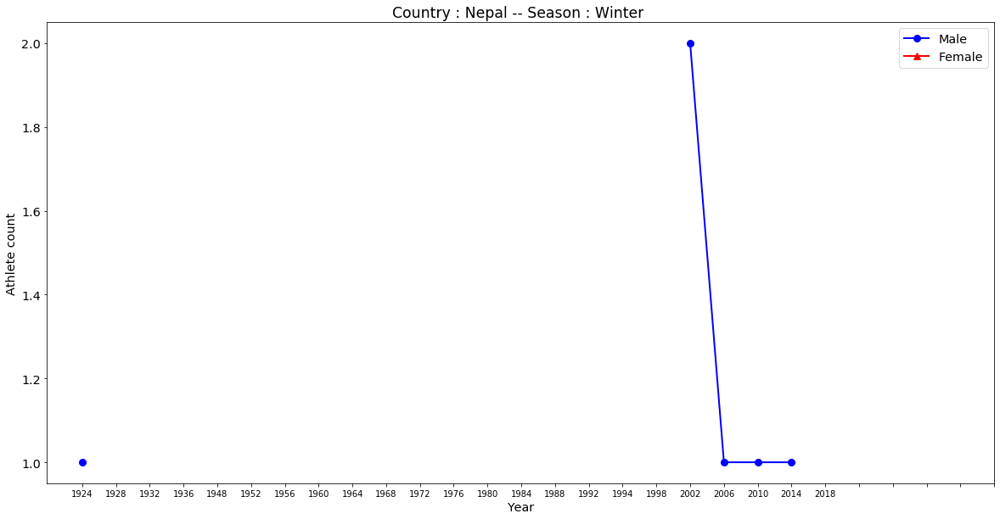

29


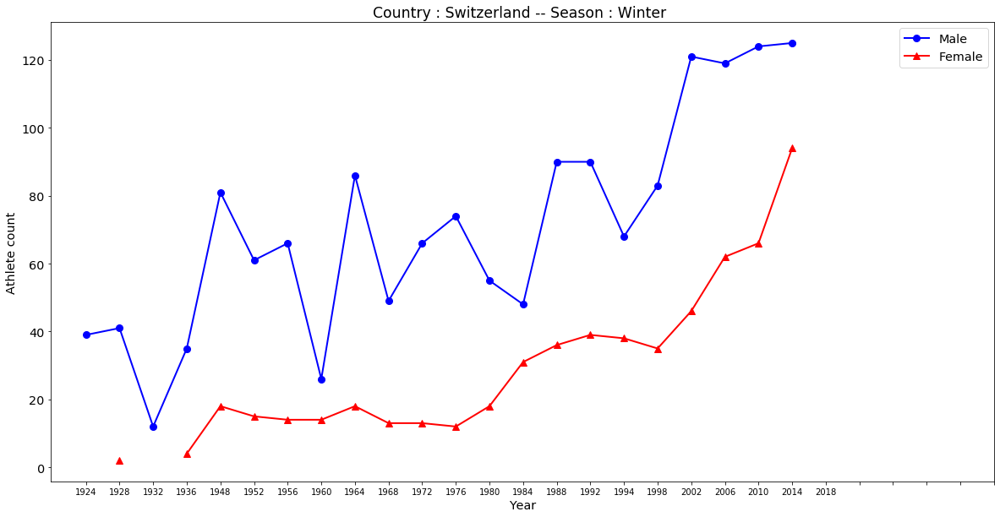

30


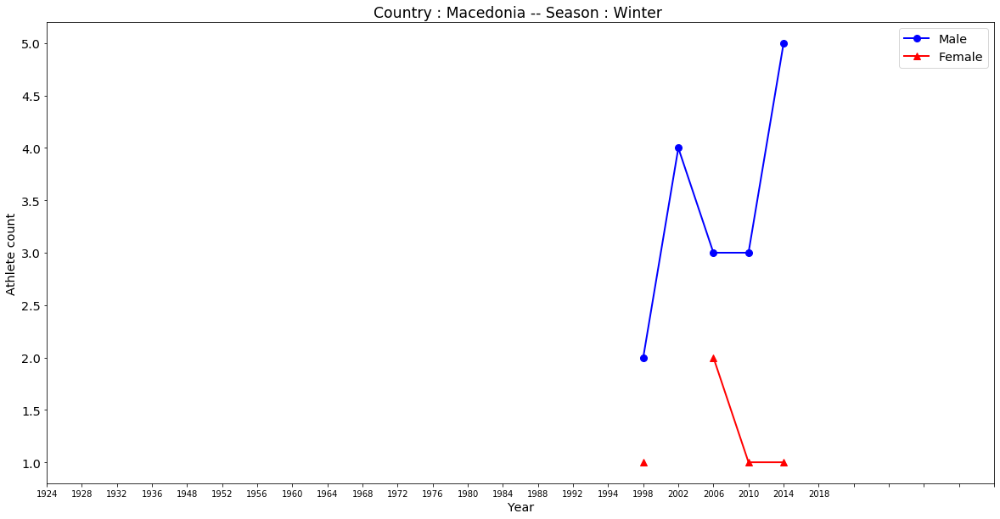

31


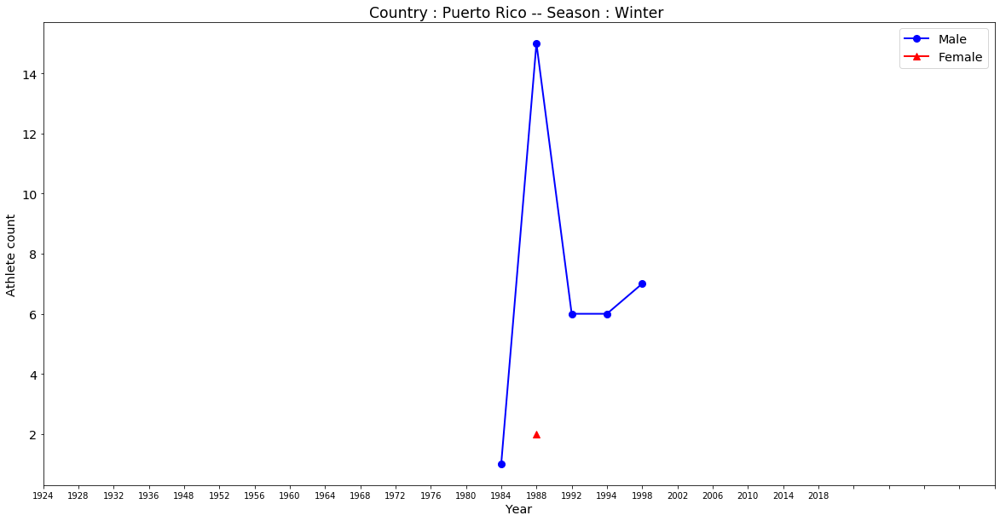

32


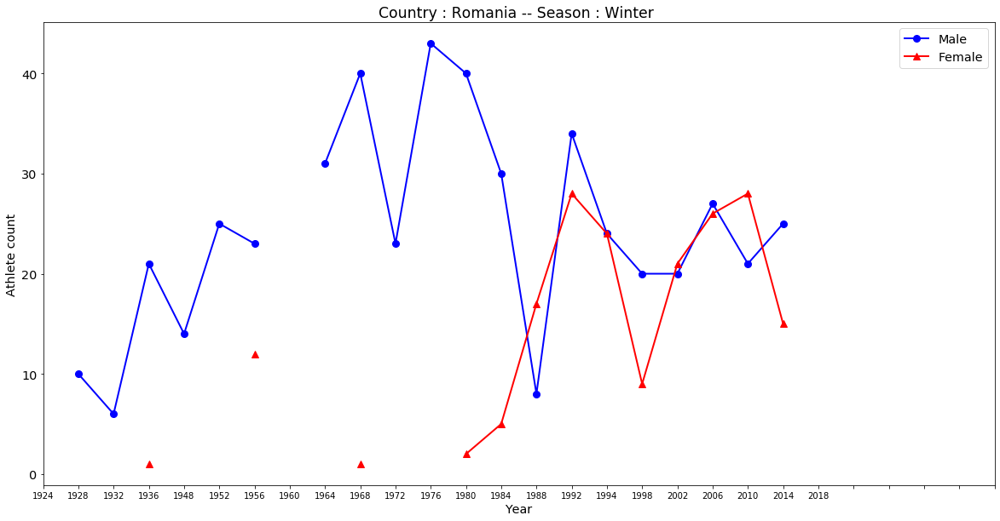

33


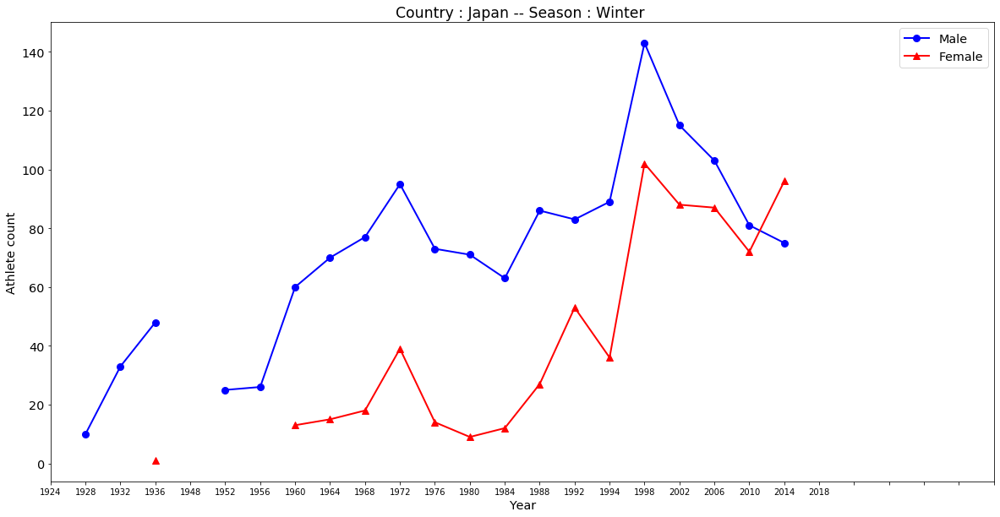

34


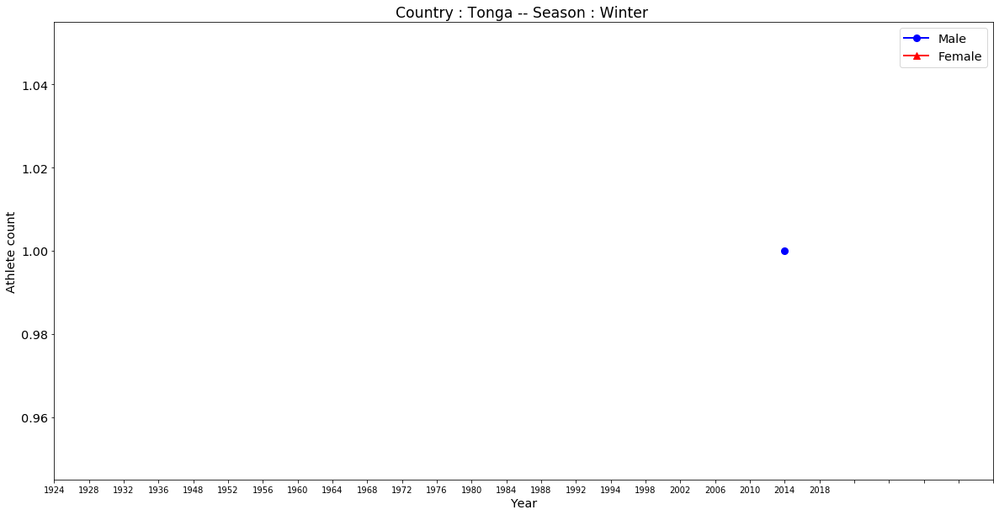

35


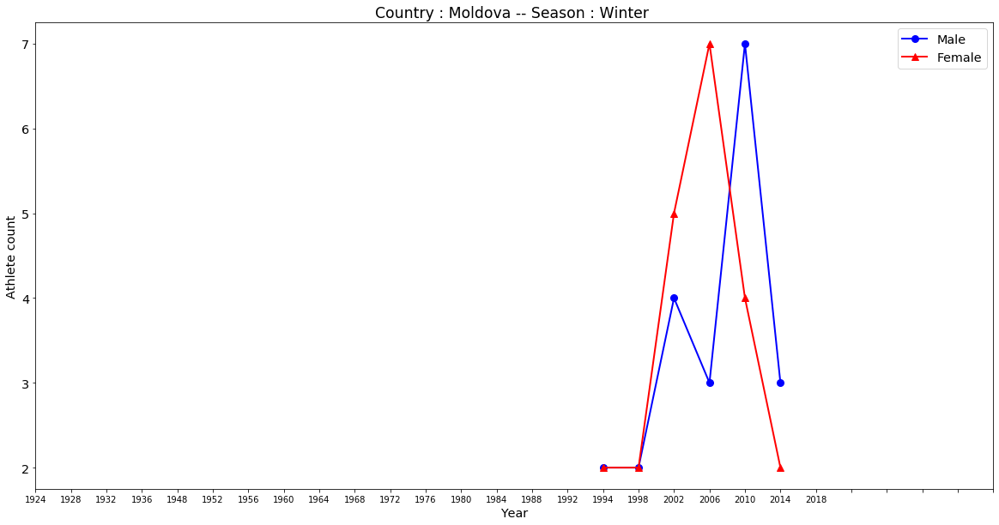

36


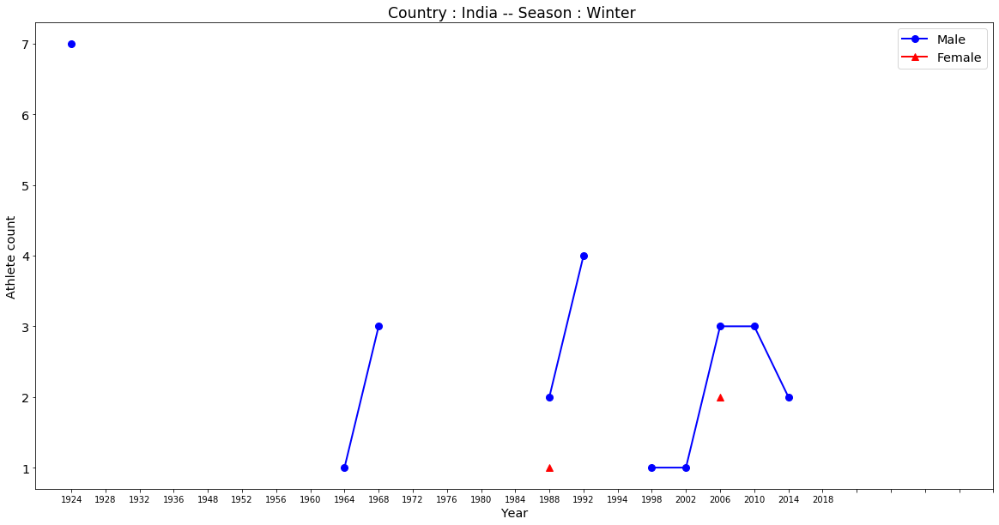

37


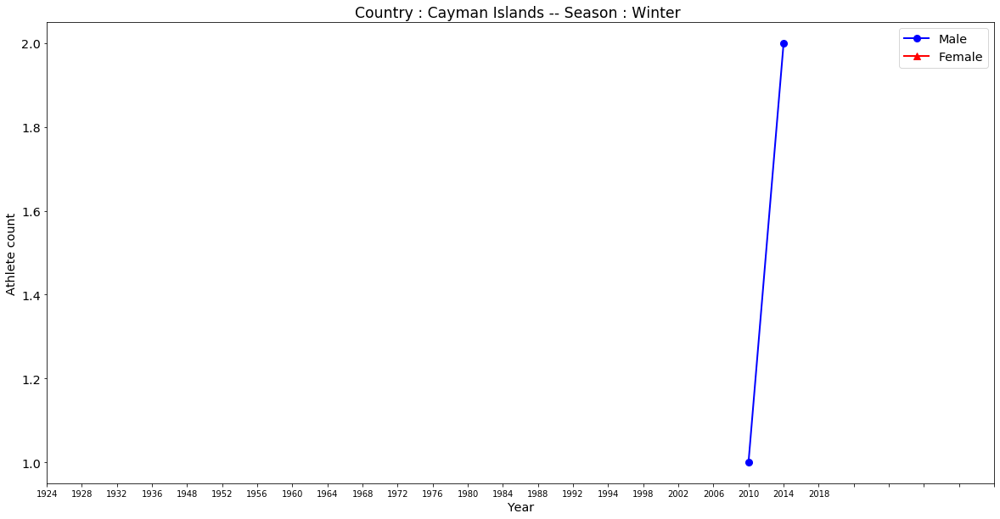

38


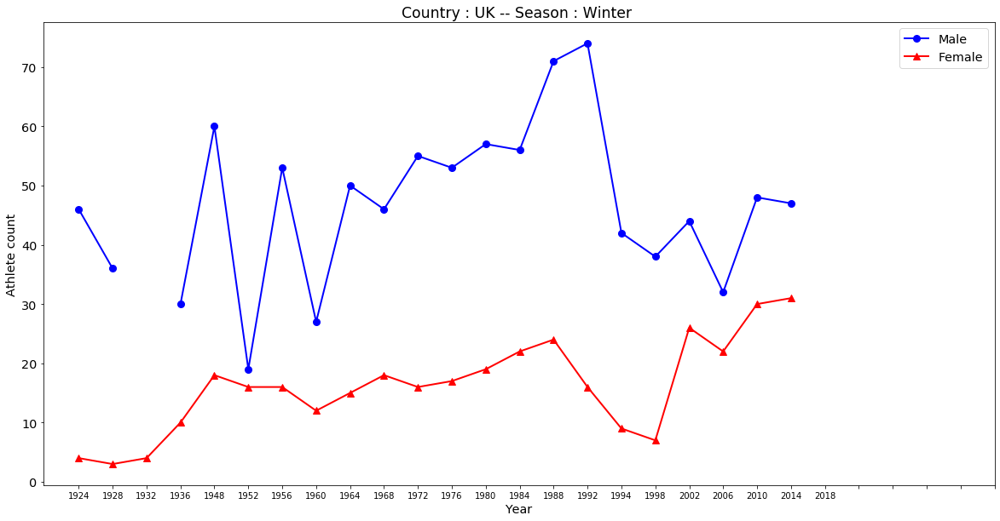

39


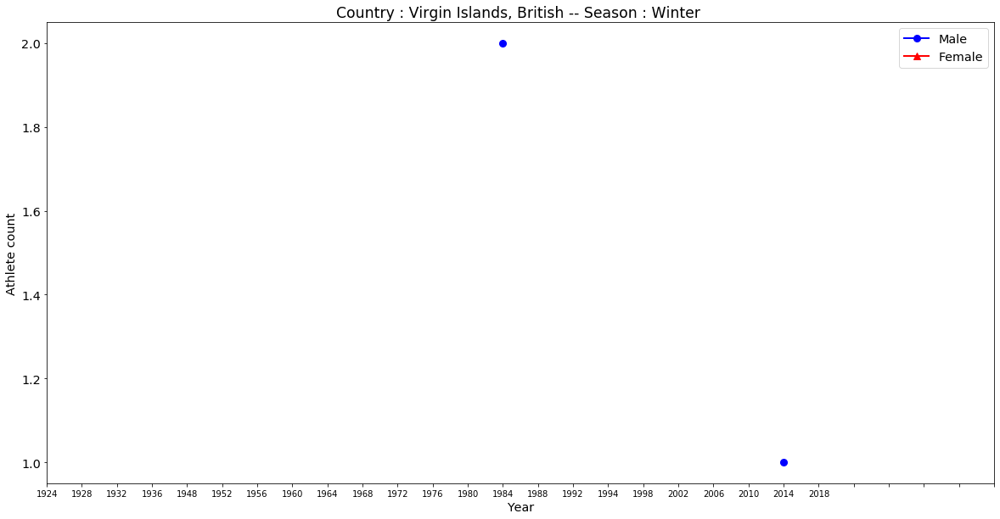

40


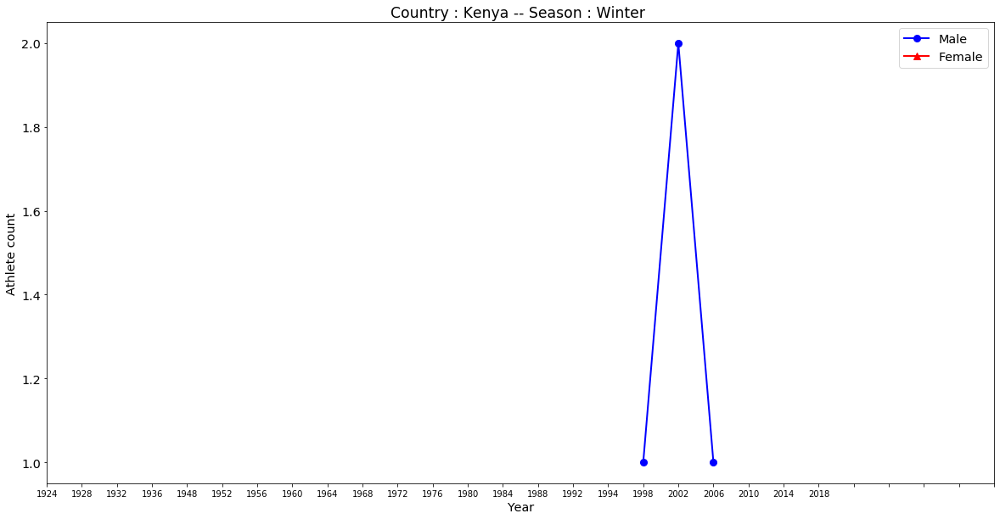

41


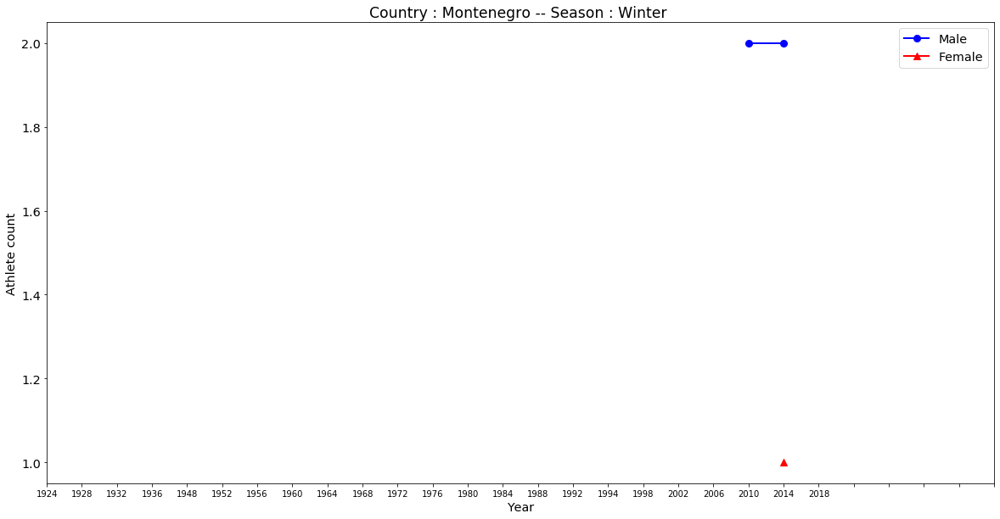

42


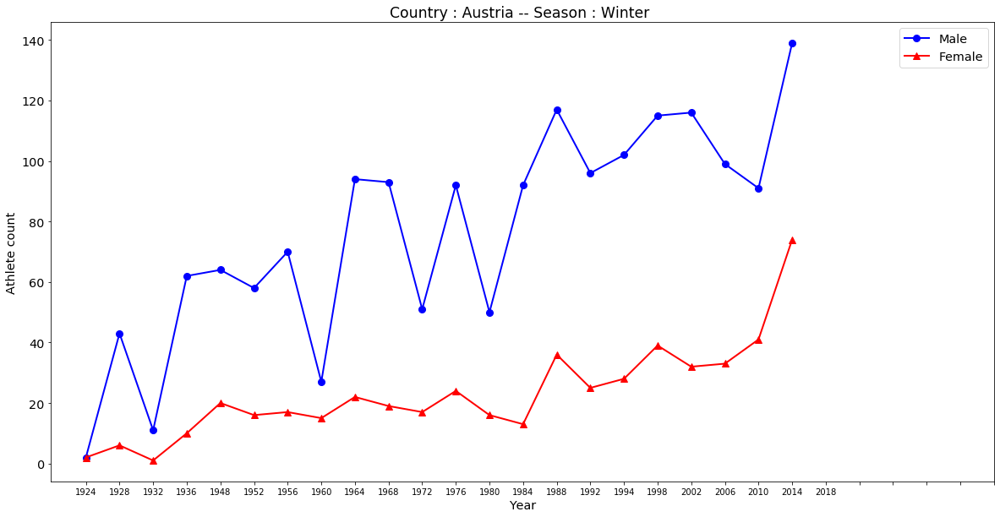

43


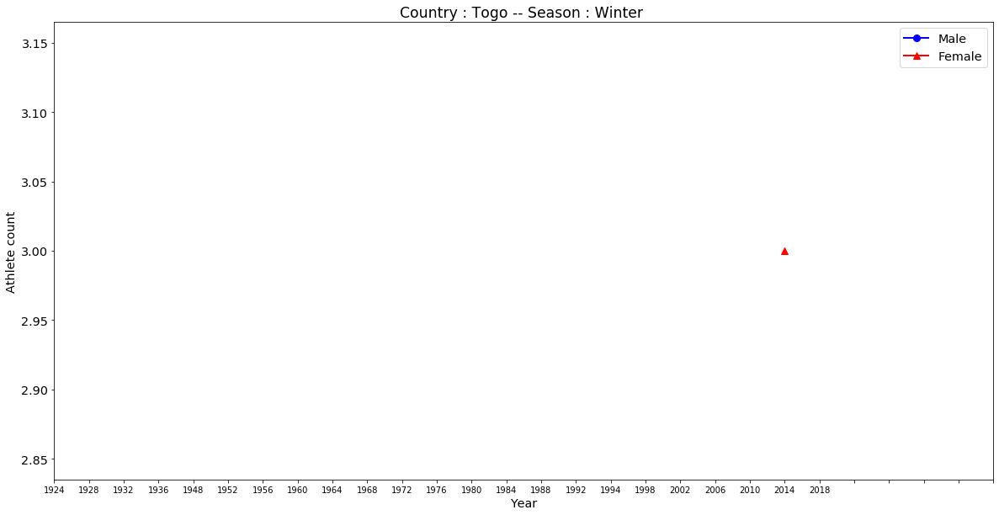

44


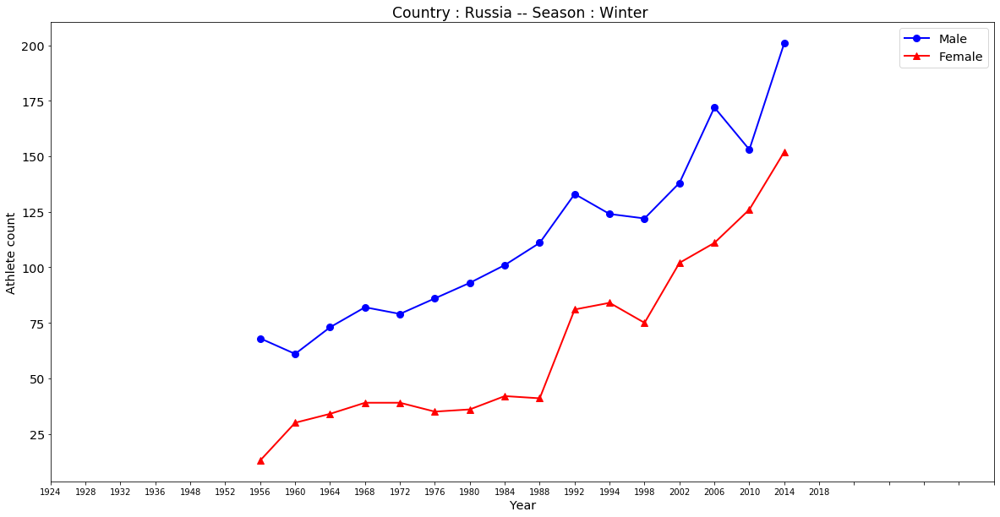

45


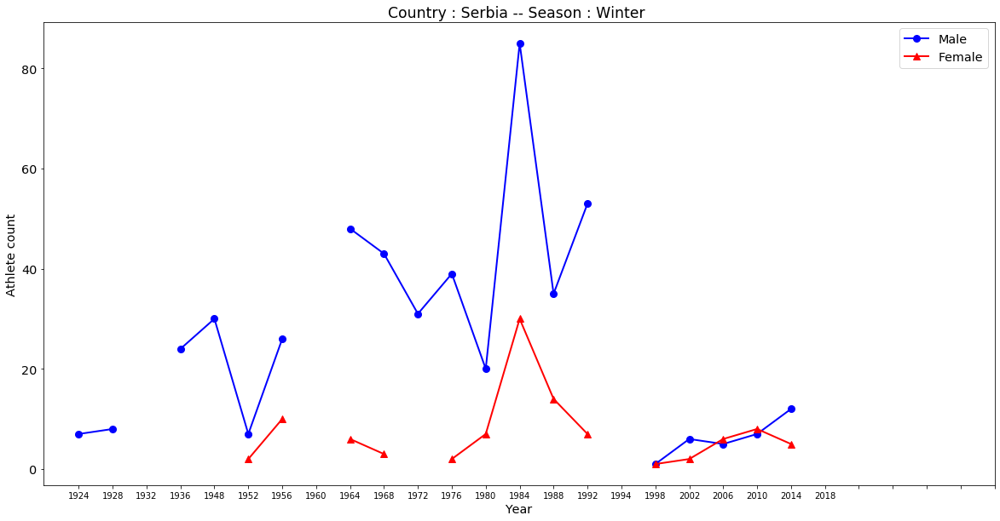

46


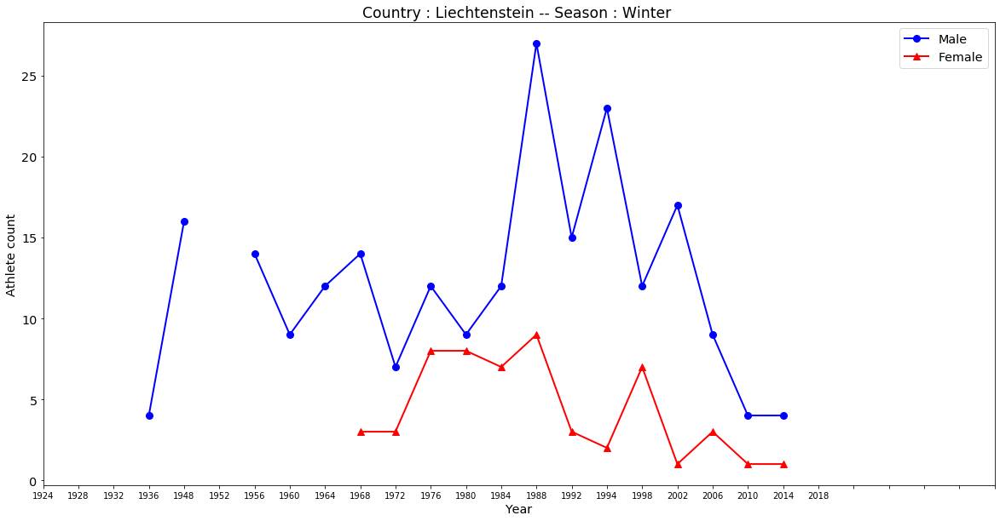

47


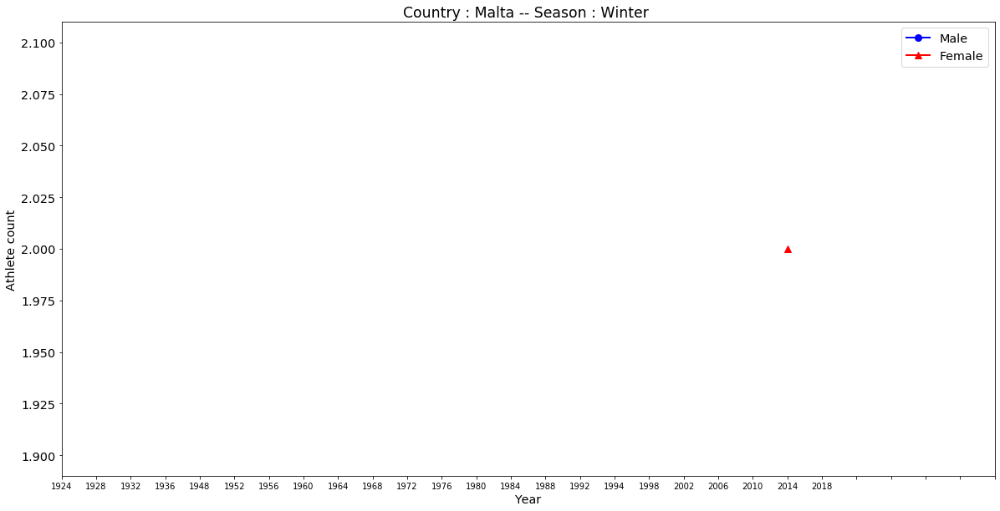

48


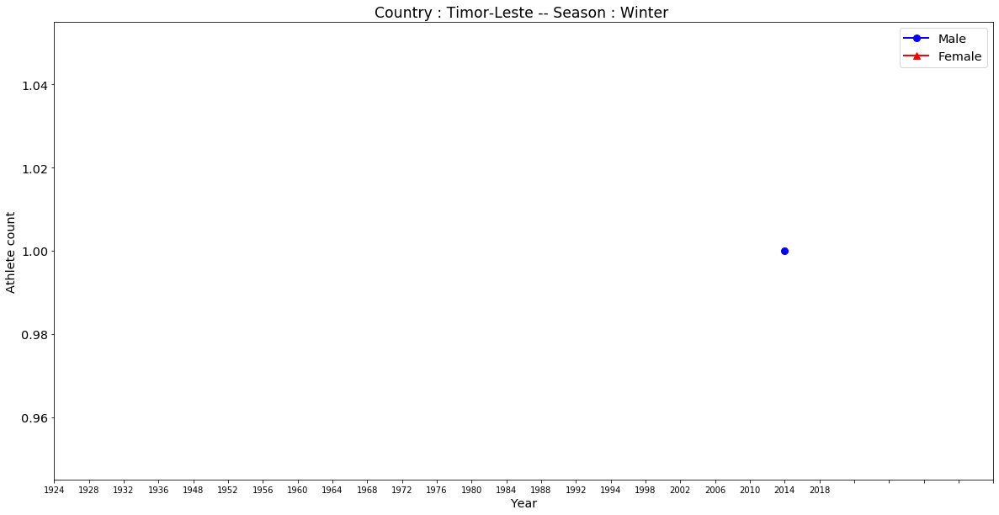

49


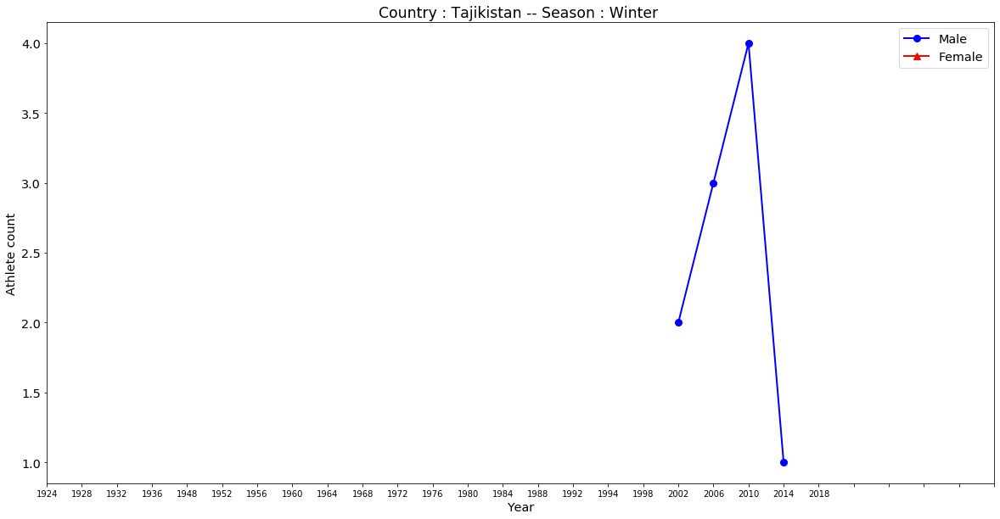

50


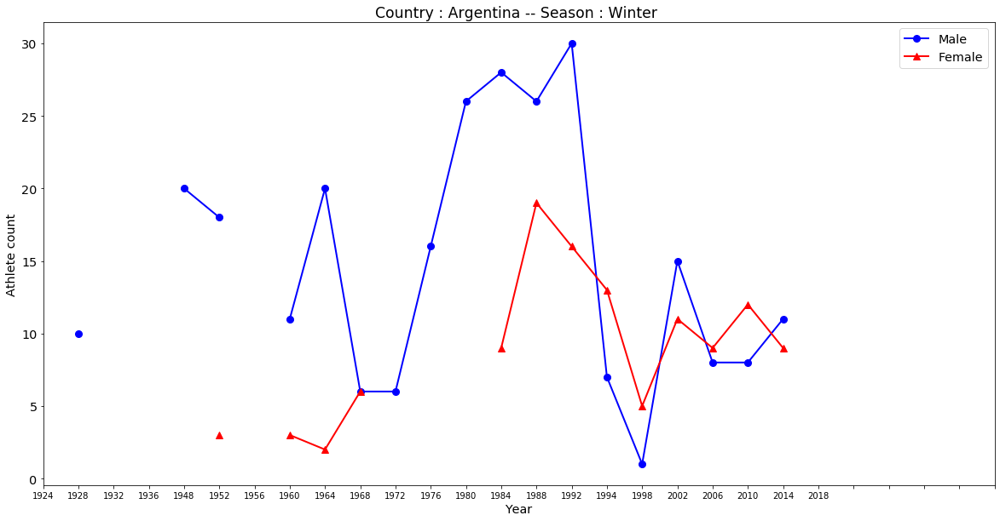

51


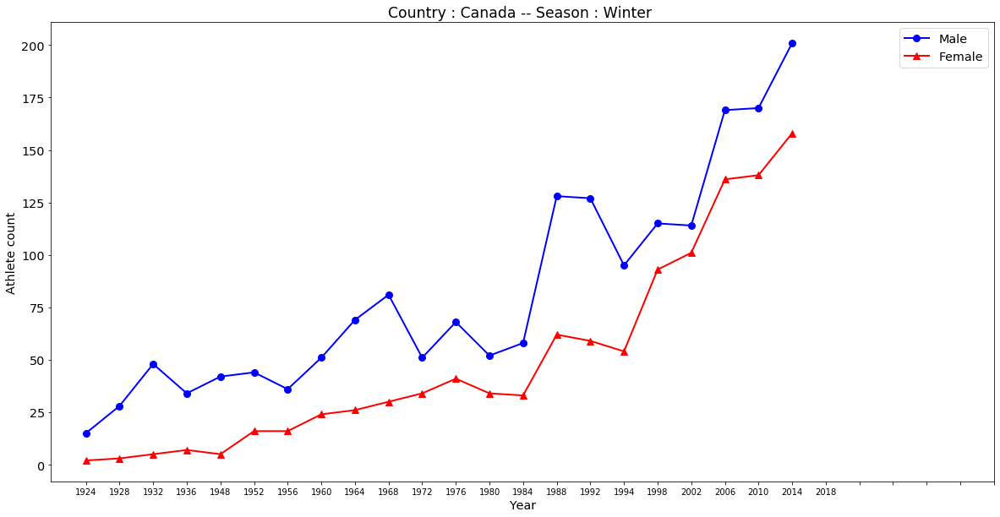

52


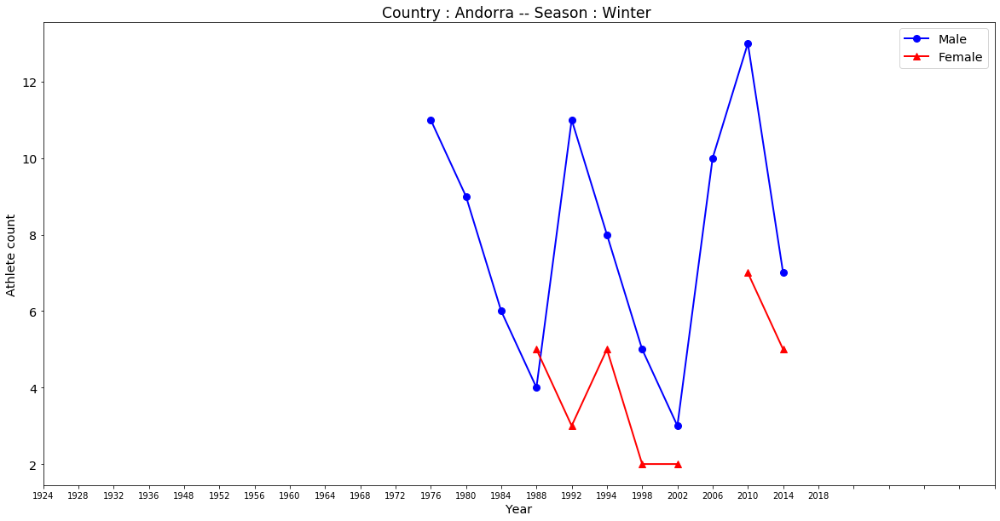

53


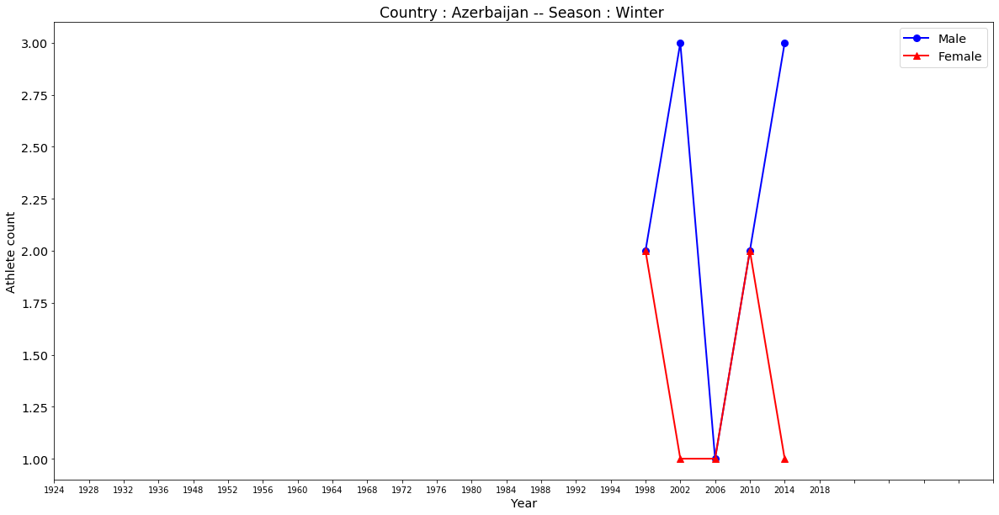

54


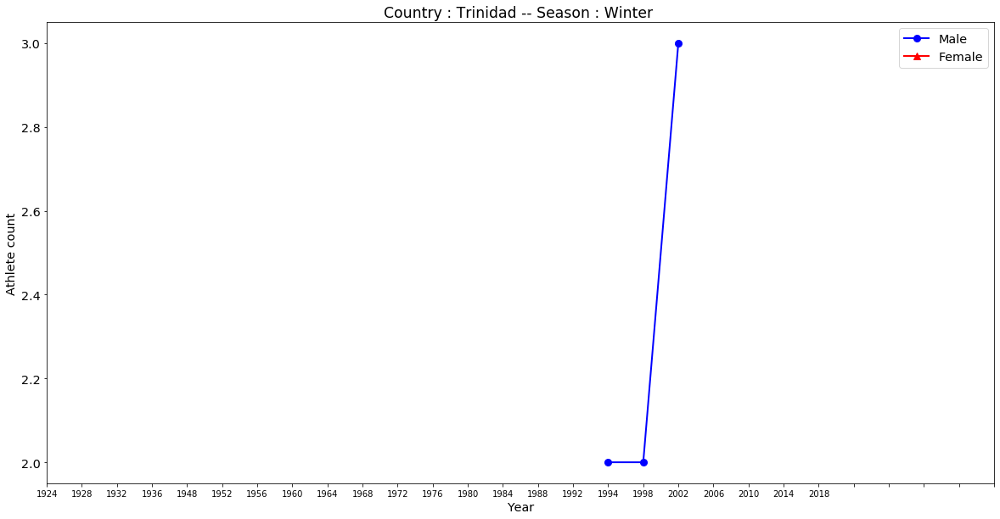

55


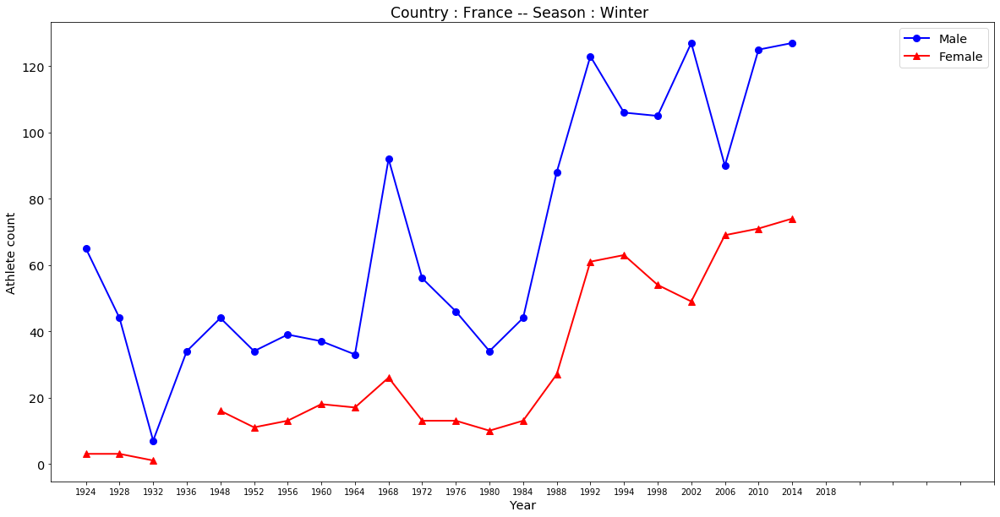

56


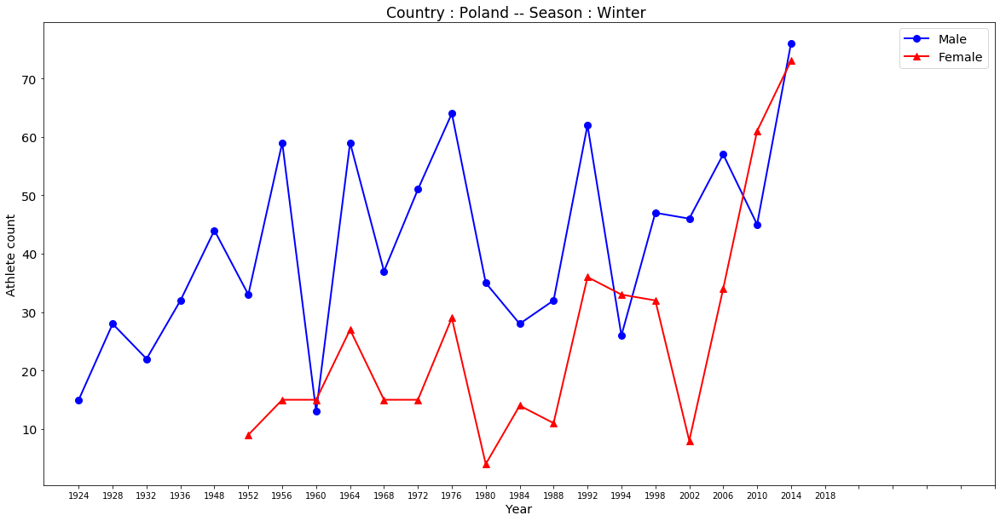

57


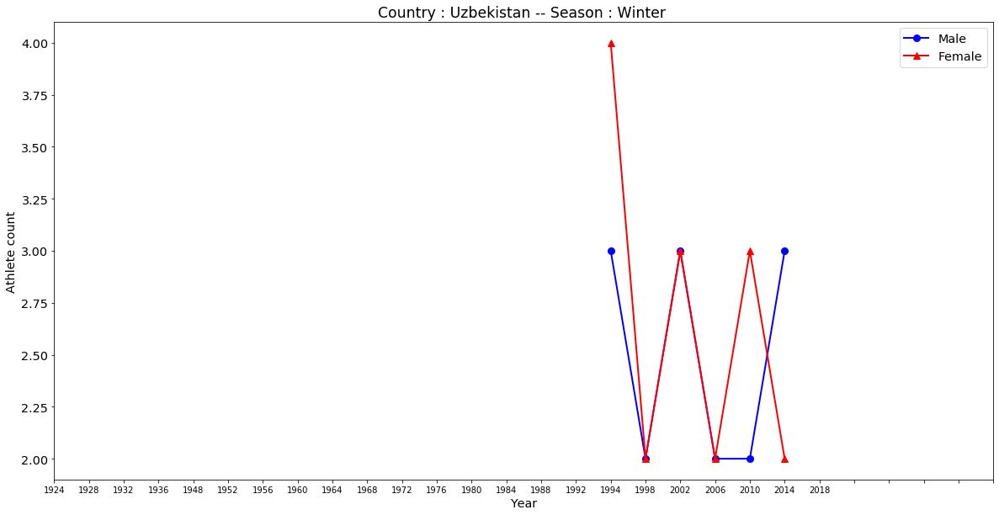

58


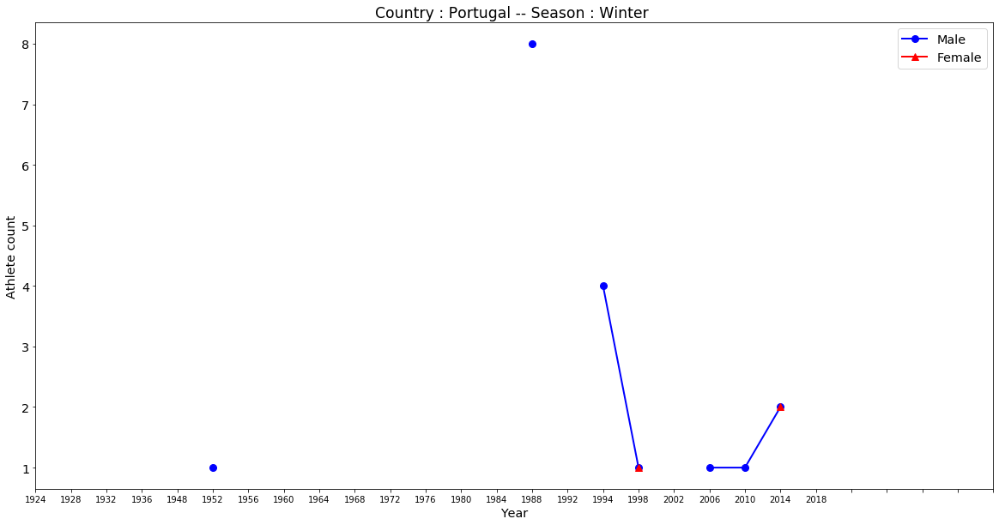

59


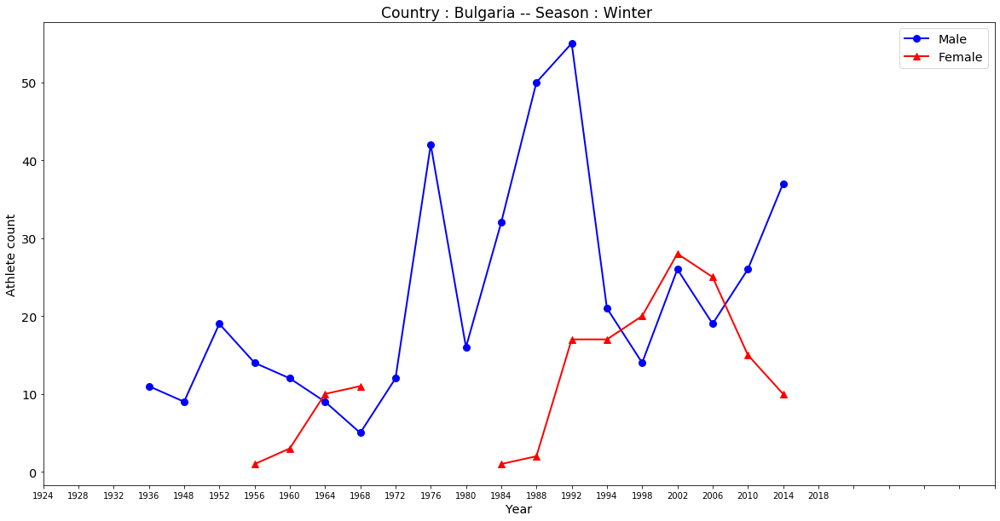

60


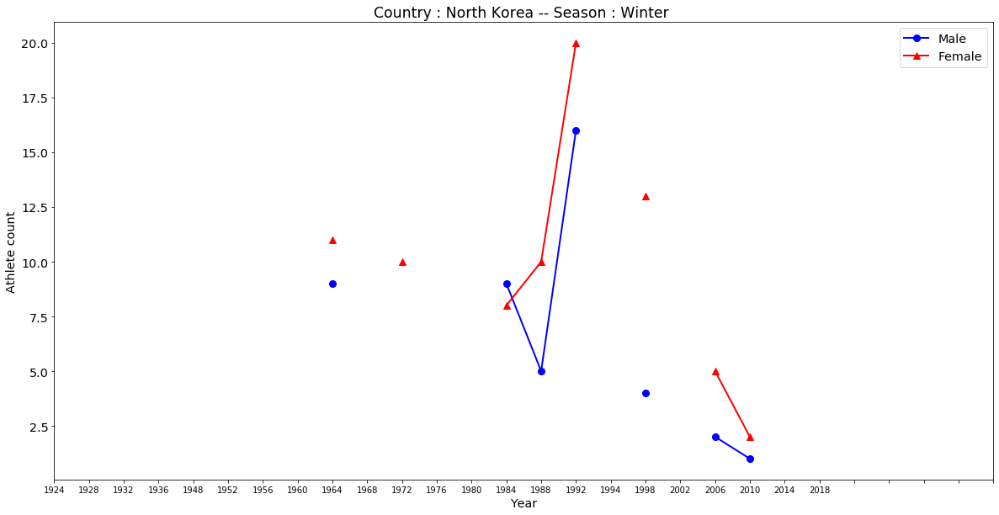

61


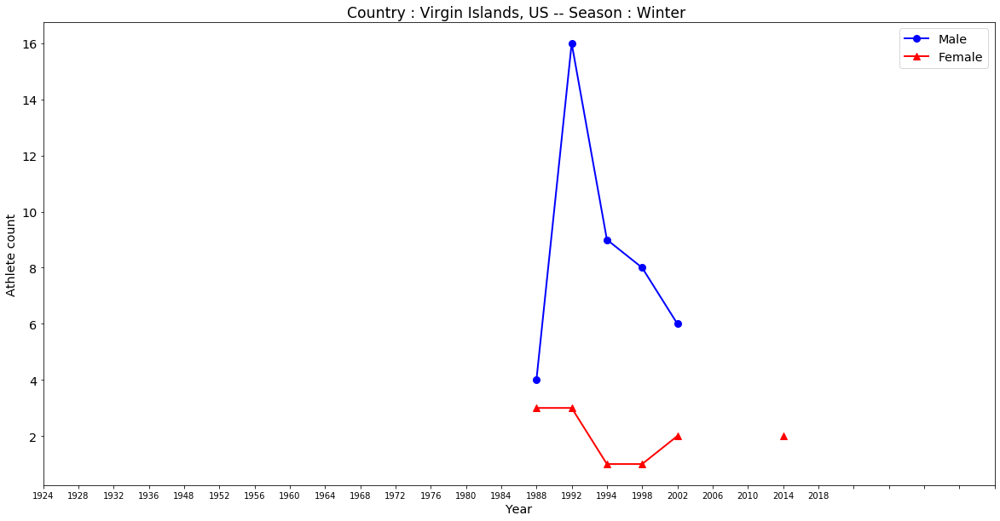

62


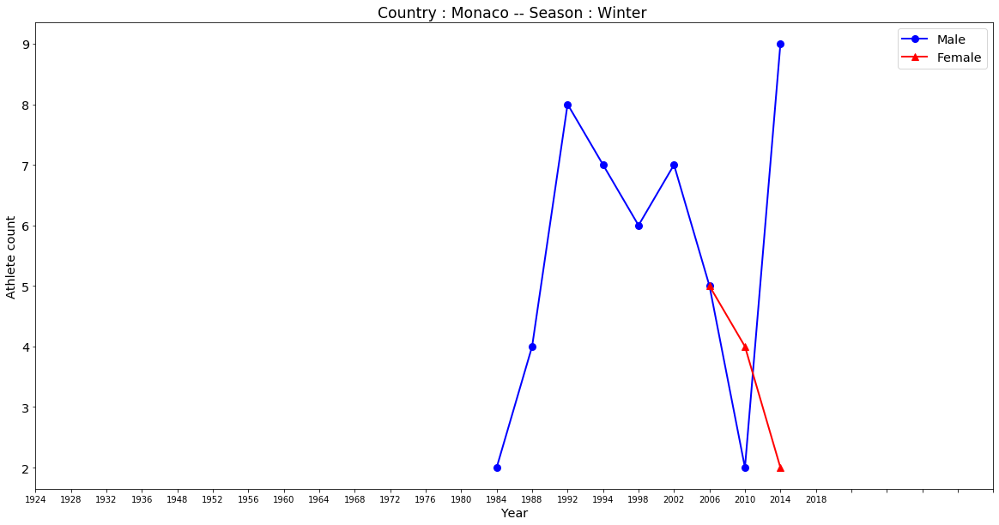

63


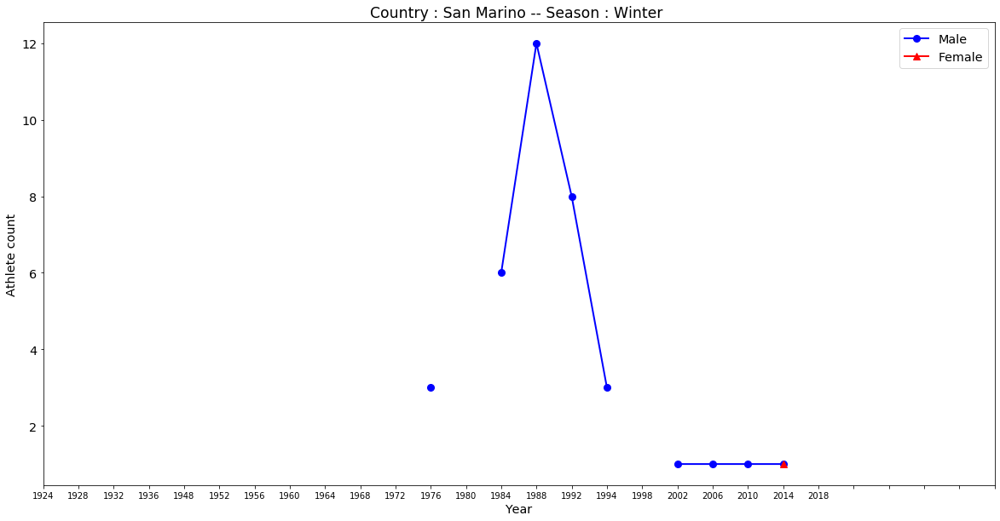

64


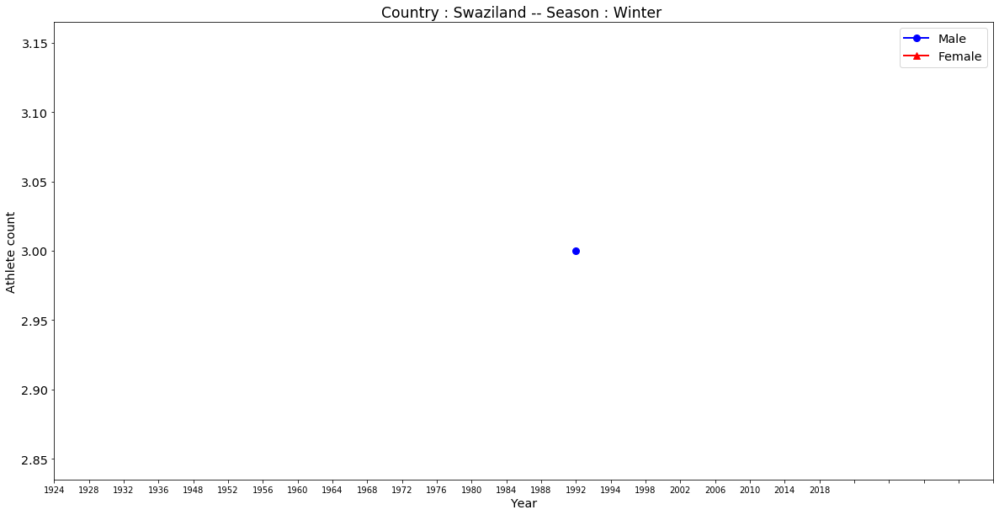

65


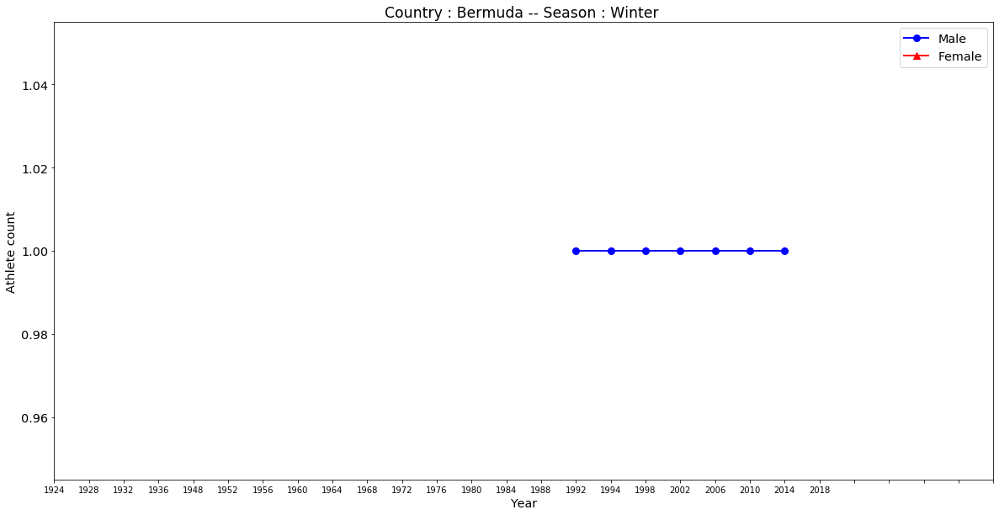

66


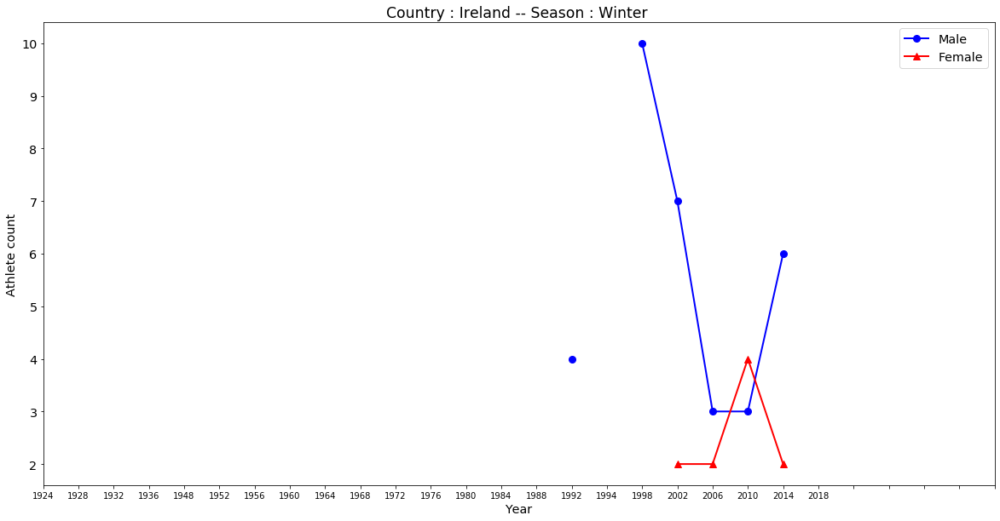

67


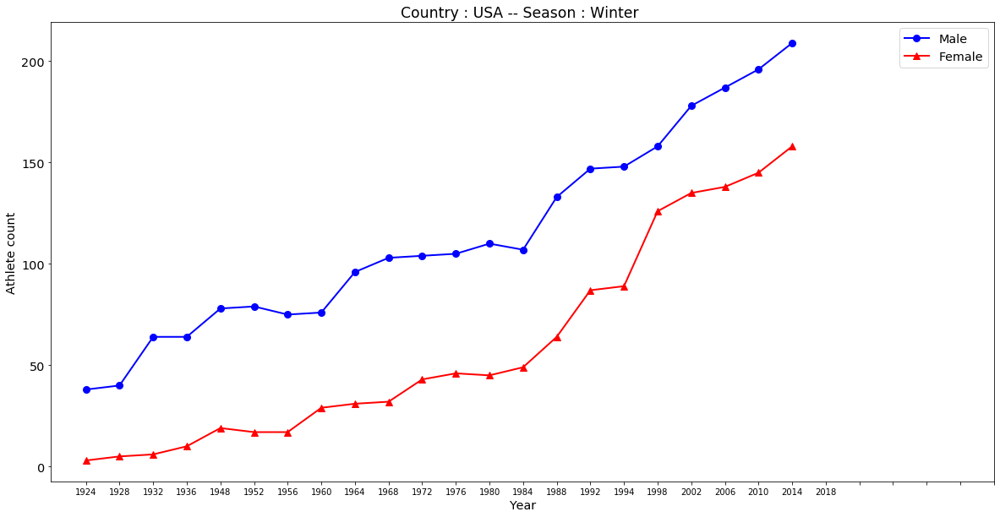

68


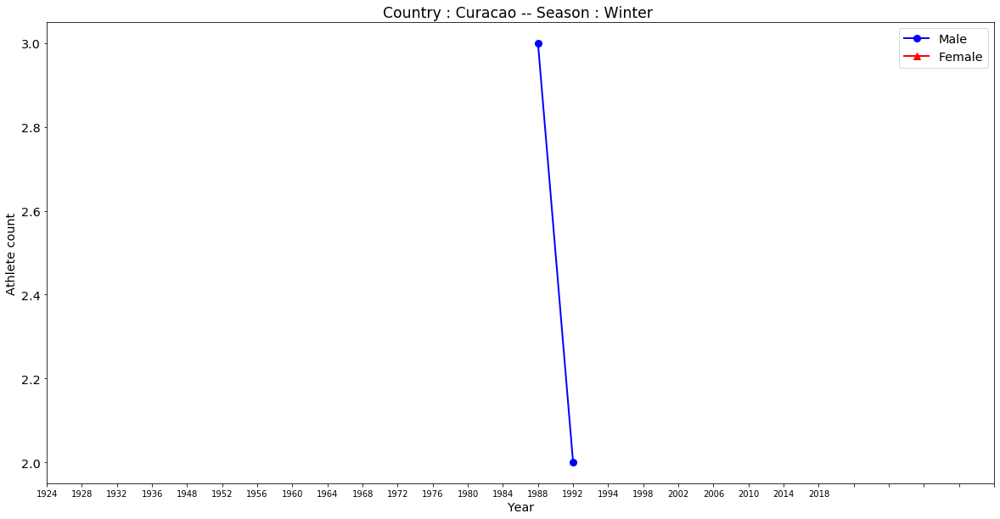

69


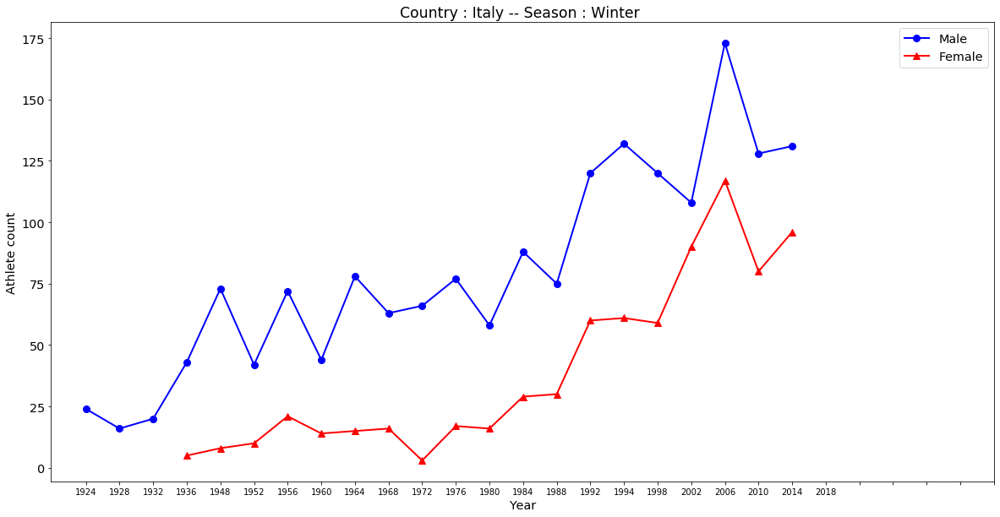

70


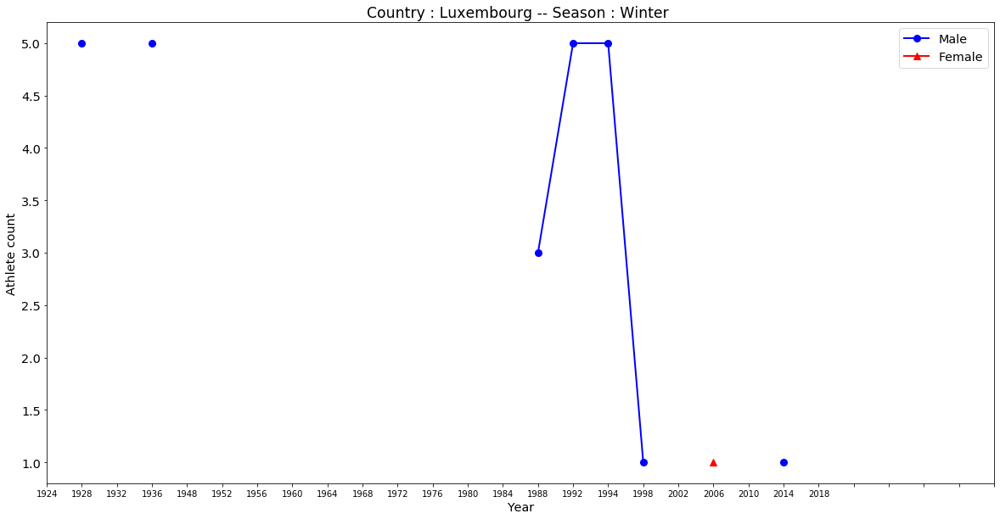

71


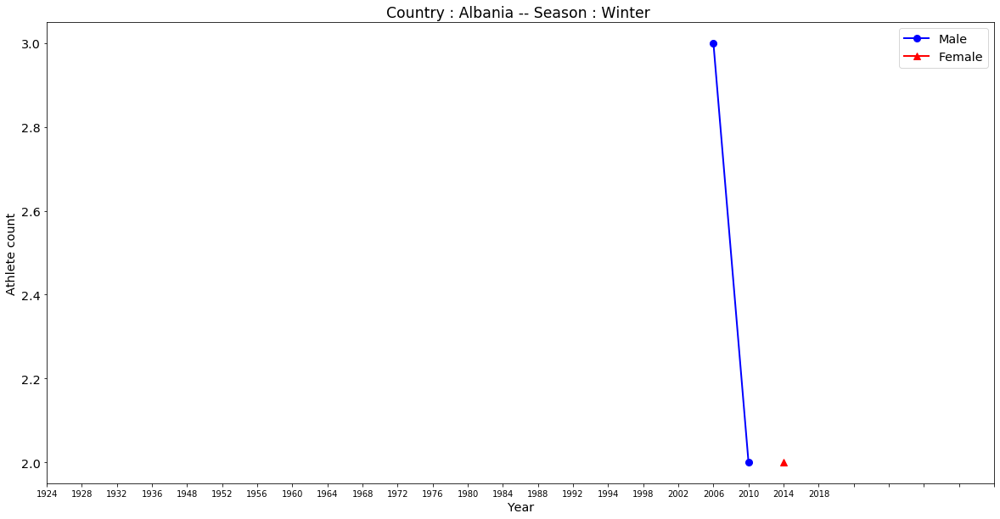

72


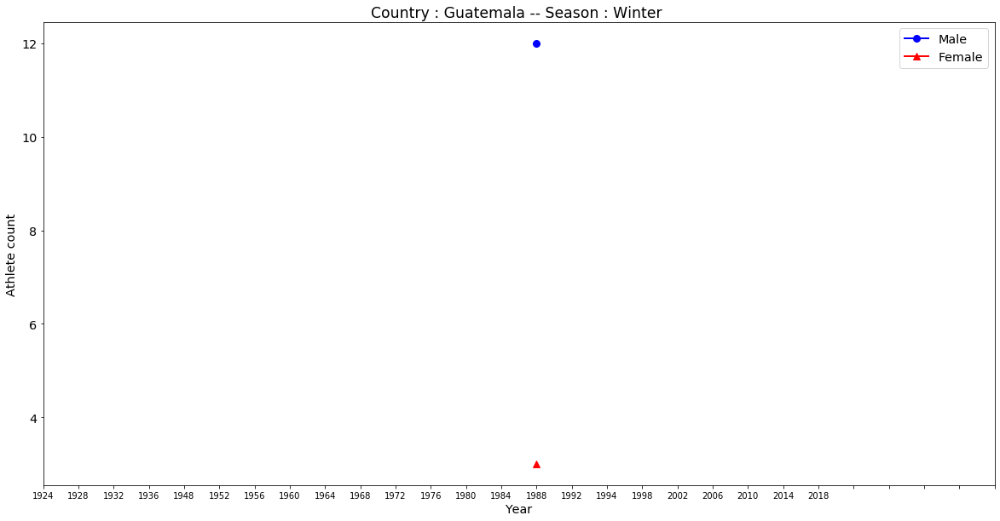

73


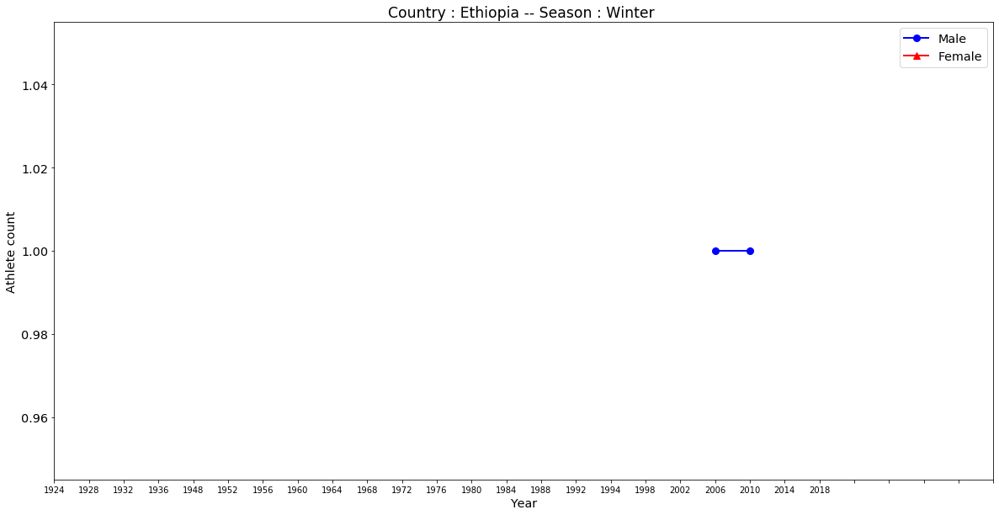

74


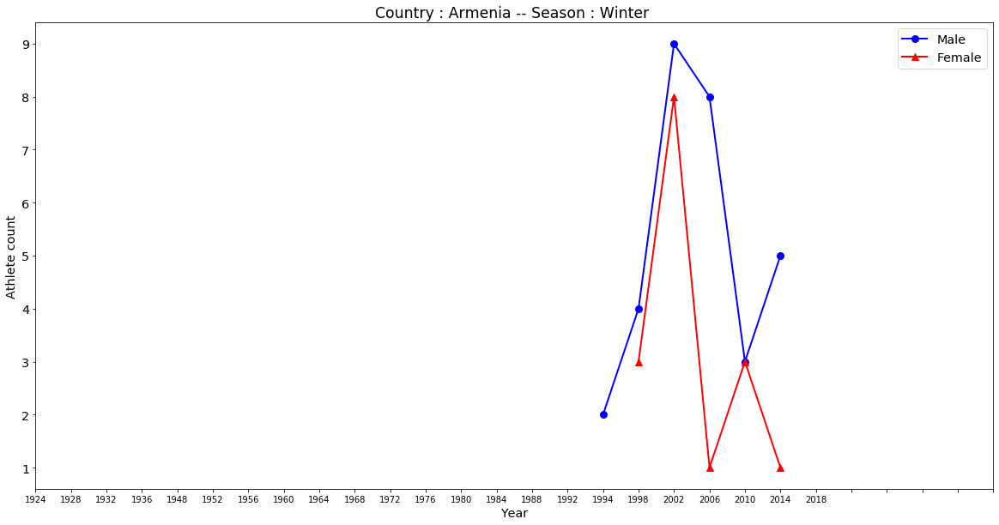

75


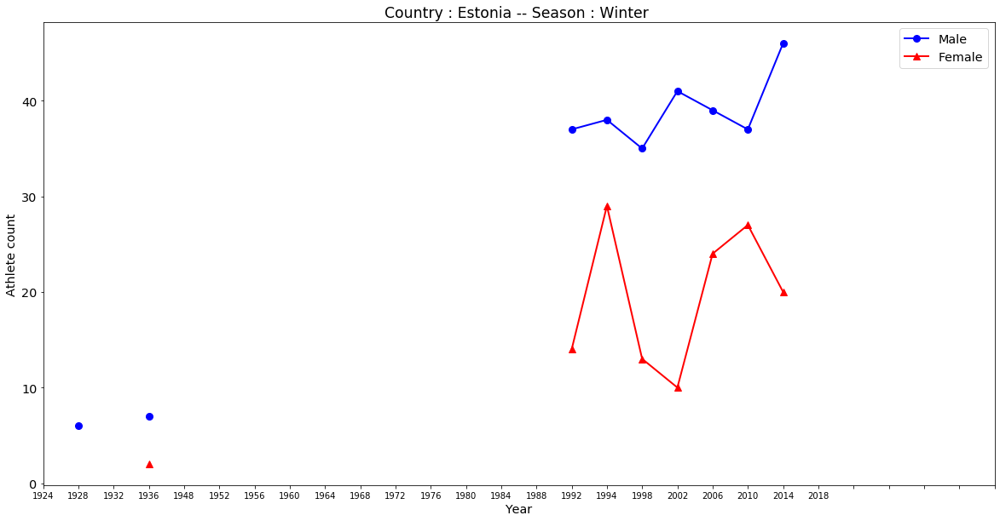

76


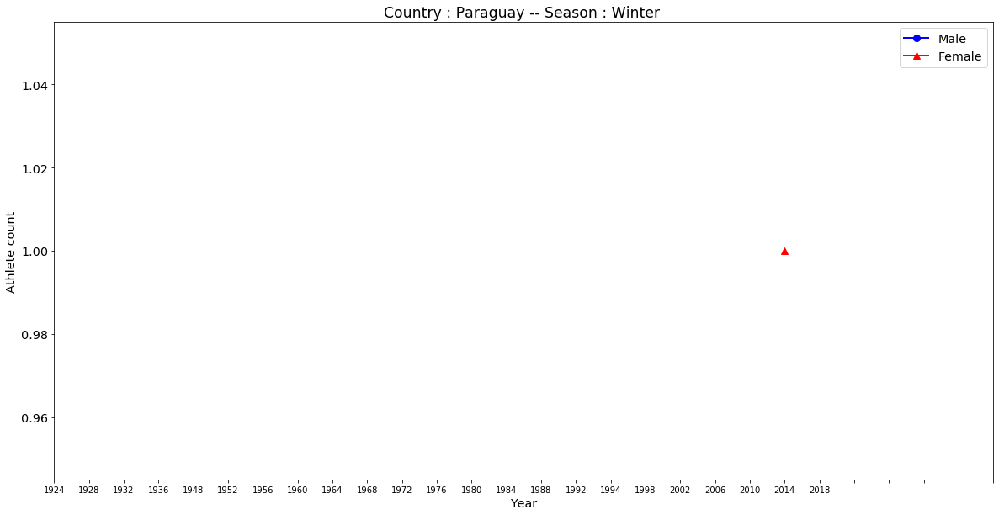

77


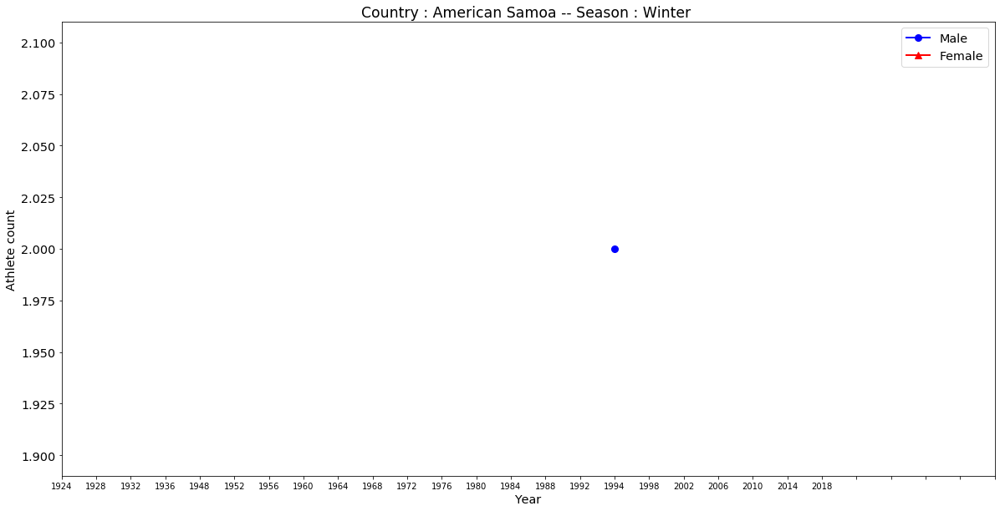

78


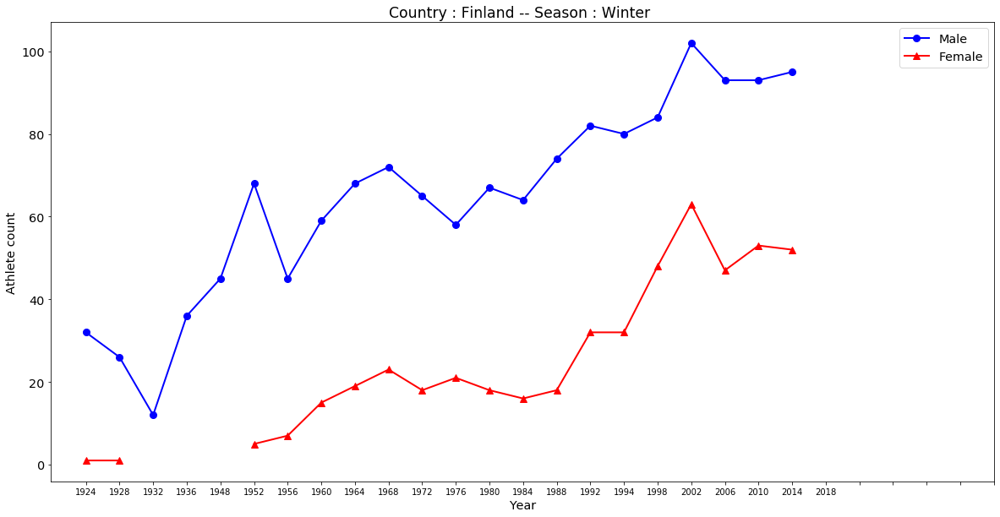

79


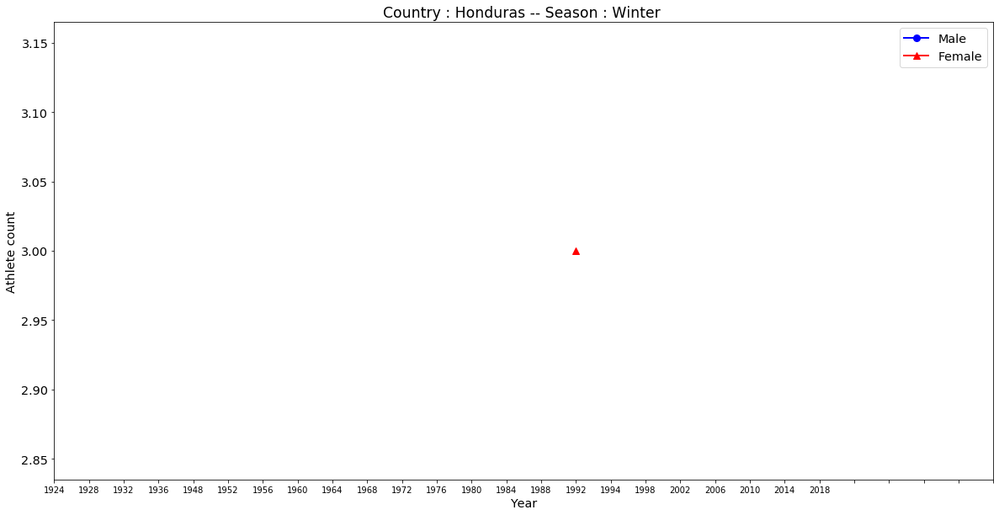

80


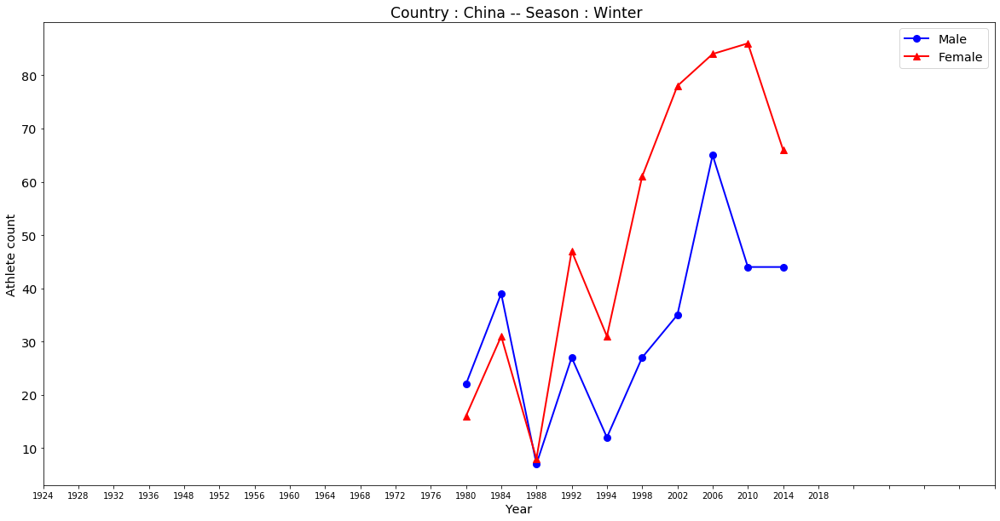

81


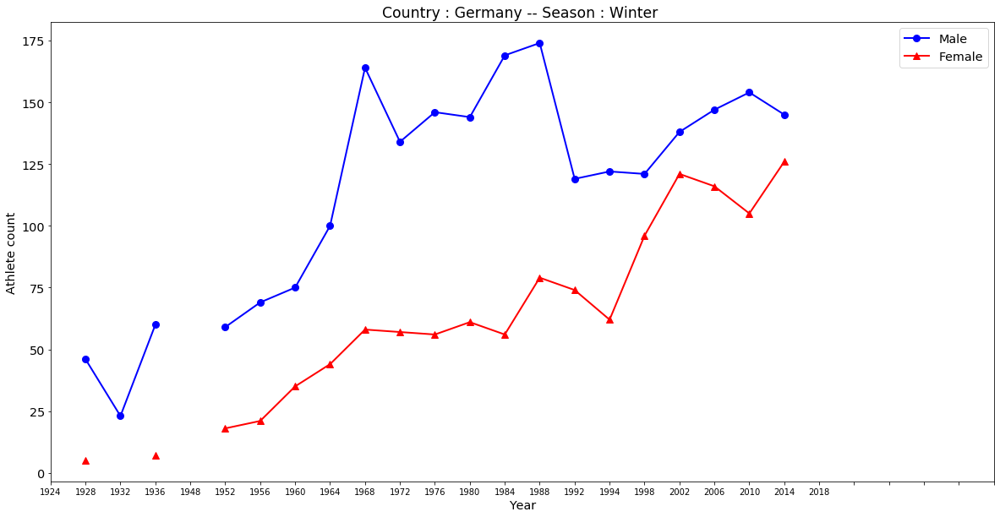

82


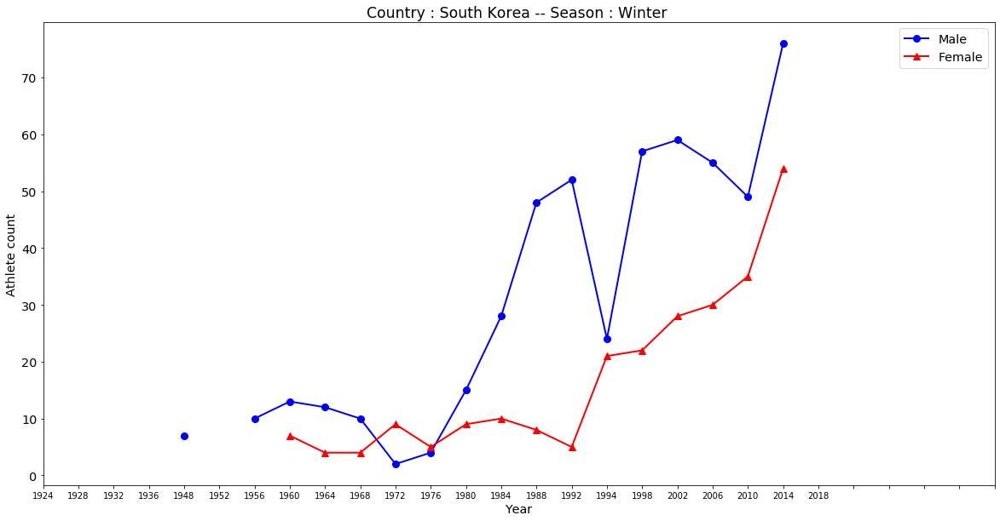

83


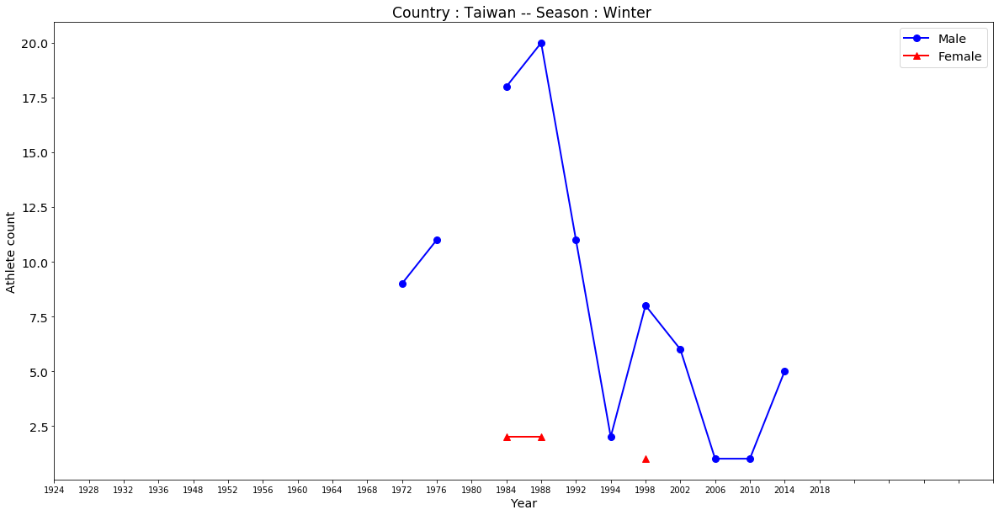

84


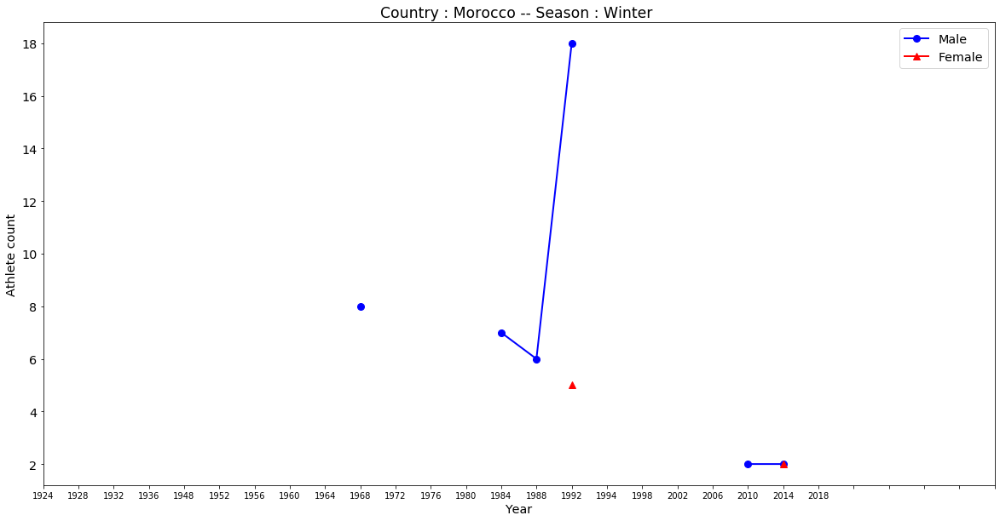

85


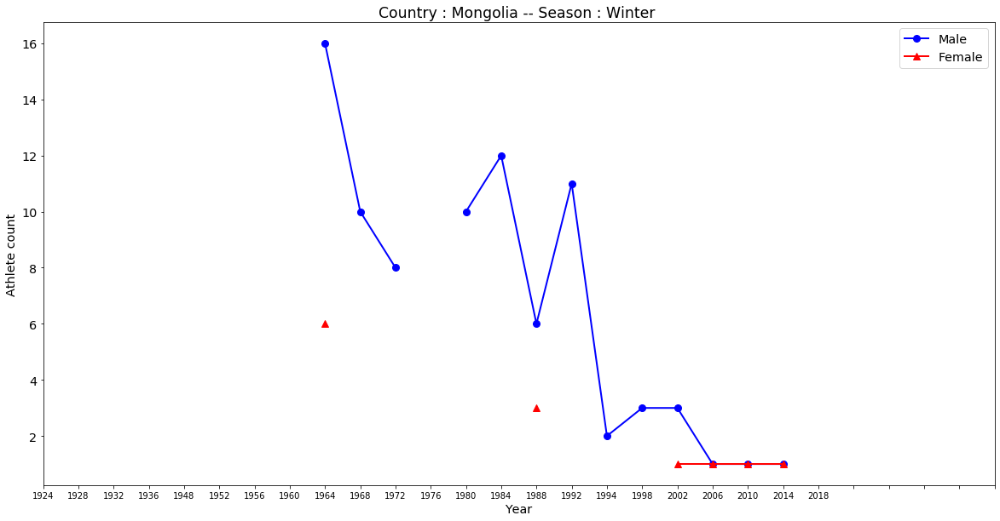

86


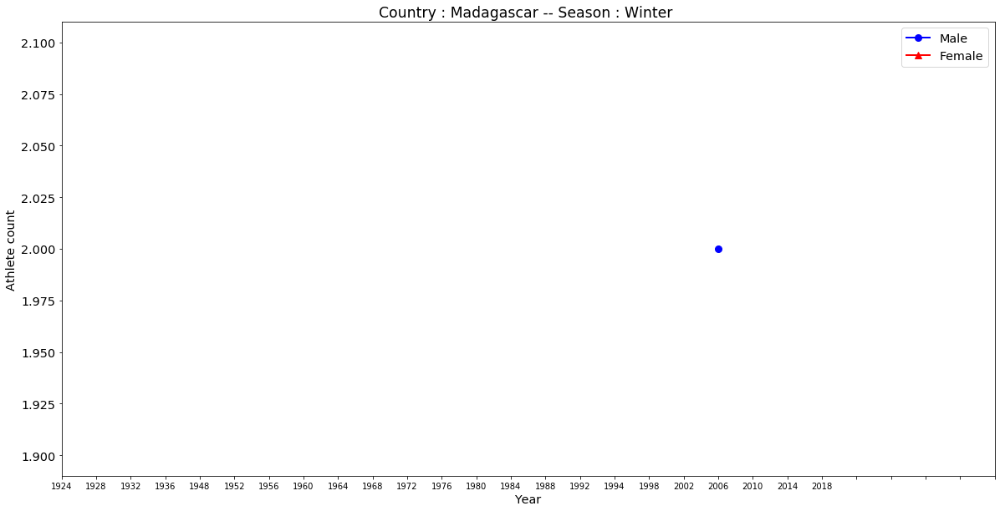

87


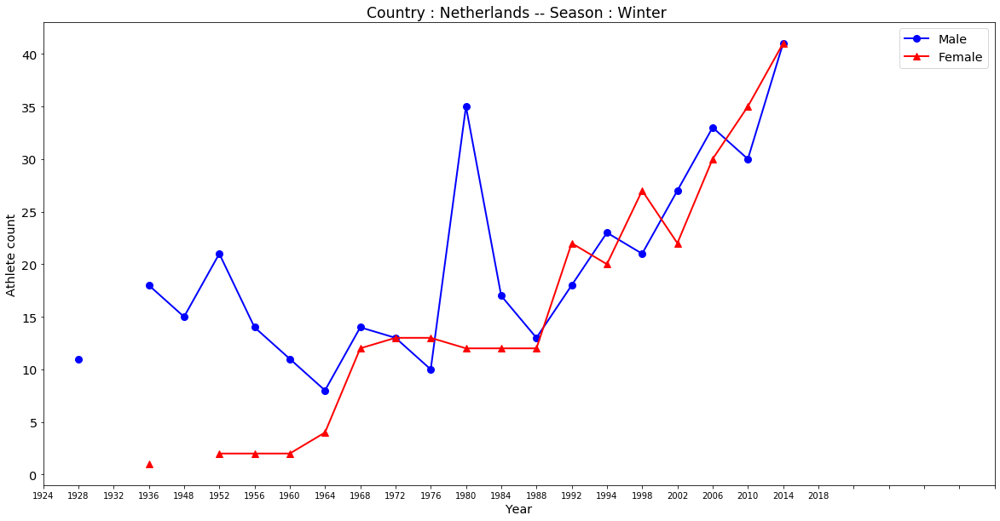

88


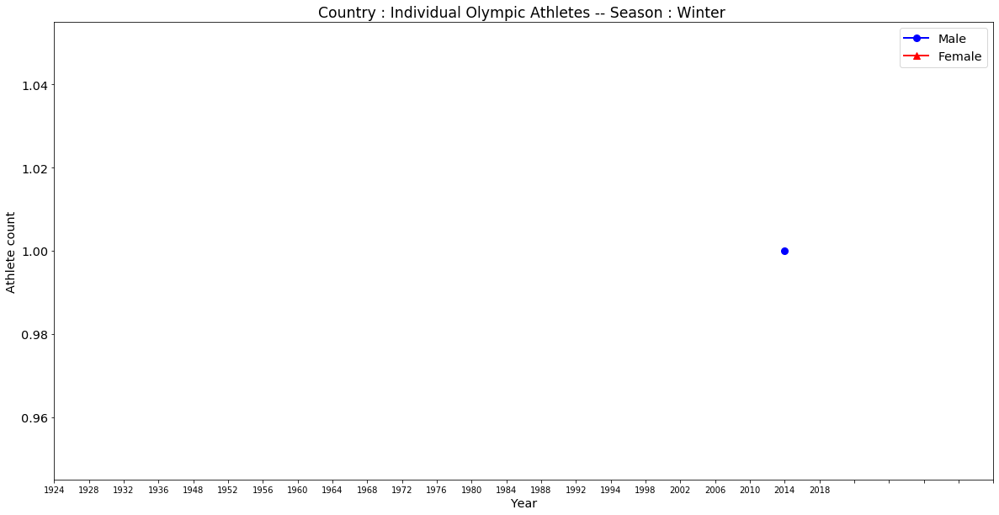

89


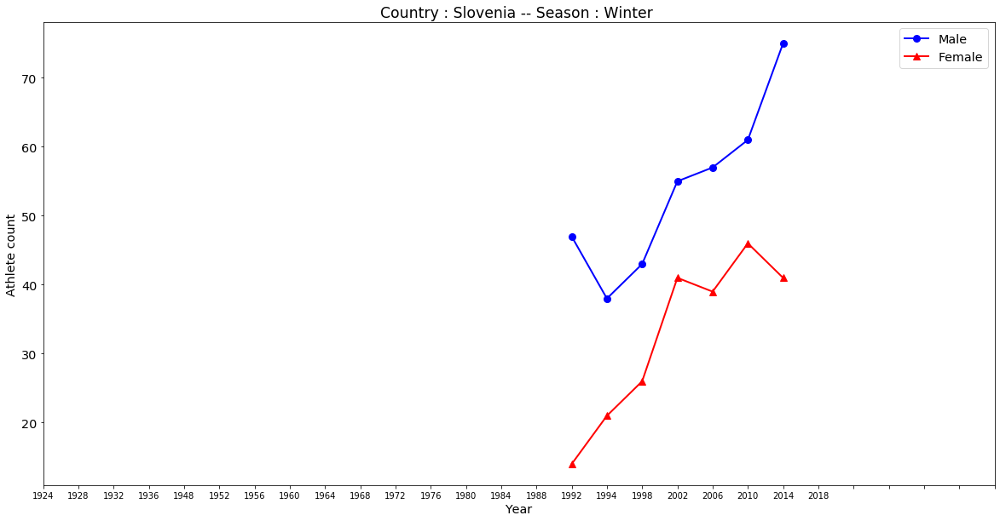

90


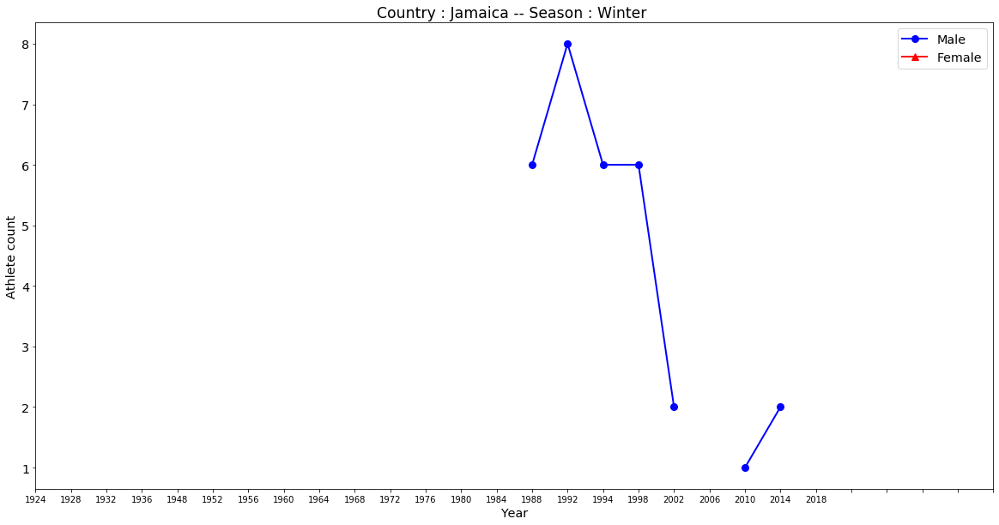

91


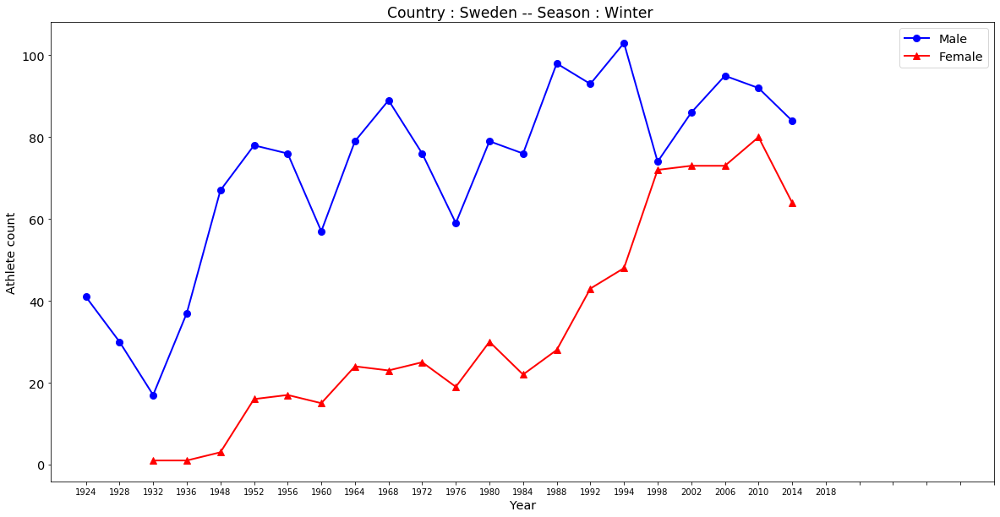

92


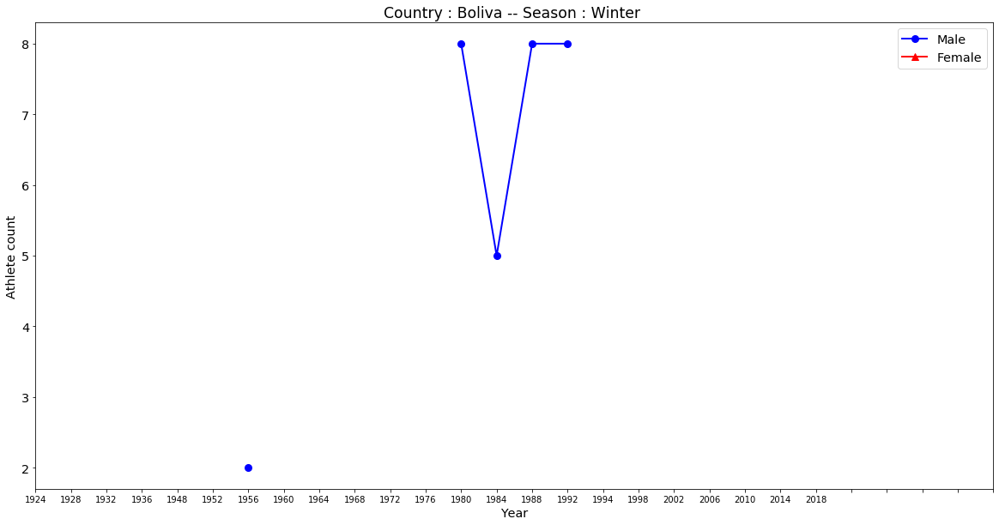

93


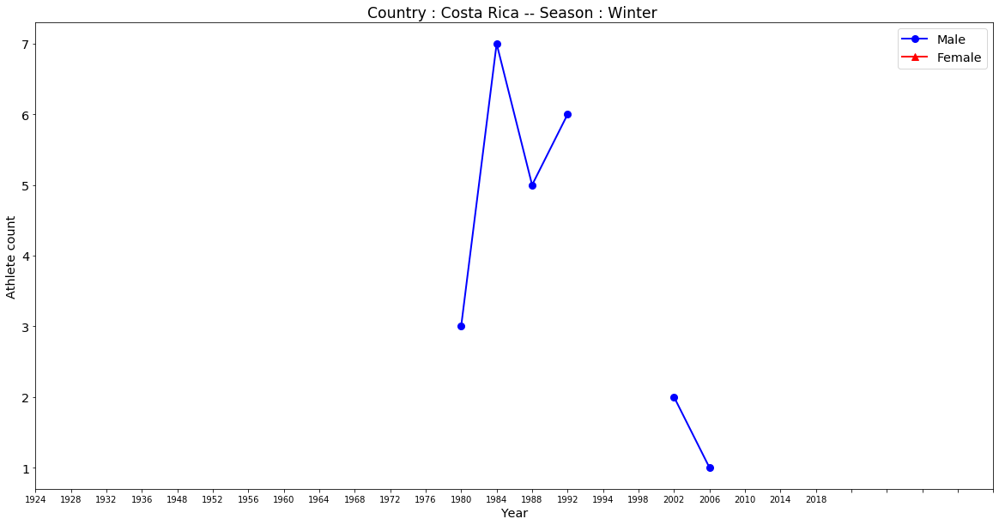

94


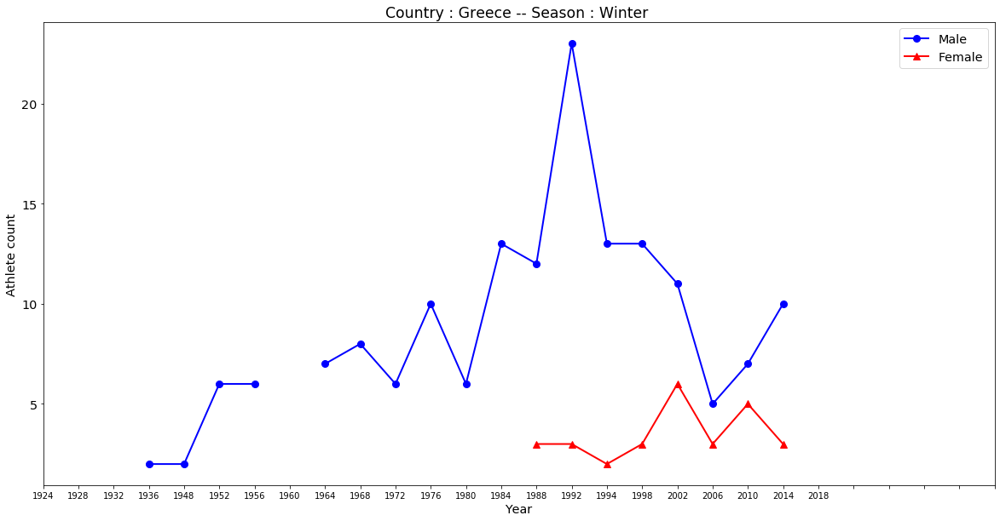

95


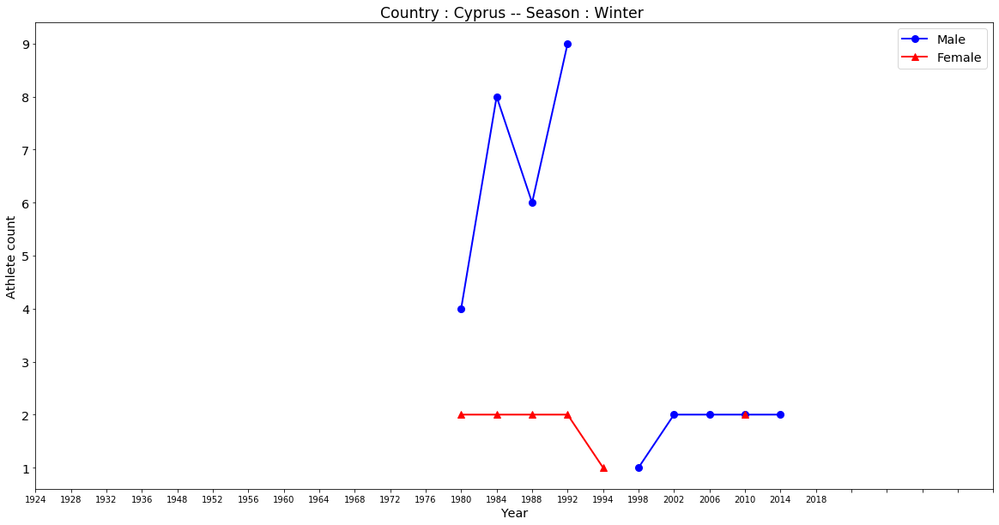

96


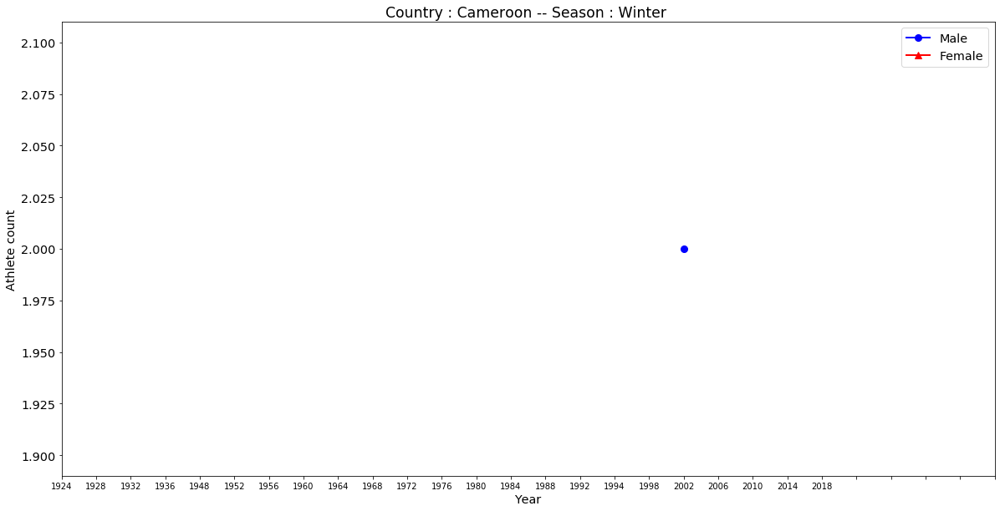

97


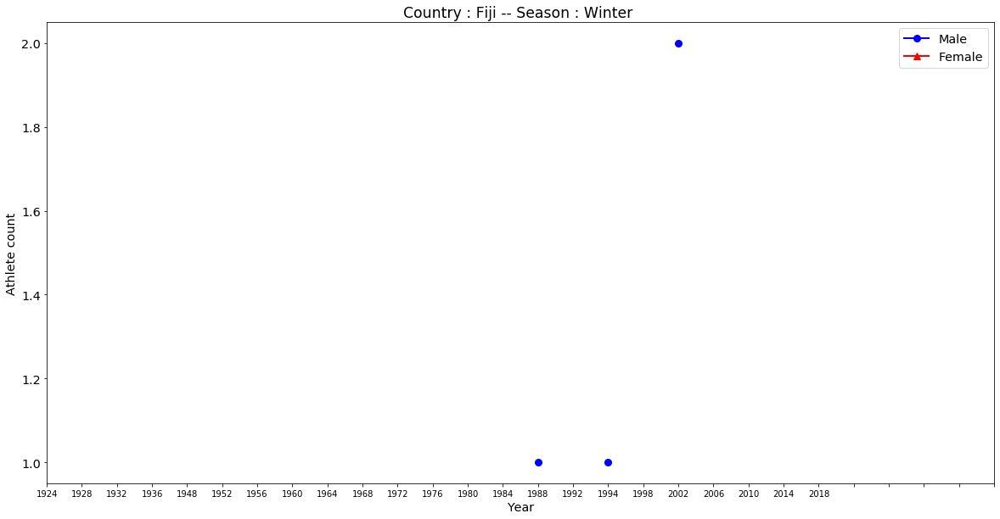

98


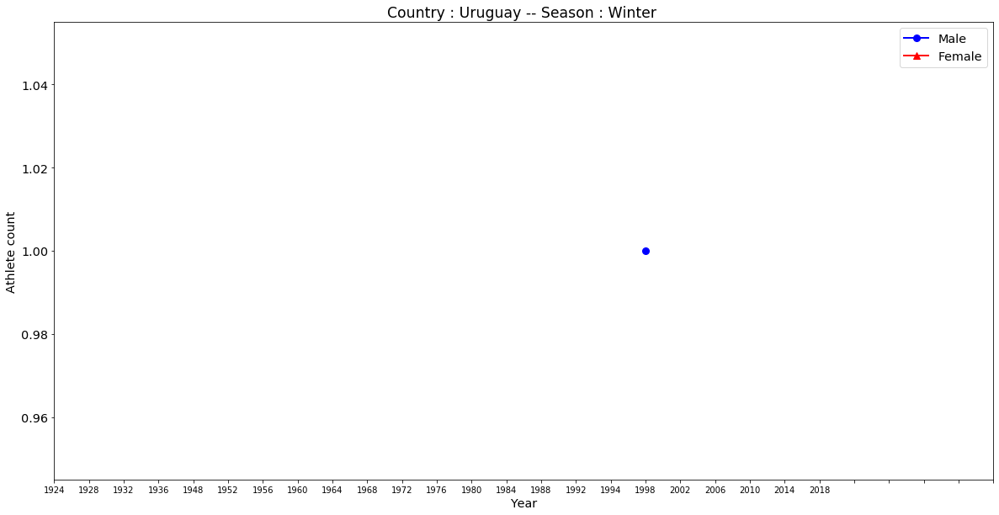

99


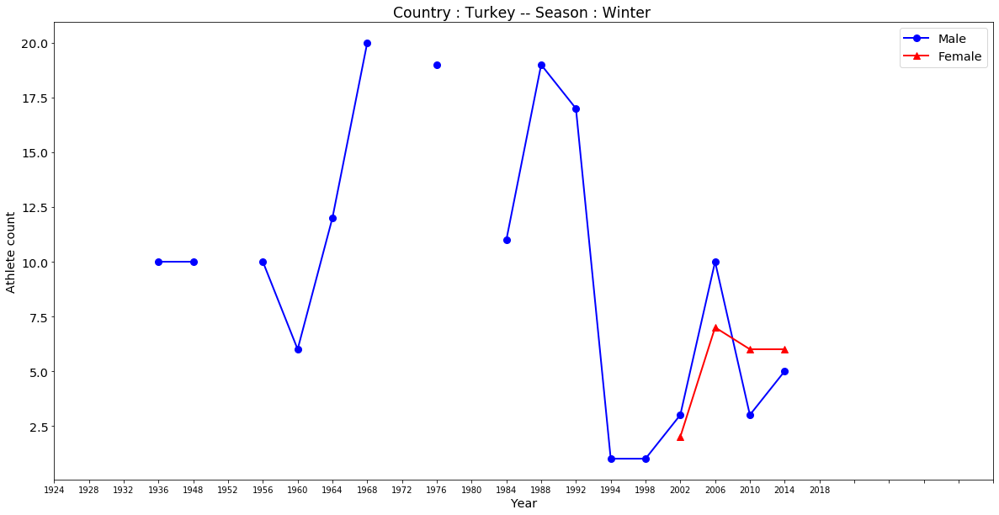

100


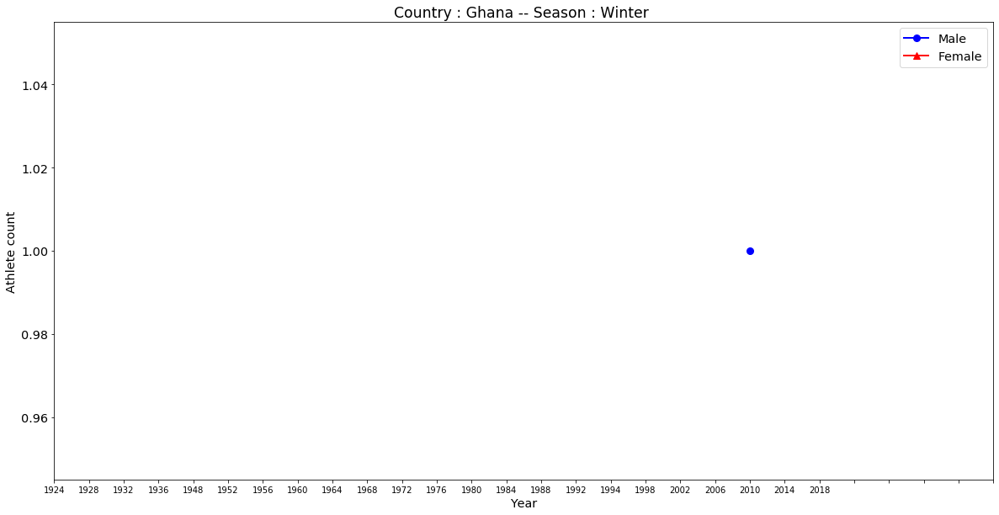

101


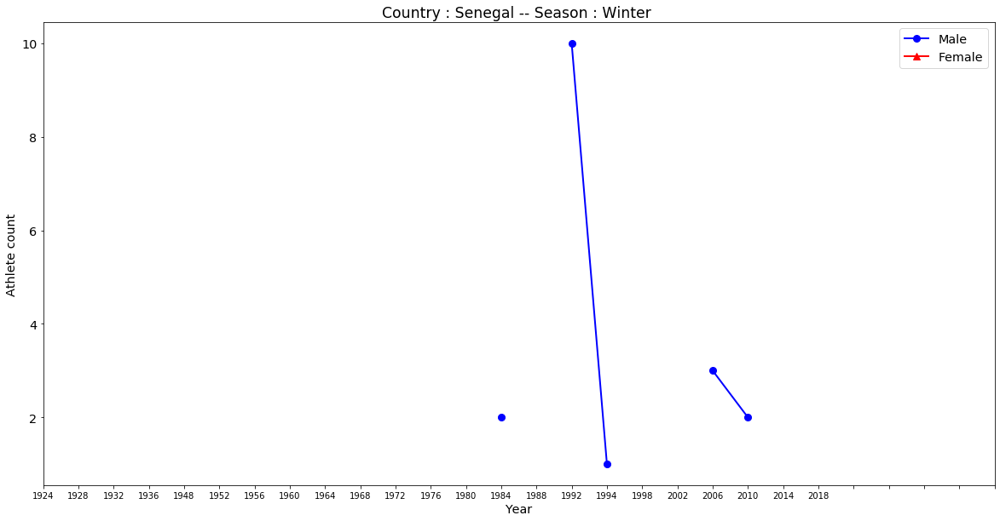

102


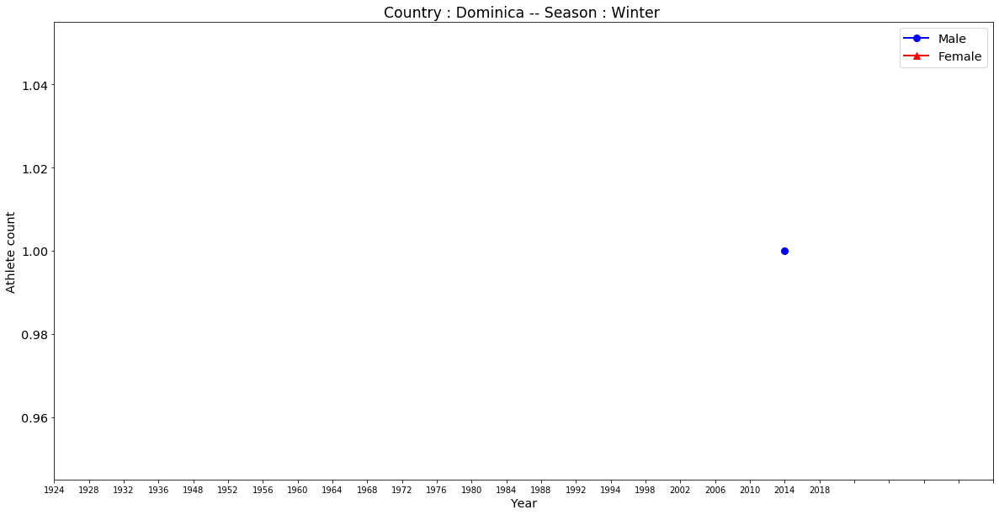

103


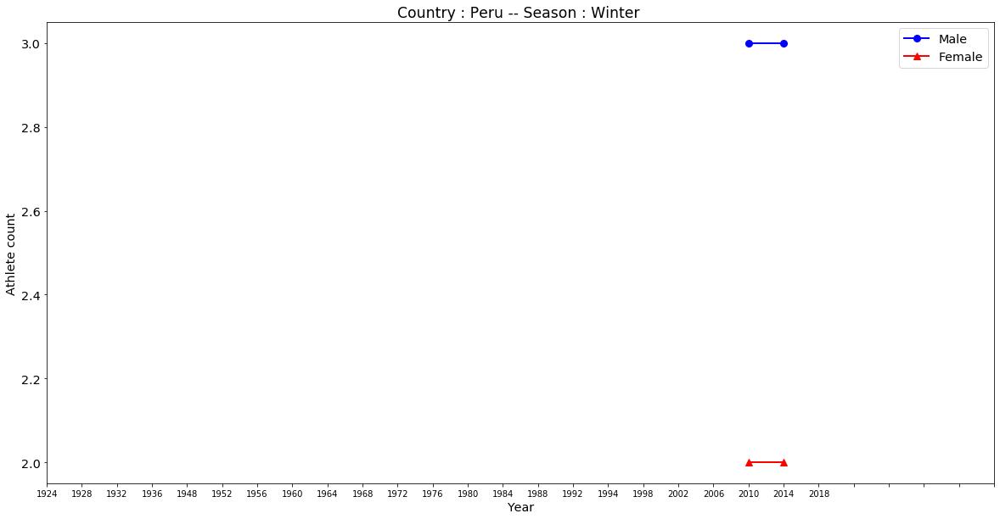

104


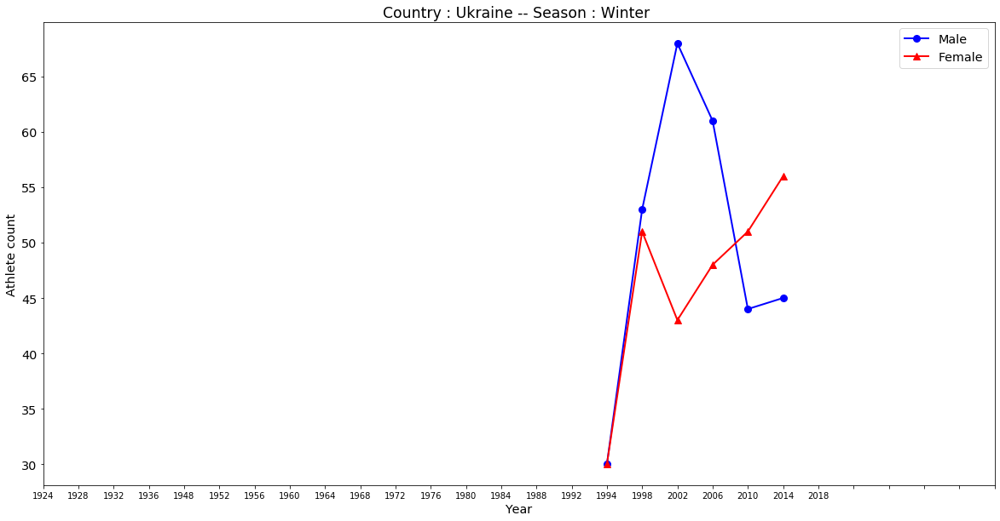

105


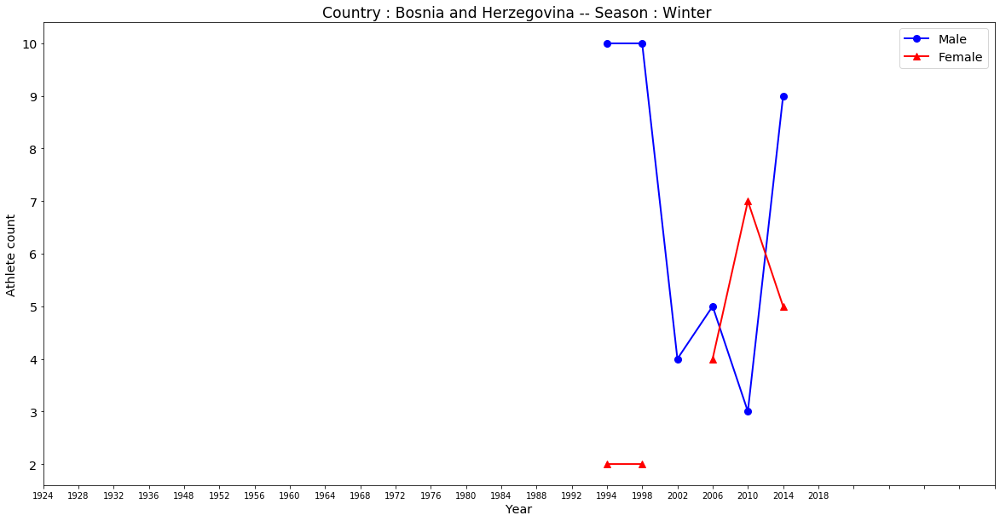

106


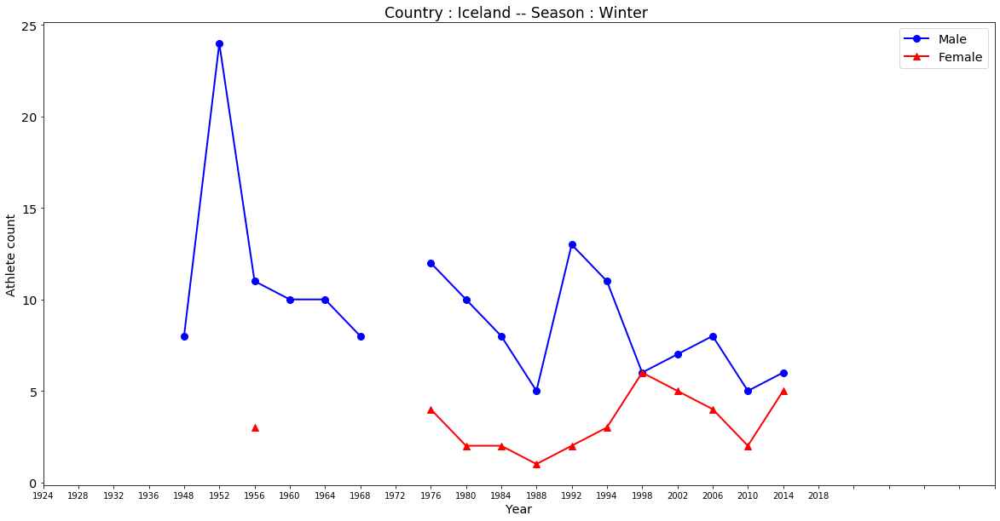

107


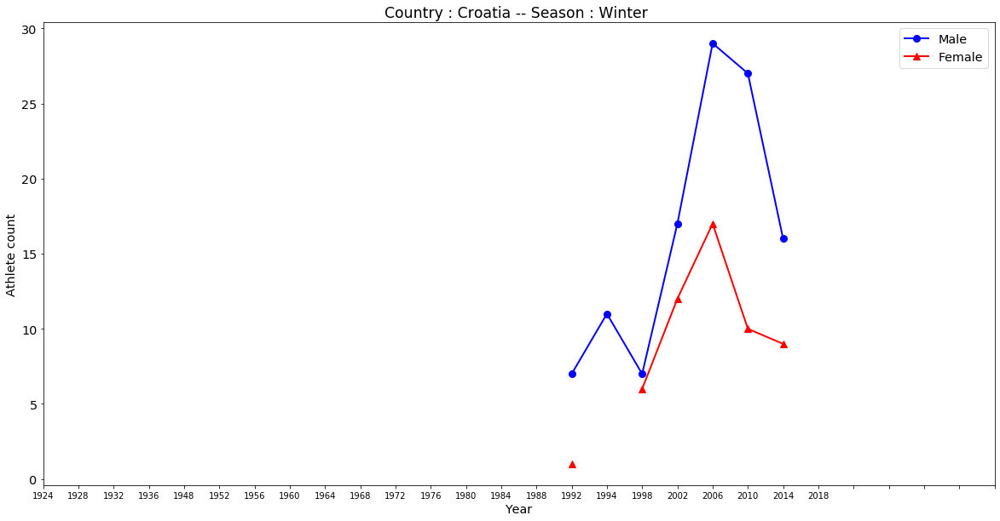

108


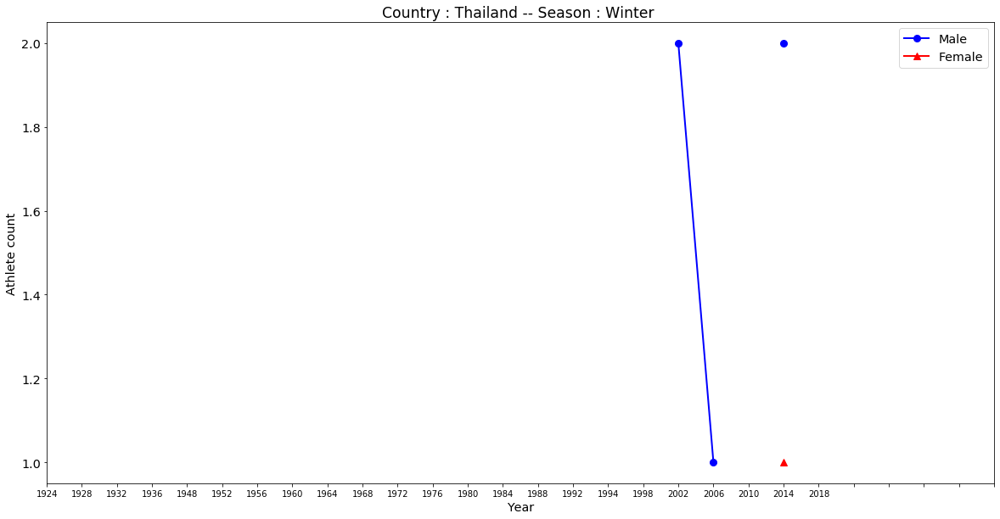

109


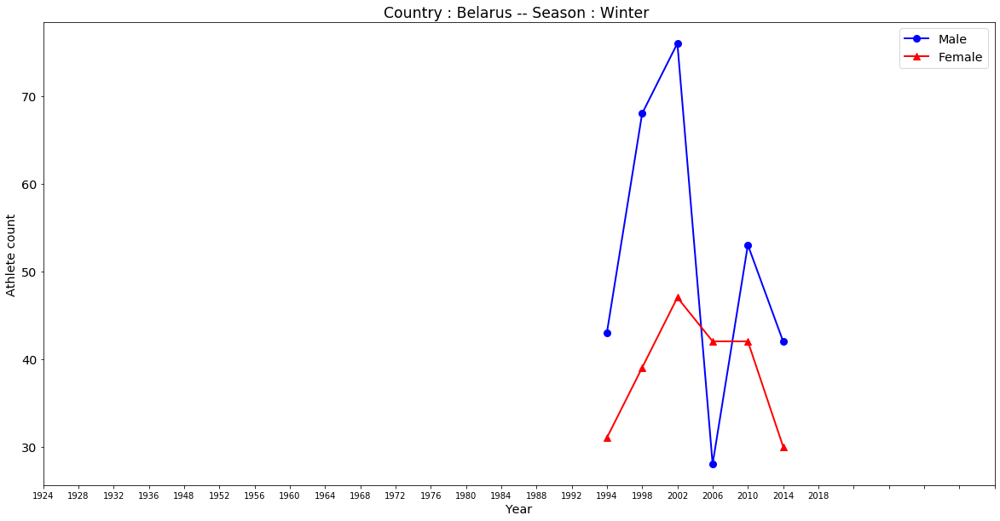

110


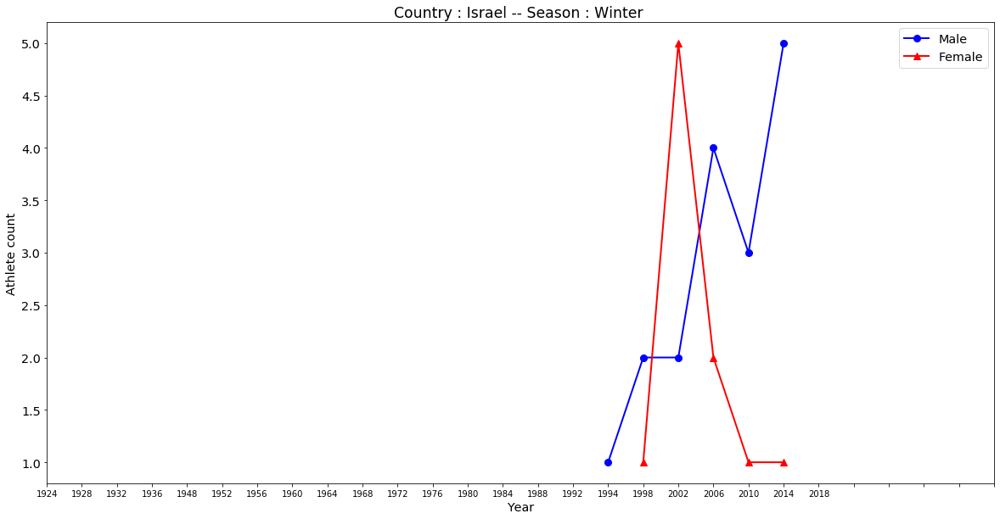

111


In [9]:
#Plotting for summer season
player_count(summer_male_df, summer_female_df, summerxbarMain, summer_countryNames, 'Summer ')

#Plotting for winter season
player_count(winter_male_df, winter_female_df, winterXbarMain, winter_countryNames, 'Winter ')

### ***Analysis***


### **Variation of Male athletes over the years:**
- **Summer Olympics ==>** There  has been a gradual increase in the number of male athletes but there  are certain drops. The highest count is on 1992 and after the count  reduced till 2012. Only after 2012 an increase has been seen.
- **Winter Olympics ==>** In here the number of male athletes is gradually increasing.

### **Variation of Female athletes over the years:**
- **Summer Olympics ==>** Woman  have started participating only from the year 1900. From ther onwards  till 1980 there is a slow increase in their count but all of a sudden  from 1984 the count has literally rocketted up from being below 2000  female athletes in 1984 to more than 6000 female athletes in 2016. It is  indeed a most noteable thing.
- **Winter Olympics ==>** Here also the number of female athletes has only been increased.

<a id='sec5.2'></a>
## B) Country wise participation count and year

In [10]:
#including intercalactic year
country_count_summer = sqldf('SELECT region AS Country, count(DISTINCT Year) AS No_of_Times_Participated FROM merged WHERE season="Summer" GROUP BY region ORDER BY count(DISTINCT Year) DESC')
country_count_winter = sqldf('SELECT region AS Country, count(DISTINCT Year) AS No_of_Times_Participated FROM merged WHERE season="Winter" GROUP BY region ORDER BY count(DISTINCT Year) DESC')

In [11]:
#Total Summer olympics held (including the 1906) is 29
country_count_summer.head(10)

,Country,No_of_Times_Participated
0,UK,29
1,Switzerland,29
2,Italy,29
3,Greece,29
4,France,29
5,Australia,29
6,USA,28
7,Sweden,28
8,Denmark,28
9,Austria,28


In [12]:
#Total Winter olympics held is 22
country_count_winter.head(10)

,Country,No_of_Times_Participated
0,USA,22
1,UK,22
2,Switzerland,22
3,Sweden,22
4,Poland,22
5,Norway,22
6,Italy,22
7,Hungary,22
8,France,22
9,Finland,22


### ***Analysis***

### **Summer Olympics :**
- The number of countries participated has been increasing since the edition of the Olympics, But it had seen a huge decrease in the years 1932, 1956, 1980. 
- The poor participation in 1932 was the result of the worldwide economic depression and the expense of traveling to California. More details can be found here. 
- The Great Depression was a severe worldwide economic depression that took place mostly during the 1930s, beginning in the United States. The timing of the Great Depression varied across the world; in most countries, it started in 1929 and lasted until the late 1930s (Source: Wikipedia). 
- In 1956 Egypt, Lebanon, and Iraq boycotted the olympics in protest of the Israeli invasion of the Sinai Peninsula and also the Netherlands, Spain, and Switzerland boycotted in protest against the Soviet invasion. More details can be found here. 
- The Soviet Union’s invasion of Afghanistan in December 1979 led to the largest boycott in the history of the Olympic movement (1980 Olympics ). 
- U.S. Pres. Jimmy Carter took the lead in the call for a boycott of the 1980 Olympics, and approximately 60 other countries joined the United States in staying away from Moscow. More details can be found here.

### **Winter Olympics** 
- There is gradual increase in the number of countries that have participated.

<a id='sec5.3'></a>
## C) Country wise Medal count (excluding 1906 intercalactic year)

In [13]:
country_medalcount_gold = sqldf('SELECT region AS Country, count(Medal) AS No_of_Gold_Won FROM merged WHERE Medal="Gold" and Year <> 1906 GROUP BY region ORDER BY region')
country_medalcount_silver = sqldf('SELECT region AS Country, count(Medal) AS No_of_Silver_Won FROM merged WHERE Medal="Silver" and Year <> 1906 GROUP BY region ORDER BY region')
country_medalcount_Bronze = sqldf('SELECT region AS Country, count(Medal) AS No_of_Bronze_Won FROM merged WHERE Medal="Bronze" and Year <> 1906 GROUP BY region ORDER BY region')

In [14]:
country_medalcount = country_medalcount_gold.merge(country_medalcount_silver, on='Country', how='outer').merge(country_medalcount_Bronze, on='Country',how='outer')
country_medalcount['No_of_Gold_Won'].fillna(0, inplace=True)
country_medalcount['No_of_Silver_Won'].fillna(0, inplace=True)
country_medalcount['No_of_Bronze_Won'].fillna(0, inplace=True)

country_medalcount['Total Medals Won'] = country_medalcount['No_of_Gold_Won'] + country_medalcount['No_of_Silver_Won'] + country_medalcount['No_of_Bronze_Won']

In [15]:
country_medalcount = country_medalcount.sort_values('Total Medals Won',ascending=False).reset_index(drop=True)
country_medalcount.head(10)

,Country,No_of_Gold_Won,No_of_Silver_Won,No_of_Bronze_Won,Total Medals Won
0,USA,2626.0,1635.0,1352.0,5613.0
1,Russia,1599.0,1170.0,1178.0,3947.0
2,Germany,1287.0,1185.0,1254.0,3726.0
3,UK,669.0,717.0,643.0,2029.0
4,France,481.0,594.0,638.0,1713.0
5,Italy,554.0,523.0,504.0,1581.0
6,Sweden,477.0,517.0,521.0,1515.0
7,Canada,462.0,437.0,451.0,1350.0
8,Australia,368.0,459.0,519.0,1346.0
9,Hungary,427.0,327.0,368.0,1122.0


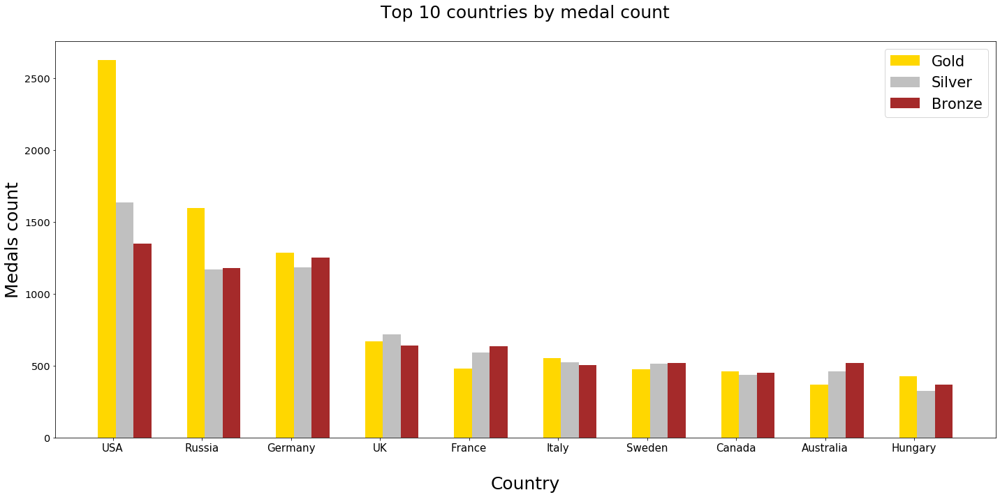

In [16]:
# Grouped BAR plot of the medals won of the top 10 countries

labels = country_medalcount['Country'].tolist()[0:10]
gold_means = country_medalcount['No_of_Gold_Won'].tolist()[0:10]
silver_means = country_medalcount['No_of_Silver_Won'].tolist()[0:10]
bronze_means = country_medalcount['No_of_Bronze_Won'].tolist()[0:10]

x = np.arange(len(labels))  # the label locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/3, gold_means, width, color = 'Gold', label='Gold')
rects2 = ax.bar(x + 2*(width/3), silver_means, width, color = 'Silver', label='Silver')
rects2 = ax.bar(x + 5*(width/3), bronze_means, width, color = 'Brown' ,label='Bronze')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Medals count', fontsize=25)
ax.set_xlabel('\nCountry', fontsize=25)
ax.set_title('Top 10 countries by medal count\n', fontsize=25)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=15)
ax.legend(fontsize=21)


fig.tight_layout()
plt.show()

### ***Analysis***

- The top 10 countires includes **USA, Russia, Germany, UK, Franze, Italy, Sweden, Canada, Australia, Hungary**
- It is obvious that the countries that show dominance on the olympics are among the top 50 countries based on Human Development Index (HDI) (Source Wikipedia)
- Another important thing to note is that these top countries have participated in almost most of the olympics and also have participated in more number of sports.
- In simpler words if a country participates in more sports the the probability of winning a medal is high.
- The noteable among these is the Hungary. They are the 10th top country to have the most medals. Most of their medals came from canoeing, swimming, water polo and fencing.

>
>I have also plotted some Choropleth (earth's map kinda) plots for better visualiztion 
>
>This kind of plot can help for better comparison

<hr style="border:2px solid gray"> </hr>

## <center>NOTE</center>

### The following plotly based graphs are inpired from **Gabriel Preda's** works with this dataset. I have linked his work below. Please check out his works on Kaggle. 
### For the link [click here](https://www.kaggle.com/gpreda/plotly-tutorial-120-years-of-olympic-games)

<hr style="border:2px solid gray"> </hr>


In [17]:
#Cholorepeth Map for countrywise medal count
def choloropethMapPlot(columnName, colorScale, title, projectionType):
    fig = go.Figure(
        data=go.Choropleth(
            locations=country_medalcount['Country'], # Spatial coordinates
            z = country_medalcount[columnName].astype(float), # Data to be color-coded
            locationmode = 'country names', # set of locations match entries in `locations`
            colorscale = colorScale,
            colorbar_title = "Medals Count",
        ),
        layout = go.Layout(
            title = title,
            geo = dict(
                showframe = True,
                showlakes = False,
                showcoastlines = True,
                projection = dict(
                    type = projectionType
            )
        )
    ))
    fig.show()

In [18]:
# Country wise medal count plot
choloropethMapPlot('No_of_Gold_Won', 'Reds', "Country_wise Gold medals won", 'natural earth')
choloropethMapPlot('No_of_Silver_Won', 'Greens', "Country_wise Silver medals won", 'natural earth')
choloropethMapPlot('No_of_Bronze_Won', 'Blues', "Countrywise Bronze medals won", 'natural earth')
choloropethMapPlot('Total Medals Won', 'Blues', "Countrywise total medals won", 'orthographic')

<a id='sec5.4'></a>
##  D) Sport each countries are best at

In [19]:
sport_best = sqldf('SELECT region, Sport, count(Medal)  From merged Where (Medal="Gold" or Medal="Silver" or Medal="Bronze") and Year<> 1906 Group by region, Sport Order By region ASC, count(Medal) DESC')

In [20]:
# Getting the top countries by sport
temp = sport_best['region'].unique().tolist()
answer = {}
def merge(list1, list2): 
    merged_list = {list1[i]: list2[i] for i in range(0, len(list1))}
    return merged_list 
for i in temp:
    tmpVar = merge(sport_best[sport_best['region'] == i]['Sport'].head().tolist(),sport_best[sport_best['region'] == i]['count(Medal)'].head().tolist())
    answer[i] = tmpVar
country_best_sport = json.dumps(answer, indent = 2)

In [21]:
# The number associated with each sport represents the medals won in that sport
print(country_best_sport)

{
  "Afghanistan": {
    "Taekwondo": 2
  },
  "Algeria": {
    "Athletics": 9,
    "Boxing": 6,
    "Judo": 2
  },
  "Argentina": {
    "Hockey": 81,
    "Football": 68,
    "Boxing": 24,
    "Basketball": 24,
    "Sailing": 21
  },
  "Armenia": {
    "Wrestling": 8,
    "Weightlifting": 7,
    "Boxing": 1
  },
  "Australia": {
    "Swimming": 411,
    "Hockey": 188,
    "Rowing": 144,
    "Athletics": 88,
    "Cycling": 84
  },
  "Austria": {
    "Alpine Skiing": 114,
    "Ski Jumping": 43,
    "Nordic Combined": 29,
    "Luge": 27,
    "Figure Skating": 25
  },
  "Azerbaijan": {
    "Wrestling": 23,
    "Boxing": 8,
    "Judo": 4,
    "Taekwondo": 3,
    "Shooting": 3
  },
  "Bahamas": {
    "Athletics": 36,
    "Sailing": 4
  },
  "Bahrain": {
    "Athletics": 3
  },
  "Barbados": {
    "Athletics": 1
  },
  "Belarus": {
    "Canoeing": 22,
    "Rhythmic Gymnastics": 21,
    "Rowing": 17,
    "Athletics": 17,
    "Weightlifting": 12
  },
  "Belgium": {
    "Water Polo": 54,
    "Ar

### ***Analysis***

- This will help the news agencies and Countries to look at whats performing well for them
- USA, the country with most medals have got most of that from Swimming and Athletics
- Russia, the second on the list got most of its medals from Gymnastics and Athletics

<a id='sec5.5'></a>
## E) Top players in each Sport

In [22]:
# Grouping by ID and not by name because two or more players can hae the same name 
player_best = sqldf('SELECT ID, Name, region, Sport, count(Medal)  From merged Where (Medal="Gold" or Medal="Silver" or Medal="Bronze") and Year<> 1906 Group by ID, Sport Order By Sport ASC, count(Medal) DESC')

In [23]:
# player_best
temp = player_best['Sport'].unique().tolist()
answer = {}
def merge(list1, list2): 
    merged_list = {list1[i]: list2[i] for i in range(0, len(list1))}
    return merged_list 
for i in temp:
    tmpVar = merge(player_best[player_best['Sport'] == i]['Name'].head().tolist(),player_best[player_best['Sport'] == i]['count(Medal)'].head().tolist())
    answer[i] = tmpVar
player_best_sport = json.dumps(answer, indent = 2)   

In [24]:
print(player_best_sport)

{
  "Aeronautics": {
    "Hermann Schreiber": 1
  },
  "Alpine Skiing": {
    "Kjetil Andr Aamodt": 8,
    "Janica Kosteli": 6,
    "Samuel Bode Miller": 6,
    "Anja Sofia Tess Prson": 6,
    "Lasse Kjus (Kristoffersen-)": 5
  },
  "Alpinism": {
    "Charles Granville Bruce": 1,
    "John Geoffrey Bruce": 1,
    "Tejbir Bura": 1,
    "Colin Grant Crawford": 1,
    "Gnter Oskar Dyhrenfurth": 1
  },
  "Archery": {
    "Gerard Theodor Hubert Van Innis": 10,
    "Kim Su-Nyeong": 6,
    "Julien Louis Brul": 5,
    "Eugne Franois Grisot": 4,
    "Ki Bo-Bae": 4
  },
  "Art Competitions": {
    "Alex Walter Diggelmann": 3,
    "Josef Petersen": 3,
    "Edwin Grienauer": 2,
    "Jean Lucien Nicolas Jacoby": 2,
    "Jzef Klukowski": 2
  },
  "Athletics": {
    "Paavo Johannes Nurmi": 12,
    "Frederick Carlton \"Carl\" Lewis": 10,
    "Allyson Michelle Felix": 9,
    "Merlene Joyce Ottey-Page": 9,
    "Usain St. Leo Bolt": 8
  },
  "Badminton": {
    "Gao Ling": 4,
    "Fu Haifeng": 3,
    "Gir


### ***Analysis***
- Fact : On seeing the above results it can be known that Cricket (mentioned because it is the most famous sport in my country) was once played at the olympics and aeronautics appeared only once
- This analysis will help news agencies to post the top players in each sport. Hence this will enable the news agencies to cater their audience with the facts about the top players in the sports they like

In [25]:
merged[merged['Sport'] == 'Cricket'].head(5)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
6892,3871,William Wallace Anderson,M,40.0,NaN,NaN,Union des Socits Franais de Sports Athletiques,GBR,1900 Summer,1900,Summer,Paris,Cricket,Cricket Men's Cricket,Silver,UK,NaN
10734,5871,"William Dunbar ""Willie"" Attrill",M,NaN,NaN,NaN,Union des Socits Franais de Sports Athletiques,FRA,1900 Summer,1900,Summer,Paris,Cricket,Cricket Men's Cricket,Silver,France,NaN
16799,9009,Charles Beachey Beachcroft (Kay-),M,NaN,NaN,NaN,Devon and Somerset Wanderers,GBR,1900 Summer,1900,Summer,Paris,Cricket,Cricket Men's Cricket,Gold,UK,NaN
22206,11696,Arthur Ernest Burrington Birkett,M,24.0,NaN,NaN,Devon and Somerset Wanderers,GBR,1900 Summer,1900,Summer,Paris,Cricket,Cricket Men's Cricket,Gold,UK,NaN
27467,14259,Alfred James Bowerman,M,26.0,NaN,NaN,Devon and Somerset Wanderers,GBR,1900 Summer,1900,Summer,Paris,Cricket,Cricket Men's Cricket,Gold,UK,NaN


### ***The below code snippet will prove that Aeronautics was played only once in the Olympics***

In [27]:
#Aeronautics was played only in 1936
merged[merged['Sport'] == 'Aeronautics']['Year'].unique().tolist()

[1936]

<a id='sec5.6'></a>
## F) Player with most medals regardless of Sport and Nation

In [28]:
best_player =sqldf('SELECT ID,Name, count(Medal) From merged Where (Medal="Gold" or Medal="Silver" or Medal="Bronze") and Year<> 1906 Group by ID Order By count(Medal) DESC')

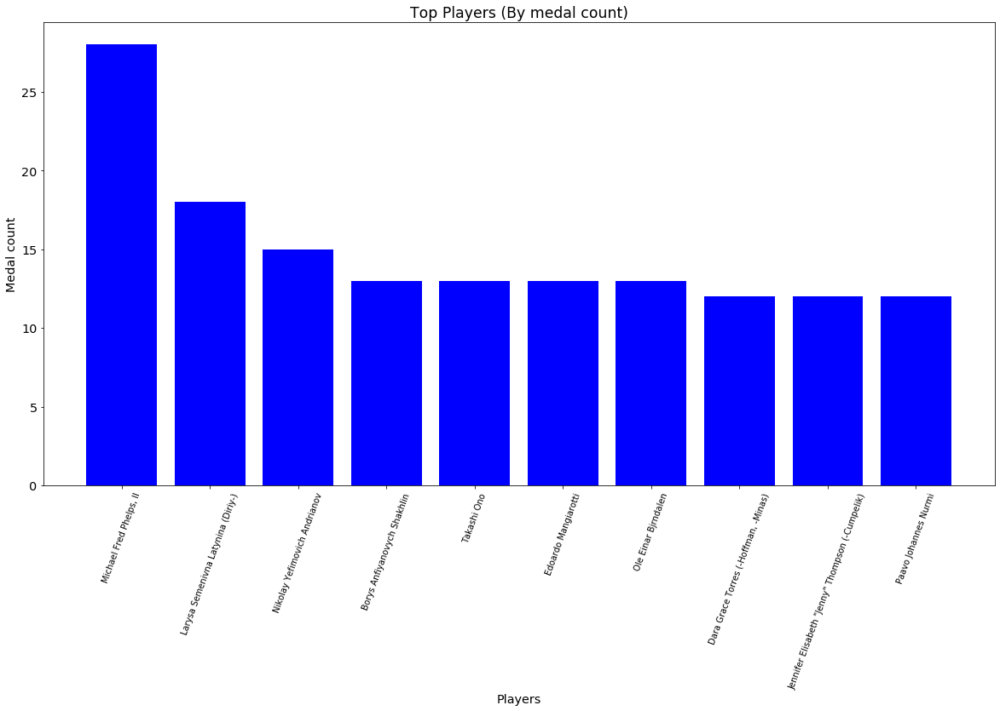

In [29]:
# plotting the graph for top 10 players

x1 = best_player.head(10)['Name'].tolist()
y1 = best_player.head(10)['count(Medal)'].tolist()

plt.bar(x1, y1, color='blue')

plt.xlabel('Players')
plt.ylabel('Medal count')
plt.title('Top Players (By medal count)')
plt.xticks(rotation=70)
plt.show()

### ***Analysis***

- As everyone knows Michael Fred Phelps is the G.O.A.T in olympics with a whooping record of having 28 medals
- As everyone like to know about the top 5 and top 10, news agencies can use this data to show the top players

<a id='sec5.7'></a>
## G) Nation wise best players

In [30]:
nation_best_player = sqldf('SELECT ID, Name, region, Sport, count(Medal)  From merged Where (Medal="Gold" or Medal="Silver" or Medal="Bronze") and Year<> 1906 Group by ID, region Order By region ASC, count(Medal) DESC')

In [31]:
# player_best
temp = nation_best_player['region'].unique().tolist()
answer = {}
def merge(list1, list2): 
    merged_list = {list1[i]: list2[i] for i in range(0, len(list1))}
    return merged_list 
for i in temp:
    tmpVar = merge(nation_best_player[nation_best_player['region'] == i]['Name'].head().tolist(),nation_best_player[nation_best_player['region'] == i]['count(Medal)'].head().tolist())
    answer[i] = tmpVar
nation_wise_best_player = json.dumps(answer, indent = 2)

In [32]:
print(nation_wise_best_player)

{
  "Afghanistan": {
    "Rohullah Nikpai": 2
  },
  "Algeria": {
    "Taoufik Makhloufi": 3,
    "Hocine Soltani": 2,
    "Mohamed Allalou": 1,
    "Mohamed Bahari": 1,
    "Amar Benikhlef": 1
  },
  "Argentina": {
    "Luciana Paula \"Lucha\" Aymar": 4,
    "Carlos Mauricio Espnola Lorenzo": 4,
    "Mara Magdalena Aicega Amicarelli": 3,
    "Agustina Soledad \"Sole\" Garca": 3,
    "Mara de la Paz \"Maripi\" Hernndez Margalot": 3
  },
  "Armenia": {
    "Artur Aleksanyan": 2,
    "Roman Amoyan": 1,
    "Migran Arutyunyan": 1,
    "Gevorg Davtyan": 1,
    "Hrachik Javakhyan": 1
  },
  "Australia": {
    "Leisel Marie Jones": 9,
    "Ian James Thorpe": 9,
    "Dawn Lorraine Fraser": 8,
    "Susan \"Susie\" O'Neill": 8,
    "Petria Ann Thomas (-Jones)": 8
  },
  "Austria": {
    "Felix Gottwald": 7,
    "Stephan Eberharter": 4,
    "Martin Hllwarth": 4,
    "Hermann Maier": 4,
    "Thomas Morgenstern": 4
  },
  "Azerbaijan": {
    "Xetaq Qazyumov": 3,
    "Mariya Stadnik": 3,
    "Namiq

### ***Analysis***

- No deep analysis can be derived from this measure. But the news agency in  each country can use this analysis to promote their top players so that the others in their nation can use that as a motivation

<a id='sec5.8'></a>
## H) Countries with no medals

In [33]:
# Done by set's symmetric difference operation
country_with_no_medal = set(merged['region'].unique().tolist()).symmetric_difference(set(temp))
print('No.of countires with no medals : ' + str(len(country_with_no_medal)))

No.of countires with no medals : 72


### ***Analysis***

- There are almost **72** countries that have won almost **no medals**
- This includes the Refugee Olympic Team as they also have won no medals
- But the Individual Olympic Athletes have won some medals
- This can be seen clearly in the below code sinppet's output

In [34]:
# Special cases
print('Unknown' in country_with_no_medal)
print('Refugee Olympic Team' in country_with_no_medal)
print('Individual Olympic Athletes' in country_with_no_medal)

True
True
False


<a id='sec5.9'></a>
## I) FIndings based on Athletes

In [35]:
#height distibution plot
female_h = merged[merged['Sex']=='F']['Height'].dropna()
male_h = merged[merged['Sex']=='M']['Height'].dropna()

hist_data = [female_h, male_h]
group_labels = ['Female Height', 'Male Height']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig['layout'].update(title='Athletes Height distribution plot')
iplot(fig)

### ***Analysis***

* From the abvoe graph it is clear that
  * **Male Athletes** mean height is in the range of around **170-190**
  * **Female Athletes** mean height is in the range of around **160-180**

In [36]:
#weight distribution plot
female_w = merged[merged['Sex']=='F']['Weight'].dropna()
male_w = merged[merged['Sex']=='M']['Weight'].dropna()

hist_data = [female_w, male_w]
group_labels = ['Female Weight', 'Male Weight']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig['layout'].update(title='Athletes Weight distribution plot')
iplot(fig)

### ***Analysis***

* From the abvoe graph it is clear that
  * **Male Athletes** mean weight is in the range of around **40-80**
  * **Female Athletes** mean weight is in the range of around **60-100**

In [37]:
# Age distribution plot
female_a = merged[merged['Sex']=='F']['Age'].dropna()
male_a = merged[merged['Sex']=='M']['Age'].dropna()

hist_data = [female_a, male_a]
group_labels = ['Female Age', 'Male Age']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig['layout'].update(title='Athletes Age distribution plot')
iplot(fig, filename='dist_only')

### ***Analysis***

* From the abvoe graph it is clear that
  * **Male Athletes** mean age is in the range of around **10-40**
  * **Female Athletes** mean age is in the range of around **10-40**
* The age distribution is somewhat same for both the male and femal athletes

### ***It is also interesting to note that athletes of age greater than 10 have started participating in the Olympics which proves the hypothesis that AGE IS NOT THE LIMIT***

### Scatter plot of height and weight mean for each sport for each year (only for summer Olymics)

In [38]:
dataset = sqldf('SELECT Sport,Year,AVG(Height) As Mean_Height,AVG(Weight) As Mean_Weight,COUNT(DISTINCT ID) As No_of_Athletes FROM merged Where Season = "Summer" Group by Sport, Year Order by Year, Sport')
dataset_summer=dataset.reset_index(drop=True)
hover_text = []
for index, row in dataset_summer.iterrows():
    hover_text.append(('Year: {}<br>'+
                       'Sport: {}<br>'+
                      'Number of athlets: {}<br>'+
                      'Mean Height: {}<br>'+
                      'Mean Weight: {}<br>').format(row['Year'], 
                                            row['Sport'],
                                            row['No_of_Athletes'],
                                            round(row['Mean_Height'],2),
                                            round(row['Mean_Weight'],2)))
dataset_summer['hover_text'] = hover_text
dataset_summer.head(5)

,Sport,Year,Mean_Height,Mean_Weight,No_of_Athletes,hover_text
0,Athletics,1896,174.875000,70.068966,63,Year: 1896<br>Sport: Athletics<br>Number of at...
1,Cycling,1896,NaN,NaN,19,Year: 1896<br>Sport: Cycling<br>Number of athl...
2,Fencing,1896,NaN,NaN,15,Year: 1896<br>Sport: Fencing<br>Number of athl...
3,Gymnastics,1896,163.111111,68.000000,28,Year: 1896<br>Sport: Gymnastics<br>Number of a...
4,Shooting,1896,NaN,NaN,38,Year: 1896<br>Sport: Shooting<br>Number of ath...


In [39]:
#Defining the parameters for the plot
years = (dataset_summer.groupby(['Year'])['Year'].nunique()).index
sports = (dataset_summer.groupby(['Sport'])['Sport'].nunique()).index
# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [140, 200], 'title': 'Height'}
figure['layout']['yaxis'] = {'range': [20, 200],'title': 'Weight'}
figure['layout']['hovermode'] = 'closest'
figure['layout']['showlegend'] = False
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '1896',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]
sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}
# make data
year = 1896
for sport in sports:
    dataset_by_year = dataset_summer[dataset_summer['Year'] == year]
    dataset_by_year_and_season = dataset_by_year[dataset_by_year['Sport'] == sport]

    data_dict = {
        'x': list(dataset_by_year_and_season['Mean_Height']),
        'y': list(dataset_by_year_and_season['Mean_Weight']),
        'mode': 'markers',
        'text': list(dataset_by_year_and_season['hover_text']),
        'marker': {
            'sizemode': 'area',
            'sizeref': 1,
            'size': list(dataset_by_year_and_season['No_of_Athletes'])
        },
        'name': sport
    }
    figure['data'].append(data_dict)
# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for sport in sports:
        dataset_by_year = dataset_summer[dataset_summer['Year'] == int(year)]
        dataset_by_year_and_season = dataset_by_year[dataset_by_year['Sport'] == sport]

        data_dict = {
            'x': list(dataset_by_year_and_season['Mean_Height']),
            'y': list(dataset_by_year_and_season['Mean_Weight']),
            'mode': 'markers',
            'text': list(dataset_by_year_and_season['hover_text']),
            'marker': {
                'sizemode': 'area',
                'sizeref': 1,
                'size':  list(dataset_by_year_and_season['No_of_Athletes'])
            },
            'name': sport
        }
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': False},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)
figure['layout']['sliders'] = [sliders_dict]
iplot(figure)

In [40]:
#Scatter plot for 2016 year alone
fig = px.scatter(dataset_summer.query("Year==2016"), x="Mean_Height", y="Mean_Weight",size="No_of_Athletes", color="Sport", hover_name="Sport", log_x=True, size_max=60)
fig.show()

<a id='sec5.10'></a>
## J) Descriptive Stats and other important findings

In [41]:
fv = merged.describe(include='all')
fv = fv.drop(['notes'], axis=1).reset_index()
coll = fv.columns.tolist()
coll.remove('index')

#Printing the appropriate stats for each column/feature
def merge(list1, list2): 
    merged_list = {list1[i]: list2[i] for i in range(0, len(list1))}
    return merged_list 
for i in coll:
    tmp = fv[['index', i]]
    tmp.dropna(inplace= True)
    print(i)
    t1 = tmp['index'].tolist()
    t2 = tmp[i].tolist()
    answerA = merge(t1, t2)
    print(answerA)
    print("-------------------------------------------------------------")

ID
{'count': 271116.0, 'mean': 68248.95439590434, 'std': 39022.28634475712, 'min': 1.0, '25%': 34643.0, '50%': 68205.0, '75%': 102097.25, 'max': 135571.0}
-------------------------------------------------------------
Name
{'count': 271116, 'unique': 134732, 'top': 'Robert Tait McKenzie', 'freq': 58}
-------------------------------------------------------------
Sex
{'count': 271116, 'unique': 2, 'top': 'M', 'freq': 196594}
-------------------------------------------------------------
Age
{'count': 261642.0, 'mean': 25.556898357297374, 'std': 6.393560847032701, 'min': 10.0, '25%': 21.0, '50%': 24.0, '75%': 28.0, 'max': 97.0}
-------------------------------------------------------------
Height
{'count': 210945.0, 'mean': 175.33896987366376, 'std': 10.518462222678274, 'min': 127.0, '25%': 168.0, '50%': 175.0, '75%': 183.0, 'max': 226.0}
-------------------------------------------------------------
Weight
{'count': 208241.0, 'mean': 70.70239290053351, 'std': 14.348019999019845, 'min': 25.0,

### ***NOTE***

- The descriptive stats can be used to study about the data in hand in more detail
- Also some basic stats such as max, min, mcount, standard deviation, top_occurence(for categorical column) can be found in ease
- 
- From here onwards the fun part begins. Here onwards the analysis will be on who is the younges player, oldest player like that

In [42]:
# oldest participant
temp = sqldf('SELECT * FROM merged Where Age=97')
temp

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,128719,John Quincy Adams Ward,M,97.0,None,None,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Sculpturing, Statues",None,USA,None


### ***Analysis***

- The oldest ever player is of age **97** 

In [43]:
# Oldest participant to win a medal (top 5)
temp = sqldf('SELECT * FROM merged Where Medal IS NOT NULL and Age IS NOT NULL order by Age DESC')
temp.head(3)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,22984,John (Herbert Crawford-) Copley (Williamson-),M,73.0,NaN,NaN,Great Britain,GBR,1948 Summer,1948,Summer,London,Art Competitions,"Art Competitions Mixed Painting, Graphic Arts",Silver,UK,None
1,30731,Jozu Dupon,M,72.0,NaN,NaN,Belgium,BEL,1936 Summer,1936,Summer,Berlin,Art Competitions,"Art Competitions Mixed Sculpturing, Medals",Bronze,Belgium,None
2,117046,Oscar Gomer Swahn,M,72.0,NaN,NaN,Sweden,SWE,1920 Summer,1920,Summer,Antwerpen,Shooting,"Shooting Men's Running Target, Double Shot, Team",Silver,Sweden,None


### ***Analysis***

- The above result shows that athletes have won medals even at the age of 72.
- The **Oscar Gomer Swahn** of **Sweden** have won a **Silver** in **Shooting** at the age of **72** (this is really inspiring)

In [44]:
# youngest participant to win a medal
temp = sqldf('SELECT * FROM merged Where Medal IS NOT NULL and Age IS NOT NULL order by Age ASC LIMIT 5')
temp

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,71691,Dimitrios Loundras,M,10.0,None,None,Ethnikos Gymnastikos Syllogos,GRE,1896 Summer,1896,Summer,Athina,Gymnastics,"Gymnastics Men's Parallel Bars, Teams",Bronze,Greece,None
1,40129,Luigina Giavotti,F,11.0,None,None,Italy,ITA,1928 Summer,1928,Summer,Amsterdam,Gymnastics,Gymnastics Women's Team All-Around,Silver,Italy,None
2,74712,Carla Marangoni,F,12.0,None,None,Italy,ITA,1928 Summer,1928,Summer,Amsterdam,Gymnastics,Gymnastics Women's Team All-Around,Silver,Italy,None
3,96664,Dorothy Poynton-Hill (-Teuber),F,12.0,None,None,United States,USA,1928 Summer,1928,Summer,Amsterdam,Diving,Diving Women's Springboard,Silver,USA,None
4,113580,Inge Srensen (-Tabur),F,12.0,None,None,Denmark,DEN,1936 Summer,1936,Summer,Berlin,Swimming,Swimming Women's 200 metres Breaststroke,Bronze,Denmark,None


### ***Analysis***

- Players at the age of 10 have started winning medals (wow this is huge)
- **Dimitrios Loundras** of **Greece** is the **youngest ever player** to win a **medal** and that's for Gymnastics

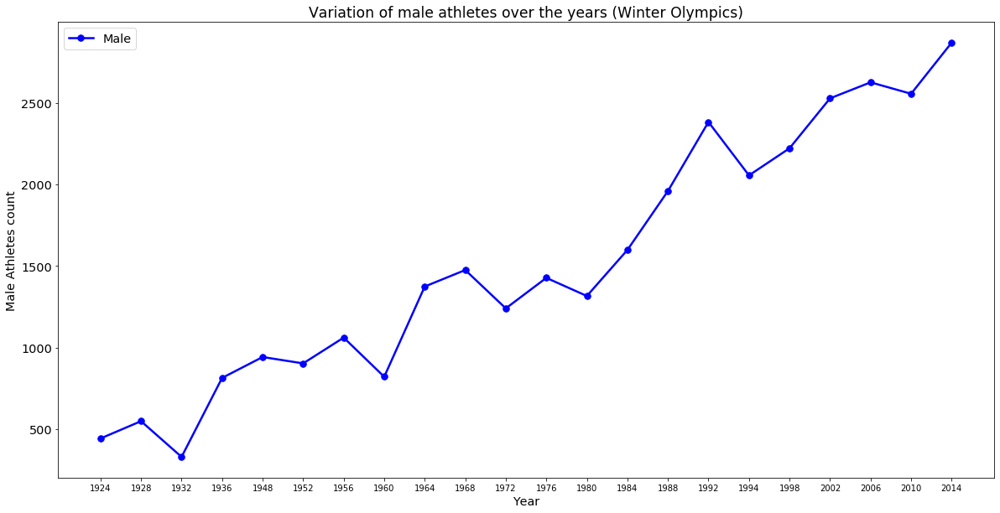

In [45]:
#Variation of male athletes over the years (Winter Olympics)
temp = sqldf('SELECT Year, count(Sex) As male_Count FROM merged Where Sex="M" And Season="Winter" Group By Year order by Year')

# data pre-processing
xbar = temp['Year'].tolist()
bars1 = temp['male_Count'].tolist()
xbar = [str(x) for x in xbar]

# plotting the graph
plt.plot(xbar, bars1, marker='o',markersize = 7.5, color='blue', linewidth = 2.5,label = 'Male')

plt.xlabel('Year')
plt.ylabel('Male Athletes count')
plt.title("Variation of male athletes over the years (Winter Olympics)")

plt.legend()
plt.show()

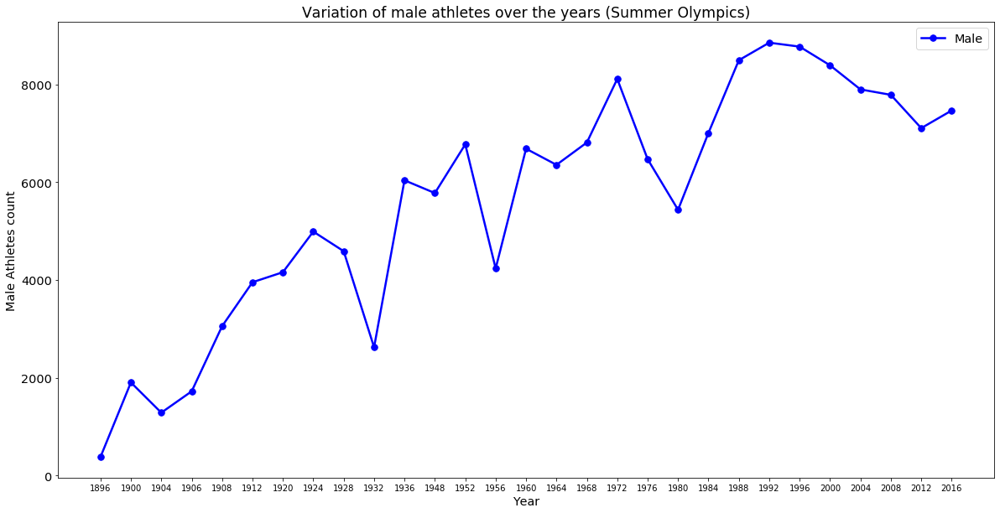

In [46]:
#Variation of male athletes over the years (Winter Olympics)
temp = sqldf('SELECT Year, count(Sex) As male_Count FROM merged Where Sex="M" And Season="Summer" Group By Year order by Year')

# data pre-processing
xbar = temp['Year'].tolist()
bars1 = temp['male_Count'].tolist()
xbar = [str(x) for x in xbar]

# plotting the graph
plt.plot(xbar, bars1, marker='o',markersize = 7.5, color='blue', linewidth = 2.5,label = 'Male')

plt.xlabel('Year')
plt.ylabel('Male Athletes count')
plt.title("Variation of male athletes over the years (Summer Olympics)")

plt.legend()
plt.show()

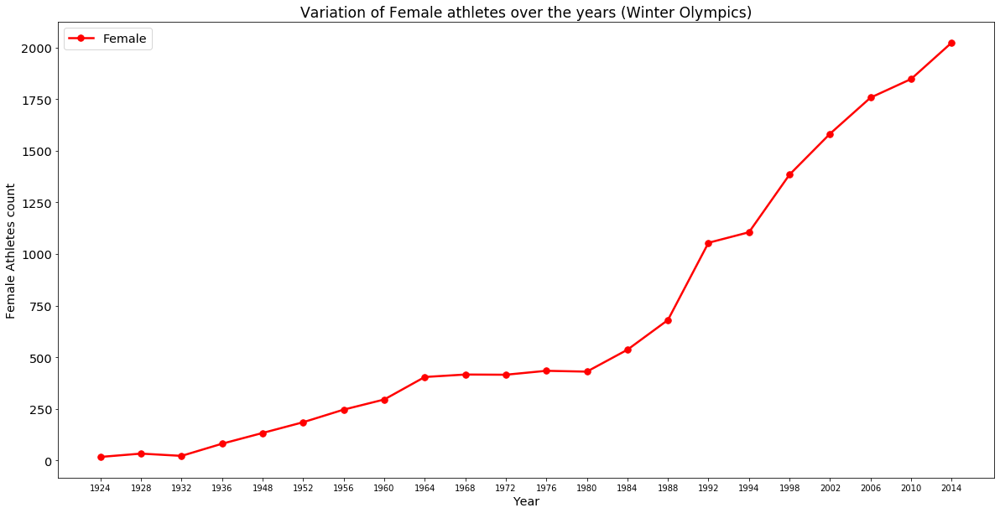

In [47]:
#Variation of female athletes over the years (Winter Olympics)
temp = sqldf('SELECT Year, count(Sex) As male_Count FROM merged Where Sex="F" And Season="Winter" Group By Year order by Year')

# data pre-processing
xbar = temp['Year'].tolist()
bars1 = temp['male_Count'].tolist()
xbar = [str(x) for x in xbar]

# plotting the graph
plt.plot(xbar, bars1, marker='o',markersize = 7.5, color='red', linewidth = 2.5,label = 'Female')

plt.xlabel('Year')
plt.ylabel('Female Athletes count')
plt.title("Variation of Female athletes over the years (Winter Olympics)")

plt.legend()
plt.show()

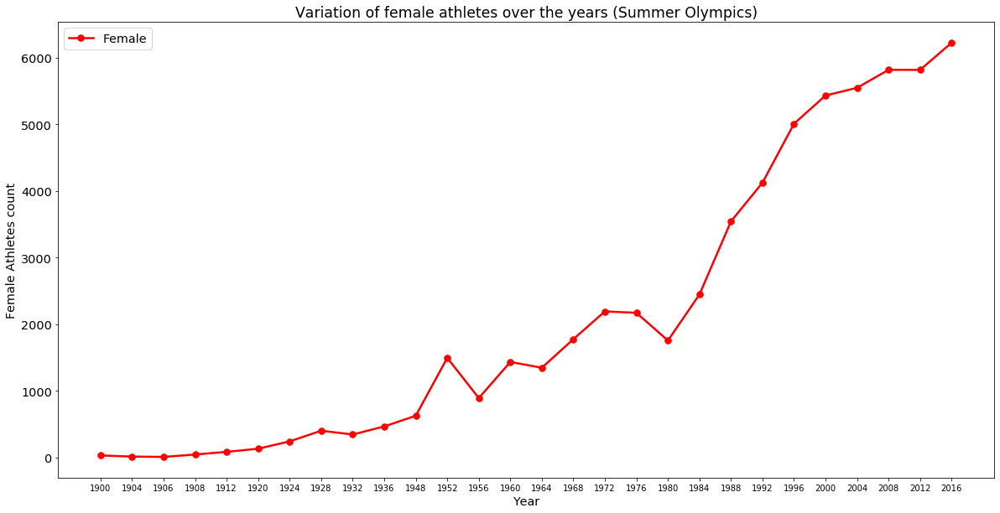

In [48]:
#Variation of female athletes over the years (Winter Olympics)
temp = sqldf('SELECT Year, count(Sex) As male_Count FROM merged Where Sex="F" And Season="Summer" Group By Year order by Year')

# data pre-processing
xbar = temp['Year'].tolist()
bars1 = temp['male_Count'].tolist()
xbar = [str(x) for x in xbar]

# plotting the graph
plt.plot(xbar, bars1, marker='o',markersize = 7.5, color='red', linewidth = 2.5,label = 'Female')

plt.xlabel('Year')
plt.ylabel('Female Athletes count')
plt.title("Variation of female athletes over the years (Summer Olympics)")

plt.legend()
plt.show()

In [49]:
#variation of countries partcipated throughout the years (Summrer Olympics)
temp = sqldf('SELECT Year, count(DISTINCT region) AS country_count FROM merged Where Season="Summer" Group By Year order by Year')

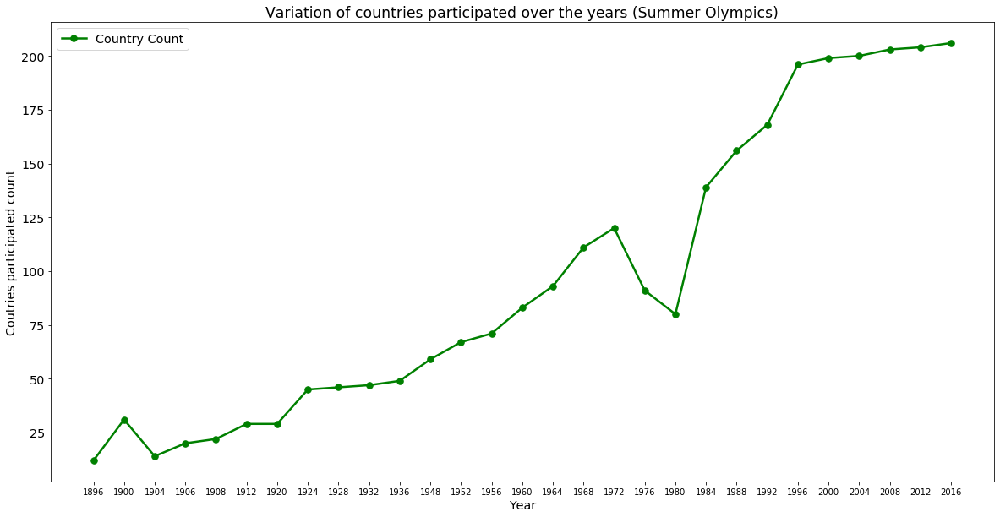

In [50]:
# data pre-processing
xbar = temp['Year'].tolist()
bars1 = temp['country_count'].tolist()
# bars2 = summa['Female_Count'].tolist()
xbar = [str(x) for x in xbar]

# plotting the graph
plt.plot(xbar, bars1, marker='o',markersize = 7.5, color='green', linewidth = 2.5,label = 'Country Count')
# plt.plot(xbar, bars2, marker='P', markersize = 7.5, color='red', linewidth = 2.5, label = 'Female')

plt.xlabel('Year')
plt.ylabel('Coutries participated count')
plt.title("Variation of countries participated over the years (Summer Olympics)")

plt.legend()
plt.show()

In [51]:
#variation of countries partcipated throughout the years (Winter Olympics)
temp = sqldf('SELECT Year, count(DISTINCT region) AS country_count FROM merged Where Season="Winter" Group By Year order by Year')

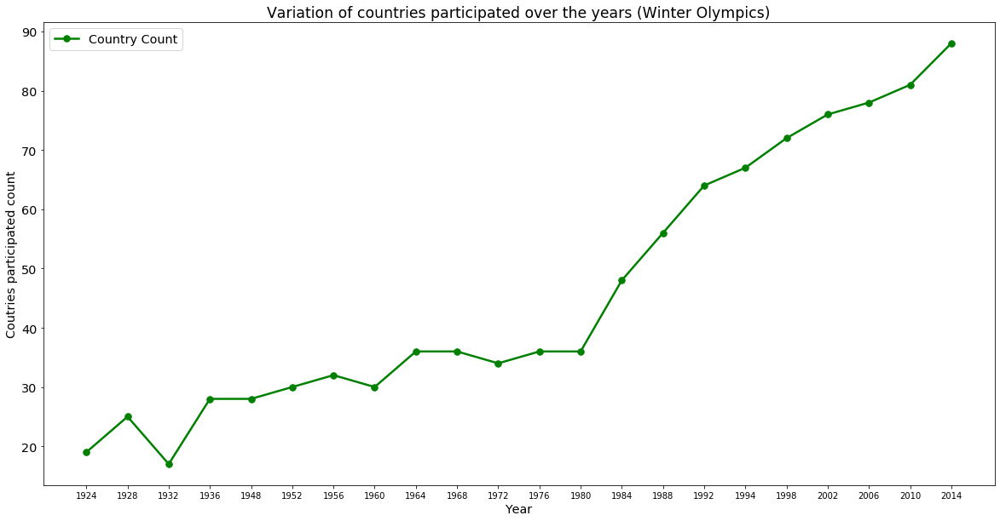

In [52]:
# data pre-processing
xbar = temp['Year'].tolist()
bars1 = temp['country_count'].tolist()
# bars2 = summa['Female_Count'].tolist()
xbar = [str(x) for x in xbar]

# plotting the graph
plt.plot(xbar, bars1, marker='o',markersize = 7.5, color='green', linewidth = 2.5,label = 'Country Count')
# plt.plot(xbar, bars2, marker='P', markersize = 7.5, color='red', linewidth = 2.5, label = 'Female')

plt.xlabel('Year')
plt.ylabel('Coutries participated count')
plt.title("Variation of countries participated over the years (Winter Olympics)")

plt.legend()
plt.show()

<a id='sec5.11'></a>
## K) Win/Loss Percent (Metric to assess player performance)

* This metric was chosen for the following reasons
  * Since not all the  players will have participated the same number of times in the olympics, instead of comparing players over the no of medals won it will be appropriate to compare them with some percent based metrics

* Hence this metric will highlight the player who have won almost most of the matches he/she played
* **Natalie Anne Coughlin (-Hall)** and **Paavo Johannes Nurmi** have won 12 out of 12 matches they played making them the most efficient players interms of this metric

In [53]:
win_p = sqldf('SELECT Name, Sport, count(Medal) As Won, count(ID) As Total FROM merged Group By Name')
win_p['Loss'] = win_p['Total'] - win_p['Won']
win_p['Percent'] = (win_p['Won'] / win_p['Total']) * 100 
win_p = win_p[['Name', 'Sport' ,'Won','Loss','Total','Percent']]

In [54]:
pd.set_option('display.max_rows', 500)
win_p = win_p.query('Won >=5 & Percent >= 50.0').sort_values(['Percent', 'Won'], ascending = False).round(2)
win_p.reset_index(inplace=True)
win_p = win_p.rename(columns={'index': 'Player_ID'})
win_p.iloc[:50, ]

,Player_ID,Name,Sport,Won,Loss,Total,Percent
0,91718,Natalie Anne Coughlin (-Hall),Swimming,12,0,12,100.0
1,97002,Paavo Johannes Nurmi,Athletics,12,0,12,100.0
2,38069,"Frederick Carlton ""Carl"" Lewis",Athletics,10,0,10,100.0
3,39424,"Gary Wayne Hall, Jr.",Swimming,10,0,10,100.0
4,52803,Isabelle Regina Werth,Equestrianism,10,0,10,100.0
5,104057,"Raymond Clarence ""Ray"" Ewry",Athletics,10,0,10,100.0
6,81753,Maria Valentina Vezzali,Fencing,9,0,9,100.0
7,133454,Zoltn Imre dn von Halmay,Swimming,9,0,9,100.0
8,28116,"Donald Arthur ""Don"" Schollander",Swimming,8,0,8,100.0
9,71491,"Kornelia Ender (-Matthes, -Grummt)",Swimming,8,0,8,100.0


### Fact : This metric shows that Natalie Anne Coughlin (-Hall) and Paavo Johannes Nurmi to be the best players because they won all of the 12 matches they ever played. This metric does not count the total medals won by the player and that's the reason why Michael Phelps was not there in the top list as he had lost 2 out of 30 matches he played

<a id='sec5.12'></a>
## L) players who have played different games

- Some people never fail to amaze us with their multifaceted talents
- I may not agree to some extent to the popular adage **IT IS BETTER TO BE A MASTER OF ONE RATHER THAN A JACK OF ALL TRADES**

* There are people who are in the top in multiple fields and some examples are
  * Elon Musk => He wons an AI company, a car company (Tesla), an aerospace maufacturing company (SpaceX), and he alos co-created Paypal (Iam a huge fan of Elon, see his versatality)
  * Winkelvoss Brothers (They came to my mind as I recently watched **Social Network** movie by **David Fincher**) played in Olympics, they are also billionaires, bitcoin investors and alumni of Harvard
* The same applies to the olympics where there were some ahtletes who are wee-versed in more than one sport and below is the list of such atletes

In [55]:
player_diff = sqldf('Select ID, count(DISTINCT Sport) as Sports_Played From merged Group By ID Order By count(DISTINCT Sport) DESC')

In [56]:
player_diff

,ID,Sports_Played
0,107613,4
1,54456,4
2,52387,4
3,32330,4
4,24534,4
...,...,...
135566,5,1
135567,4,1
135568,3,1
135569,2,1


In [57]:
#Finding the name of the different sports played by the athletes (only the top 25)
for i in player_diff.iloc[0:25, :1]['ID'].tolist():
    print(color.BOLD + str(merged[merged['ID'] == i]['Name'].unique().tolist()[0]) + color.END + ' played for ' + color.BOLD + str(merged[merged['ID'] == i]['Sport'].unique().tolist()) + color.END)

Carl Schuhmann played for ['Gymnastics', 'Weightlifting', 'Wrestling', 'Athletics']
Alexander Viggo Jensen played for ['Weightlifting', 'Gymnastics', 'Shooting', 'Athletics']
William Archibald "Bill" Irwin played for ['Alpine Skiing', 'Ski Jumping', 'Cross Country Skiing', 'Nordic Combined']
Launceston Elliot played for ['Athletics', 'Weightlifting', 'Wrestling', 'Gymnastics']
Bronisaw Czech played for ['Ski Jumping', 'Nordic Combined', 'Cross Country Skiing', 'Alpine Skiing']
Karl Johan Baadsvik played for ['Ski Jumping', 'Cross Country Skiing', 'Nordic Combined', 'Alpine Skiing']
Wilhelm "Willi" Zacharias played for ['Handball', 'Alpine Skiing', 'Cross Country Skiing']
Gordon L. "Gordy" Wren played for ['Ski Jumping', 'Cross Country Skiing', 'Nordic Combined']
Bruno Julius Wagner played for ['Tug-Of-War', 'Gymnastics', 'Athletics']
Vitale Venzi played for ['Ski Jumping', 'Cross Country Skiing', 'Nordic Combined']
Adrien Louis Albert Vandelle played for ['Military Ski Patrol', 'Cross 

<a id='sec6'></a>

# <center><span style="color:blue">***3) FINAL SUMMARY***</span><center>

- The male athletes showed no gradual increase in the count throughout the years but the female athtletes showed gradual increase
- There were some olympics hosted that were boycotted by some countries (reason is explained in the above sections)
- There was an olympic named Intercalated was held which was then shredded
- There were a team for Refugees called (Refugge Olympic Team) and an international team called (Individual Olympic Athletes)
- Players of age ranging from 10 to 97 have participated (quite astonishing)
- The top 10 countries with most medals still dominate the olympics
- Aeronautcs was played only once
- Some players have participated in more than one aport
- According to the metric some players have got 100% score which means (they have won all the games they ever appeared)
- Thus by the metric Natalie Anne Coughlin (-Hall) and Paavo Johannes Nurmi were the most successful (they won 12 out of 12 matches)
- There is a somewhat strong correlation betweent the number of players sent by a country to the olympics to the number of medals won and much more...

<a id='sec7'></a>

#  <center><span style="color:#ff4d4d;">**APPENDIX** </span></center>


##  <span style="color:black;">**Original Dataset Link:** </span>
- <span style="color:#0033cc;font-size: 18px;">https://www.kaggle.com/heesoo37/120-years-of-olympic-history-athletes-and-results</span>

##  <span style="color:black;">**Gabriel Preda's work using Plotly:** </span>
- <span style="color:#0033cc;font-size: 18px;">https://www.kaggle.com/gpreda/plotly-tutorial-120-years-of-olympic-games</span>


<hr style="border:2px solid gray"> </hr>

#  <center><span style="color:#ff1a1a;text-decoration:underline overline;">**Done By - Hrithik Vasanth** </span></center>
## <center>THANK YOU 😀</center>

<hr style="border:2px solid gray"> </hr>